# XYZ Sports Company - Customer Segmentation

## Project by:
* Alexandre Spagnol | 20230434 <br>
* Filipe Rodrigues | m20201866 <br>
* Hugo Alves | 20230438

<a class="anchor" id="index"></a>
# Index:
<div class="alert alert-block alert-info">

[1. Initial Setup](#1st-bullet)<br>
- [1.1. Library Import](#2nd-bullet)<br>
- [1.2. Dataset Import](#3rd-bullet)<br>
    
[2. DataExploration](#4th-bullet)<br>
- [2.1. General Information](#5th-bullet)<br>
- [2.2. Duplicates](#6th-bullet)<br>
- [2.3. Unique Values](#7th-bullet)<br>
- [2.4. Missing Values](#8th-bullet)<br>
- [2.5. Descriptive Statistics](#9th-bullet)<br>
- [2.6. Visual EDA](#10th-bullet)<br>
 
[3. Data Preprocessing](#11th-bullet)<br>
- [3.1. Removal of Duplicated Values](#12th-bullet)<br>
- [3.2. Missing Values](#13th-bullet)<br>
  - [3.2.1. Age](#14th-bullet)<br>
  - [3.2.2. Income](#15th-bullet)<br>
  - [3.2.3. AllowedWeeklyVisitsBySLA](#16th-bullet)<br>
  - [3.2.4. Has References](#17th-bullet)<br>
  - [3.2.5. Other columns and Final Nan's](#18th-bullet)<br>
- [3.3. Outlier Removal](#19th-bullet)<br>
  - [3.2.1. Manual Method](#20th-bullet)<br>
  - [3.2.2. IQR Method](#21st-bullet)<br>
  - [3.2.3. IsolationForest](#22nd-bullet)<br>
  - [3.2.4. Manual + IQR](#23rd-bullet)<br>
  - [3.2.5. Manual + IsolationForest](#24th-bullet)<br>

[4. Data Type Correction and Optimization](#25th-bullet)<br>

[5. Feature Engineering and Selection](#26th-bullet)<br>
- [5.1. Dates Coherence Checking](#27th-bullet)<br>
- [5.2. Feature Engineering](#28th-bullet)<br>
- [5.3. Feature Selection](#29th-bullet)<br>
  - [5.3.1. Pearson Correlation](#30th-bullet)
  - [5.3.2. Spearman's Rank Correlation](#31st-bullet)<br>
  - [5.3.3. PCA](#32nd-bullet)<br>
  - [5.3.4. Final Features to Keep](#33rd-bullet)<br>

[6. Scaling](#34th-bullet) <br>

[7. DBSCAN for Outlier Removal](#35th-bullet)<br>
    
[8. Clustering](#36th-bullet)<br>
- [8.1. Defining Perspectives](#37th-bullet)<br>
- [8.2. Activities View](#38th-bullet)<br>
  - [8.2.1. K-Modes](#39th-bullet)<br>
  - [8.2.2. K-Prototypes](#40th-bullet)<br>
- [8.3. Value View](#41st-bullet)<br>
  - [8.3.1. K-Means](#42nd-bullet)<br>
  - [8.3.2. Self-Organizing Maps](#43rd-bullet)<br>
  - [8.3.3. Self-Organizing Maps + K-Means](#44th-bullet)<br>
  - [8.3.4. Self-Organizing Maps + Hierarchical Clustering](#45th-bullet)<br>
  - [8.3.5. Mean-Shift Clustering](#46th-bullet)<br>
  - [8.3.6. DBSCAN](#47th-bullet)<br>
- [8.4. Value View](#48th-bullet)<br>
  - [8.4.1. K-Means](#49th-bullet)<br>
  - [8.4.2. Self-Organizing Maps](#50th-bullet)<br>
  - [8.4.3. Self-Organizing Maps + K-Means](#51st-bullet)<br>
  - [8.4.4. Self-Organizing Maps + Hierarchical Clustering](#52nd-bullet)<br>
  - [8.4.5. Mean-Shift Clustering](#53rd-bullet)<br>
  - [8.4.6. DBSCAN](#54th-bullet)<br>

[9. Merging Perspectives](#55th-bullet)<br>
- [9.1. Recap](#56th-bullet)<br>
- [9.2. Joining Perspectives](#57th-bullet)<br>
- [9.3. Cluster Analysis](#58th-bullet)<br>

[10. Reclassification of Outliers](#59th-bullet)<br>
- [10.1. Decision Tree](#60th-bullet)<br>
</div>

<div class="alert alert-block alert-success">

<a class="anchor" id="1st-bullet">    </a>
# 1. Initial Setup
    

    
</div>

<hr>
<a class="anchor" id="2nd-bullet">

## 1.1. Library Import
    
</a>

In [460]:
import os
import numpy as np
import pandas as pd
import datetime
import sompy
import graphviz
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import ListedColormap
from matplotlib.patches import RegularPolygon, Ellipse
from matplotlib.lines import Line2D
import seaborn as sns
from matplotlib import cm, colorbar
#!pip install ydata_profiling
from ydata_profiling import ProfileReport
from math import ceil
#!pip install kneed
from kneed import KneeLocator

from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder, StandardScaler, RobustScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, MeanShift, estimate_bandwidth
from sklearn.impute import KNNImputer
from sklearn.ensemble import IsolationForest
from scipy.cluster.hierarchy import dendrogram, linkage, set_link_color_palette
#!pip install kmodes 
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz

from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable

import warnings
warnings.filterwarnings("ignore")

# For better resolution plots
# %config InlineBackend.figure_format = 'retina'
#%matplotlib inline

# Setting seaborn style
sns.set_style("white")

<hr>
<a class="anchor" id="3rd-bullet">

## 1.2. Dataset Import
    
</a>

In [3]:
data = pd.read_csv('XYZ_sports_dataset.csv', 
    sep=";",
    parse_dates=['EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit'],
    index_col='ID'
)

<div class="alert alert-block alert-success">

<a class="anchor" id="4th-bullet">    </a>
# 2. Data Exploration
    

    
</div>

[Return to Index](#index)

<hr>
<a class="anchor" id="5th-bullet">

## 2.1. General Information
    
</a>

To better understand the data we are working with, we will benefit from exploring the raw data which was provided.   
Here, we will be able to find some descriptive statistics and check the coherence of our data set, as well as making some preliminary visualizations about our data.

In [4]:
data.shape

(14942, 30)

In [5]:
pd.set_option("display.max_columns", 40)

This function sets the maximum number of columns to display in a DataFrame.  
This is usefull for visualing all the we have or might have after feature engineering

In [6]:
data.head(10)

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0
10001,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1
10002,23,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,37.60,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1
10003,9,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
10004,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.20,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,41.0,0,7.0,60.97,0,3,0.0,0,1
10005,24,Female,2220.0,2015-12-01,2016-07-31,2016-01-01,2016-12-31,2016-07-28,3,140.00,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,0,7.0,59.01,26,0,0.0,0,1
10006,23,Male,2340.0,2015-10-06,2019-04-11,2019-01-01,2019-06-30,2019-03-26,16,143.50,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,0,7.0,30.03,3,3,0.0,0,1
10007,23,Male,1910.0,2015-03-25,2019-07-31,2019-01-01,2019-06-30,2019-04-23,99,233.90,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,0,7.0,60.97,11,5,0.0,0,1
10008,29,Male,3220.0,2016-04-08,2017-06-07,2017-01-01,2017-06-30,2017-03-30,69,212.60,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,6.0,0,7.0,60.97,0,2,0.0,0,1


In [7]:
data.tail(10)

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
24932,20,Female,1590.0,2018-02-27,2018-07-31,2018-01-01,2018-12-31,2018-06-15,46,92.40,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0,7.0,66.99,4,0,0.0,0,1
24933,18,Male,1540.0,2016-10-11,2016-11-11,2016-07-01,2016-12-31,2016-11-10,1,47.60,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0,7.0,30.03,2,0,0.0,0,1
24934,21,Male,2170.0,2018-04-04,2018-06-07,2018-01-01,2018-06-30,2018-04-04,64,50.40,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,7.0,60.97,0,0,0.0,0,1
24935,23,Female,1440.0,2016-11-02,2018-01-07,2017-07-01,2018-06-30,2017-10-23,76,248.00,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,89.0,0,7.0,60.97,0,1,0.0,0,1
24936,21,Female,1820.0,2016-11-11,2017-08-29,2017-01-01,2017-12-31,2017-06-14,76,124.50,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,12.0,0,7.0,60.97,1,2,0.0,0,1
24937,14,Male,0.0,2016-09-08,2016-09-08,2019-07-01,2019-12-31,2019-10-29,2,1460.45,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,112.0,96,4.0,34.84,8,3,0.0,0,0
24938,39,Male,NaN,2015-09-17,2016-06-04,2016-01-01,2016-06-30,2016-04-27,38,343.85,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,57.0,0,7.0,60.97,3,0,0.0,0,1
24939,20,Male,1810.0,2017-03-01,2017-03-31,2017-01-01,2017-06-30,2017-03-29,2,43.60,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0,7.0,30.03,8,0,0.0,0,1
24940,55,Male,4800.0,2018-03-01,2018-03-01,2019-07-01,2019-12-31,2019-10-28,3,788.60,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,185.0,155,3.0,15.87,7,2,0.0,0,0


Visualizing head and tails is good practice to understand the data and also to make sure that there are no useless headers of tails in our DataFrame.

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14942 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Age                         14942 non-null  int64         
 1   Gender                      14942 non-null  object        
 2   Income                      14447 non-null  float64       
 3   EnrollmentStart             14942 non-null  datetime64[ns]
 4   EnrollmentFinish            14942 non-null  datetime64[ns]
 5   LastPeriodStart             14942 non-null  datetime64[ns]
 6   LastPeriodFinish            14942 non-null  datetime64[ns]
 7   DateLastVisit               14942 non-null  datetime64[ns]
 8   DaysWithoutFrequency        14942 non-null  int64         
 9   LifetimeValue               14942 non-null  float64       
 10  UseByTime                   14942 non-null  int64         
 11  AthleticsActivities         14906 non-null  float64    

In [9]:
data.columns.tolist()

['Age',
 'Gender',
 'Income',
 'EnrollmentStart',
 'EnrollmentFinish',
 'LastPeriodStart',
 'LastPeriodFinish',
 'DateLastVisit',
 'DaysWithoutFrequency',
 'LifetimeValue',
 'UseByTime',
 'AthleticsActivities',
 'WaterActivities',
 'FitnessActivities',
 'DanceActivities',
 'TeamActivities',
 'RacketActivities',
 'CombatActivities',
 'NatureActivities',
 'SpecialActivities',
 'OtherActivities',
 'NumberOfFrequencies',
 'AttendedClasses',
 'AllowedWeeklyVisitsBySLA',
 'AllowedNumberOfVisitsBySLA',
 'RealNumberOfVisits',
 'NumberOfRenewals',
 'HasReferences',
 'NumberOfReferences',
 'Dropout']

<hr>
<a class="anchor" id="6th-bullet">

## 2.2. Duplicates
    
</a>

</div>

[Return to Index](#index)

In [10]:
print('Duplicates in Dataset:', data.duplicated().sum())

Duplicates in Dataset: 1


<hr>
<a class="anchor" id="7th-bullet">

## 2.3. Unique Values
    
</a>
</div>

[Return to Index](#index)

In [11]:
print('Unique values on the Dataset:')
print(data.nunique())

Unique values on the Dataset:
Age                             88
Gender                           2
Income                         737
EnrollmentStart               1490
EnrollmentFinish              1300
LastPeriodStart                 12
LastPeriodFinish                11
DateLastVisit                 1384
DaysWithoutFrequency           660
LifetimeValue                 5668
UseByTime                        2
AthleticsActivities              2
WaterActivities                  2
FitnessActivities                2
DanceActivities                  1
TeamActivities                   2
RacketActivities                 2
CombatActivities                 2
NatureActivities                 1
SpecialActivities                2
OtherActivities                  2
NumberOfFrequencies            415
AttendedClasses                230
AllowedWeeklyVisitsBySLA         7
AllowedNumberOfVisitsBySLA     270
RealNumberOfVisits              60
NumberOfRenewals                 7
HasReferences            

<hr>
<a class="anchor" id="8th-bullet">

## 2.4. Missing Values
    
</a>
</div>

[Return to Index](#index)

In [12]:
na_columns = data.columns[data.isna().any()].tolist()

missing_val=pd.DataFrame(data[na_columns].isna().sum(), columns=['Number_missing'])
missing_val['Percentage_missing']=np.round(100*missing_val['Number_missing']/len(data),2)

missing_val

,Number_missing,Percentage_missing
Income,495,3.31
AthleticsActivities,36,0.24
WaterActivities,37,0.25
FitnessActivities,35,0.23
DanceActivities,36,0.24
TeamActivities,35,0.23
RacketActivities,37,0.25
CombatActivities,33,0.22
NatureActivities,47,0.31
SpecialActivities,44,0.29


We can observe that the two columns with the most missing values are Income and AllowedWeeklyVisitsBySLA. The way we resolve this will be very important

All activities have missing values, but the portions are quite minimal, so a mode or median fill should be good enought, nevertheless we will try other methods.

Loaded backend module://matplotlib_inline.backend_inline version unknown.
Loaded backend module://matplotlib_inline.backend_inline version unknown.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='obliq

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', nam

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\RAGE.TTF', name='Rage Italic', style='italic', variant='norma

Text(0.5, 1.0, 'Heatmap of Missing Values')

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\Da

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', nam

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\RAGE.TTF', name='Rage Italic', style='italic', variant='norma

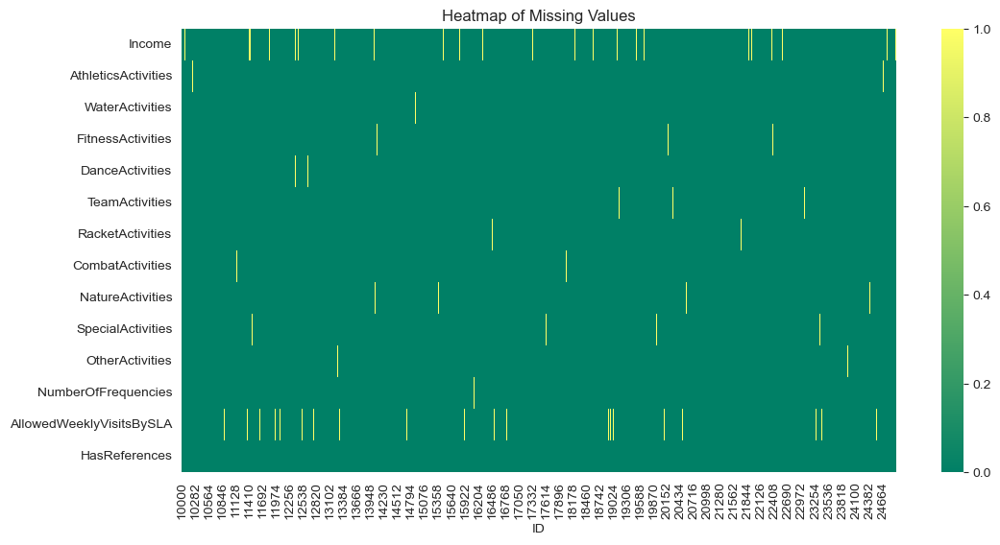

In [13]:
plt.figure(figsize = (12,6))
sns.heatmap(data[na_columns].isna().T, cmap = "summer")
plt.title("Heatmap of Missing Values")

After plotting missing values, we are able to understand that they are not constant and don't look dependent.

<hr>
<a class="anchor" id="9th-bullet">

## 2.5. Descriptive Statistics
    
</a>
</div>

[Return to Index](#index)

In [14]:
data.describe().T

,count,mean,min,25%,50%,75%,max,std
Age,14942.0,26.015794,0.0,19.0,23.0,31.0,87.0,14.156582
Income,14447.0,2230.816086,0.0,1470.0,1990.0,2790.0,10890.0,1566.527734
EnrollmentStart,14942,2016-11-10 07:44:13.620666624,2014-06-02 00:00:00,2015-08-01 00:00:00,2016-09-23 00:00:00,2018-03-06 00:00:00,2019-10-21 00:00:00,NaN
EnrollmentFinish,14942,2017-09-02 00:38:27.161022720,2014-06-02 00:00:00,2016-06-04 00:00:00,2017-08-29 00:00:00,2018-12-11 00:00:00,2019-10-31 00:00:00,NaN
LastPeriodStart,14942,2017-06-30 17:48:05.878731008,2014-01-01 00:00:00,2016-01-01 00:00:00,2018-01-01 00:00:00,2019-01-01 00:00:00,2019-07-01 00:00:00,NaN
LastPeriodFinish,14942,2018-03-06 15:23:26.558693632,2014-12-31 00:00:00,2016-12-31 00:00:00,2018-06-30 00:00:00,2019-06-30 00:00:00,2019-12-31 00:00:00,NaN
DateLastVisit,14942,2017-10-23 22:24:18.118056448,2014-07-03 00:00:00,2016-05-25 00:00:00,2018-01-18 00:00:00,2019-05-30 00:00:00,2019-10-31 00:00:00,NaN
DaysWithoutFrequency,14942.0,81.224936,0.0,13.0,41.0,83.75,1745.0,144.199576
LifetimeValue,14942.0,302.561871,0.0,83.6,166.2,355.075,6727.8,364.319566
UseByTime,14942.0,0.047116,0.0,0.0,0.0,0.0,1.0,0.211893


Notes:
* Age min = 0
* Income might have outliers
* DaysWithoutFrequency max is very big, looks like we will have some outliers
* NumberOfFrequencies max is very big, looks like we will have some outliers
* NatureActivities and DanceActivities have a value of 0 in every aspect, they might not have values.

In [15]:
print('There is a total of',len(data[data["Age"] < 18]),'people with under 18 years of age.')

There is a total of 2686 people with under 18 years of age.


In [16]:
print('There is a total of',
      len(data[(data["Age"] < 18) & (data["Income"] == 0)]),
      'people with under 18 years of age and an income of 0.')

There is a total of 2123 people with under 18 years of age and an income of 0.


In [17]:
print('There is a total of',len(data[data["Age"] < 10]),'people with under 18 years of age.')

There is a total of 1553 people with under 18 years of age.


In [18]:
data[data["Age"] < 18]["Age"].sort_values().value_counts()

Age
2     213
16    194
3     189
5     180
4     174
7     170
15    169
6     163
17    162
1     152
9     148
8     145
14    134
11    126
13    118
12    115
10    115
0      19
Name: count, dtype: int64

"Age" is showing some strange values. We will have to do go deeper into this column.

In [19]:
# Summary of our data
#ProfileReport(
#    data,
#    title = "XYZ Sports Company dataset",
#    correlations={
#        "pearson": {"calculate": True},
#        "spearman": {"calculate": False},
#        "kendall": {"calculate": False},
#        "phi_k": {"calculate": False},
#        "cramers": {"calculate": False},
#    },
#)

<hr>
<a class="anchor" id="10th-bullet">

## 2.6. Visual EDA
    
</a>
</div>

[Return to Index](#index)

In [20]:
data_no_date = data.select_dtypes(exclude = ["datetime64"])
# We also have to drop "gender", since, at least for now, it is an object variable
data_no_date.drop(columns = "Gender", inplace = True)

locator: <matplotlib.ticker.AutoLocator object at 0x000002366EC99090>


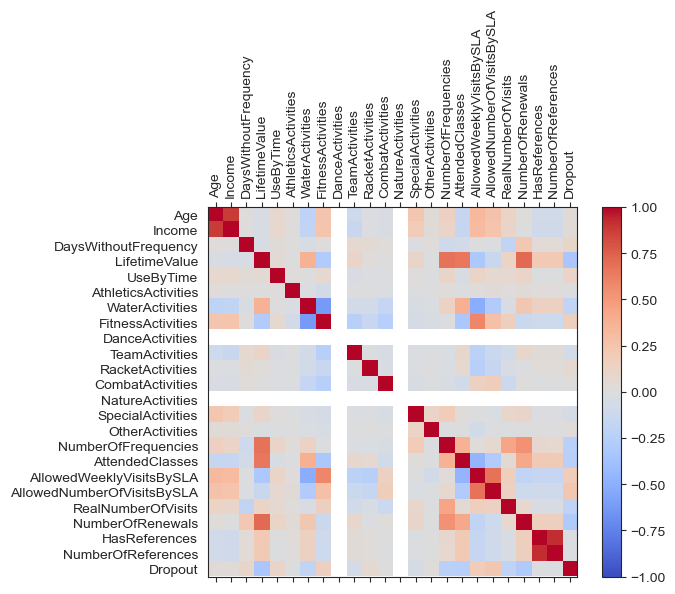

In [21]:
corr = data_no_date.corr()

fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(data_no_date.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(data_no_date.columns)
ax.set_yticklabels(data_no_date.columns)

plt.show()

In [22]:
metric_features = [
    'Age','Income','DaysWithoutFrequency','LifetimeValue','NumberOfFrequencies','AttendedClasses','AllowedWeeklyVisitsBySLA',
    'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences'
]
categorical_features = [
    'Gender', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'OtherActivities', 
    'SpecialActivities', 'NatureActivities', 'CombatActivities', 'RacketActivities', 'TeamActivities', 'DanceActivities',
    'HasReferences', 'Dropout'
]
date_features = [
    'EnrollmentStart', 'EnrollmentFinish', 'DateLastVisit',
    'BirthYear', 'YearOfEnrollment' 
]

In [23]:
# Calculate the correlation matrix
correlation_matrix = data_no_date.corr()

# Find pairs of variables with a correlation greater than 0.65
high_correlation_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.65:
            high_correlation_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))
# Display the pairs of variables with high correlation
for pair in high_correlation_pairs:
    correlation_value = correlation_matrix.loc[pair[0], pair[1]]
    print(f"High Correlation: {pair[0]} and {pair[1]} - Correlation: {correlation_value}")


High Correlation: Age and Income - Correlation: 0.8753525249372772
High Correlation: LifetimeValue and NumberOfFrequencies - Correlation: 0.6721199003970348
High Correlation: LifetimeValue and NumberOfRenewals - Correlation: 0.7053703737172982
High Correlation: AllowedWeeklyVisitsBySLA and AllowedNumberOfVisitsBySLA - Correlation: 0.6747496652773314
High Correlation: HasReferences and NumberOfReferences - Correlation: 0.9183479685634395


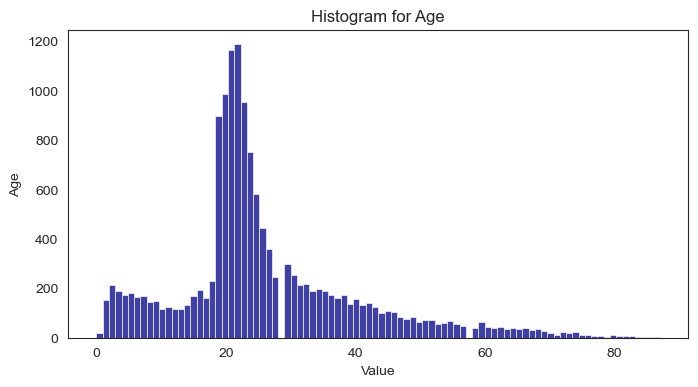

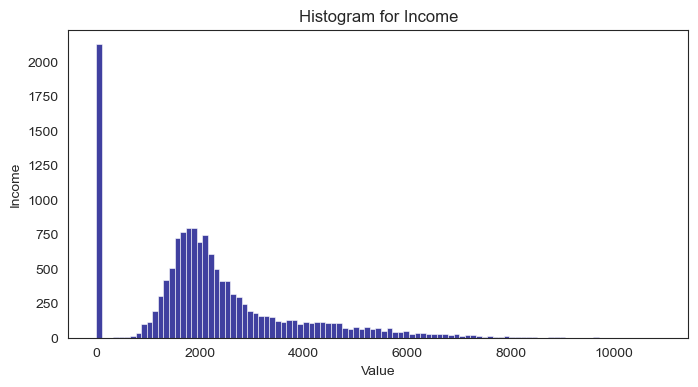

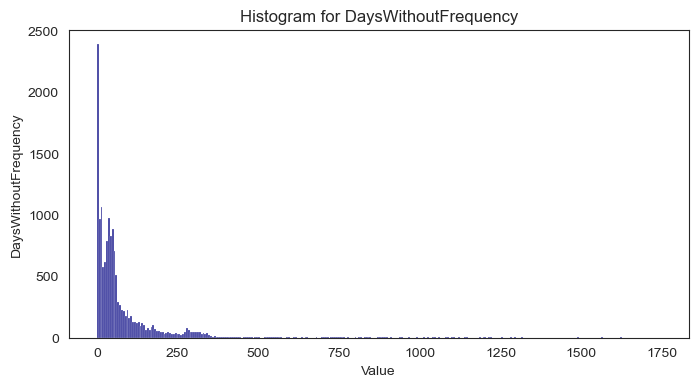

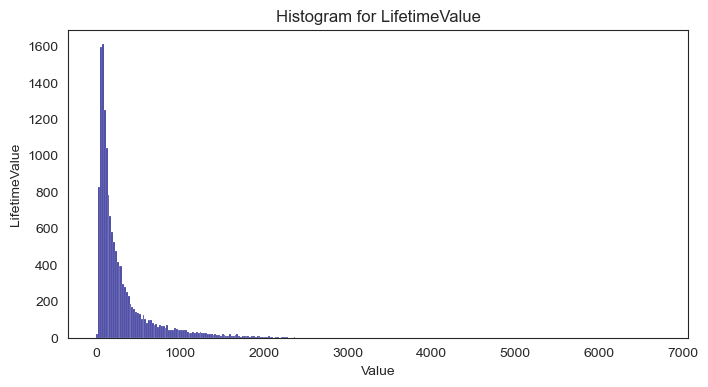

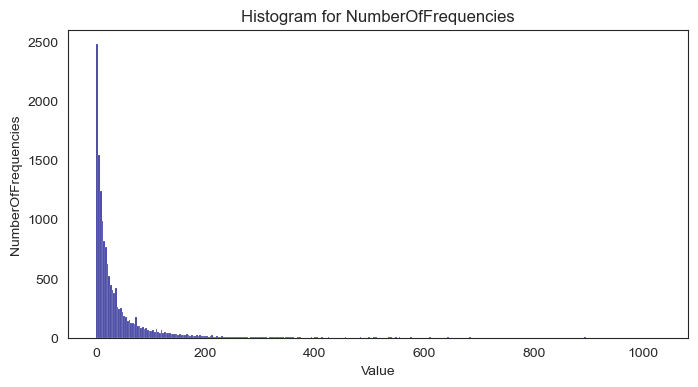

...

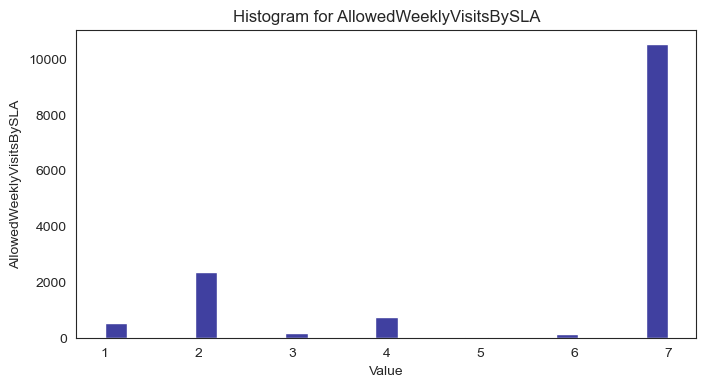

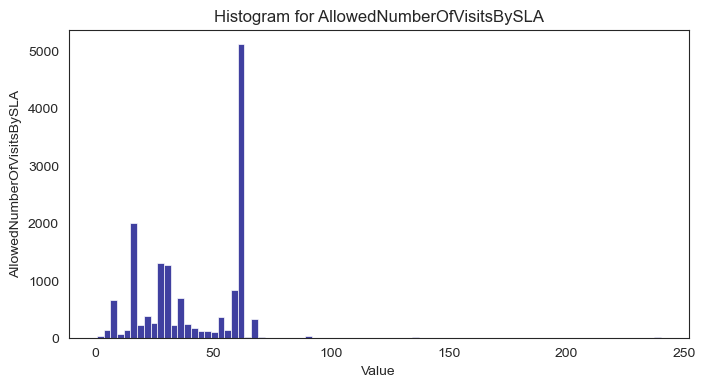

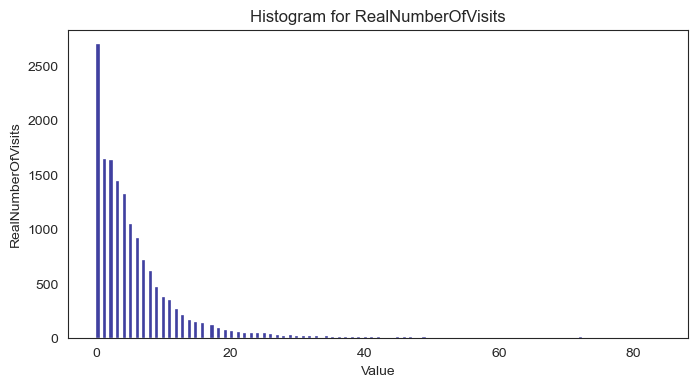

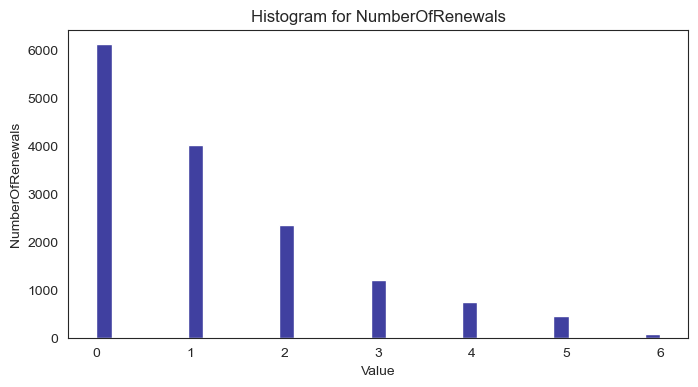

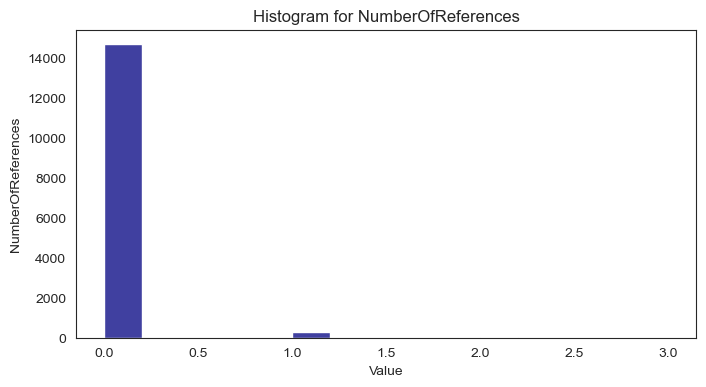

In [24]:
for variable in metric_features:
    plt.figure(figsize=(8, 4))
    sns.histplot(x=data[variable], color = "navy")
    plt.title(f'Histogram for {variable}')
    plt.xlabel('Value')
    plt.ylabel(variable)
    plt.show()

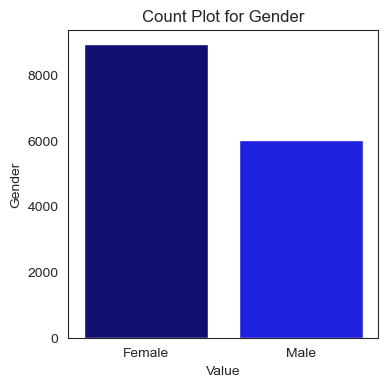

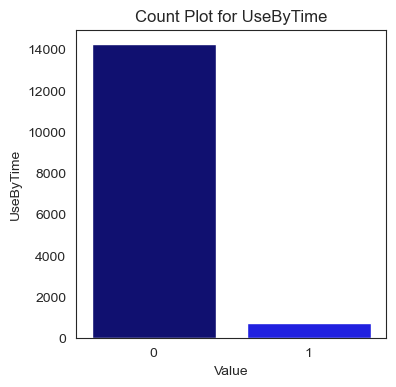

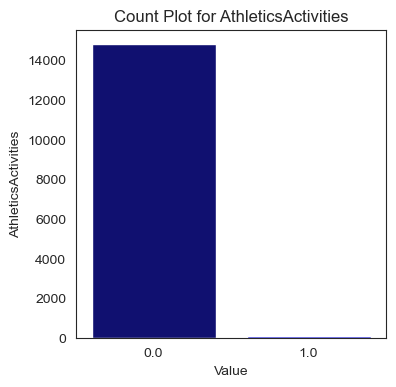

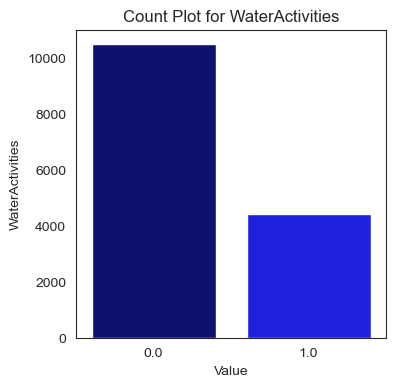

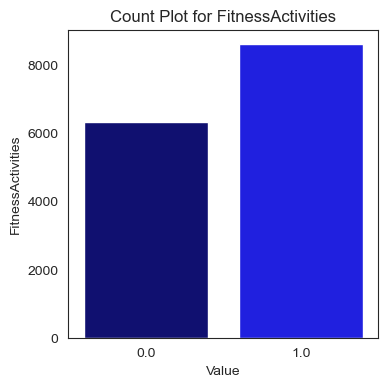

...

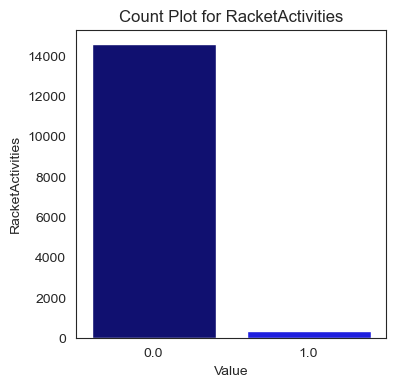

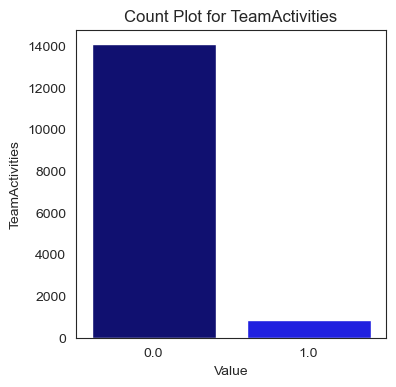

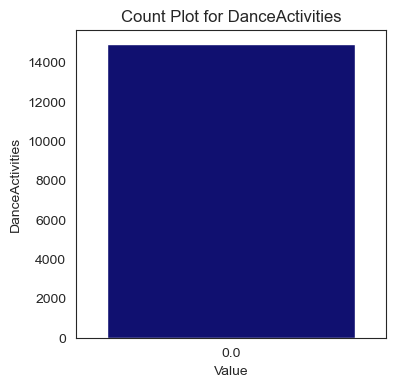

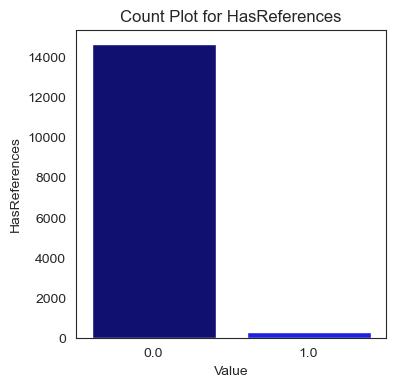

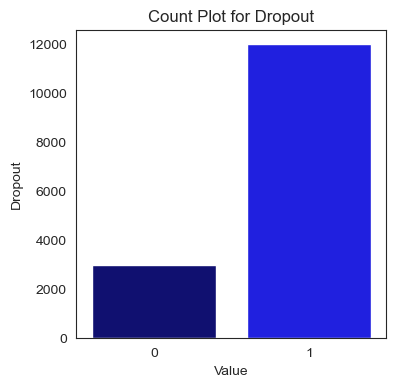

In [25]:
for variable in categorical_features:
    plt.figure(figsize=(4, 4))
    sns.countplot(x=data[variable], palette = ["navy", "blue"])
    plt.title(f'Count Plot for {variable}')
    plt.xlabel('Value')
    plt.ylabel(variable)
    plt.show()

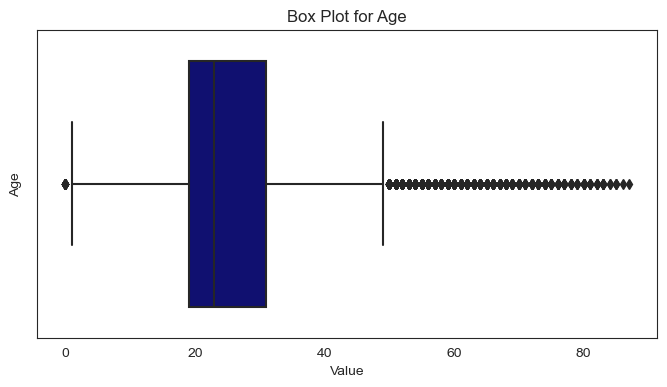

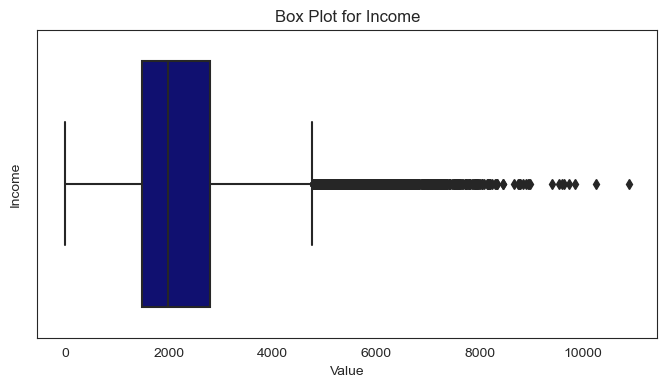

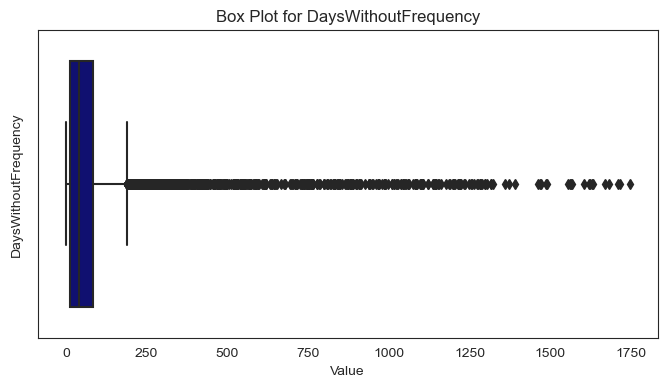

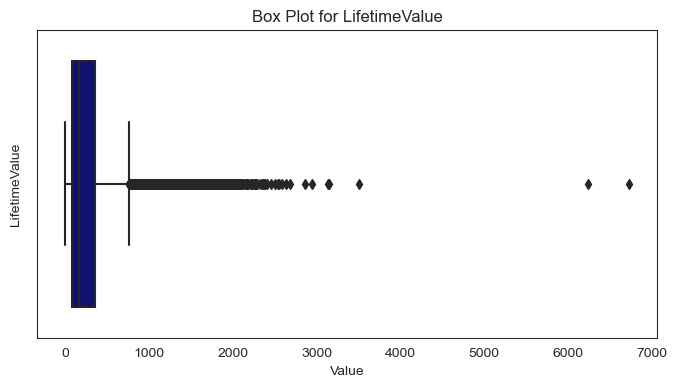

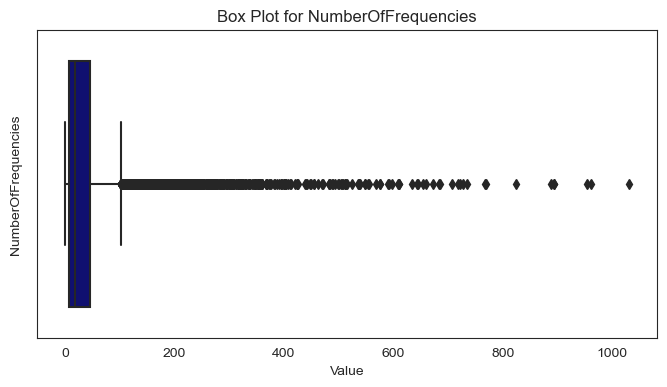

...

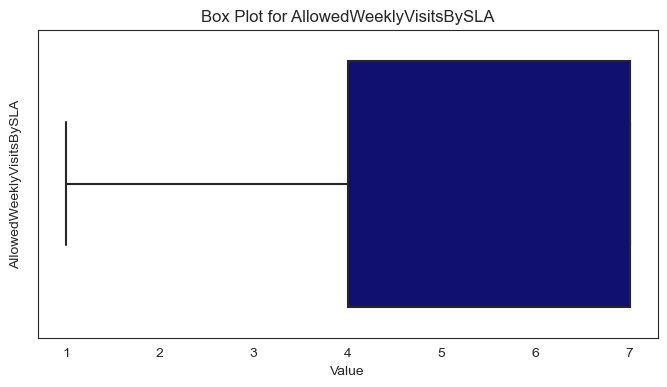

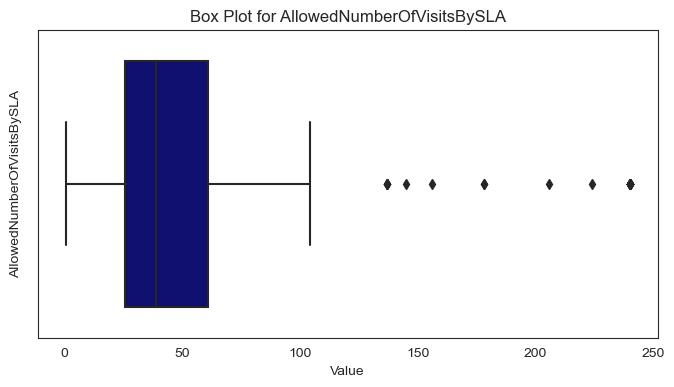

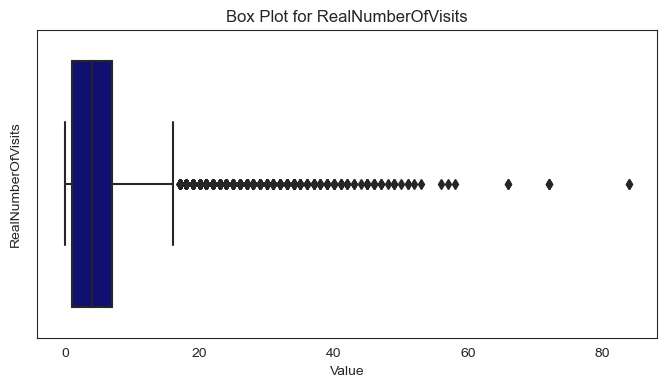

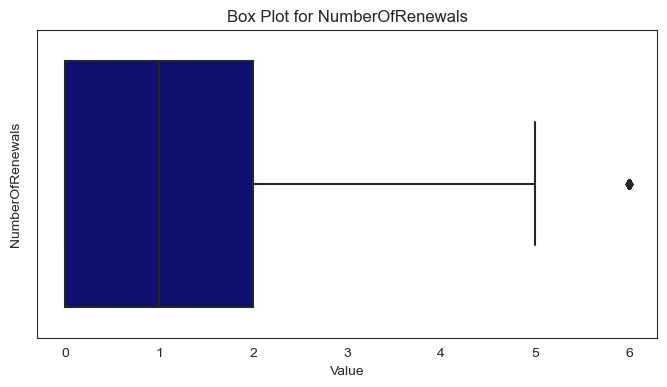

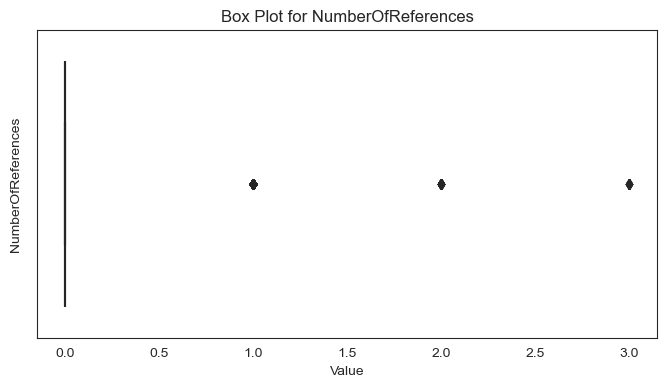

In [26]:
for variable in metric_features:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=data[variable], color = "navy")
    plt.title(f'Box Plot for {variable}')
    plt.xlabel('Value')
    plt.ylabel(variable)
    plt.show()

It would be interesting to know the day of the week in which each customer made is last visit.

Note: October 31st 2019 was a Thursday.

locator: <matplotlib.ticker.AutoLocator object at 0x0000023671E932D0>


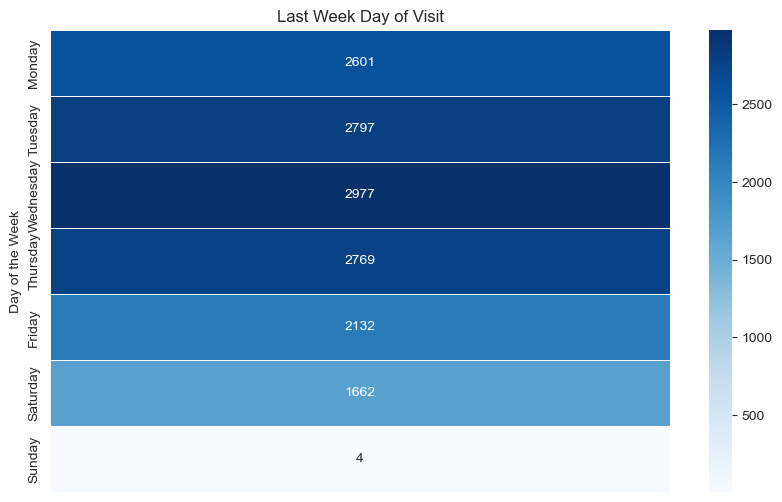

In [27]:
# Note: we used "Age" but we could have used any other column, since we are only interested in the count of values.
heatmap_lastvisit = data.pivot_table(values = "Age", index = data["DateLastVisit"].dt.day_name(), aggfunc = "count")

days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
heatmap_lastvisit = heatmap_lastvisit.reindex(days)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_lastvisit, annot = True, cmap = "Blues", fmt = "g", linewidths = 0.5).set_xticklabels([])
plt.title("Last Week Day of Visit")
plt.ylabel("Day of the Week")
plt.show()

It might also be interesting to see in what day of the week the customer started and finish its Enrollment. Here, it is important to note that there are some people whose "EnrollmentStart" matches "EnrollmentFinish". We will deal with this situation at a later stage, but for now we are only interested in getting to know our data.

In [28]:
print('There is a total of',
      len(data[data['EnrollmentStart']==data['EnrollmentFinish']]),
          'people that have an EnrollmentStart equal to EnrollmentFinish')

There is a total of 2422 people that have an EnrollmentStart equal to EnrollmentFinish


locator: <matplotlib.ticker.AutoLocator object at 0x0000023673C7D990>


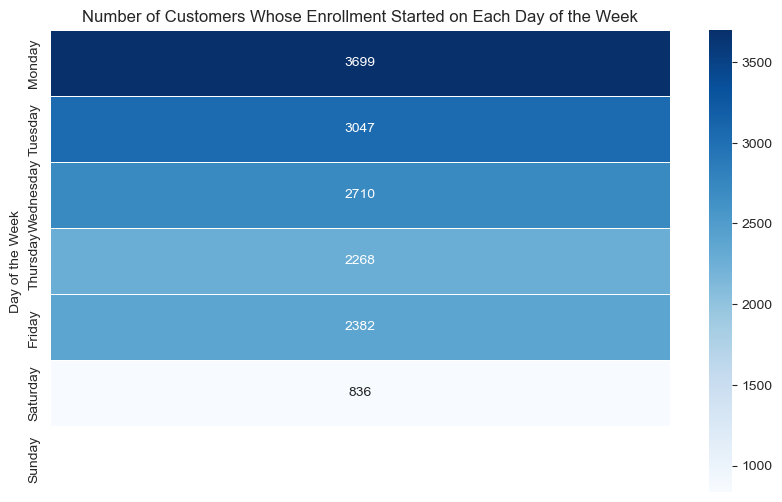

In [29]:
# Note: we used "Age" but we could have used any other column, since we are only interested in the count of values.
heatmap_enrollment_start = data.pivot_table(values = "Age", index = data["EnrollmentStart"].dt.day_name(), aggfunc = "count")
heatmap_enrollment_start = heatmap_enrollment_start.reindex(days)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_enrollment_start, annot = True, cmap = "Blues", fmt = "g", linewidths = 0.5).set_xticklabels([])
plt.title("Number of Customers Whose Enrollment Started on Each Day of the Week")
plt.ylabel("Day of the Week")
plt.show()

locator: <matplotlib.ticker.AutoLocator object at 0x0000023673C7E010>


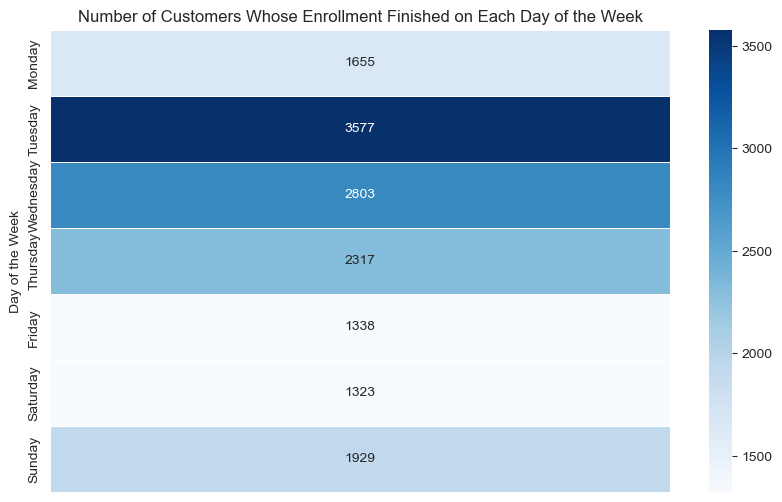

In [30]:
# Note: we used "Age" but we could have used any other column, since we are only interested in the count of values.
heatmap_enrollment_finish = data.pivot_table(values = "Age", index = data["EnrollmentFinish"].dt.day_name(), aggfunc = "count")
heatmap_enrollment_finish = heatmap_enrollment_finish.reindex(days)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_enrollment_finish, annot = True, cmap = "Blues", fmt = "g", linewidths = 0.5).set_xticklabels([])
plt.title("Number of Customers Whose Enrollment Finished on Each Day of the Week")
plt.ylabel("Day of the Week")
plt.show()

In addition, it can also be interesting to take a look at the relationship between some of the variables, mainly those that concern the caracterization of the customers.

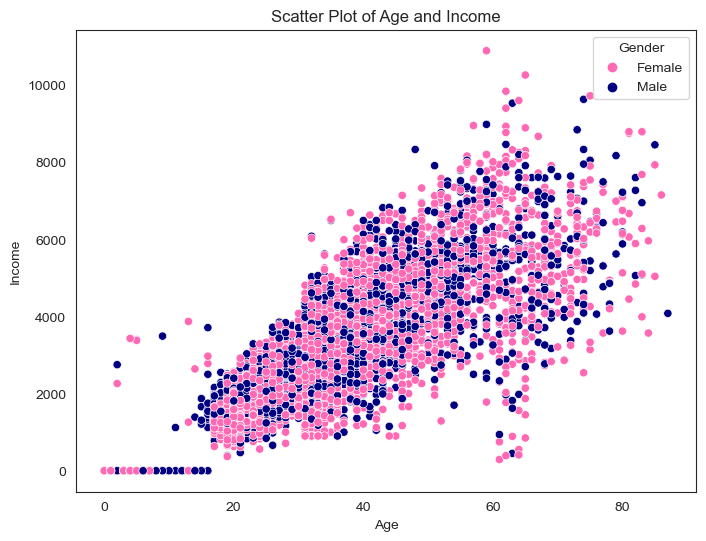

In [31]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data = data, x = "Age", y = "Income", hue = "Gender", palette = ["#FF69B4", "navy"], edgecolor = "white")
plt.title("Scatter Plot of Age and Income")
plt.xlabel("Age")
plt.ylabel("Income")
plt.show()

Now, we will explore the relationship between AllowedWeeklyVisitsBySLA and AllowedNumberOfVisitsBySLA, which, from a logical point of view, should be highly correlated. Aditionally, we will also see how AllowedWeeklyVisitsBySLA relates to "AttendedClasses".

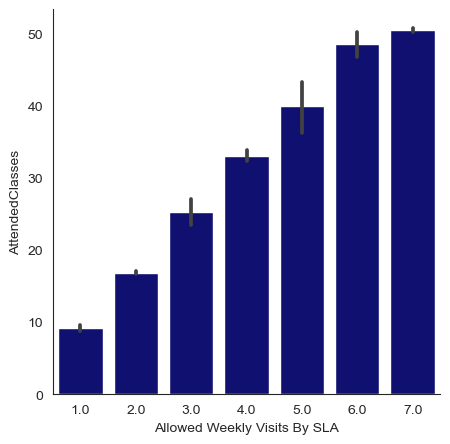

In [32]:
plt.figure(figsize = (5, 5))
sns.barplot(data = data, x = "AllowedWeeklyVisitsBySLA", y = "AllowedNumberOfVisitsBySLA", color = "navy", estimator = "mean")

plt.xlabel("Allowed Weekly Visits By SLA")
plt.ylabel("AttendedClasses")

# Remove graphic borders
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

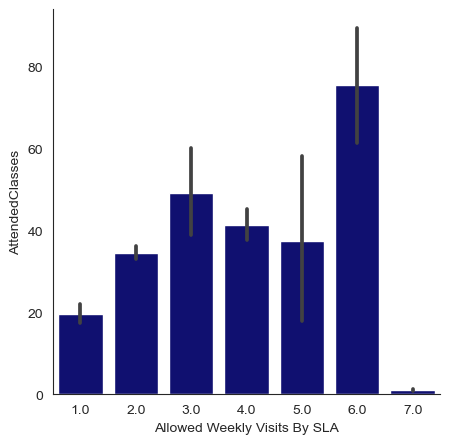

In [33]:
plt.figure(figsize = (5, 5))
sns.barplot(data = data, x = "AllowedWeeklyVisitsBySLA", y = "AttendedClasses", color = "navy", estimator = "mean")

plt.xlabel("Allowed Weekly Visits By SLA")
plt.ylabel("AttendedClasses")

# Remove graphic borders
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

Finally, we can elaborate a pairplot that will assess the correlation between our metric features.

In [34]:
#sns.pairplot(data = data, vars = metric_features, kind = "scatter", palette = "deep")
#plt.show()

<div class="alert alert-block alert-success">

<a class="anchor" id="11th-bullet">    </a>
# 3. Data Preprocessing
    

    
</div>

[Return to Index](#index)

<hr>
<a class="anchor" id="12th-bullet">

## 3.1. Removal of Duplicated Values
    
</a>
</div>

[Return to Index](#index)

In [35]:
print('Duplicates in Dataset:', data.duplicated().sum())

Duplicates in Dataset: 1


In [36]:
data.drop_duplicates(inplace=True)
print('Duplicates in Dataset:', data.duplicated().sum())

Duplicates in Dataset: 0


Duplicates have been dropped!

<hr>
<a class="anchor" id="13th-bullet">

## 3.2. Missing Values
    
</a>
</div>

[Return to Index](#index)

<hr>
<a class="anchor" id="14th-bullet">

### 3.2.1. Age
      
</a>
</div>

[Return to Index](#index)

Let's take a closer look at age, since we previously identified the need to pay attention to some values that didn't make sense.

In [37]:
print('There is a total of',
      len(data[(data["Age"] >= 18) & (data["Income"] == 0)]),
      'people with over 18 years of age and an income of 0')

There is a total of 0 people with over 18 years of age and an income of 0


It's safe to say that this makes sense!

Now, let's start by adding 2 columns to this dataframe.  

One will show the "BirthYear" for each observation, and the other the "YearOfEnrollment".
(In order to determine the "BirthYear", we will consider that the age in the records was the age in 2019, the year where the data stopped being collected, if "Dropout" = 0. Otherwise, we will subtract the "Age" to the year in the "EnrollmentFinish" column).

In [38]:
data["BirthYear"] = np.where(data["Dropout"] == 0, 2019 - data["Age"], data["EnrollmentFinish"].dt.year - data["Age"])
data["YearOfEnrollment"] = data["EnrollmentStart"].dt.year

In [39]:
data[data["BirthYear"] > data["YearOfEnrollment"]]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,BirthYear,YearOfEnrollment
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10649,1,Male,0.0,2014-09-03,2014-09-03,2018-07-01,2018-12-31,2019-10-31,0,1968.47,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,180.0,191,2.0,4.86,2,5,0.0,0,0,2018,2014
17858,1,Female,0.0,2014-08-04,2014-08-04,2019-07-01,2019-12-31,2019-10-19,12,1886.80,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,104.0,82,2.0,17.42,4,6,0.0,0,0,2018,2014
19751,1,Female,0.0,2014-09-29,2014-09-29,2019-07-01,2019-12-31,2019-10-18,13,2054.60,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,85.0,80,2.0,17.42,2,5,1.0,1,0,2018,2014
23415,1,Female,0.0,2014-10-07,2014-10-07,2019-07-01,2019-12-31,2019-10-18,13,2220.60,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,114.0,104,2.0,17.42,2,5,0.0,0,0,2018,2014


In [40]:
data.loc[data["BirthYear"] > data["YearOfEnrollment"], "Age"] = np.nan
print('There is a total of',sum(data["Age"].isna()),'people who were born before their enrollment.')

There is a total of 4 people who were born before their enrollment.


As we can see, there are 4 observations where the customer enrolled before it was born, which is unrealistic.

In [41]:
print('There is a total of',
      len(data[(data["Age"].isna())]),
      'people with missing value for age.')

There is a total of 4 people with missing value for age.


In [42]:
median_age_min = data[data["Age"] < 18]["Age"].median()
data["Age"].fillna(median_age_min, inplace = True)

In [43]:
sum(data["Age"].isna())
print('There is a total of',sum(data["Age"].isna()),'missing values regarding age.')

There is a total of 0 missing values regarding age.


Now we face another situation!  
We can, in Portugal, start working from 16 year of age, with a few limitations, but this means we are qualified to getting an income since 16. So we will assume, that people under 16 cant have incomes, and people above 16 can have income. Going in more details, people between 16 and 18 can have incomes, while people above 18 must have incomes.

In [44]:
print('There is a total of',
      len(data[(data["Age"] < 16) & (data["Income"] > 0)]),
      'people that are under 16 year of age and have income.'
     )

There is a total of 20 people that are under 16 year of age and have income.


There are customers younger than 16 who have values for "Income", which is unexpected. In these situations, we will assume that the income associated to them comes from they parental figures, and convert to 0

In [45]:
print('There is a total of',
      len(data[(data["Age"] == 0) & (data["Income"] == 0)|(data["Age"] == 0) & data["Income"].isnull()]),
      'people with and age of 0 years and either an income of 0 or a missing value.'
     )

There is a total of 19 people with and age of 0 years and either an income of 0 or a missing value.


In [46]:
print('There is a total of',len(data[data['Age']==0]),'people with an age of 0 years of age')

There is a total of 19 people with an age of 0 years of age


We think it's safe to say that these might be people who didn't want to disclose their income and/or their age, since having an age of 0 doesn't make sense.

So, in our opinion, we should replace all values of 0 with Nan in age so that we are able to fill them in later.


In [47]:
data['Age'].replace(0, np.nan, inplace=True)

In [48]:
print('There is a total of',len(data[data['Age']==0]),'people with an age of 0 years of age')

There is a total of 0 people with an age of 0 years of age


<hr>
<a class="anchor" id="15th-bullet">

### 3.2.2. Income
    
</a>
</div>

[Return to Index](#index)

In [49]:
print('There is a total of',
      len(data[(data['Income'] > 0) & (data['Age'] < 16)]),
      'people with an income bigger than 0 and under 16 years of age')

There is a total of 20 people with an income bigger than 0 and under 16 years of age


In [50]:
print('There is a total of', 
      len(data[(data['Income'].isna()) & (data['Age'] < 16)]),
      'people with an income missing and under 16 years of age')

There is a total of 337 people with an income missing and under 16 years of age


Following our assumption, they will all have an income of 0, since they aren´t allowed to work, and this might be their parents income.

In [51]:
print('There is a total of',
      len(data[(data['Income'] == 0) &(data['Age']>16)]),
      'people with an income of 0 and over 16 years of age')

There is a total of 0 people with an income of 0 and over 16 years of age


In [52]:
data['Income'] = data.apply(lambda row: 0 if np.isnan(row['Income']) and row['Age'] < 16 else row['Income'], axis=1)

Here we filled every value in 'Income' that had a missing value with 0, if they were bellow 16 year of age.

In [53]:
print('Dataset missing values:')
print(data.isna().sum())

Dataset missing values:
Age                            19
Gender                          0
Income                        158
EnrollmentStart                 0
EnrollmentFinish                0
LastPeriodStart                 0
LastPeriodFinish                0
DateLastVisit                   0
DaysWithoutFrequency            0
LifetimeValue                   0
UseByTime                       0
AthleticsActivities            36
WaterActivities                37
FitnessActivities              35
DanceActivities                36
TeamActivities                 35
RacketActivities               37
CombatActivities               33
NatureActivities               47
SpecialActivities              44
OtherActivities                35
NumberOfFrequencies            26
AttendedClasses                 0
AllowedWeeklyVisitsBySLA      535
AllowedNumberOfVisitsBySLA      0
RealNumberOfVisits              0
NumberOfRenewals                0
HasReferences                  12
NumberOfReferences      

We are only left with 158 values to fill for income, and we got 12 new missing values to fill for age, linked to the assumption that age can't be equal to 0. 

We will use KNN to fill these values!

<hr>
<a class="anchor" id="16th-bullet">

### 3.2.3. AllowedWeeklyVisitsBySLA
    
</a>
</div>

[Return to Index](#index)

In [54]:
data[['AllowedWeeklyVisitsBySLA','AllowedNumberOfVisitsBySLA']]

,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA
ID,,
10000,NaN,6.28
10001,2.0,17.42
10002,7.0,30.03
10003,2.0,17.72
10004,7.0,60.97
...,...,...
24937,4.0,34.84
24938,7.0,60.97
24939,7.0,30.03


In [55]:
data_SLA = data.copy()

'AllowedNumberOfVisitsBySLA' is the total number os visit that an individual can make, based on the SLA contract. So it should be safe to assume, that contracts are relativelly standard. We might be able to use this to our advantage.

In [56]:
data['AllowedWeeklyVisitsBySLA'] = data.groupby('AllowedNumberOfVisitsBySLA')['AllowedWeeklyVisitsBySLA'].transform(lambda x: x.fillna(x.mean()))

In [57]:
missing_values_SLA = data_SLA['AllowedWeeklyVisitsBySLA'].isna()

print(data_SLA['AllowedWeeklyVisitsBySLA'][missing_values_SLA])

ID
10000   NaN
10019   NaN
10034   NaN
10107   NaN
10109   NaN
         ..
24820   NaN
24860   NaN
24863   NaN
24898   NaN
24904   NaN
Name: AllowedWeeklyVisitsBySLA, Length: 535, dtype: float64


These values are the ones that cant be grouped, they are unique, so we also will fill then with KNN!

<hr>
<a class="anchor" id="17th-bullet">

### 3.2.4. Has References
    
</a>
</div>

[Return to Index](#index)

In [58]:
print('There is a total of',
      len(data[data['HasReferences'].isna()]),
      'people with no value for having references')

There is a total of 12 people with no value for having references


In [59]:
print('There is a total of',
      len(data[data['HasReferences'].isna() & (data['NumberOfReferences'] > 0)]),
      'people with no value for having references but value for number of references.')

There is a total of 12 people with no value for having references but value for number of references.


In [60]:
data[data["HasReferences"].isna()]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,BirthYear,YearOfEnrollment
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
11260,14.0,Female,0.0,2014-09-30,2019-10-13,2019-07-01,2019-12-31,2019-07-26,79,1924.50,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,221.0,233,2.0,17.42,0,5,NaN,1,1,2005,2014
11427,42.0,Male,4660.0,2014-10-06,2016-02-24,2015-01-01,2015-12-31,2015-06-26,243,306.20,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,4,2.0,17.42,3,1,NaN,1,1,1974,2014
13032,9.0,Male,0.0,2014-09-22,2019-10-13,2019-07-01,2019-12-31,2019-03-20,207,1524.15,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49.0,39,2.0,17.42,0,5,NaN,1,1,2010,2014
14532,4.0,Male,0.0,2014-09-20,2015-09-16,2015-01-01,2015-06-30,2014-11-29,291,209.72,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5,1.0,8.43,0,1,NaN,1,1,2011,2014
14582,17.0,Female,1390.0,2014-10-06,2016-02-04,2015-07-01,2016-06-30,2015-12-16,50,373.80,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,77.0,0,7.0,62.02,4,1,NaN,1,1,1999,2014
18306,2.0,Female,0.0,2014-09-04,2015-09-14,2015-01-01,2015-12-31,2015-05-09,128,447.70,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,10,1.0,8.71,0,1,NaN,1,1,2013,2014
18667,2.0,Female,0.0,2015-09-11,2016-10-10,2016-07-01,2016-12-31,2016-06-04,128,432.20,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,24,2.0,7.14,0,1,NaN,1,1,2014,2015
20374,12.0,Male,0.0,2014-10-07,2015-09-16,2015-01-01,2015-12-31,2015-07-30,48,366.20,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,78.0,46,2.0,17.42,20,1,NaN,1,1,2003,2014
20409,39.0,Female,1870.0,2015-03-28,2018-01-01,2017-07-01,2018-06-30,2017-11-09,53,844.40,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,65.0,41,1.0,8.57,1,4,NaN,2,1,1979,2015


Perfect, every missing value in 'HasReferences' has a value in 'NumberOfReferences' bigger than 0, so all of those missing values are 1's.

In [61]:
data['HasReferences'].fillna(1, inplace=True)

<hr>
<a class="anchor" id="18th-bullet">

### 3.2.5. Other columns and Final Nan's
    
</a>
</div>

[Return to Index](#index)

In [62]:
data

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,BirthYear,YearOfEnrollment
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10000,60.0,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,7,2.0,6.28,2,0,0.0,0,0,1959,2019
10001,29.0,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.20,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1,1986,2014
10002,23.0,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,37.60,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1,1994,2017
10003,9.0,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1,2010,2018
10004,35.0,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.20,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,41.0,0,7.0,60.97,0,3,0.0,0,1,1983,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,14.0,Male,0.0,2016-09-08,2016-09-08,2019-07-01,2019-12-31,2019-10-29,2,1460.45,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,112.0,96,4.0,34.84,8,3,0.0,0,0,2005,2016
24938,39.0,Male,NaN,2015-09-17,2016-06-04,2016-01-01,2016-06-30,2016-04-27,38,343.85,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,57.0,0,7.0,60.97,3,0,0.0,0,1,1977,2015
24939,20.0,Male,1810.0,2017-03-01,2017-03-31,2017-01-01,2017-06-30,2017-03-29,2,43.60,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0,7.0,30.03,8,0,0.0,0,1,1997,2017


In [63]:
print('Dataset missing values:')
print(data.isna().sum())

Dataset missing values:
Age                            19
Gender                          0
Income                        158
EnrollmentStart                 0
EnrollmentFinish                0
LastPeriodStart                 0
LastPeriodFinish                0
DateLastVisit                   0
DaysWithoutFrequency            0
LifetimeValue                   0
UseByTime                       0
AthleticsActivities            36
WaterActivities                37
FitnessActivities              35
DanceActivities                36
TeamActivities                 35
RacketActivities               37
CombatActivities               33
NatureActivities               47
SpecialActivities              44
OtherActivities                35
NumberOfFrequencies            26
AttendedClasses                 0
AllowedWeeklyVisitsBySLA        9
AllowedNumberOfVisitsBySLA      0
RealNumberOfVisits              0
NumberOfRenewals                0
HasReferences                   0
NumberOfReferences      

For the categorical features, we decided to just use the mode, even though its a relatively simple method, it should be perfect for this dataset, since these missing values are quite minimal (bellow 0,3% of the total data).

In [64]:
for column in categorical_features:
    data[column].fillna(data[column].mode()[0], inplace=True)

In [65]:
print('Dataset missing values:')
print(data.isna().sum())

Dataset missing values:
Age                            19
Gender                          0
Income                        158
EnrollmentStart                 0
EnrollmentFinish                0
LastPeriodStart                 0
LastPeriodFinish                0
DateLastVisit                   0
DaysWithoutFrequency            0
LifetimeValue                   0
UseByTime                       0
AthleticsActivities             0
WaterActivities                 0
FitnessActivities               0
DanceActivities                 0
TeamActivities                  0
RacketActivities                0
CombatActivities                0
NatureActivities                0
SpecialActivities               0
OtherActivities                 0
NumberOfFrequencies            26
AttendedClasses                 0
AllowedWeeklyVisitsBySLA        9
AllowedNumberOfVisitsBySLA      0
RealNumberOfVisits              0
NumberOfRenewals                0
HasReferences                   0
NumberOfReferences      

### Scaling

Now, let's deal with the metric features. <br>
For this task of imputing the missing values, we will be trying two different approaches: MinMaxScaler and RobustScaler. We didn't try StandardScaler because it has the same problems as MinMaxScaler, adding to the fact that it relies on the presence of a Gaussian Distribution, which, as we were able to see in the histograms, is not necessarily true for most features in our dataset.

The first of these methods scales our data to a range (in our case, from 0 to 1), and can be severely impacted by outliers (which exist in our dataset, as was already understood in the [Visual EDA](#10th-bullet)), but is also very straightforward and easy to use, preserving the relationships between data points.

The RobustScaler, on the other hand, removes the median and scales the data according to the Interquartile Range, meaning it will not be impacted by the presence of extreme values. However, it doesn't always perform better than other scalers (it might lead to a loss in information) and, therefore, should only be used as a last resort.

After trying for both methods, we opted for __MinMaxScaler__, since, in addition to the analysis elaborated above, RobustScaler also outputed some values that didn't match the others we already had, that is, it essentially created outliers and nonsensical data.

In [66]:
MMScaler = MinMaxScaler()
#RScaler = RobustScaler()

In [67]:
data_MMScaler = data.copy()
#data_RSclaer = data.copy()

### MinMaxScaler

In [68]:
data_MMScaler_scaled = pd.DataFrame(MMScaler.fit_transform(data_MMScaler[metric_features]),
                                    columns = data_MMScaler[metric_features].columns,
                                    index = data_MMScaler[metric_features].index)
data_MMScaler_scaled.head()

,Age,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,NumberOfReferences
ID,,,,,,,,,,,
10000,0.686047,0.505051,0.000573,0.013281,0.007767,0.012048,0.166667,0.023886,0.023810,0.000000,0.0
10001,0.325581,0.241506,0.034384,0.071227,0.021359,0.001721,0.166667,0.070405,0.011905,0.333333,0.0
10002,0.255814,0.181818,0.004011,0.005589,0.004854,0.000000,1.000000,0.123063,0.071429,0.000000,0.0
10003,0.093023,0.000000,0.012607,0.023098,0.018447,0.003442,0.166667,0.071658,0.035714,0.000000,0.0
10004,0.395349,0.396694,0.120344,0.055471,0.038835,0.000000,1.000000,0.252265,0.000000,0.500000,0.0


### RobustScaler

In [69]:
#data_RSclaer_scaled = pd.DataFrame(RScaler.fit_transform(data_RSclaer[metric_features]),
#                                   columns = data_RSclaer[metric_features].columns, 
#                                   index = data_RSclaer[metric_features].index)
#data_RSclaer_scaled.head()

### KNNImputer

> #### MinMaxScaler

In [70]:
knn_imputer = KNNImputer(n_neighbors=5, weights='distance')
data_MMScaler_scaled = knn_imputer.fit_transform(data_MMScaler_scaled)

In [71]:
data_MMScaler_reversed = MMScaler.inverse_transform(data_MMScaler_scaled)

In [72]:
data_MMScaler_filled = pd.DataFrame(data_MMScaler_reversed, 
                                    columns = data_MMScaler[metric_features].columns,
                                    index = data_MMScaler[metric_features].index
                                   )

In [73]:
print('Dataset missing values:')
print(data_MMScaler_filled.isna().sum())

Dataset missing values:
Age                           0
Income                        0
DaysWithoutFrequency          0
LifetimeValue                 0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
NumberOfReferences            0
dtype: int64


> #### RobustScaler

In [74]:
#data_RSclaer_scaled = knn_imputer.fit_transform(data_RSclaer_scaled)

In [75]:
#data_RSclaer_reversed = MMScaler.inverse_transform(data_RSclaer_scaled)

In [76]:
#data_RSclaer_filled = pd.DataFrame(data_RSclaer_reversed, 
#                                   columns = data_RSclaer[metric_features].columns,
#                                   index = data_RSclaer[metric_features].index
#                                  )

In [77]:
#print('Dataset missing values:')
#print(data_RSclaer_filled.isna().sum())

Lets compare stats

In [78]:
data[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,14922.0,26.051736,14.132247,1.00,19.00,23.00,31.00,87.00
Income,14783.0,2180.112291,1583.911647,0.00,1420.00,1970.00,2760.00,10890.00
DaysWithoutFrequency,14941.0,81.227629,144.204026,0.00,13.00,41.00,84.00,1745.00
LifetimeValue,14941.0,302.577212,364.326932,0.00,83.60,166.20,355.10,6727.80
NumberOfFrequencies,14915.0,40.122293,65.468305,1.00,7.00,18.00,45.00,1031.00
AttendedClasses,14941.0,10.152667,29.155167,0.00,0.00,0.00,3.00,581.00
AllowedWeeklyVisitsBySLA,14932.0,5.757309,2.120227,1.00,4.00,7.00,7.00,7.00
AllowedNumberOfVisitsBySLA,14941.0,41.636121,21.066860,0.56,25.72,38.99,60.97,240.03
RealNumberOfVisits,14941.0,5.320394,6.333055,0.00,1.00,4.00,7.00,84.00
NumberOfRenewals,14941.0,1.205274,1.381350,0.00,0.00,1.00,2.00,6.00


In [79]:
data_MMScaler_filled.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,14941.0,26.027333,14.141669,1.00,19.00,23.00,31.00,87.00
Income,14941.0,2181.380010,1581.747250,0.00,1420.00,1970.00,2760.00,10890.00
DaysWithoutFrequency,14941.0,81.227629,144.204026,0.00,13.00,41.00,84.00,1745.00
LifetimeValue,14941.0,302.577212,364.326932,0.00,83.60,166.20,355.10,6727.80
NumberOfFrequencies,14941.0,40.135201,65.433453,1.00,7.00,18.00,46.00,1031.00
AttendedClasses,14941.0,10.152667,29.155167,0.00,0.00,0.00,3.00,581.00
AllowedWeeklyVisitsBySLA,14941.0,5.756315,2.120411,1.00,4.00,7.00,7.00,7.00
AllowedNumberOfVisitsBySLA,14941.0,41.636121,21.066860,0.56,25.72,38.99,60.97,240.03
RealNumberOfVisits,14941.0,5.320394,6.333055,0.00,1.00,4.00,7.00,84.00
NumberOfRenewals,14941.0,1.205274,1.381350,0.00,0.00,1.00,2.00,6.00


In [80]:
#data_RSclaer_filled.describe().T

In [81]:
data[metric_features] = data_MMScaler_filled

In [82]:
print('Dataset missing values:')
print(data.isna().sum())

Dataset missing values:
Age                           0
Gender                        0
Income                        0
EnrollmentStart               0
EnrollmentFinish              0
LastPeriodStart               0
LastPeriodFinish              0
DateLastVisit                 0
DaysWithoutFrequency          0
LifetimeValue                 0
UseByTime                     0
AthleticsActivities           0
WaterActivities               0
FitnessActivities             0
DanceActivities               0
TeamActivities                0
RacketActivities              0
CombatActivities              0
NatureActivities              0
SpecialActivities             0
OtherActivities               0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
HasReferences                 0
NumberOfReferences            0
Dropout                       0
BirthYear       

<hr>
<a class = "anchor" id = "19th-bullet">

## 3.3. Outlier Removal

</a>
</div>

[Return to Index](#index)

This analysis will be based on the [Visual EDA](#10th-bullet), mainly in what concerns the __histograms__ and __boxplots__. 

<hr>
<a class="anchor" id="20th-bullet">

### 3.3.1. Manual Method
    
</a>
</div>

[Return to Index](#index)

In [83]:
filtersManual = (
    (data["Income"] <= 9000)
    &
    (data["DaysWithoutFrequency"] <= 1500)
    &
    (data["LifetimeValue"] <= 2200)
    &
    (data["NumberOfFrequencies"] <= 600)
    &
    (data["AttendedClasses"] <= 300)
    &
    (data["AllowedNumberOfVisitsBySLA"] <= 120)
    &
    (data["RealNumberOfVisits"] <= 60)
)

data_out_manual = data[filtersManual]
print("Percentage of data kept after manually removing outliers:", np.round(data_out_manual.shape[0] / data.shape[0], 4)*100)

Percentage of data kept after manually removing outliers: 99.22


title position was updated manually, not adjusting
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.05
findfont: score(Fon

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', nam

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\RAGE.TTF', name='Rage Italic', style='italic', variant='norma

title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=30.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', n

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizThreeSymReg.ttf', name='STIXSizeThreeSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSerif-Italic.ttf', name='DejaVu Serif', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='De

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CASTELAR.TTF', name='Castellar', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOTHICBI.TTF', name='Century Gothic', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_PSTC.TTF', name='Bodoni MT', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoeui.ttf', name='Segoe UI', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\tahomabd.ttf', name='Tahoma', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mvboli.ttf', name='MV Boli', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALIFR.TTF', name='Californian FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbeli.ttf', name='Corbel', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNBI.TTF', name='Arial', style='italic', variant='normal', weight=700, stretch='condensed', size='scalable')) = 1.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALIST.TTF', name='Calisto MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\YuGothM.ttc', name='Yu Gothic', style='normal', variant='normal', weight=500, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LG_Smart_UI-Regular.ttf', name='LG Smart UI', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.T

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSR.TTF', name='Berlin Sans FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCBI____.TTF', name='Tw Cen MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Candarab.ttf', name='Candara', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HTOWERTI.TTF', name='High Tower Text', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbelb.ttf', name='Corbel', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\pala.ttf', name='Palatino Linotype', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', wei

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segmdl2.ttf', name='Segoe MDL2 Assets', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LTYPEO.TTF', name='Lucida Sans Typewriter', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal',

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LATINWD.TTF', name='Wide Latin', style='normal', variant='normal', weight=400, stretch='expanded', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\timesi.ttf', name='Times New Roman', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=30.0 to Arial ('C:\\Windows\\Fonts\\arial.ttf') with score of 0.050000.
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was

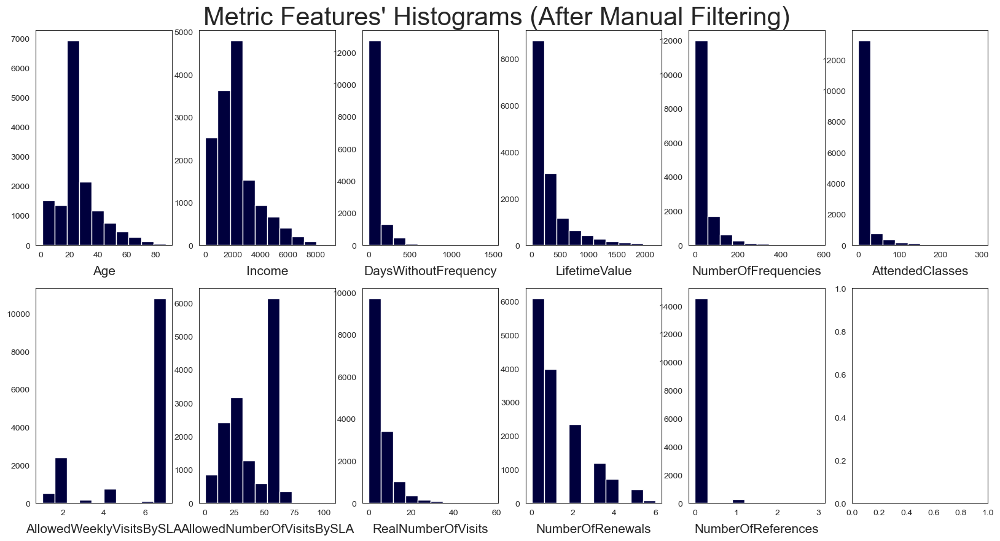

In [84]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize = (20, 10))

for ax, feat in zip(axes.flatten(), metric_features):
    ax.hist(data_out_manual[feat], color = "#00003d")
    ax.set_title(feat, y = -0.16, fontsize = 15)
    
plt.suptitle("Metric Features' Histograms (After Manual Filtering)", size = 30, y = 0.92)
plt.show()

<hr>
<a class="anchor" id="21st-bullet">

### 3.3.2. IQR Method
    
</a>
</div>

[Return to Index](#index)

In [85]:
q25 = data[metric_features].quantile(.25)
q75 = data[metric_features].quantile(.75)
iqr = q75 - q25

upper_lim = q75 + 4.5 * iqr
lower_lim = q25 - 1.5 * iqr

filtersIQR = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filtersIQR.append(data[metric].between(llim, ulim, inclusive = "both"))

filtersIQR = pd.Series(np.all(filtersIQR, 0))
data_out_iqr = data.reset_index(drop = True)[filtersIQR]

print("Percentage of data kept after removing outliers using the IQR method:",
      np.round(data_out_iqr.shape[0] / data.shape[0], 4) * 100)

Percentage of data kept after removing outliers using the IQR method: 78.92


title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manu

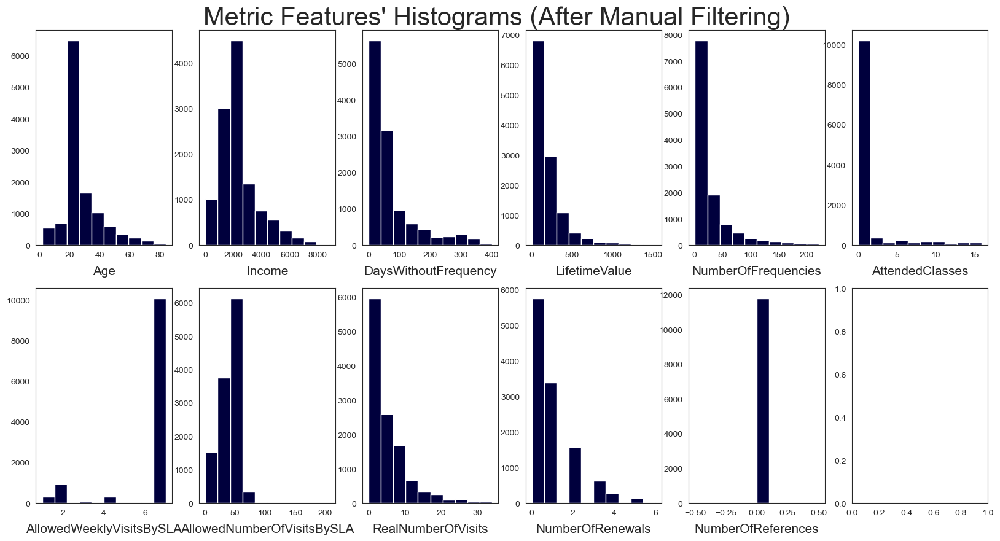

In [86]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize = (20, 10))

for ax, feat in zip(axes.flatten(), metric_features):
    ax.hist(data_out_iqr[feat], color = "#00003d")
    ax.set_title(feat, y = -0.16, fontsize = 15)
    
plt.suptitle("Metric Features' Histograms (After Manual Filtering)", size = 30, y = 0.92)
plt.show()

<hr>
<a class="anchor" id="22nd-bullet">

### 3.3.3. IsolationForest
    
</a>
</div>

[Return to Index](#index)

In [87]:
iforest = IsolationForest(contamination=0.05, random_state=0)

iforest.fit(data[metric_features].values)

outliers = iforest.predict(data[metric_features].values)

data['IsolationForestOutlier'] = outliers

data_iforest = data[data['IsolationForestOutlier'] == 1]

data.drop(columns = ['IsolationForestOutlier'], inplace=True)

print("Percentage of data kept after applying Isolation Forest:", np.round(data_iforest.shape[0] / data.shape[0], 4))


Percentage of data kept after applying Isolation Forest: 0.95


title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manu

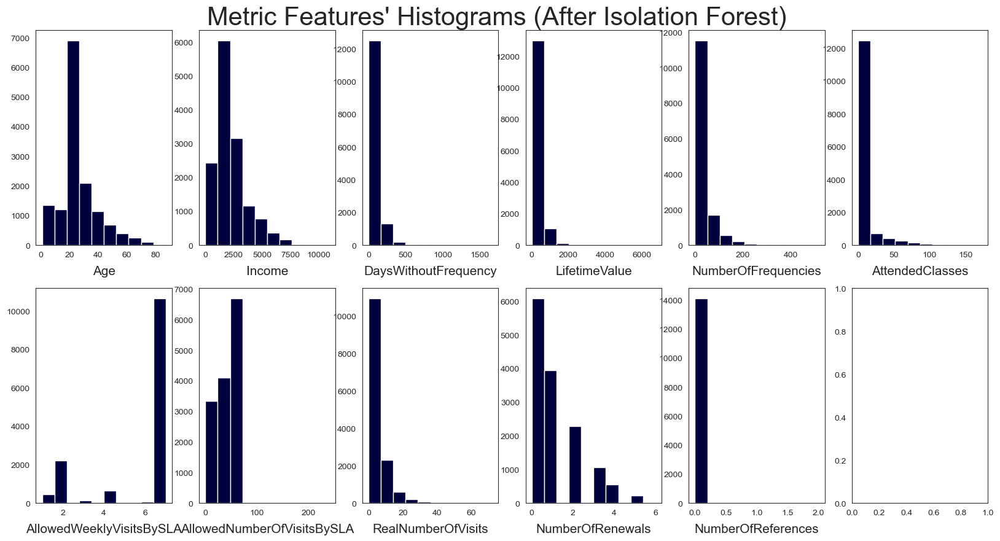

In [88]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize = (20, 10))

for ax, feat in zip(axes.flatten(), metric_features):
    ax.hist(data_iforest[feat], color = "#00003d")
    ax.set_title(feat, y = -0.16, fontsize = 15)
    
plt.suptitle("Metric Features' Histograms (After Isolation Forest)", size = 30, y = 0.92)
plt.show()

<hr>
<a class="anchor" id="23rd-bullet">

### 3.3.4. Manual + IQR
    
</a>
</div>

[Return to Index](#index)

In [89]:
data_out_manual_iqr = data[(filtersManual | filtersIQR)]

print("Percentage of data kept after combining manual and IQR methods to remove outliers:",
      np.round(data_out_manual_iqr.shape[0] / data.shape[0], 4) * 100)

Percentage of data kept after combining manual and IQR methods to remove outliers: 99.44


title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manu

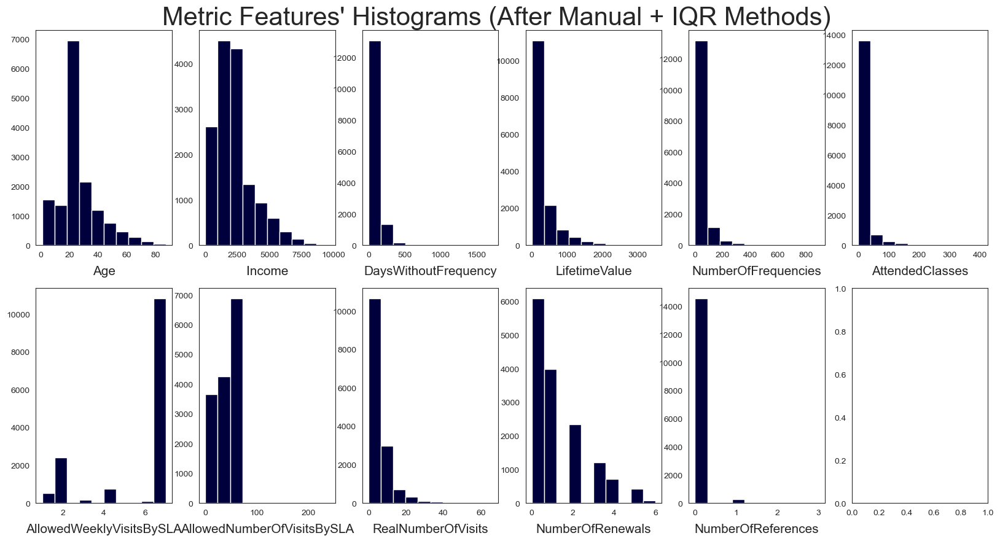

In [90]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize = (20, 10))

for ax, feat in zip(axes.flatten(), metric_features):
    ax.hist(data_out_manual_iqr[feat], color = "#00003d")
    ax.set_title(feat, y = -0.16, fontsize = 15)
    
plt.suptitle("Metric Features' Histograms (After Manual + IQR Methods)", size = 30, y = 0.92)
plt.show()

<hr>
<a class="anchor" id="24th-bullet">

### 3.3.5. Manual + IsolationForest
    
</a>
</div>

[Return to Index](#index)

In [91]:
data_out_manual_IsoForest = data[(filtersManual | outliers)]

print("Percentage of data kept after combining manual and Isolation Forest methods to remove outliers:",
      np.round(data_out_manual_IsoForest.shape[0] / data.shape[0], 4) * 100)

Percentage of data kept after combining manual and Isolation Forest methods to remove outliers: 100.0


title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manu

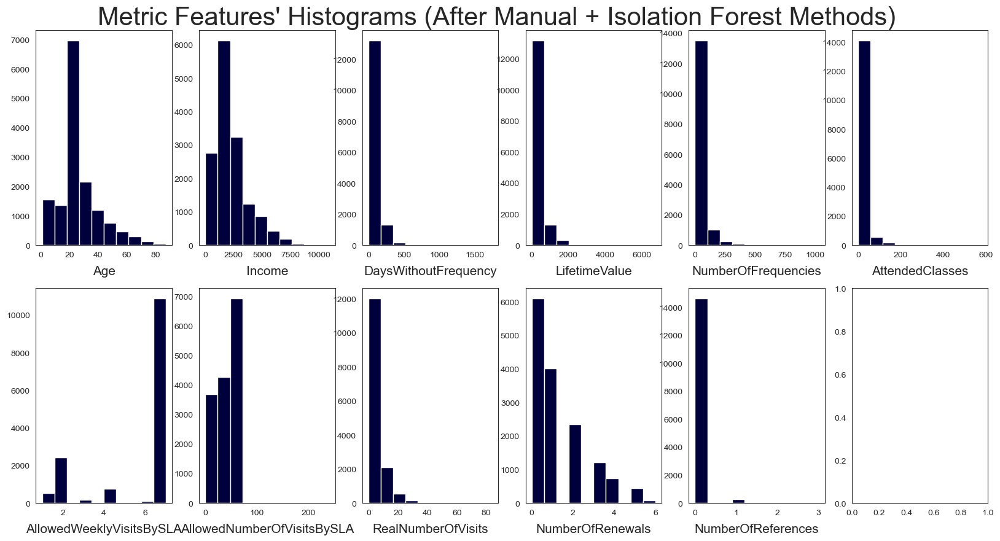

In [92]:
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize = (20, 10))

for ax, feat in zip(axes.flatten(), metric_features):
    ax.hist(data_out_manual_IsoForest[feat], color = "#00003d")
    ax.set_title(feat, y = -0.16, fontsize = 15)
    
plt.suptitle("Metric Features' Histograms (After Manual + Isolation Forest Methods)", size = 30, y = 0.92)
plt.show()

In the end, we chose to filter our outliers through the join of __manual and IQR__ methods, as they allowed us to keep the majority of our data (but not all of it, as occurred with Manual + IsolationForest). <br>
We will also be keeping the outliers in a separate dataframe, since we will use them later to predict the clusters they belong to.

In [93]:
outliers = data[~data.index.isin(data_out_manual_iqr.index)]

In [94]:
data = data_out_manual_iqr

<div class="alert alert-block alert-success">

<a class="anchor" id="25th-bullet">    </a>
# 4. Data Type Correction and Optimization
    

    
</div>


[Return to Index](#index)

In [95]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14857 entries, 10000 to 24941
Data columns (total 32 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Age                         14857 non-null  float64       
 1   Gender                      14857 non-null  object        
 2   Income                      14857 non-null  float64       
 3   EnrollmentStart             14857 non-null  datetime64[ns]
 4   EnrollmentFinish            14857 non-null  datetime64[ns]
 5   LastPeriodStart             14857 non-null  datetime64[ns]
 6   LastPeriodFinish            14857 non-null  datetime64[ns]
 7   DateLastVisit               14857 non-null  datetime64[ns]
 8   DaysWithoutFrequency        14857 non-null  float64       
 9   LifetimeValue               14857 non-null  float64       
 10  UseByTime                   14857 non-null  int64         
 11  AthleticsActivities         14857 non-null  float64    

In [96]:
data['Age']=round(data['Age']).astype('int8')

In [97]:
data['Gender'] = data['Gender'].apply(lambda x: 1 if x == 'Male' else 0)

In [98]:
data[categorical_features] = data[categorical_features].astype('int8')

In [99]:
data[['DaysWithoutFrequency','AttendedClasses','RealNumberOfVisits','NumberOfRenewals','NumberOfReferences']] = data[['DaysWithoutFrequency','AttendedClasses','RealNumberOfVisits','NumberOfRenewals','NumberOfReferences']].round().astype('int32')

In [100]:
data[['Income','LifetimeValue','NumberOfFrequencies','AllowedWeeklyVisitsBySLA','AllowedNumberOfVisitsBySLA']] = data[['Income','LifetimeValue','NumberOfFrequencies','AllowedWeeklyVisitsBySLA','AllowedNumberOfVisitsBySLA']].astype('float32')

In [101]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14857 entries, 10000 to 24941
Data columns (total 32 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Age                         14857 non-null  int8          
 1   Gender                      14857 non-null  int8          
 2   Income                      14857 non-null  float32       
 3   EnrollmentStart             14857 non-null  datetime64[ns]
 4   EnrollmentFinish            14857 non-null  datetime64[ns]
 5   LastPeriodStart             14857 non-null  datetime64[ns]
 6   LastPeriodFinish            14857 non-null  datetime64[ns]
 7   DateLastVisit               14857 non-null  datetime64[ns]
 8   DaysWithoutFrequency        14857 non-null  int32         
 9   LifetimeValue               14857 non-null  float32       
 10  UseByTime                   14857 non-null  int8          
 11  AthleticsActivities         14857 non-null  int8       

We just wanted to optimize the data types, to compute faster results when clustering time comes!

<div class="alert alert-block alert-success">

<a class="anchor" id="26th-bullet">    </a>
# 5. Feature Engineering and Selection
    

    
</div>

[Return to Index](#index)

<hr>
<a class = "anchor" id = "27th-bullet">

## 5.1. Dates Coherence Checking

</a>
</div>

[Return to Index](#index)

In [102]:
data[data["EnrollmentStart"] == data["EnrollmentFinish"]]["UseByTime"].value_counts()

UseByTime
0    2382
Name: count, dtype: int64

All the people whose EnrollmentStart matches the EnrollmentFinish have UseByTime = 0, meaning that they didn't adere to this option. As we can also see from the cell below, this is the most common choice by the users.

In [103]:
data["UseByTime"].value_counts()

UseByTime
0    14158
1      699
Name: count, dtype: int64

In [104]:
print('There is a total of',
      len(data[data['EnrollmentStart']==data['EnrollmentFinish']]),
          'people that have an EnrollmentStart equal to EnrollmentFinish')

There is a total of 2382 people that have an EnrollmentStart equal to EnrollmentFinish


In [105]:
print('There is a total of',
      len(data[data['EnrollmentStart'] == data['DateLastVisit']]),
          'people that have an EnrollmentStart equal to DataLastVisit')

There is a total of 62 people that have an EnrollmentStart equal to DataLastVisit


In [106]:
print('There is a total of',
      len(data[data['EnrollmentFinish'] == data['DateLastVisit']]),
          'people that have an EnrollmentFinish equal to DataLastVisit')

There is a total of 270 people that have an EnrollmentFinish equal to DataLastVisit


In [107]:
data[data['EnrollmentStart'] == data['DateLastVisit']].loc[:, ['EnrollmentStart', 'EnrollmentFinish']]

,EnrollmentStart,EnrollmentFinish
ID,,
10131,2015-04-16,2015-09-16
10429,2017-03-09,2017-04-08
10801,2015-10-01,2015-12-05
10816,2016-03-15,2016-05-05
10951,2014-09-16,2015-09-15
...,...,...
24418,2016-08-03,2016-08-26
24458,2016-08-03,2016-09-03
24649,2014-11-12,2015-09-16


In [108]:
equalstartfinish=data[data['EnrollmentStart'] == data['EnrollmentFinish']]
equalstartfinish[equalstartfinish['DateLastVisit']>equalstartfinish['EnrollmentStart']]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,BirthYear,YearOfEnrollment
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10025,13,0,0.0,2015-09-09,2015-09-09,2019-07-01,2019-12-31,2019-10-26,5,596.299988,0,0,1,0,0,0,0,0,0,0,0,27.0,18,2.0,6.280000,3,4,0,0,0,2006,2015
10036,13,0,0.0,2014-10-02,2014-10-02,2019-07-01,2019-12-31,2019-10-22,9,2209.969971,0,0,1,0,0,1,0,1,0,0,0,199.0,166,2.0,17.139999,5,5,1,1,0,2006,2014
10038,38,0,1910.0,2018-09-29,2018-09-29,2019-07-01,2019-12-31,2019-10-30,1,554.599976,0,0,1,0,0,0,0,0,0,0,0,127.0,125,3.0,26.129999,25,1,0,0,0,1981,2018
10049,56,1,6540.0,2018-09-03,2018-09-03,2019-07-01,2019-12-31,2019-10-29,2,540.099976,0,0,1,0,0,0,0,0,0,0,0,112.0,0,7.0,60.970001,32,1,0,0,0,1963,2018
10051,12,0,0.0,2018-08-17,2018-08-17,2019-07-01,2019-12-31,2019-10-28,3,852.299988,0,0,1,0,0,1,0,0,0,0,0,42.0,42,4.0,34.840000,4,2,0,0,0,2007,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24918,73,1,3870.0,2014-12-10,2014-12-10,2019-07-01,2019-12-31,2019-10-31,0,1583.900024,0,0,1,1,0,0,0,0,0,0,0,472.0,0,7.0,60.970001,45,5,0,0,0,1946,2014
24919,1,0,0.0,2019-07-18,2019-07-18,2019-07-01,2019-12-31,2019-10-31,0,201.199997,0,0,1,0,0,0,0,0,0,0,0,8.0,7,2.0,17.139999,7,1,0,0,0,2018,2019
24926,24,0,3290.0,2018-10-08,2018-10-08,2019-01-01,2019-12-31,2019-10-29,2,196.100006,0,0,1,0,0,0,0,0,0,0,0,36.0,37,2.0,17.420000,7,1,0,0,0,1995,2018


In [109]:
print(data['LastPeriodStart'].unique())
print(data['LastPeriodFinish'].unique())

<DatetimeArray>
['2019-07-01 00:00:00', '2015-01-01 00:00:00', '2017-01-01 00:00:00',
 '2018-07-01 00:00:00', '2018-01-01 00:00:00', '2016-01-01 00:00:00',
 '2019-01-01 00:00:00', '2016-07-01 00:00:00', '2015-07-01 00:00:00',
 '2014-07-01 00:00:00', '2017-07-01 00:00:00', '2014-01-01 00:00:00']
Length: 12, dtype: datetime64[ns]
<DatetimeArray>
['2019-12-31 00:00:00', '2015-12-31 00:00:00', '2017-06-30 00:00:00',
 '2019-06-30 00:00:00', '2018-06-30 00:00:00', '2016-12-31 00:00:00',
 '2016-06-30 00:00:00', '2018-12-31 00:00:00', '2014-12-31 00:00:00',
 '2017-12-31 00:00:00', '2015-06-30 00:00:00']
Length: 11, dtype: datetime64[ns]


As it is possible to see in the cells above, 'LastPeriodStart' always presents dates in the beginning of January (start of the first half of the year) or in the beginning of July (start of the second half of the year), independently of the year. Accordingly, 'LastPeriodFinish' always presents dates at the end of June (end of the first half of the year) or at the end of December (end of the second half of the year), also independently of the year. In conclusion, the variables 'LastPeriodStart' and 'LastPeriodFinish' only identify the beginning and the end of each semester.

Since this information adds anything besides noise and confusion to the interpration of our data, we are going to drop both of them, while focusing only on 'EnrollmentStart', 'Enrollment Finish' and 'DateLastVisit' to assess what was the enrollment period for each client. 

It is important to calculate the enrolled days through 3, instead of the expected 2 variables 'EnrollmentStart' and 'EnrollmentFinish', because sometimes both of these variables present the same date (2422 people that have an EnrollmentStart equal to EnrollmentFinish). In these cases, we need to use 'DateLastVisit' to calculate the enrollment interval. This is possible since in all of those 2422 cases, the 'EnrollmentStart' (and 'EnrollmentFinish') presents a date older than the one of 'DateLastVisit'. This calculation stands on the assumption that some of these dates where introduced manually by different people and/or by using different rules for filling data, which translates into nonsensical data like 'EnrollmentStart'='EnrollmentFinish'.

In [110]:
data.drop(columns=['LastPeriodFinish','LastPeriodStart'],axis=1, inplace=True)

In [111]:
date_columns = ['EnrollmentStart', 'EnrollmentFinish', 'DateLastVisit']

data['StartDate'] = data[date_columns].min(axis=1)
data['FinishDate'] = data[date_columns].max(axis=1)

data['EnrolledDays'] = (data['FinishDate'] - data['StartDate']).dt.days


In [112]:
#Confirmation that the above formula works:
print('There is a total of',
      len(data[data['EnrolledDays']==0]),
          'people with 0 enrolled days')

There is a total of 0 people with 0 enrolled days


<hr>
<a class = "anchor" id = "28th-bullet">

## 5.2. Feature Engineering

</a>
</div>

[Return to Index](#index)

In [113]:
#data['PercentIncome'] = round((data['LifetimeValue']/((data['Income']/30)*data['EnrolledDays']))*100,2)
#data["PercentIncome"].replace(np.inf, 0, inplace = True)
#data["PercentIncome"].replace(np.nan, 0, inplace = True)

In [114]:
data['TotalNumberActivities'] = data[[
    'OtherActivities','SpecialActivities','CombatActivities','RacketActivities','TeamActivities','FitnessActivities',
    'WaterActivities','AthleticsActivities'
]].sum(axis=1)

In [115]:
data["MonthsEnrolled"] = ((data['FinishDate'] - data['StartDate']) / pd.Timedelta(days=30)).astype(int)

In [116]:
data["TotalIncomeDuringEnrollment"] = data["Income"] * data["MonthsEnrolled"]
data.head()

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,BirthYear,YearOfEnrollment,StartDate,FinishDate,EnrolledDays,TotalNumberActivities,MonthsEnrolled,TotalIncomeDuringEnrollment
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10000,60,0,5500.0,2019-09-03,2019-10-31,2019-10-30,1,89.349998,0,0,0,1,0,0,0,0,0,0,0,9.0,7,2.0,6.280000,2,0,0,0,0,1959,2019,2019-09-03,2019-10-31,58,1,1,5500.0
10001,29,0,2630.0,2014-08-12,2015-09-14,2015-07-16,60,479.200012,0,0,0,0,0,0,0,0,0,1,0,23.0,1,2.0,17.420000,1,2,0,0,1,1986,2014,2014-08-12,2015-09-14,398,1,13,34190.0
10002,23,1,1980.0,2017-05-02,2017-06-01,2017-05-25,7,37.599998,0,0,0,1,0,0,0,0,0,0,0,6.0,0,7.0,30.030001,6,0,0,0,1,1994,2017,2017-05-02,2017-06-01,30,1,1,1980.0
10003,9,1,0.0,2018-09-05,2019-02-12,2019-01-21,22,155.399994,0,0,0,0,0,1,0,0,0,0,0,20.0,2,2.0,17.719999,3,0,0,0,1,2010,2018,2018-09-05,2019-02-12,160,1,5,0.0
10004,35,1,4320.0,2016-04-20,2018-06-07,2017-11-09,210,373.200012,0,0,0,1,0,0,0,0,0,0,0,41.0,0,7.0,60.970001,0,3,0,0,1,1983,2016,2016-04-20,2018-06-07,778,1,25,108000.0


In [117]:
#let's keep this one who calculates by monthly income instead of daily income (which is not a real measure since people earn by month
#and not by day)
data["PercentageIncomeSpent"] = np.round((data["LifetimeValue"] / data["TotalIncomeDuringEnrollment"]) * 100, 2)
data["PercentageIncomeSpent"].replace(np.inf, 0, inplace = True)
data["PercentageIncomeSpent"].replace(np.nan, 0, inplace = True)
data.head()

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,BirthYear,YearOfEnrollment,StartDate,FinishDate,EnrolledDays,TotalNumberActivities,MonthsEnrolled,TotalIncomeDuringEnrollment,PercentageIncomeSpent
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10000,60,0,5500.0,2019-09-03,2019-10-31,2019-10-30,1,89.349998,0,0,0,1,0,0,0,0,0,0,0,9.0,7,2.0,6.280000,2,0,0,0,0,1959,2019,2019-09-03,2019-10-31,58,1,1,5500.0,1.62
10001,29,0,2630.0,2014-08-12,2015-09-14,2015-07-16,60,479.200012,0,0,0,0,0,0,0,0,0,1,0,23.0,1,2.0,17.420000,1,2,0,0,1,1986,2014,2014-08-12,2015-09-14,398,1,13,34190.0,1.40
10002,23,1,1980.0,2017-05-02,2017-06-01,2017-05-25,7,37.599998,0,0,0,1,0,0,0,0,0,0,0,6.0,0,7.0,30.030001,6,0,0,0,1,1994,2017,2017-05-02,2017-06-01,30,1,1,1980.0,1.90
10003,9,1,0.0,2018-09-05,2019-02-12,2019-01-21,22,155.399994,0,0,0,0,0,1,0,0,0,0,0,20.0,2,2.0,17.719999,3,0,0,0,1,2010,2018,2018-09-05,2019-02-12,160,1,5,0.0,0.00
10004,35,1,4320.0,2016-04-20,2018-06-07,2017-11-09,210,373.200012,0,0,0,1,0,0,0,0,0,0,0,41.0,0,7.0,60.970001,0,3,0,0,1,1983,2016,2016-04-20,2018-06-07,778,1,25,108000.0,0.35


In [118]:
data['Starting_Month'] = data['StartDate'].dt.month

<hr>
<a class = "anchor" id = "29th-bullet">

## 5.3. Feature Selection

</a>
</div>

[Return to Index](#index)

In [119]:
data_fs = data.copy()

We will not be using dates' variables for cluseting, so we can delete them (since we already used them for feature engineering as well).

In [120]:
data_fs.drop(columns = {'EnrollmentStart', 'EnrollmentFinish', 'DateLastVisit'}, inplace = True)

Let's drop the columns we don't want!

In [121]:
columns_to_drop = ['NatureActivities', 'DanceActivities', 'MonthsEnrolled','YearOfEnrollment',
                   'BirthYear','StartDate','FinishDate']
data_fs = data_fs.drop(columns_to_drop, axis=1)

In [122]:
data_fs

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10000,60,0,5500.000000,1,89.349998,0,0,0,1,0,0,0,0,0,9.0,7,2.0,6.280000,2,0,0,0,0,58,1,5500.000000,1.62,9
10001,29,0,2630.000000,60,479.200012,0,0,0,0,0,0,0,1,0,23.0,1,2.0,17.420000,1,2,0,0,1,398,1,34190.000000,1.40,8
10002,23,1,1980.000000,7,37.599998,0,0,0,1,0,0,0,0,0,6.0,0,7.0,30.030001,6,0,0,0,1,30,1,1980.000000,1.90,5
10003,9,1,0.000000,22,155.399994,0,0,0,0,1,0,0,0,0,20.0,2,2.0,17.719999,3,0,0,0,1,160,1,0.000000,0.00,9
10004,35,1,4320.000000,210,373.200012,0,0,0,1,0,0,0,0,0,41.0,0,7.0,60.970001,0,3,0,0,1,778,1,108000.000000,0.35,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,14,1,0.000000,2,1460.449951,0,0,1,0,0,0,0,0,0,112.0,96,4.0,34.840000,8,3,0,0,0,1146,1,0.000000,0.00,9
24938,39,1,3015.174316,38,343.850006,0,0,0,0,0,0,1,0,0,57.0,0,7.0,60.970001,3,0,0,0,1,261,1,24121.394531,1.43,9
24939,20,1,1810.000000,2,43.599998,0,0,0,1,0,0,0,0,0,6.0,0,7.0,30.030001,8,0,0,0,1,30,1,1810.000000,2.41,3


In [123]:
def cor_heatmap(cor, method):
    mask = np.triu(np.ones_like(cor, dtype=bool))

    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor,
                mask = mask,
                annot = True,
                annot_kws={"size": 7},
                cmap = plt.cm.seismic,
                vmax = 1,
                vmin = -1,
                center = 0,
                fmt='.1')
    plt.title("{0} Correlation".format(method), y = 1.02)
    plt.show()

<hr>
<a class = "anchor" id = "30th-bullet">

### 5.3.1. Pearson Correlation

</a>
</div>

[Return to Index](#index)

In [124]:
cor_pearson = data_fs.corr("pearson")
cor_pearson

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
Age,1.000000,-0.025702,0.879872,0.014124,-0.048536,0.076830,0.020320,-0.210129,0.239356,-0.109268,-0.021909,-0.036746,0.227091,0.027576,0.141321,-0.162953,0.328900,0.271253,0.115739,0.013151,-0.094931,-0.091327,0.029176,0.012373,0.066552,0.507781,0.024021,-0.023256
Gender,-0.025702,1.000000,-0.028329,-0.014653,0.082489,0.040024,0.022639,0.002668,-0.104894,0.096213,0.021363,0.116078,0.028874,-0.035655,0.091497,0.018241,-0.008705,0.022062,0.057898,0.069133,-0.000310,0.000844,-0.029949,0.075779,0.047830,0.041297,-0.004482,-0.008953
Income,0.879872,-0.028329,1.000000,0.011378,-0.090546,0.082745,0.007098,-0.220814,0.271619,-0.141843,-0.026838,-0.029315,0.179631,0.027085,0.104830,-0.192794,0.346508,0.276732,0.103362,-0.016300,-0.104831,-0.100859,0.045938,-0.022907,0.055852,0.544939,-0.011057,-0.039686
DaysWithoutFrequency,0.014124,-0.014653,0.011378,1.000000,-0.035984,0.027024,-0.002709,-0.046122,0.002490,0.059875,0.049395,0.020985,-0.013520,0.012972,-0.118670,-0.072440,-0.009860,-0.019983,-0.194111,0.210986,0.033313,0.032434,0.101213,0.138877,0.018708,0.088638,-0.078589,0.032755
LifetimeValue,-0.048536,0.082489,-0.090546,-0.035984,1.000000,0.048437,-0.001327,0.368860,-0.300258,0.114937,0.025576,0.001515,0.092441,-0.010791,0.679089,0.670651,-0.324028,-0.149384,0.093438,0.713330,0.216247,0.203296,-0.326295,0.779561,0.198192,0.403526,-0.121443,0.089743
UseByTime,0.076830,0.040024,0.082745,0.027024,0.048437,1.000000,0.014909,-0.003810,0.064772,-0.031526,-0.021870,-0.017630,0.016122,-0.009655,0.117174,-0.044212,0.110761,0.064423,0.058968,0.117543,-0.011906,-0.010385,0.110200,0.179458,0.054312,0.206470,-0.038722,0.021457
AthleticsActivities,0.020320,0.022639,0.007098,-0.002709,-0.001327,0.014909,1.000000,-0.028745,-0.072380,-0.003203,-0.013210,-0.016722,-0.013836,-0.003701,0.018885,-0.012788,0.015097,0.023670,0.000328,0.023455,0.015803,0.012627,-0.009752,0.016846,0.078294,0.016057,-0.019322,-0.003388
WaterActivities,-0.210129,0.002668,-0.220814,-0.046122,0.368860,-0.003810,-0.028745,1.000000,-0.617078,-0.074718,-0.079586,-0.163908,-0.049740,-0.024630,0.128310,0.387263,-0.512986,-0.307748,-0.041882,0.216179,0.140516,0.136475,-0.183692,0.216372,0.183182,-0.010258,-0.099371,0.076906
FitnessActivities,0.239356,-0.104894,0.271619,0.002490,-0.300258,0.064772,-0.072380,-0.617078,1.000000,-0.244177,-0.146609,-0.253619,-0.056834,-0.044623,-0.011322,-0.332094,0.592025,0.305513,0.157452,-0.130940,-0.109633,-0.108827,0.155052,-0.124096,0.120013,0.108477,0.060834,-0.092018
TeamActivities,-0.109268,0.096213,-0.141843,0.059875,0.114937,-0.031526,-0.003203,-0.074718,-0.244177,1.000000,-0.012265,-0.048856,-0.026293,-0.010516,-0.027739,0.088570,-0.222136,-0.139420,-0.095170,0.091264,0.027410,0.029840,-0.064145,0.093382,0.160302,-0.028202,-0.001933,0.054115


locator: <matplotlib.ticker.AutoLocator object at 0x000002367271E7D0>
title position was updated manually, not adjusting
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=7.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weigh

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', nam

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\RAGE.TTF', name='Rage Italic', style='italic', variant='norma

title position was updated manually, not adjusting
title position was updated manually, not adjusting


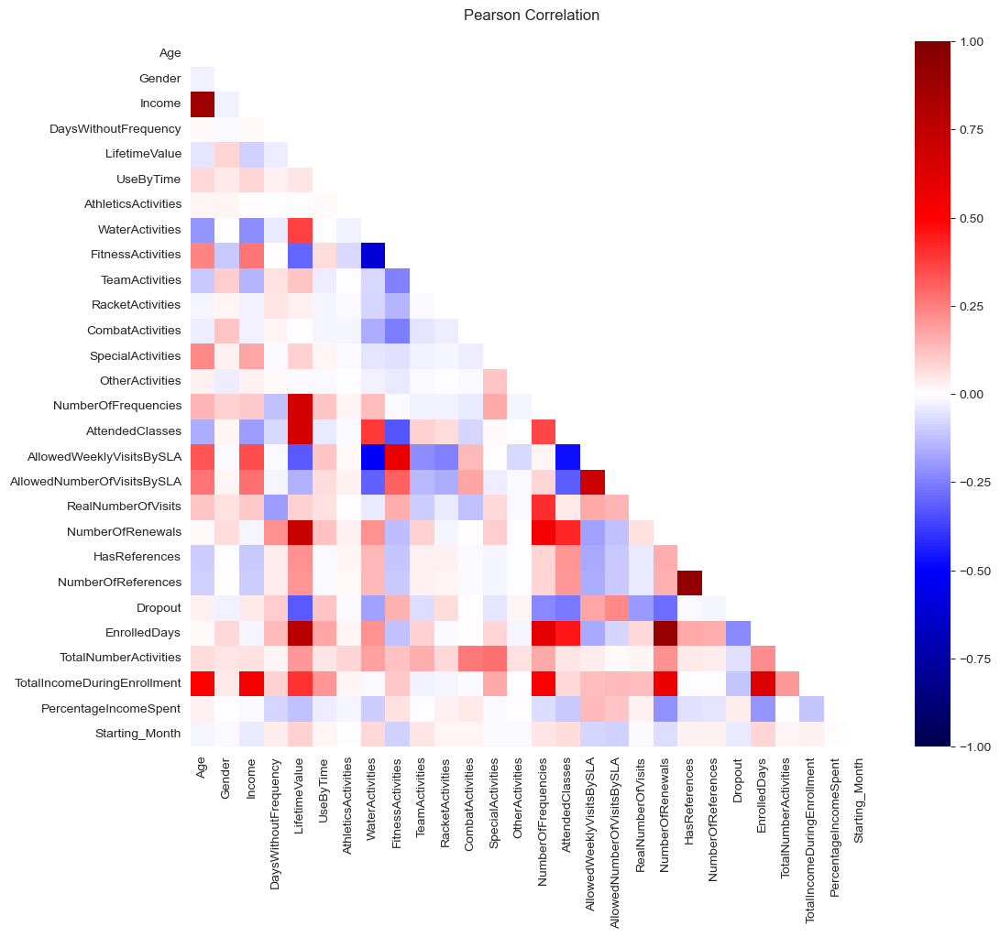

In [125]:
cor_heatmap(cor_pearson, "Pearson")

In [126]:
# Find pairs of variables with a correlation greater than 0.65
high_correlation_pairs = []
for i in range(len(cor_pearson.columns)):
    for j in range(i + 1, len(cor_pearson.columns)):
        if abs(cor_pearson.iloc[i, j]) > 0.65:
            high_correlation_pairs.append((cor_pearson.columns[i], cor_pearson.columns[j]))
# Display the pairs of variables with high correlation
for pair in high_correlation_pairs:
    correlation_value = cor_pearson.loc[pair[0], pair[1]]
    print(f"High Correlation: {pair[0]} and {pair[1]} - Correlation: {correlation_value}")

High Correlation: Age and Income - Correlation: 0.8798722705395398
High Correlation: LifetimeValue and NumberOfFrequencies - Correlation: 0.6790887982851141
High Correlation: LifetimeValue and AttendedClasses - Correlation: 0.6706509438770778
High Correlation: LifetimeValue and NumberOfRenewals - Correlation: 0.7133302325511067
High Correlation: LifetimeValue and EnrolledDays - Correlation: 0.7795606846244508
High Correlation: AllowedWeeklyVisitsBySLA and AllowedNumberOfVisitsBySLA - Correlation: 0.6986734286505033
High Correlation: NumberOfRenewals and EnrolledDays - Correlation: 0.9091618028099594
High Correlation: HasReferences and NumberOfReferences - Correlation: 0.9186590753779235


<hr>
<a class = "anchor" id = "31st-bullet">

### 5.3.2. Spearman's Rank Correlation

</a>
</div>

[Return to Index](#index)

In [127]:
cor_spearman = data_fs.corr("spearman")
cor_spearman

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
Age,1.000000,-0.022627,0.872243,0.024408,-0.024722,0.104903,0.019097,-0.214988,0.271289,-0.151690,-0.018701,-0.016278,0.174891,0.043268,0.082705,-0.309643,0.377532,0.306185,0.072686,-0.002299,-0.120071,-0.121662,0.085233,-0.002764,0.078241,0.640999,0.211382,-0.022687
Gender,-0.022627,1.000000,-0.022492,-0.041838,0.105656,0.040024,0.022639,0.002668,-0.104894,0.096213,0.021363,0.116078,0.028874,-0.035655,0.086858,0.013924,-0.009732,0.015770,0.032724,0.069597,-0.000310,-0.001050,-0.029949,0.076836,0.045274,0.020943,-0.010348,-0.008389
Income,0.872243,-0.022492,1.000000,0.022041,-0.063830,0.096022,0.011367,-0.228743,0.287385,-0.153203,-0.021063,-0.016029,0.157616,0.030030,0.047928,-0.313635,0.376743,0.289466,0.068455,-0.023957,-0.117469,-0.118902,0.078147,-0.030833,0.067668,0.661578,0.141573,-0.029977
DaysWithoutFrequency,0.024408,-0.041838,0.022041,1.000000,-0.111587,0.040034,0.007078,-0.090626,0.000676,0.059603,0.046929,0.052496,-0.047150,0.039817,-0.267351,-0.099091,0.023429,0.102928,-0.535635,0.077449,0.030876,0.032683,0.415173,0.070262,-0.028416,0.124313,-0.079851,0.003395
LifetimeValue,-0.024722,0.105656,-0.063830,-0.111587,1.000000,0.089033,-0.018506,0.364445,-0.350578,0.144687,0.069845,0.042376,0.101449,-0.000757,0.742167,0.490079,-0.366807,-0.088944,0.004325,0.662772,0.152036,0.154760,-0.241171,0.803173,0.194267,0.315049,-0.264025,0.085946
UseByTime,0.104903,0.040024,0.096022,0.040034,0.089033,1.000000,0.014909,-0.003810,0.064772,-0.031526,-0.021870,-0.017630,0.016122,-0.009655,0.118052,-0.073251,0.113136,0.066927,0.046417,0.109007,-0.011906,-0.010757,0.110200,0.174444,0.053116,0.214457,-0.058112,0.024612
AthleticsActivities,0.019097,0.022639,0.011367,0.007078,-0.018506,0.014909,1.000000,-0.028745,-0.072380,-0.003203,-0.013210,-0.016722,-0.013836,-0.003701,-0.010726,-0.034508,0.013669,0.021802,-0.019630,0.019039,0.015803,0.016626,-0.009752,0.010400,0.070819,0.004637,-0.034193,-0.005607
WaterActivities,-0.214988,0.002668,-0.228743,-0.090626,0.364445,-0.003810,-0.028745,1.000000,-0.617078,-0.074718,-0.079586,-0.163908,-0.049740,-0.024630,0.168499,0.518482,-0.510052,-0.319886,-0.063771,0.206742,0.140516,0.143386,-0.183692,0.208527,0.177453,-0.201204,-0.281799,0.035136
FitnessActivities,0.271289,-0.104894,0.287385,0.000676,-0.350578,0.064772,-0.072380,-0.617078,1.000000,-0.244177,-0.146609,-0.253619,-0.056834,-0.044623,-0.013589,-0.530138,0.597762,0.328092,0.216693,-0.132322,-0.109633,-0.113485,0.155052,-0.145069,0.119796,0.267649,0.230020,-0.051556
TeamActivities,-0.151690,0.096213,-0.153203,0.059603,0.144687,-0.031526,-0.003203,-0.074718,-0.244177,1.000000,-0.012265,-0.048856,-0.026293,-0.010516,-0.041406,0.240032,-0.259268,-0.133887,-0.131022,0.080887,0.027410,0.027492,-0.064145,0.090887,0.149228,-0.076347,-0.047313,0.042624


locator: <matplotlib.ticker.AutoLocator object at 0x0000023673CD4E90>
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting
title position was updated manually, not adjusting


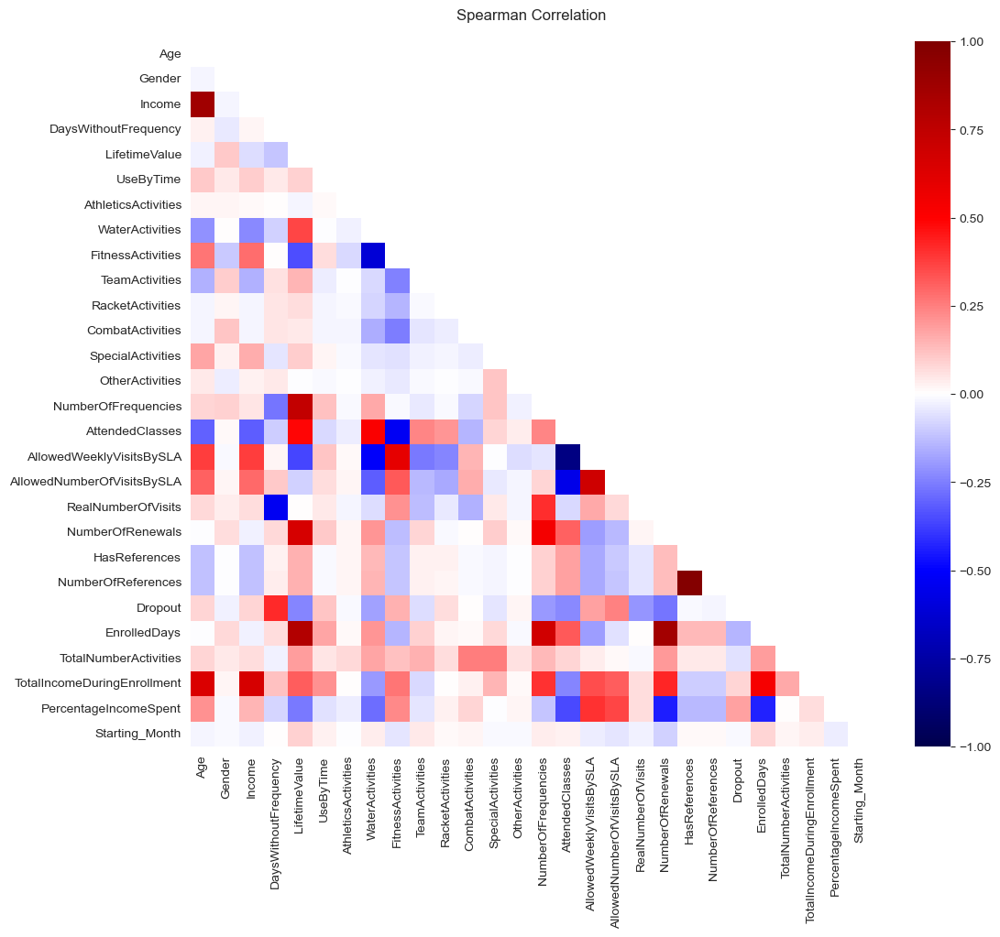

In [128]:
cor_heatmap(cor_spearman, "Spearman")

In [129]:
# Find pairs of variables with a correlation greater than 0.65
high_correlation_pairs = []
for i in range(len(cor_spearman.columns)):
    for j in range(i + 1, len(cor_spearman.columns)):
        if abs(cor_spearman.iloc[i, j]) > 0.65:
            high_correlation_pairs.append((cor_spearman.columns[i], cor_spearman.columns[j]))
# Display the pairs of variables with high correlation
for pair in high_correlation_pairs:
    correlation_value = cor_spearman.loc[pair[0], pair[1]]
    print(f"High Correlation: {pair[0]} and {pair[1]} - Correlation: {correlation_value}")

High Correlation: Age and Income - Correlation: 0.8722427412266242
High Correlation: Income and TotalIncomeDuringEnrollment - Correlation: 0.6615776337548075
High Correlation: LifetimeValue and NumberOfFrequencies - Correlation: 0.7421665099773846
High Correlation: LifetimeValue and NumberOfRenewals - Correlation: 0.6627722479830328
High Correlation: LifetimeValue and EnrolledDays - Correlation: 0.8031733645369552
High Correlation: NumberOfFrequencies and EnrolledDays - Correlation: 0.6811309562223686
High Correlation: AttendedClasses and AllowedWeeklyVisitsBySLA - Correlation: -0.8449093322450684
High Correlation: AllowedWeeklyVisitsBySLA and AllowedNumberOfVisitsBySLA - Correlation: 0.6896063191469743
High Correlation: NumberOfRenewals and EnrolledDays - Correlation: 0.8526393043796688
High Correlation: HasReferences and NumberOfReferences - Correlation: 0.9779309112831236


<hr>
<a class = "anchor" id = "32nd-bullet">

### 5.3.3. PCA

</a>
</div>

[Return to Index](#index)

We will use PCA to check if the metric features that we decided to remove above explain a big amount of the variability in our data, and we will do so by assessing the correlation between each principal component and all our metric variables. If we decided to remove a feature, but at this stage we see that it has a high correlation with the first principal components (which are those who explain most of the variability in the data), then we might need to rethink our option, as this may indicate that this variable is in fact important for the clustering task we will perform later on. <br>
Nonetheless, it is important to bear in mind that we should not follow PCA blindly. When in doubt, we should rely on the other operations we made.

In [130]:
data_fs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14857 entries, 10000 to 24941
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          14857 non-null  int8   
 1   Gender                       14857 non-null  int8   
 2   Income                       14857 non-null  float32
 3   DaysWithoutFrequency         14857 non-null  int32  
 4   LifetimeValue                14857 non-null  float32
 5   UseByTime                    14857 non-null  int8   
 6   AthleticsActivities          14857 non-null  int8   
 7   WaterActivities              14857 non-null  int8   
 8   FitnessActivities            14857 non-null  int8   
 9   TeamActivities               14857 non-null  int8   
 10  RacketActivities             14857 non-null  int8   
 11  CombatActivities             14857 non-null  int8   
 12  SpecialActivities            14857 non-null  int8   
 13  OtherActivities  

In [131]:
metric_features = [
    'Income','DaysWithoutFrequency','LifetimeValue','NumberOfFrequencies','AttendedClasses','AllowedWeeklyVisitsBySLA',
    'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals','EnrolledDays','TotalIncomeDuringEnrollment',
    'PercentageIncomeSpent','Age','NumberOfReferences', 'TotalNumberActivities'
]

categorical_features = [
    'Gender', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'OtherActivities', 
    'SpecialActivities', 'CombatActivities', 'RacketActivities', 'TeamActivities',
    'HasReferences', 'Dropout', 'Starting_Month'
]

In [132]:
# creating a subset of dataframe by dropping the features with dates
ds = data[metric_features]
# Scaling
scaler = StandardScaler()
scaler.fit(ds)
scaled_ds = pd.DataFrame(scaler.transform(ds),columns= ds.columns )
print("All metric features are now scaled")

All metric features are now scaled


In [133]:
scaled_ds

,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,EnrolledDays,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Age,NumberOfReferences,TotalNumberActivities
0,2.116632,-0.568414,-0.602168,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,-0.851715,-0.502626,0.350878,2.413151,-0.132775,-0.287942
1,0.289571,-0.146806,0.526814,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,-0.040321,0.121885,0.223479,0.214044,-0.132775,-0.287942
2,-0.124224,-0.525539,-0.752033,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,-0.918535,-0.579248,0.513022,-0.211590,-0.132775,-0.287942
3,-1.384705,-0.418350,-0.410891,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,-0.608297,-0.622348,-0.587242,-1.204735,-0.132775,-0.287942
4,1.365436,0.925078,0.219844,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.866532,1.728548,-0.384561,0.639678,-0.132775,-0.287942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,-1.384705,-0.561268,3.368455,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,1.744747,-0.622348,-0.587242,-0.850040,-0.132775,-0.287942
14853,0.534775,-0.304016,0.134849,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,-0.367265,-0.097284,0.240851,0.923433,-0.132775,-0.287942
14854,-0.232447,-0.561268,-0.734657,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,-0.918535,-0.582948,0.808356,-0.424407,-0.132775,-0.287942
14855,1.671007,-0.554122,1.422818,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.456062,1.467338,-0.112391,2.058456,-0.132775,-0.287942


In [134]:
df_cat = data[categorical_features].reset_index()
data = pd.concat([scaled_ds, df_cat], axis=1)

Now our data has the metric features scaled!

In [135]:
data_pca = data.copy()

In [136]:
pca = PCA()
pca_feat = pca.fit_transform(data_pca[metric_features])

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=14.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\Da

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', nam

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\RAGE.TTF', name='Rage Italic', style='italic', variant='norma

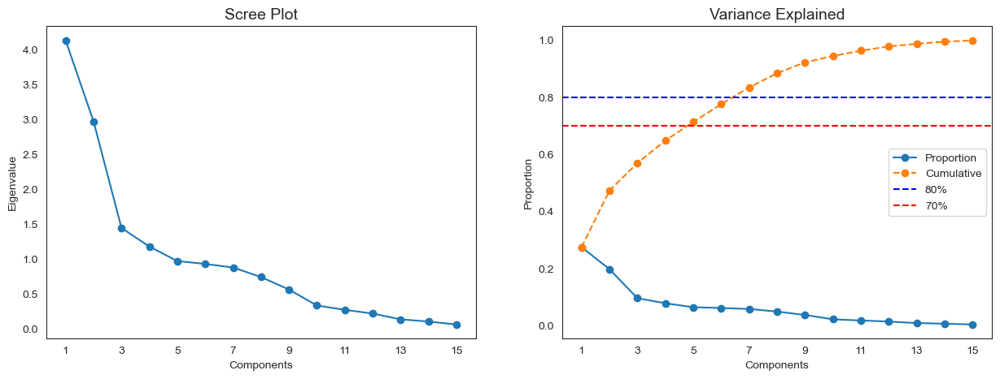

In [137]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)

ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")

ax1.set_xlabel("Components")
ax2.set_xlabel("Components")

ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))

ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

ax2.axhline(y=0.80, color='blue', linestyle='--', label='80%')
ax2.axhline(y=0.70, color='red', linestyle='--', label='70%')

ax2.legend()

plt.show()

Here we can analyze with 3 diferent graphs the possible ideal number of PC's.  
On the blue lines, we look for the 'elbow', which seems to be 4 PC's.  
Now analysing the orange line, we search for the place were we can explain close to 80% of the data. And we can see that arround 4 PC's we can explain those 80% of the data.  

Let's try fit with 4 components

In [138]:
pca = PCA(n_components=4)
pca_feat = pca.fit_transform(data_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
data_pca = pd.DataFrame(pca_feat, index = data_pca.index, columns = pca_feat_names)
data_pca

,PC0,PC1,PC2,PC3
0,-1.033867,0.491617,-1.432621,-3.724298
1,0.544553,-0.995574,-1.020881,-1.291094
2,-1.787268,-0.254241,0.513952,-0.378378
3,-0.955306,-2.666137,-0.028981,-0.634197
4,1.317060,2.089768,-1.715017,0.648851
...,...,...,...,...
14852,4.225143,-2.452972,1.649472,-0.061446
14853,-0.776660,1.306790,0.279204,-0.202596
14854,-1.797546,-0.340919,0.857108,-0.280697
14855,4.476029,0.326567,0.442247,-3.919110


In [139]:
# Reassigning df to contain pca variables
data_pca = pd.concat([scaled_ds, data_pca], axis=1)
data_pca

,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,EnrolledDays,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Age,NumberOfReferences,TotalNumberActivities,PC0,PC1,PC2,PC3
0,2.116632,-0.568414,-0.602168,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,-0.851715,-0.502626,0.350878,2.413151,-0.132775,-0.287942,-1.033867,0.491617,-1.432621,-3.724298
1,0.289571,-0.146806,0.526814,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,-0.040321,0.121885,0.223479,0.214044,-0.132775,-0.287942,0.544553,-0.995574,-1.020881,-1.291094
2,-0.124224,-0.525539,-0.752033,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,-0.918535,-0.579248,0.513022,-0.211590,-0.132775,-0.287942,-1.787268,-0.254241,0.513952,-0.378378
3,-1.384705,-0.418350,-0.410891,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,-0.608297,-0.622348,-0.587242,-1.204735,-0.132775,-0.287942,-0.955306,-2.666137,-0.028981,-0.634197
4,1.365436,0.925078,0.219844,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.866532,1.728548,-0.384561,0.639678,-0.132775,-0.287942,1.317060,2.089768,-1.715017,0.648851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,-1.384705,-0.561268,3.368455,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,1.744747,-0.622348,-0.587242,-0.850040,-0.132775,-0.287942,4.225143,-2.452972,1.649472,-0.061446
14853,0.534775,-0.304016,0.134849,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,-0.367265,-0.097284,0.240851,0.923433,-0.132775,-0.287942,-0.776660,1.306790,0.279204,-0.202596
14854,-0.232447,-0.561268,-0.734657,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,-0.918535,-0.582948,0.808356,-0.424407,-0.132775,-0.287942,-1.797546,-0.340919,0.857108,-0.280697
14855,1.671007,-0.554122,1.422818,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.456062,1.467338,-0.112391,2.058456,-0.132775,-0.287942,4.476029,0.326567,0.442247,-3.919110


In [140]:
data_cat = data[categorical_features].reset_index()
df_pca = pd.concat([data_pca, data_cat], axis=1)
df_pca

,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,EnrolledDays,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Age,NumberOfReferences,TotalNumberActivities,PC0,PC1,PC2,PC3,index,Gender,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,HasReferences,Dropout,Starting_Month
0,2.116632,-0.568414,-0.602168,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,-0.851715,-0.502626,0.350878,2.413151,-0.132775,-0.287942,-1.033867,0.491617,-1.432621,-3.724298,0,0,0,0,0,1,0,0,0,0,0,0,0,9
1,0.289571,-0.146806,0.526814,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,-0.040321,0.121885,0.223479,0.214044,-0.132775,-0.287942,0.544553,-0.995574,-1.020881,-1.291094,1,0,0,0,0,0,0,1,0,0,0,0,1,8
2,-0.124224,-0.525539,-0.752033,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,-0.918535,-0.579248,0.513022,-0.211590,-0.132775,-0.287942,-1.787268,-0.254241,0.513952,-0.378378,2,1,0,0,0,1,0,0,0,0,0,0,1,5
3,-1.384705,-0.418350,-0.410891,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,-0.608297,-0.622348,-0.587242,-1.204735,-0.132775,-0.287942,-0.955306,-2.666137,-0.028981,-0.634197,3,1,0,0,0,0,0,0,0,0,1,0,1,9
4,1.365436,0.925078,0.219844,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.866532,1.728548,-0.384561,0.639678,-0.132775,-0.287942,1.317060,2.089768,-1.715017,0.648851,4,1,0,0,0,1,0,0,0,0,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,-1.384705,-0.561268,3.368455,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,1.744747,-0.622348,-0.587242,-0.850040,-0.132775,-0.287942,4.225143,-2.452972,1.649472,-0.061446,14852,1,0,0,1,0,0,0,0,0,0,0,0,9
14853,0.534775,-0.304016,0.134849,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,-0.367265,-0.097284,0.240851,0.923433,-0.132775,-0.287942,-0.776660,1.306790,0.279204,-0.202596,14853,1,0,0,0,0,0,0,1,0,0,0,1,9
14854,-0.232447,-0.561268,-0.734657,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,-0.918535,-0.582948,0.808356,-0.424407,-0.132775,-0.287942,-1.797546,-0.340919,0.857108,-0.280697,14854,1,0,0,0,1,0,0,0,0,0,0,1,3
14855,1.671007,-0.554122,1.422818,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.456062,1.467338,-0.112391,2.058456,-0.132775,-0.287942,4.476029,0.326567,0.442247,-3.919110,14855,1,0,0,1,0,0,0,0,0,0,0,0,3


In [141]:
df_pca = df_pca.drop(columns = 'index')

In [142]:
df_pca

,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,EnrolledDays,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Age,NumberOfReferences,TotalNumberActivities,PC0,PC1,PC2,PC3,Gender,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,HasReferences,Dropout,Starting_Month
0,2.116632,-0.568414,-0.602168,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,-0.851715,-0.502626,0.350878,2.413151,-0.132775,-0.287942,-1.033867,0.491617,-1.432621,-3.724298,0,0,0,0,1,0,0,0,0,0,0,0,9
1,0.289571,-0.146806,0.526814,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,-0.040321,0.121885,0.223479,0.214044,-0.132775,-0.287942,0.544553,-0.995574,-1.020881,-1.291094,0,0,0,0,0,0,1,0,0,0,0,1,8
2,-0.124224,-0.525539,-0.752033,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,-0.918535,-0.579248,0.513022,-0.211590,-0.132775,-0.287942,-1.787268,-0.254241,0.513952,-0.378378,1,0,0,0,1,0,0,0,0,0,0,1,5
3,-1.384705,-0.418350,-0.410891,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,-0.608297,-0.622348,-0.587242,-1.204735,-0.132775,-0.287942,-0.955306,-2.666137,-0.028981,-0.634197,1,0,0,0,0,0,0,0,0,1,0,1,9
4,1.365436,0.925078,0.219844,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.866532,1.728548,-0.384561,0.639678,-0.132775,-0.287942,1.317060,2.089768,-1.715017,0.648851,1,0,0,0,1,0,0,0,0,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,-1.384705,-0.561268,3.368455,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,1.744747,-0.622348,-0.587242,-0.850040,-0.132775,-0.287942,4.225143,-2.452972,1.649472,-0.061446,1,0,0,1,0,0,0,0,0,0,0,0,9
14853,0.534775,-0.304016,0.134849,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,-0.367265,-0.097284,0.240851,0.923433,-0.132775,-0.287942,-0.776660,1.306790,0.279204,-0.202596,1,0,0,0,0,0,0,1,0,0,0,1,9
14854,-0.232447,-0.561268,-0.734657,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,-0.918535,-0.582948,0.808356,-0.424407,-0.132775,-0.287942,-1.797546,-0.340919,0.857108,-0.280697,1,0,0,0,1,0,0,0,0,0,0,1,3
14855,1.671007,-0.554122,1.422818,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.456062,1.467338,-0.112391,2.058456,-0.132775,-0.287942,4.476029,0.326567,0.442247,-3.919110,1,0,0,1,0,0,0,0,0,0,0,0,3


In [143]:
def colours(val):
    if val < -0.45:
        color = 'background-color: pink'
    elif val > 0.45:
        color = 'background-color: gold'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(colours)

,PC0,PC1,PC2,PC3
Income,0.031865,0.823578,-0.260825,-0.422022
DaysWithoutFrequency,0.066847,0.000663,-0.652927,0.438352
LifetimeValue,0.892967,-0.132305,0.138549,-0.006452
NumberOfFrequencies,0.748611,0.244352,0.393928,0.012962
AttendedClasses,0.633745,-0.398263,0.141184,-0.250912
AllowedWeeklyVisitsBySLA,-0.300280,0.706239,0.191063,0.429012
AllowedNumberOfVisitsBySLA,-0.182926,0.636199,0.249889,0.468933
RealNumberOfVisits,0.169142,0.281124,0.650683,-0.094308
NumberOfRenewals,0.880652,0.016648,-0.160448,0.221061
EnrolledDays,0.920582,0.038688,-0.081652,0.206924


In [144]:
data = df_pca

In [145]:
#ProfileReport(
#    data,
#    title='Tugas Customer Data Preprocessed',
#    correlations={
#        "pearson": {"calculate": True},
#        "spearman": {"calculate": False},
#        "kendall": {"calculate": False},
#        "phi_k": {"calculate": False},
#        "cramers": {"calculate": False},
#    },
#)

In [146]:
data.drop_duplicates(inplace = True)

In [147]:
data.duplicated().sum()

0

In [148]:
data.columns

Index(['Income', 'DaysWithoutFrequency', 'LifetimeValue',
       'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA',
       'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals',
       'EnrolledDays', 'TotalIncomeDuringEnrollment', 'PercentageIncomeSpent',
       'Age', 'NumberOfReferences', 'TotalNumberActivities', 'PC0', 'PC1',
       'PC2', 'PC3', 'Gender', 'UseByTime', 'AthleticsActivities',
       'WaterActivities', 'FitnessActivities', 'OtherActivities',
       'SpecialActivities', 'CombatActivities', 'RacketActivities',
       'TeamActivities', 'HasReferences', 'Dropout', 'Starting_Month'],
      dtype='object')

In [149]:
data = data.drop(columns = 'PC3')

At first glance, its looks like PC3 only is correlated to 1 variable, so it can be dropped.

In [150]:
pc_features = data.columns[data.columns.str.startswith('PC')]

In [151]:
print(metric_features,'\n')
print(categorical_features,'\n')
print(pc_features,'\n')

['Income', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'EnrolledDays', 'TotalIncomeDuringEnrollment', 'PercentageIncomeSpent', 'Age', 'NumberOfReferences', 'TotalNumberActivities'] 

['Gender', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'OtherActivities', 'SpecialActivities', 'CombatActivities', 'RacketActivities', 'TeamActivities', 'HasReferences', 'Dropout', 'Starting_Month'] 

Index(['PC0', 'PC1', 'PC2'], dtype='object') 



In [152]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14857 entries, 0 to 14856
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Income                       14857 non-null  float64
 1   DaysWithoutFrequency         14857 non-null  float64
 2   LifetimeValue                14857 non-null  float64
 3   NumberOfFrequencies          14857 non-null  float64
 4   AttendedClasses              14857 non-null  float64
 5   AllowedWeeklyVisitsBySLA     14857 non-null  float64
 6   AllowedNumberOfVisitsBySLA   14857 non-null  float64
 7   RealNumberOfVisits           14857 non-null  float64
 8   NumberOfRenewals             14857 non-null  float64
 9   EnrolledDays                 14857 non-null  float64
 10  TotalIncomeDuringEnrollment  14857 non-null  float64
 11  PercentageIncomeSpent        14857 non-null  float64
 12  Age                          14857 non-null  float64
 13  NumberOfReferenc

<hr>
<a class = "anchor" id = "33rd-bullet">

### 5.3.4. Final Features to Keep

</a>
</div>

[Return to Index](#index)

In [153]:
columns_to_drop = ['Age', 'NumberOfReferences']
data_fs = data_fs.drop(columns_to_drop, axis=1)

In [154]:
data_fs.columns

Index(['Gender', 'Income', 'DaysWithoutFrequency', 'LifetimeValue',
       'UseByTime', 'AthleticsActivities', 'WaterActivities',
       'FitnessActivities', 'TeamActivities', 'RacketActivities',
       'CombatActivities', 'SpecialActivities', 'OtherActivities',
       'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA',
       'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals',
       'HasReferences', 'Dropout', 'EnrolledDays', 'TotalNumberActivities',
       'TotalIncomeDuringEnrollment', 'PercentageIncomeSpent',
       'Starting_Month'],
      dtype='object')

In [155]:
data = data_fs.copy()

<div class="alert alert-block alert-success">

<a class="anchor" id="34th-bullet">    </a>
# 6. Scaling
    

    
</div>

[Return to Index](#index)

In [156]:
data.reset_index(inplace = True)
data.drop(columns = "ID", inplace = True)

In [157]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14857 entries, 0 to 14856
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       14857 non-null  int8   
 1   Income                       14857 non-null  float32
 2   DaysWithoutFrequency         14857 non-null  int32  
 3   LifetimeValue                14857 non-null  float32
 4   UseByTime                    14857 non-null  int8   
 5   AthleticsActivities          14857 non-null  int8   
 6   WaterActivities              14857 non-null  int8   
 7   FitnessActivities            14857 non-null  int8   
 8   TeamActivities               14857 non-null  int8   
 9   RacketActivities             14857 non-null  int8   
 10  CombatActivities             14857 non-null  int8   
 11  SpecialActivities            14857 non-null  int8   
 12  OtherActivities              14857 non-null  int8   
 13  NumberOfFrequenc

In [158]:
metric_features = [
    'Income','DaysWithoutFrequency','LifetimeValue','NumberOfFrequencies','AttendedClasses','AllowedWeeklyVisitsBySLA',
    'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals','EnrolledDays','TotalIncomeDuringEnrollment',
    'PercentageIncomeSpent','Starting_Month','TotalNumberActivities'
    ]

In [159]:
scaler = StandardScaler()
df_metric = data[metric_features]
scaler.fit(df_metric)
df_metric_scaled = pd.DataFrame(scaler.transform(df_metric),columns = df_metric.columns)
print("All metric features are now scaled")

All metric features are now scaled


In [160]:
data

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
0,0,5500.000000,1,89.349998,0,0,0,1,0,0,0,0,0,9.0,7,2.0,6.280000,2,0,0,0,58,1,5500.000000,1.62,9
1,0,2630.000000,60,479.200012,0,0,0,0,0,0,0,1,0,23.0,1,2.0,17.420000,1,2,0,1,398,1,34190.000000,1.40,8
2,1,1980.000000,7,37.599998,0,0,0,1,0,0,0,0,0,6.0,0,7.0,30.030001,6,0,0,1,30,1,1980.000000,1.90,5
3,1,0.000000,22,155.399994,0,0,0,0,1,0,0,0,0,20.0,2,2.0,17.719999,3,0,0,1,160,1,0.000000,0.00,9
4,1,4320.000000,210,373.200012,0,0,0,1,0,0,0,0,0,41.0,0,7.0,60.970001,0,3,0,1,778,1,108000.000000,0.35,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1,0.000000,2,1460.449951,0,0,1,0,0,0,0,0,0,112.0,96,4.0,34.840000,8,3,0,0,1146,1,0.000000,0.00,9
14853,1,3015.174316,38,343.850006,0,0,0,0,0,0,1,0,0,57.0,0,7.0,60.970001,3,0,0,1,261,1,24121.394531,1.43,9
14854,1,1810.000000,2,43.599998,0,0,0,1,0,0,0,0,0,6.0,0,7.0,30.030001,8,0,0,1,30,1,1810.000000,2.41,3
14855,1,4800.000000,3,788.599976,0,0,1,0,0,0,0,0,0,185.0,155,3.0,15.870000,7,2,0,0,606,1,96000.000000,0.82,3


In [161]:
data[df_metric_scaled.columns] = df_metric_scaled

In [162]:
data.isna().sum()

Gender                         0
Income                         0
DaysWithoutFrequency           0
LifetimeValue                  0
UseByTime                      0
AthleticsActivities            0
WaterActivities                0
FitnessActivities              0
TeamActivities                 0
RacketActivities               0
CombatActivities               0
SpecialActivities              0
OtherActivities                0
NumberOfFrequencies            0
AttendedClasses                0
AllowedWeeklyVisitsBySLA       0
AllowedNumberOfVisitsBySLA     0
RealNumberOfVisits             0
NumberOfRenewals               0
HasReferences                  0
Dropout                        0
EnrolledDays                   0
TotalNumberActivities          0
TotalIncomeDuringEnrollment    0
PercentageIncomeSpent          0
Starting_Month                 0
dtype: int64

In [163]:
metric_features

['Income',
 'DaysWithoutFrequency',
 'LifetimeValue',
 'NumberOfFrequencies',
 'AttendedClasses',
 'AllowedWeeklyVisitsBySLA',
 'AllowedNumberOfVisitsBySLA',
 'RealNumberOfVisits',
 'NumberOfRenewals',
 'EnrolledDays',
 'TotalIncomeDuringEnrollment',
 'PercentageIncomeSpent',
 'Starting_Month',
 'TotalNumberActivities']

In [164]:
data[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Income,14857.0,-7.269469e-17,1.000034,-1.384705,-0.480724,-0.130590,0.372330,4.745818
DaysWithoutFrequency,14857.0,-3.826036e-18,1.000034,-0.575560,-0.482663,-0.282578,0.017549,11.693943
LifetimeValue,14857.0,5.452101e-17,1.000034,-0.860920,-0.618820,-0.380629,0.163084,9.270235
NumberOfFrequencies,14857.0,1.673891e-18,1.000034,-0.639753,-0.538291,-0.352276,0.104306,14.444351
AttendedClasses,14857.0,-4.065163e-17,1.000034,-0.360532,-0.360532,-0.360532,-0.250539,14.525258
AllowedWeeklyVisitsBySLA,14857.0,-8.034676e-17,1.000034,-2.240794,-0.826965,0.586864,0.586864,0.586864
AllowedNumberOfVisitsBySLA,14857.0,-7.939025e-17,1.000034,-2.053887,-0.787126,-0.118235,0.988860,10.007801
RealNumberOfVisits,14857.0,7.365120e-17,1.000034,-0.864255,-0.699854,-0.206650,0.286554,9.986237
NumberOfRenewals,14857.0,-4.017338e-17,1.000034,-0.872388,-0.872388,-0.141363,0.589661,3.513760
EnrolledDays,14857.0,-3.897774e-17,1.000034,-0.987743,-0.720460,-0.338627,0.331966,3.723117


<div class="alert alert-block alert-success">

<a class="anchor" id="35th-bullet">    </a>
# 7. DBSCAN for Outlier Removal
    

    
</div>

[Return to Index](#index)

https://pieriantraining.com/dbscan-for-outlier-detection-in-python-and-scikit-learn-machine-learning-in-python/ <br>
https://medium.com/@dilip.voleti/dbscan-algorithm-for-fraud-detection-outlier-detection-in-a-data-set-60a10ad06ea8

In [165]:
data.shape

(14857, 26)

In [166]:
data.columns

Index(['Gender', 'Income', 'DaysWithoutFrequency', 'LifetimeValue',
       'UseByTime', 'AthleticsActivities', 'WaterActivities',
       'FitnessActivities', 'TeamActivities', 'RacketActivities',
       'CombatActivities', 'SpecialActivities', 'OtherActivities',
       'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA',
       'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals',
       'HasReferences', 'Dropout', 'EnrolledDays', 'TotalNumberActivities',
       'TotalIncomeDuringEnrollment', 'PercentageIncomeSpent',
       'Starting_Month'],
      dtype='object')

In [167]:
neigh = NearestNeighbors(n_neighbors = 10)
nbrs = neigh.fit(data[metric_features])
distances, indices = nbrs.kneighbors(data[metric_features])

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=20.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\Da

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', nam

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\RAGE.TTF', name='Rage Italic', style='italic', variant='norma

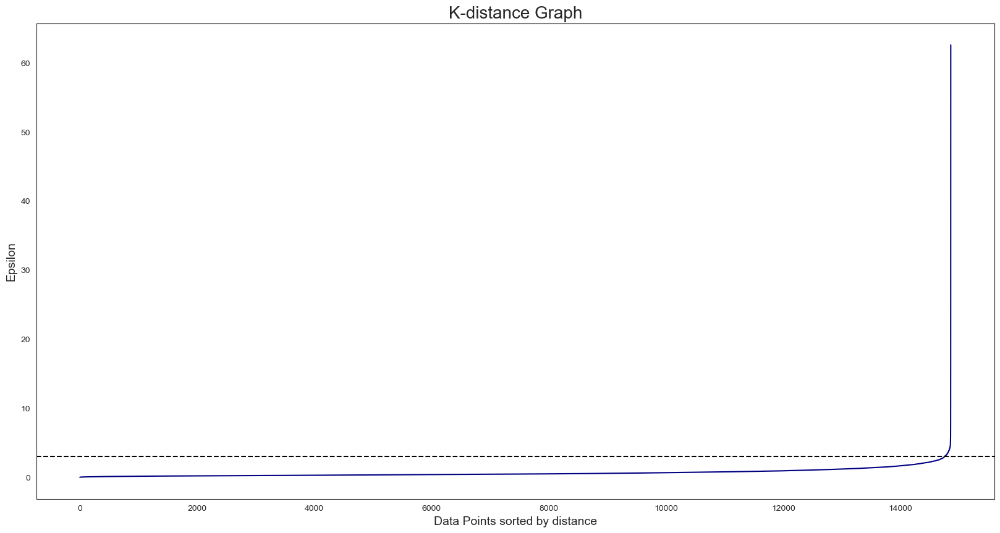

In [168]:
distances = np.sort(distances, axis = 0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances, color = "navy")
plt.axhline(y = 3, color = "black", linestyle = "--") 
plt.title("K-distance Graph", fontsize = 20)
plt.xlabel("Data Points sorted by distance", fontsize = 14)
plt.ylabel("Epsilon", fontsize = 14)
plt.show()

In [169]:
dbscan_out = DBSCAN(eps = 3, min_samples = 10).fit(data[metric_features])

In [170]:
outliers_dbscan = data[dbscan_out.labels_ == -1]
outliers_dbscan

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
36,0,-1.384705,-0.511247,5.539019,0,0,1,0,1,0,1,0,0,2.708512,5.725776,-1.769518,-1.218782,-0.042248,2.782735,1,0,3.415264,5.862973,-0.622348,-0.587242,0.916958
69,1,1.664641,-0.046764,1.709805,0,0,0,1,1,0,1,0,0,-0.352276,0.262764,-1.769518,-1.649934,-0.864255,2.051711,0,1,2.128966,5.862973,3.861115,-0.338235,-1.722979
95,1,1.849257,-0.568414,1.143649,0,0,0,0,0,0,0,1,0,4.264272,-0.360532,0.586864,0.890138,6.698209,1.320686,0,0,1.453599,-0.287942,3.137344,-0.355607,-1.722979
96,1,-1.384705,-0.539830,1.207360,0,0,1,0,1,0,1,0,0,0.019754,0.996055,-1.769518,-1.204678,-0.042248,0.589661,0,0,0.814030,5.862973,-0.622348,-0.587242,0.623632
97,1,-0.181518,5.719974,1.418184,0,0,0,1,1,0,0,0,0,-0.538291,-0.103881,-1.769518,-1.204678,-0.864255,2.051711,0,1,1.584854,2.787515,0.817576,0.101871,0.330306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14740,0,-1.384705,-0.218265,-0.445063,0,0,0,0,0,0,0,0,0,-0.538291,-0.103881,-1.769518,-1.204678,-0.699854,-0.872388,0,1,-0.694209,-3.363400,-0.622348,-0.587242,0.623632
14745,0,1.683739,0.274802,2.335039,0,0,1,1,0,0,0,1,0,0.357962,-0.360532,0.586864,0.890138,-0.864255,0.589661,0,1,1.171998,5.862973,2.525241,-0.147136,0.916958
14757,1,0.143151,-0.496955,1.705461,0,0,1,1,0,0,1,1,0,0.882186,-0.103881,0.586864,0.988860,1.930568,1.320686,0,1,1.117109,8.938431,0.892674,0.148198,-1.429652
14808,1,3.650854,-0.532684,4.573310,1,0,0,0,0,0,0,1,0,3.080542,7.045698,0.586864,0.988860,1.766167,2.782735,0,1,3.269690,-0.287942,9.536352,-0.355607,1.503611


In [171]:
outliers_dbscan.shape

(245, 26)

In [172]:
data = data[~data.index.isin(outliers_dbscan.index)]
data.shape

(14612, 26)

<div class="alert alert-block alert-success">

<a class="anchor" id="36th-bullet">    </a>
# 8. Clustering
    

    
</div>

[Return to Index](#index)

<hr>
<a class = "anchor" id = "37th-bullet">

## 8.1. Defining Perspectives

</a>
</div>

[Return to Index](#index)

In [173]:
df_activities = data[["AthleticsActivities", "WaterActivities", "FitnessActivities", "OtherActivities", "SpecialActivities", "CombatActivities",
"RacketActivities", "TeamActivities", "TotalNumberActivities"]]

df_value = data[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals']]

df_time = data[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays']]

In [174]:
metric_features = [
    'Income','DaysWithoutFrequency','LifetimeValue','NumberOfFrequencies','AttendedClasses','AllowedWeeklyVisitsBySLA',
    'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals','EnrolledDays','TotalIncomeDuringEnrollment',
    'PercentageIncomeSpent','TotalNumberActivities'
    
]
categorical_features = [
    'Gender', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'OtherActivities', 
    'SpecialActivities', 'CombatActivities', 'RacketActivities', 'TeamActivities',
    'HasReferences', 'Dropout','Starting_Month'
]
date_features = [
    'EnrollmentStart', 'EnrollmentFinish', 'DateLastVisit',
    'BirthYear', 'YearOfEnrollment'
]

<hr>
<a class = "anchor" id = "38th-bullet">

## 8.2. Activities View

</a>
</div>

[Return to Index](#index)

<hr>
<a class = "anchor" id = "39th-bullet">

### 8.2.1. K-Modes

</a>
</div>

[Return to Index](#index)

https://medium.com/@reddyyashu20/k-means-kmodes-and-k-prototype-76537d84a669

"K-modes is a clustering algorithm that is similar to k-means, but is specifically designed for categorical data. Instead of calculating distances between numerical values, it calculates the number of mismatches between categorical values."

https://www.geeksforgeeks.org/k-mode-clustering-in-python/

"K-mode clustering is an unsupervised machine-learning technique used to group a set of data objects into a specified number of clusters, based on their categorical attributes. The algorithm is called “K-Mode” because it uses modes (i.e. the most frequent values) instead of means or medians to represent the clusters. <br>
K-modes is an algorithm for clustering categorical data. It is used to partition a dataset into a specified number of clusters, where each cluster is characterized by a mode, which is the most frequent categorical value in the cluster. <br>
Similarity and dissimilarity measurements are used to determine the distance between the data objects in the dataset. In the case of K-modes, these distances are calculated using a dissimilarity measure called the Hamming distance. The Hamming distance between two data objects is the number of categorical attributes that differ between the two objects."

https://medium.com/geekculture/the-k-modes-as-clustering-algorithm-for-categorical-data-type-bcde8f95efd7

"In the real world, the data might be having different data types, such as numerical and categorical data. To perform a certain analysis, for instance, clustering analysis, we should consider the data type in the data we have. The clustering algorithm commonly used in clustering techniques and efficiently used for large data is k-Means. But, it only works for the numerical data. It’s actually not suitable for the data that contains the categorical data type. So, Huang proposed an algorithm called k-Modes which is created in order to handle clustering algorithms with the categorical data type."

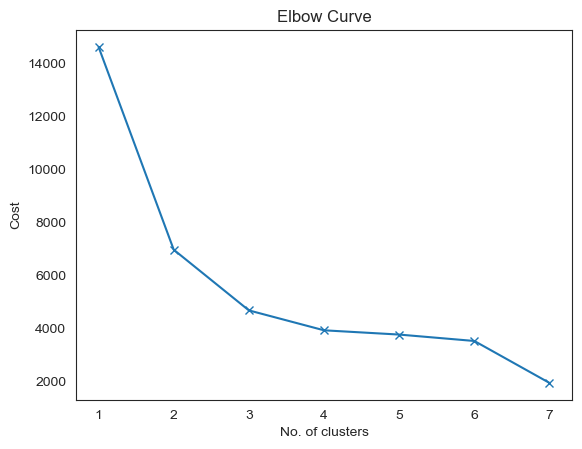

In [175]:
sns.set_style("white")

# Elbow curve to find optimal K 
cost = [] 
K = range(1,8)

for k in list(K): 
    kmodes = KModes(n_clusters = k, init = "random", n_init = 5, random_state = 0) 
    kmodes.fit_predict(df_activities) 
    cost.append(kmodes.cost_) 
      
plt.plot(K, cost, 'x-') 
plt.xlabel('No. of clusters') 
plt.ylabel('Cost') 
plt.title('Elbow Curve') 
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.5453913536906086
For n_clusters = 3, the average silhouette_score is : 0.6399279361777467
For n_clusters = 4, the average silhouette_score is : 0.6776667067133368
For n_clusters = 5, the average silhouette_score is : 0.8298646500789344
For n_clusters = 6, the average silhouette_score is : 0.7756566949359096
For n_clusters = 7, the average silhouette_score is : 0.8916977324687924


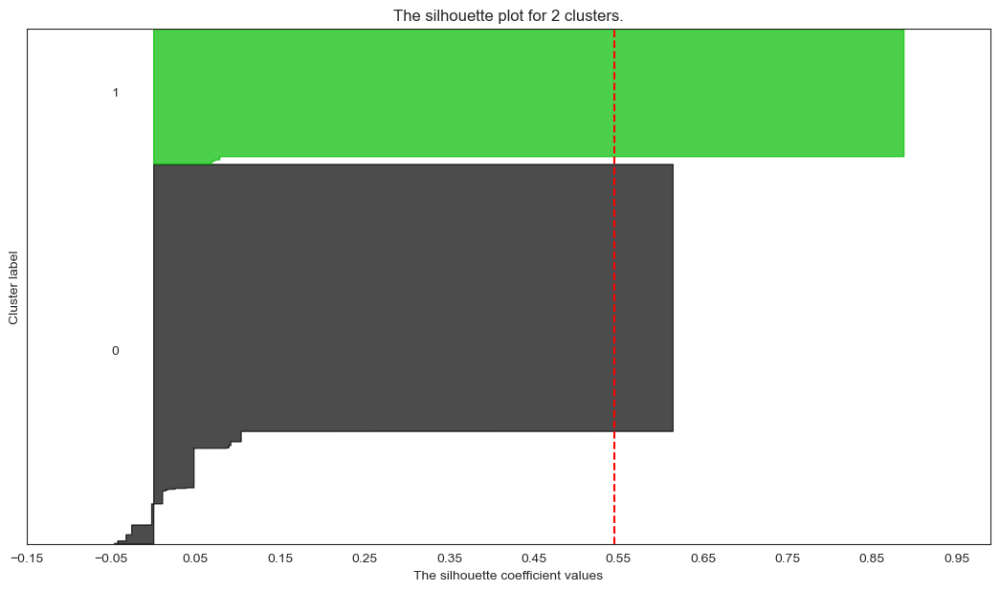

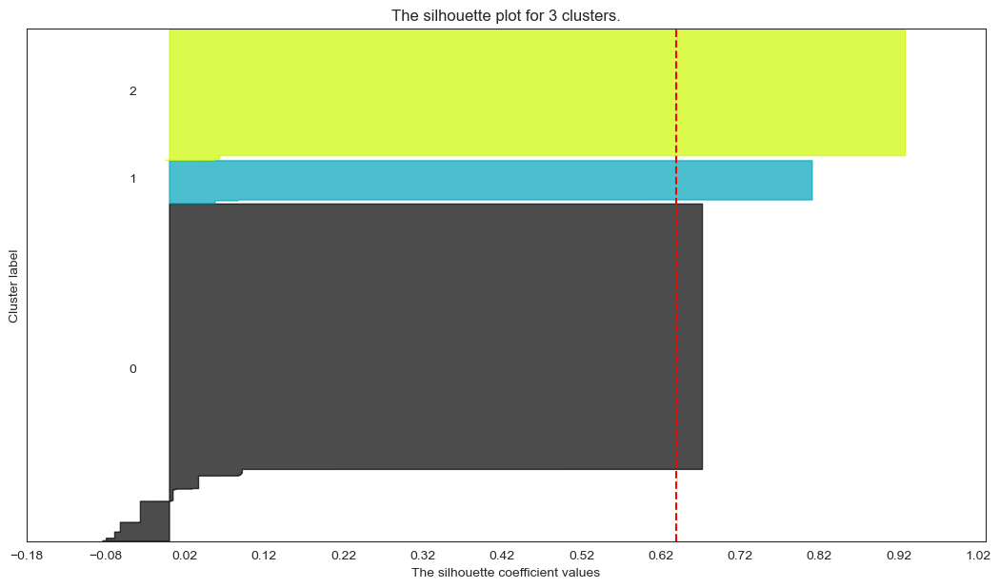

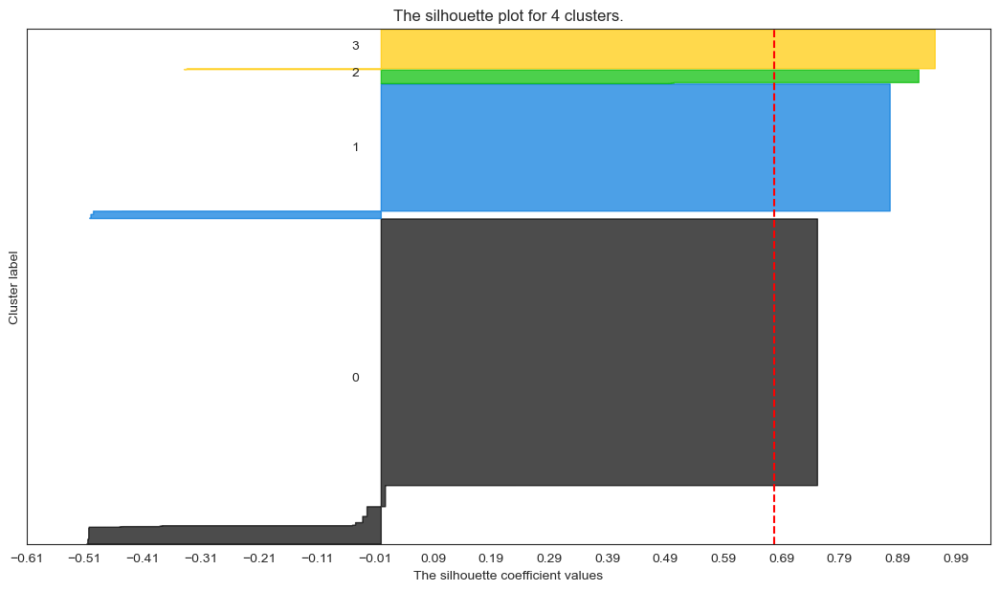

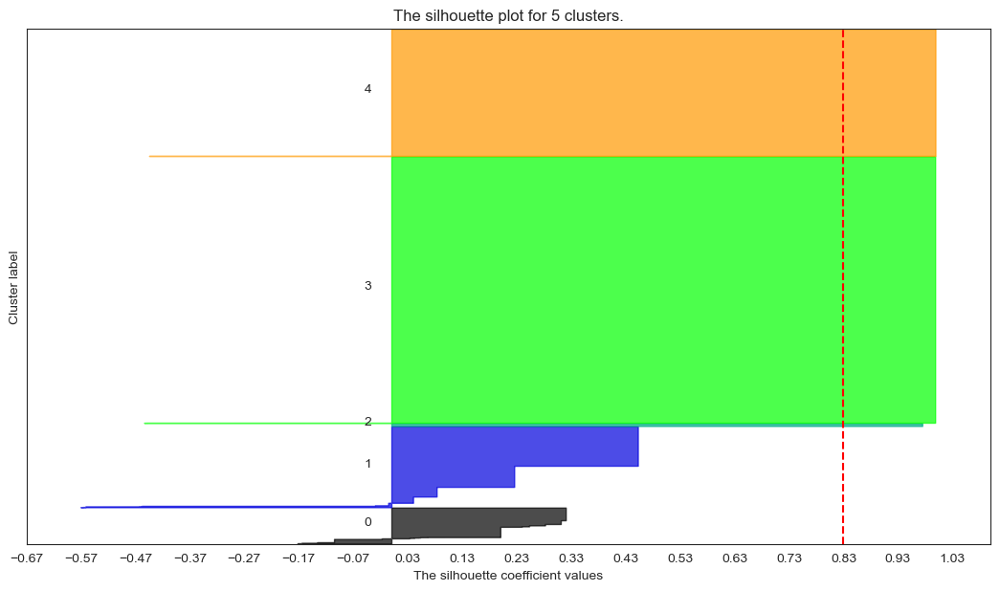

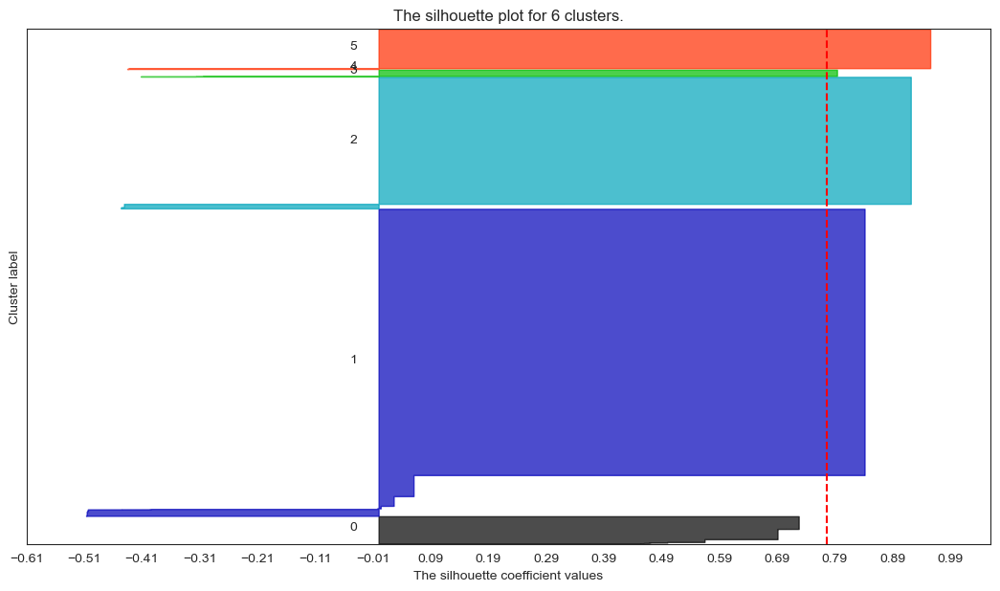

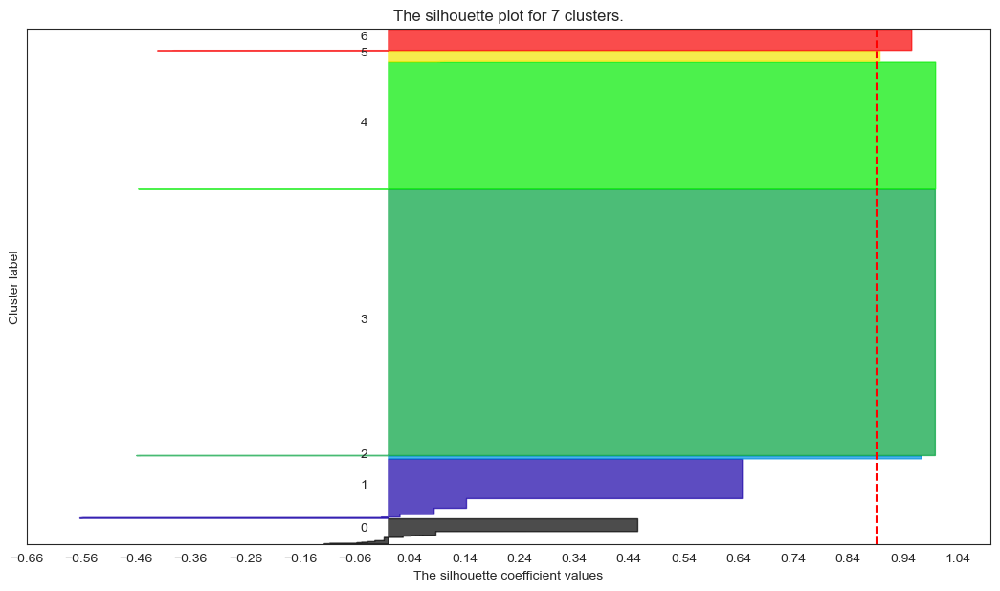

In [176]:
range_clusters = range(1, 8)

avg_silhouette = []
for nclus in range_clusters:
    if nclus == 1:
        continue
    
    fig = plt.figure(figsize=(13, 7))
    
    kmodes = KModes(n_clusters = nclus, init = "random", n_init = 5, random_state = 0)
    cluster_labels = kmodes.fit_predict(df_activities)

    silhouette_avg = silhouette_score(df_activities, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    sample_silhouette_values = silhouette_samples(df_activities, cluster_labels)

    y_lower = 10
    for i in range(nclus):
    
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title(f"The silhouette plot for {nclus} clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")
    
    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_activities) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

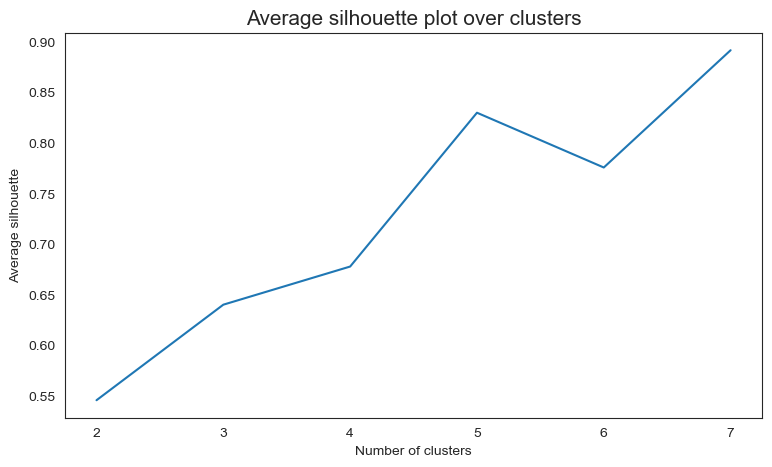

In [177]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters[1:], avg_silhouette)

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size = 15)
plt.show()

From the plots above, we can see that there are between 2 and 4 clusters. 5 already seems to start being too much, but we will try it nevertheless.

In [178]:
# Results with 2 clusters
kmodes2 = KModes(n_clusters = 2, init = "random", n_init = 5, random_state = 0) 
kmodes2_labels = kmodes2.fit_predict(df_activities) 
kmodes2_labels

array([0, 0, 0, ..., 0, 1, 0], dtype=uint16)

In [179]:
df_activities_concat = pd.concat((df_activities, pd.Series(kmodes2_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.008439,0.036168,0.785588,0.002411,0.029213,0.136326,0.029862,0.062969,-0.008148
1,0.002612,1.000000,0.000000,0.000000,0.004440,0.021154,0.003134,0.024549,-0.116057


In [180]:
df_activities_concat["labels"].value_counts()

labels
0    10783
1     3829
Name: count, dtype: int64

In [181]:
def get_ss(data):
        ss = np.sum(data.var() * (data.count() - 1))
        return ss  # return sum of sum of squares of each df variable

In [182]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3088


__Profiling__:
* Cluster 0: There are more people in this cluster taking fitness activities, but also tend to take more of the other activities (except for water) when compared to the other cluster. Most people in our dataset belong to this cluster.
* Cluster 1: Everyone in this cluster takes water activities, and no-one takes neither fitness nor other activities. Here, users tend to take less classes when compared to the other cluster. This cluster takes a minority of the people in our dataset.

In [183]:
# Results with 3 clusters
kmodes3 = KModes(n_clusters = 3, init = "random", n_init = 5, random_state = 0) 
kmodes3_labels = kmodes3.fit_predict(df_activities) 
kmodes3_labels

array([0, 0, 0, ..., 0, 2, 0], dtype=uint16)

In [184]:
df_activities_concat = pd.concat((df_activities, pd.Series(kmodes3_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.009339,0.040469,0.879008,0.002698,0.032479,0.03362,0.032894,0.068694,0.017146
1,0.000815,0.066015,0.000000,0.000000,0.001630,1.00000,0.004075,0.014670,-0.019749
2,0.002668,1.000000,0.000000,0.000000,0.004536,0.00000,0.003202,0.024813,-0.179629


In [185]:
df_activities_concat["labels"].value_counts()

labels
0    9637
2    3748
1    1227
Name: count, dtype: int64

In [186]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5448


__Profiling__:
* Cluster 0: Most people in this cluster take fitness activities. Nevertheless, it is the most balanced cluster, where people take more and more diverse activities overall. Most people in our dataset belong to this cluster.
* Cluster 1: All people in this cluster take part in combat activities, and no-one participates in neither fitness nor other activities. This cluster represents only a minority of the people in our dataset.
* Cluster 2: All people in this cluster take part in water activities, and no-one participates in neither fitness, other, nor combat activities. Overall, this is the cluster where people tend to take less activities.

In [187]:
# Results with 4 clusters
kmodes4 = KModes(n_clusters = 4, init = "random", n_init = 5, random_state = 0) 
kmodes4_labels = kmodes4.fit_predict(df_activities) 
kmodes4_labels

array([0, 0, 0, ..., 0, 1, 0], dtype=uint16)

In [188]:
df_activities_concat = pd.concat((df_activities, pd.Series(kmodes4_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.009733,0.0,0.873905,0.002812,0.032876,0.033200,0.034281,0.071374,-0.109009
1,0.002612,1.0,0.000000,0.000000,0.004440,0.021154,0.003134,0.024549,-0.116057
2,0.000000,1.0,1.000000,0.000000,0.023077,0.043590,0.000000,0.005128,3.008317
3,0.000873,0.0,0.000000,0.000000,0.001745,1.000000,0.004363,0.014834,-0.220851


In [189]:
df_activities_concat["labels"].value_counts()

labels
0    9247
1    3829
3    1146
2     390
Name: count, dtype: int64

In [190]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.6735


__Profiling__:
* Cluster 0: Most people in this cluster take part in fitness activities, but this is also the one that has the most variety of activities taken (except for water). The majority of the users in our dataset belong to this cluster.
* Cluster 1: Everyone in this cluster takes part in water activities, but no-one takes neither fitness nor other activities. This is the second most representative cluster in this partition.
* Cluster 2: This cluster has its main focus on the people that take both fitness and water activities. Some of these people also take other activities besides these two (except for athletics, other and racket activities), making this the cluster where users take, on average, the most activities. This cluster is the less representative, only encompassing 390 students.
* Cluster 3: This is the first cluster (in this partition) where no-one takes water or fitness activities. In contrast, everyone here takes combat activities. On average, this is the cluster where people take less activities overall.

In [191]:
# Results with 5 clusters
kmodes5 = KModes(n_clusters = 5, init = "random", n_init = 5, random_state = 0) 
kmodes5_labels = kmodes5.fit_predict(df_activities) 
kmodes5_labels

array([3, 1, 3, ..., 3, 4, 3], dtype=uint16)

In [192]:
df_activities_concat = pd.concat((df_activities, pd.Series(kmodes5_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.023438,0.507812,0.848633,0.010742,0.144531,0.302734,0.048828,0.140625,2.871610
1,0.033464,0.000000,0.006084,0.006519,0.079096,0.504129,0.122555,0.271186,-0.217104
2,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.012346,2.825484
3,0.000000,0.000000,1.000000,0.000000,0.000132,0.000000,0.000264,0.000395,-0.285511
4,0.000000,1.000000,0.000000,0.000000,0.000276,0.000000,0.000000,0.000276,-0.286242


In [193]:
df_activities_concat["labels"].value_counts()

labels
3    7588
4    3618
1    2301
0    1024
2      81
Name: count, dtype: int64

In [194]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9120


Even though this solution with 5 clusters returns a very high r2 score, the last two clusters have very few people in them (Cluster 2 only has 81), so it might not make sense to split our users that much.

__Profiling__:
* Cluster 0: This is the most diverse cluster in terms of activities taken, where all activities are represented by someone taking them. Also, this is the cluster where people tend to take more activities. Nonetheless, it is one of least represantive clusters, only behind Cluster 0.
* Cluster 1: This cluster is mainly focused on people taking combat activities (around half of the users here take it). In contrast no-one takes water activities.
* Cluster 2: All people here take part in both water and combat activities, and some of them also participate in team activities. It is the second cluster where most activities tend to be taken overall, but has the major downside of representing very few people in our dataset.
* Cluster 3: Everyone in this cluster participates in fitness activities. Besides, some of them (a very small number, though) also take part in special, racket and team activities. This is the most representative cluster in this partition.
* Cluster 4: This cluster is mainly focused on people taking water activities. A very small number also takes special and team activities. This is the second most representative cluster.

Let's compare the distribution of the values for 2 and 3 clusters, and then for 4 and 5 clusters.

In [195]:
df_activities_concat_2_3 = pd.concat((data, pd.Series(kmodes2_labels, name = "2_labels", index = df_activities.index),
                                      pd.Series(kmodes3_labels, name = "3_labels", index = df_activities.index)), axis=1)

pd.crosstab(df_activities_concat_2_3['2_labels'], df_activities_concat_2_3['3_labels'])

3_labels,0,1,2
2_labels,,,
0,9637,1146,0
1,0,81,3748


In [196]:
df_activities_concat_4_5 = pd.concat((data, pd.Series(kmodes4_labels, name = "4_labels", index = df_activities.index),
                                      pd.Series(kmodes5_labels, name = "5_labels", index = df_activities.index)), axis=1)

pd.crosstab(df_activities_concat_4_5['4_labels'], df_activities_concat_4_5['5_labels'])

5_labels,0,1,2,3,4
4_labels,,,,,
0,504,1155,0,7588,0
1,130,0,81,0,3618
2,390,0,0,0,0
3,0,1146,0,0,0


Lastly, let's group the 3 cluster labels obtained by using different values for k and visualize the profiles of these solutions.

In [197]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set_style("white")
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.5, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [198]:
df_activities_concat = pd.concat((df_activities, pd.Series(kmodes2_labels, name = "2_labels", index = df_activities.index),
                                  pd.Series(kmodes3_labels, name = "3_labels", index = df_activities.index),
                                  pd.Series(kmodes4_labels, name = "4_labels", index = df_activities.index),
                                  pd.Series(kmodes5_labels, name = "5_labels", index = df_activities.index)), axis=1)

df_activities_concat.head()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities,2_labels,3_labels,4_labels,5_labels
0,0,0,1,0,0,0,0,0,-0.287942,0,0,0,3
1,0,0,0,0,1,0,0,0,-0.287942,0,0,0,1
2,0,0,1,0,0,0,0,0,-0.287942,0,0,0,3
3,0,0,0,0,0,0,0,1,-0.287942,0,0,0,1
4,0,0,1,0,0,0,0,0,-0.287942,0,0,0,3


findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=13.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\Da

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LHANDW.TTF', name='Lucida Handwriting', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', name='Berlin Sans FB Demi', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\arialbd.ttf', nam

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCHLBKI.TTF', name='Century Schoolbook', style='ita

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\TCM_____.TTF', name='Tw Cen MT', style='normal', variant='normal', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\RAGE.TTF', name='Rage Italic', style='italic', variant='norma

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 3.43
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUniBol.ttf', name='ST

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.43
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizFourSymReg.ttf', name='STIXSizeFourSym', style='no

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mvboli.ttf', name='MV Boli', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', varian

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNBI.TTF', name='Arial', style='italic', variant='normal', weight=700, stretch='condensed', size='scalable')) = 1.345
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', we

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LG_Smart_UI-Regular.ttf', name='LG Smart UI', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.5345
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Candarab.ttf', name='Candara', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\pala.ttf', name='Palatino Linotype', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.63
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='norm

findfont: Matching sans\-serif:style=normal:variant=normal:weight=heavy:stretch=normal:size=13.0 to Arial ('C:\\Windows\\Fonts\\arialbd.ttf') with score of 0.145000.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=23.0.
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymReg.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Oblique.ttf', name='DejaVu S

findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSerif-Italic.ttf', name='DejaVu Serif', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 2.05
findfont: score(FontEntry(fname='C:\\Users\\alex0\\anaconda3\\envs\\DataMiningProject\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmss10.ttf', name='cmss10', style='norm

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_PSTC.TTF', name='Bodoni MT', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\consolab.ttf', name='Consolas', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MOD20.TTF', name='Modern No. 20', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BSSYM7.TTF', name='Bookshelf Symbol 7', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguiemj.ttf', name='Segoe UI Emoji', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LEELAWDB.TTF', name='Leelawadee', style='normal', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mvboli.ttf', name='MV Boli', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjh.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADM.TTF', name='Franklin Gothic Demi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbi.ttf', name='Courier New', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILB____.TTF', name='Gill Sans MT', style='normal', varian

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALNBI.TTF', name='Arial', style='italic', variant='normal', weight=700, stretch='condensed', size='scalable')) = 1.535
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\courbd.ttf', name='Courier New', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanai.ttf', name='Verdana', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIL_____.TTF', name='Gill Sans MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAI.TTF', name='Bodoni MT', style='italic', variant='normal', weight=900, stretch='normal', size='scalable')) = 11.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ALGER.TTF', name='Algerian', style='normal', variant='normal', we

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LG_Smart_UI-Regular.ttf', name='LG Smart UI', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msjhl.ttc', name='Microsoft JhengHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Users\\alex0\\AppData\\Local\\Microsoft\\Windows\\Fonts\\phosphor.ttf', name='Phosphor', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CENTAUR.TTF', name='Centaur', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BRLNSDB.TTF', 

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Candarab.ttf', name='Candara', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ROCKEB.TTF', name='Rockwell Extra Bold', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\cambriab.ttf', name='Cambria', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\verdanab.ttf', name='Verdana', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', var

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\pala.ttf', name='Palatino Linotype', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\georgiaz.ttf', name='Georgia', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbell.ttf', name='Corbel', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ARIALN.TTF', name='Arial', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 0.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HARNGTON.TTF', name='Harrington', style='normal', variant='norma

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LSANSI.TTF', name='Lucida Sans', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BROADW.TTF', name='Broadway', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunbd.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisb.ttf', name='Segoe UI', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\HATTEN.TTF', name='Haettenschweiler', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTB.TTF', name='Calisto MT', style='normal', variant='norm

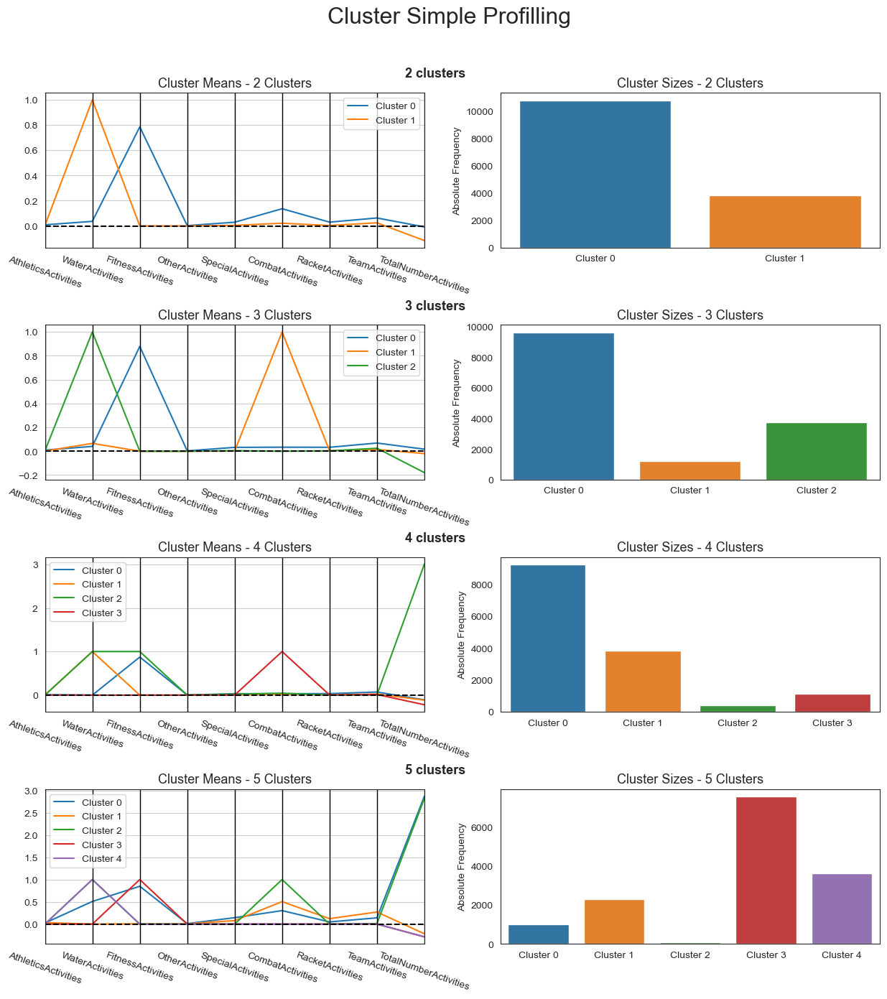

In [199]:
cluster_profiles(
    df = df_activities_concat, 
    label_columns = ['2_labels', '3_labels', '4_labels', '5_labels'], 
    figsize = (15, 15), 
    compar_titles = ["2 clusters", "3 clusters", "4 clusters", "5 clusters"]
)

### Using grouped activities

Now that we have identified 3 main activities (Water, Fitness and Combat), let's retry the clustering, this time grouping all the remaining activities into the "Other" category.

In [200]:
df_activities2 = df_activities.copy()

In [201]:
df_activities2['OtherActivities'] = df_activities2[['AthleticsActivities', 'OtherActivities', 'SpecialActivities', 'RacketActivities', 'TeamActivities']].any(axis = 1).astype('int8')
df_activities2.drop(columns = {'AthleticsActivities', 'SpecialActivities', 'RacketActivities', 'TeamActivities'}, inplace = True)

In [202]:
df_activities2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14612 entries, 0 to 14856
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   WaterActivities        14612 non-null  int8   
 1   FitnessActivities      14612 non-null  int8   
 2   OtherActivities        14612 non-null  int8   
 3   CombatActivities       14612 non-null  int8   
 4   TotalNumberActivities  14612 non-null  float64
dtypes: float64(1), int8(4)
memory usage: 285.4 KB


Now, we will execute the same code as before, and compare the different solutions and profiles of the clusters.

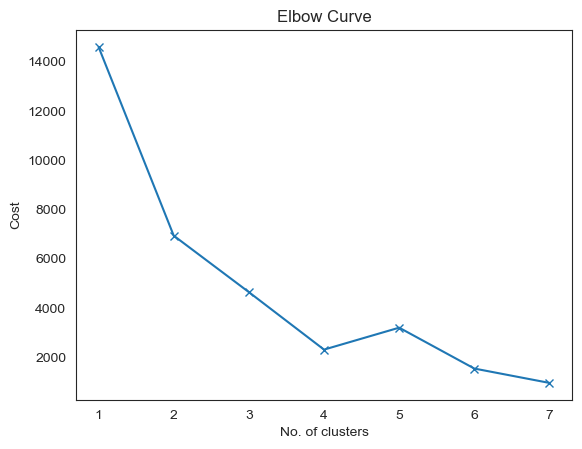

In [203]:
# Elbow curve to find optimal K 
cost = [] 
K = range(1,8)

for k in list(K): 
    kmodes = KModes(n_clusters = k, init = "random", n_init = 5, random_state = 0) 
    kmodes.fit_predict(df_activities2) 
    cost.append(kmodes.cost_) 
      
plt.plot(K, cost, 'x-') 
plt.xlabel('No. of clusters') 
plt.ylabel('Cost') 
plt.title('Elbow Curve') 
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.5881136209281822
For n_clusters = 3, the average silhouette_score is : 0.6396308133910192
For n_clusters = 4, the average silhouette_score is : 0.7583841868501268
For n_clusters = 5, the average silhouette_score is : 0.7699753477587551
For n_clusters = 6, the average silhouette_score is : 0.8895000962945943
For n_clusters = 7, the average silhouette_score is : 0.9260616543293527


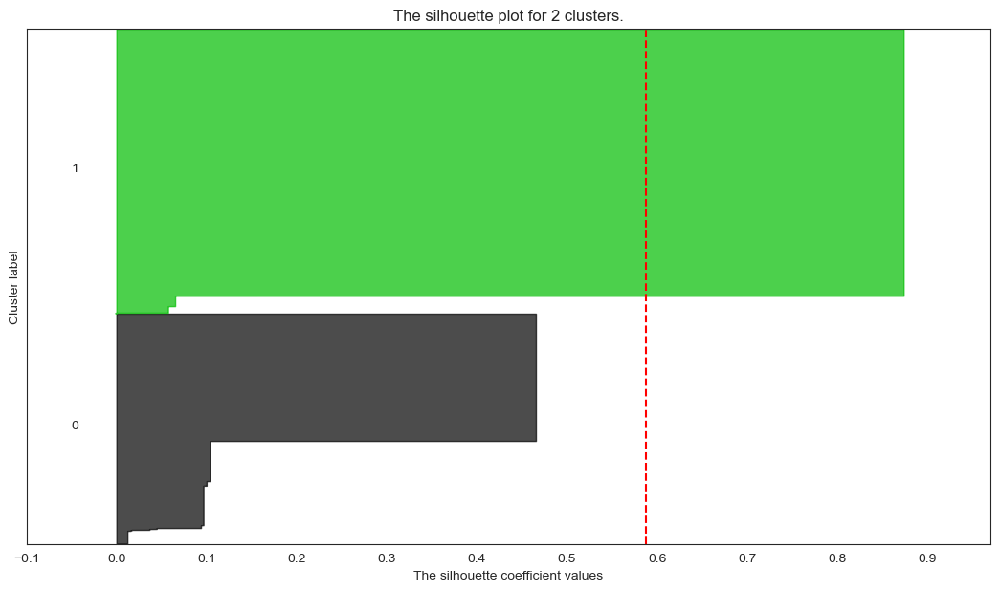

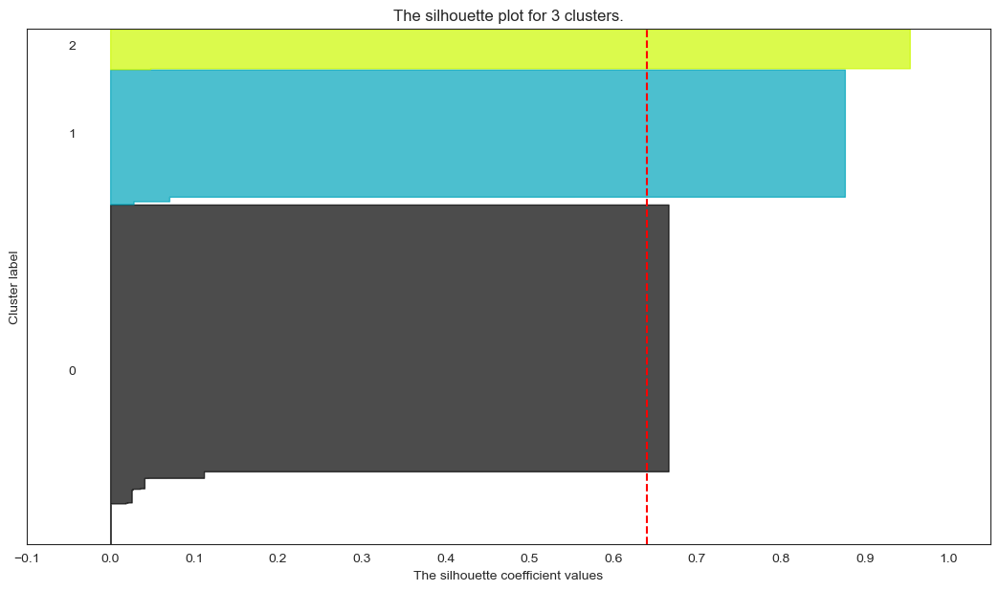

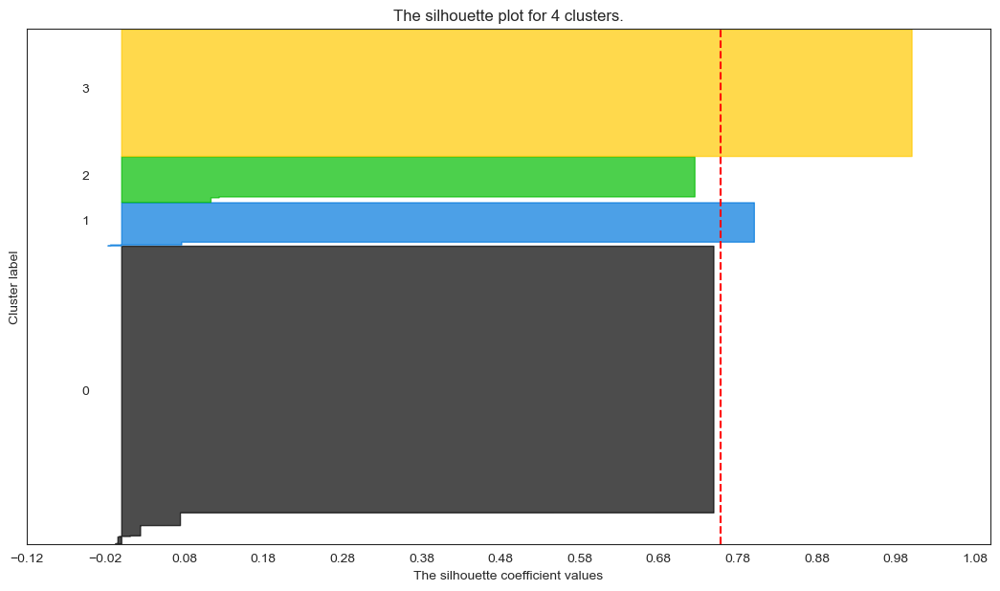

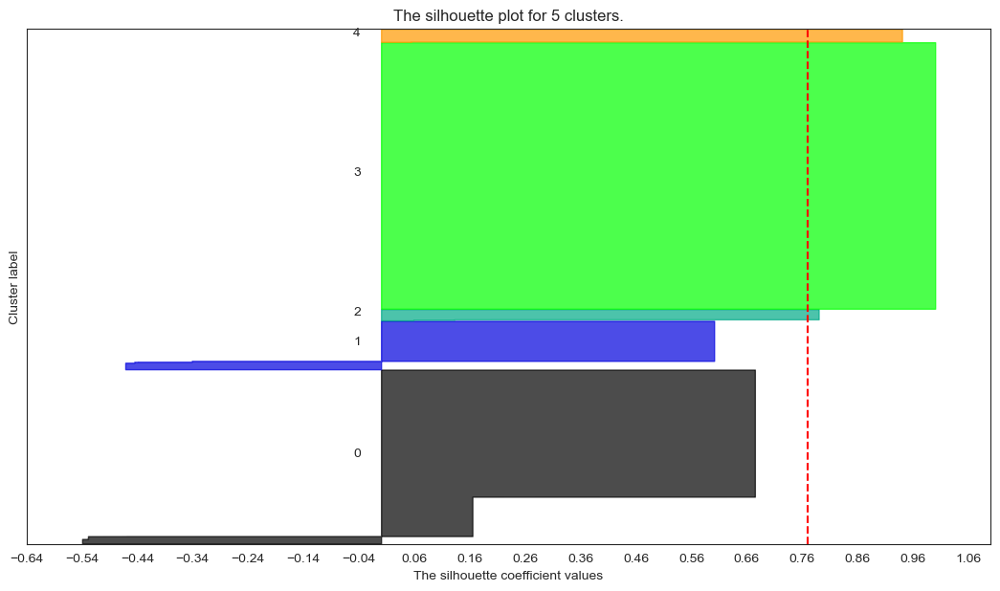

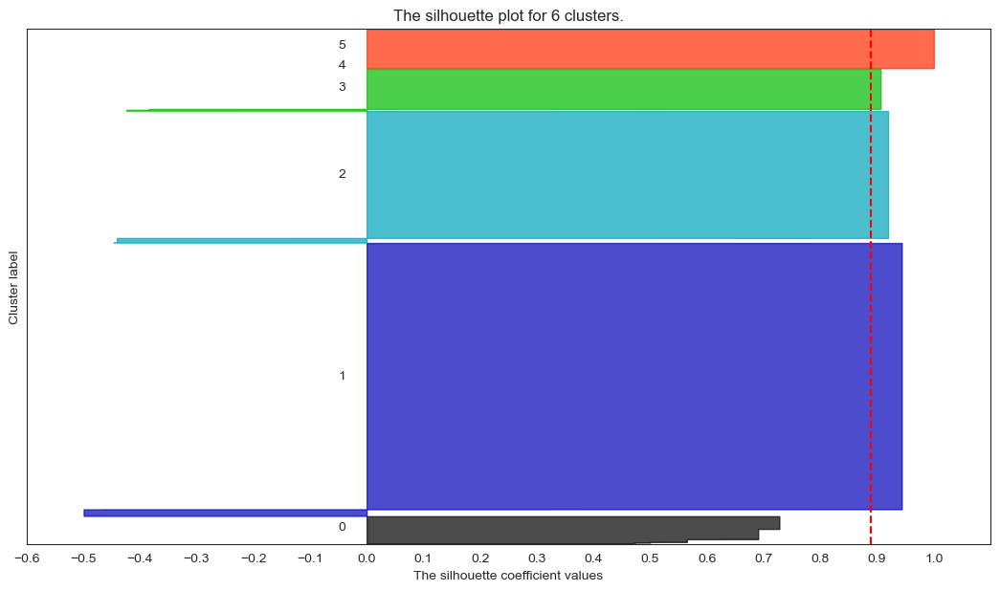

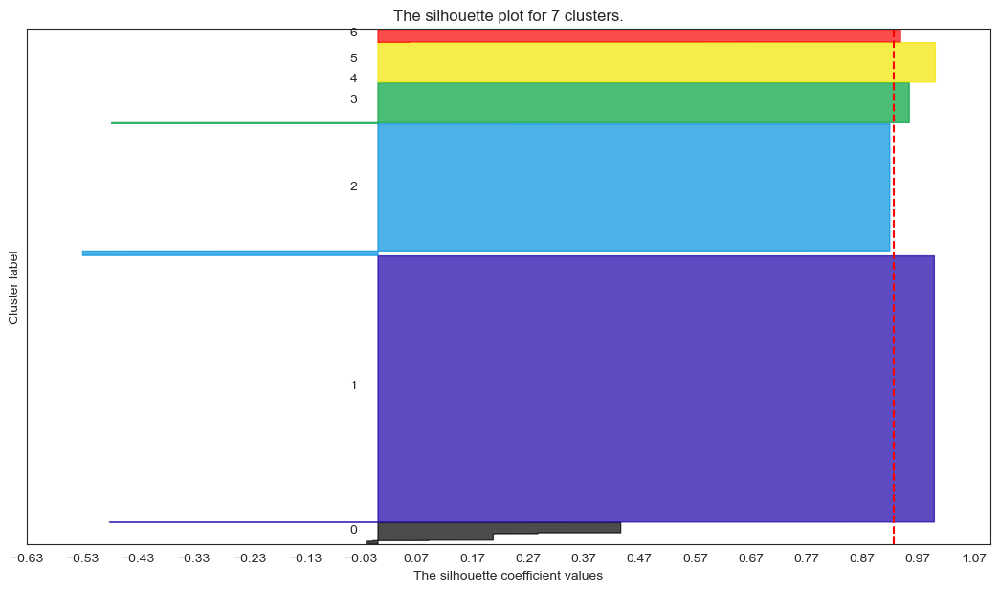

In [204]:
range_clusters = range(1, 8)

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))
    
    kmodes = KModes(n_clusters = nclus, init = "random", n_init = 5, random_state = 0)
    cluster_labels = kmodes.fit_predict(df_activities2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_activities2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_activities2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title(f"The silhouette plot for {nclus} clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")
    
    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_activities2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

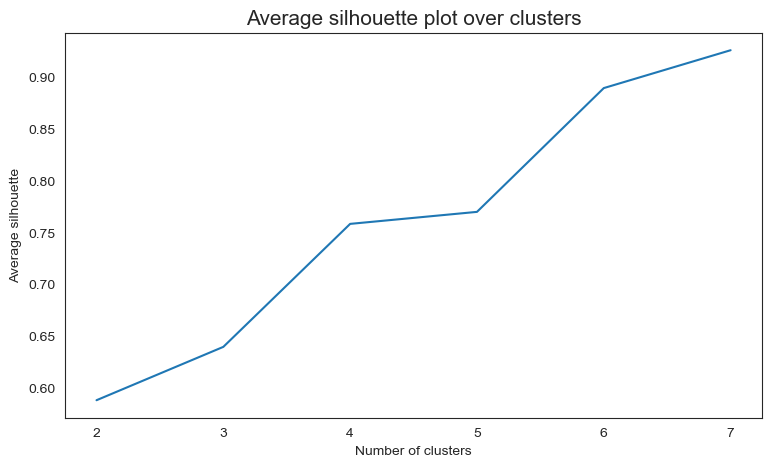

In [205]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters[1:], avg_silhouette)

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size = 15)
plt.show()

Same as before, we will try to run K-Modes for 2, 3, 4 and 5 clusters.

In [206]:
# Results with 2 clusters
kmodes2_v2 = KModes(n_clusters = 2, init = "random", n_init = 5, random_state = 0) 
kmodes2_v2_labels = kmodes2_v2.fit_predict(df_activities2) 
kmodes2_v2_labels

array([1, 0, 1, ..., 1, 0, 1], dtype=uint16)

In [207]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kmodes2_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.645996,0.059715,0.204257,0.190476,0.033212
1,0.000000,1.000000,0.025121,0.037990,-0.092706


In [208]:
df_activities2_concat["labels"].value_counts()

labels
1    8081
0    6531
Name: count, dtype: int64

In [209]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3541


__Profiling__:
* Cluster 0: Most people in this cluster take water activities, but they are also more keen to participate in combat or other activities. This is the most representative cluster (even though the difference is not as big as it used to be initially) and is also the one where people tend to participate in more diverse activities.
* Cluster 1: Everyone in this cluster participates in fitness activities, and some of them (a very small number) also participate in combat or other activities.

In [210]:
# Results with 3 clusters
kmodes3_v2 = KModes(n_clusters = 3, init = "random", n_init = 5, random_state = 0) 
kmodes3_v2_labels = kmodes3_v2.fit_predict(df_activities2) 
kmodes3_v2_labels

array([0, 0, 0, ..., 0, 1, 0], dtype=uint16)

In [211]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kmodes3_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.040469,0.879008,0.143198,0.033620,0.017146
1,1.000000,0.000000,0.034474,0.021154,-0.116057
2,0.000000,0.000000,0.021815,1.000000,-0.220851


In [212]:
df_activities2_concat["labels"].value_counts()

labels
0    9637
1    3829
2    1146
Name: count, dtype: int64

In [213]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.4590


__Profiling__:
* Cluster 0: This is the most diverse cluster in terms of number of different activities taken, even though its main focus resides on fitness activities. Most people in our dataset belong to this cluster.
* Cluster 1: Everyone in this cluster participates in water activities, and some of them (a very small number) also participate in combat or other activities.
* Cluster 2: Everyone in this cluster participates in combat activities, and no-one takes part in neither water nor fitness activities. This is the cluster where, on average, the users tend to participate in less activities, and it's also the least representative cluster in this partition.

In [214]:
# Results with 4 clusters
kmodes4_v2 = KModes(n_clusters = 4, init = "random", n_init = 5, random_state = 0) 
kmodes4_v2_labels = kmodes4_v2.fit_predict(df_activities2) 
kmodes4_v2_labels

array([0, 2, 0, ..., 0, 3, 0], dtype=uint16)

In [215]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kmodes4_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.046039,1.0,0.025263,0.038248,0.050064
1,0.066015,0.0,0.021190,1.000000,-0.019749
2,0.101002,0.0,1.000000,0.000000,0.084337
3,1.000000,0.0,0.000000,0.000000,-0.287942


In [216]:
df_activities2_concat["labels"].value_counts()

labels
0    8471
3    3617
2    1297
1    1227
Name: count, dtype: int64

In [217]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.7308


__Profiling__:
* Cluster 0: Everyone in this cluster participates in fitness activities, and this is the only cluster where this activity is taken. Besides, some people also participate in water, other or combat activities. Most people in our dataset belong to this cluster.
* Cluster 1: Everyone in this cluster participates in combat activities and, besides Cluster 0, this is the only cluster where this activity is taken. It's the least representative cluster in this partition, despite being very close to Cluster 2 in this aspect.
* Cluster 2: Everyone in this cluster participates in combat activities and no-one participates in neither fitness nor combat activities. Some of them also participate in water activities. It is, on average, the cluster where people tend to take part in more different activities.
* Cluster 3: Everyone in this cluster participates in water and only water activities. Despite being this specific, it is the second most representative cluster in this partititon.

In [218]:
# Results with 5 clusters
kmodes5_v2 = KModes(n_clusters = 5, init = "random", n_init = 5, random_state = 0) 
kmodes5_v2_labels = kmodes5_v2.fit_predict(df_activities2) 
kmodes5_v2_labels

array([3, 1, 3, ..., 3, 0, 3], dtype=uint16)

In [219]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kmodes5_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.773535,0.000000,0.026667,0.242828,-0.154983
1,0.000000,0.136957,1.000000,0.018116,0.251377
2,0.052469,1.000000,0.043210,1.000000,3.081772
3,0.000000,1.000000,0.000000,0.000000,-0.287942
4,1.000000,1.000000,0.029491,0.000000,2.878212


In [220]:
df_activities2_concat["labels"].value_counts()

labels
3    7585
0    4950
1    1380
4     373
2     324
Name: count, dtype: int64

In [221]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.8723


__Profiling__:
* Cluster 0: The main focus of this cluster is on people taking water activities, but not everyone does it and some of them also participate in other and combat activities. This is the second most representative cluster, and the only one where no-one takes part in fitness activities.
* Cluster 1: Everyone in this cluster participates in other activities, while no-one takes water activities. Some people also take fitness activities, and a very small number participates in combat activities.
* Cluster 2: Everyone in this cluster participates in both fitness and combat activities. Besides, some of them also take water and other activities. Overall, it is the cluster where people tend to take more different activities, but it is also the one that represents the fewest people in this partition.
* Cluster 3: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.
* Cluster 4: Everyone in this cluster takes part in both water and fitness activities, while no-one takes combat activities. Similarly to CLuster 2, it is very under-represented in this partition.

In [222]:
df_activities2_concat_2_3 = pd.concat((data, pd.Series(kmodes2_v2_labels, name = "2_labels", index = df_activities2.index),
                                      pd.Series(kmodes3_v2_labels, name = "3_labels", index = df_activities2.index)), axis=1)

pd.crosstab(df_activities2_concat_2_3['2_labels'], df_activities2_concat_2_3['3_labels'])

3_labels,0,1,2
2_labels,,,
0,1556,3829,1146
1,8081,0,0


In [223]:
df_activities2_concat_4_5 = pd.concat((data, pd.Series(kmodes4_v2_labels, name = "4_labels", index = df_activities2.index),
                                      pd.Series(kmodes5_v2_labels, name = "5_labels", index = df_activities2.index)), axis=1)

pd.crosstab(df_activities2_concat_4_5['4_labels'], df_activities2_concat_4_5['5_labels'])

5_labels,0,1,2,3,4
4_labels,,,,,
0,0,189,324,7585,373
1,1202,25,0,0,0
2,131,1166,0,0,0
3,3617,0,0,0,0


Once again, let's compare the values for each feature obtained through each solution.

In [224]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kmodes2_v2_labels, name = "2_labels", index = df_activities.index),
                                  pd.Series(kmodes3_v2_labels, name = "3_labels", index = df_activities.index),
                                  pd.Series(kmodes4_v2_labels, name = "4_labels", index = df_activities.index),
                                  pd.Series(kmodes5_v2_labels, name = "5_labels", index = df_activities.index)), axis=1)

df_activities2_concat.head()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities,2_labels,3_labels,4_labels,5_labels
0,0,1,0,0,-0.287942,1,0,0,3
1,0,0,1,0,-0.287942,0,0,2,1
2,0,1,0,0,-0.287942,1,0,0,3
3,0,0,1,0,-0.287942,0,0,2,1
4,0,1,0,0,-0.287942,1,0,0,3


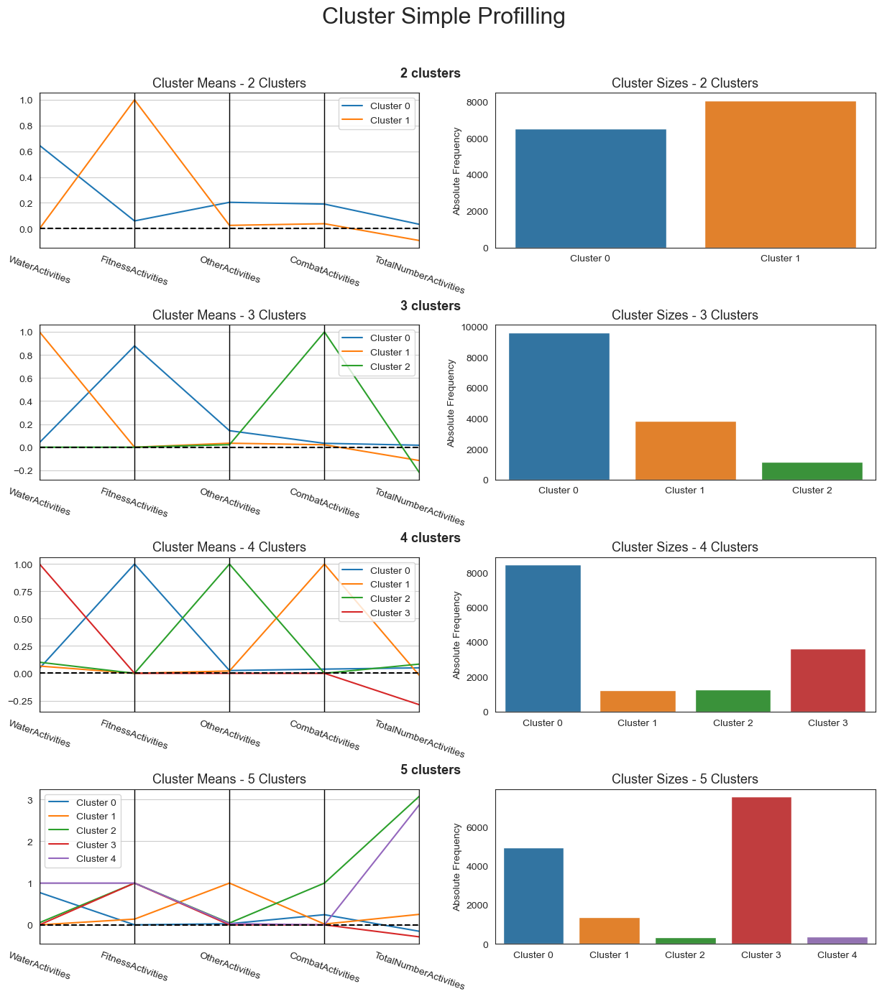

In [225]:
cluster_profiles(
    df = df_activities2_concat, 
    label_columns = ['2_labels', '3_labels', '4_labels', '5_labels'], 
    figsize = (15, 15), 
    compar_titles = ["2 clusters", "3 clusters", "4 clusters", "5 clusters"]
)

<hr>
<a class = "anchor" id = "40th-bullet">

### 8.2.2. K-Prototypes

</a>
</div>

[Return to Index](#index)

https://towardsdatascience.com/the-k-prototype-as-clustering-algorithm-for-mixed-data-type-categorical-and-numerical-fe7c50538ebb

"One of the conventional clustering methods commonly used in clustering techniques and efficiently used for large data is the K-Means algorithm. However, its method is not good and suitable for data that contains categorical variables. This problem happens when the cost function in K-Means is calculated using the Euclidian distance that is only suitable for numerical data. While K-Mode is only suitable for categorical data only, not mixed data types. <br>
Facing these problems, Huang proposed an algorithm called K-Prototype which is created in order to handle clustering algorithms with the mixed data types (numerical and categorical variables). K-Prototype is a clustering method based on partitioning. Its algorithm is an improvement of the K-Means and K-Mode clustering algorithm to handle clustering with the mixed data types."

https://medium.com/@reddyyashu20/k-means-kmodes-and-k-prototype-76537d84a669

"K-prototype is a clustering algorithm that combines k-means with k-modes to handle datasets with both numerical and categorical data. It assigns weights to both types of features and calculates a weighted distance metric to determine cluster assignments."

https://medium.com/@keswani-rohitkumar/k-prototypes-clustering-algorithm-f5d8e09a0104

"K-prototype algorithm is an ensemble of K-means and K-modes clustering algorithms. It uses different distance metrics for numerical data and different distance metrics for categorical datatype. Euclidean and Manhattan distance is used for numerical data and matching_distance is used for categorical data."

In [226]:
df_activities.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14612 entries, 0 to 14856
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   AthleticsActivities    14612 non-null  int8   
 1   WaterActivities        14612 non-null  int8   
 2   FitnessActivities      14612 non-null  int8   
 3   OtherActivities        14612 non-null  int8   
 4   SpecialActivities      14612 non-null  int8   
 5   CombatActivities       14612 non-null  int8   
 6   RacketActivities       14612 non-null  int8   
 7   TeamActivities         14612 non-null  int8   
 8   TotalNumberActivities  14612 non-null  float64
dtypes: float64(1), int8(8)
memory usage: 342.5 KB


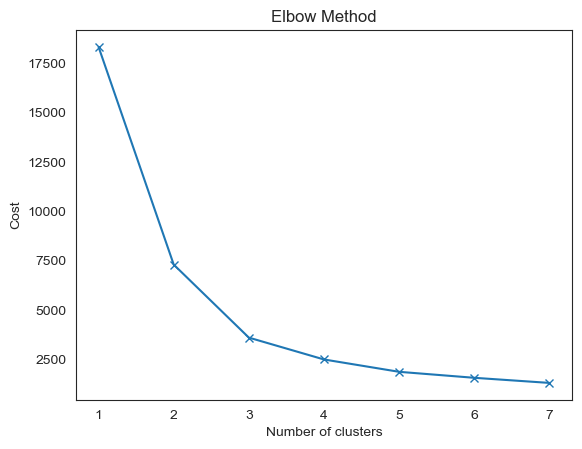

In [227]:
# Elbow curve to find optimal K 
cost = [] 
K = range(1,8)

for k in list(K): 
    kprototypes = KPrototypes(n_clusters = k, random_state = 0) 
    kprototypes.fit_predict(df_activities, categorical = [0, 1]) 
    cost.append(kprototypes.cost_) 
      
plt.plot(K, cost, "x-") 
plt.xlabel("Number of clusters") 
plt.ylabel("Cost") 
plt.title("Elbow Method") 
plt.show()

In [228]:
# Results with 2 clusters
kprototypes2 = KPrototypes(n_clusters = 2, random_state = 0) 
kprototypes2_labels = kprototypes2.fit_predict(df_activities, categorical = [0, 1]) 
kprototypes2_labels

array([1, 1, 1, ..., 1, 1, 1], dtype=uint16)

In [229]:
df_activities_concat = pd.concat((df_activities, pd.Series(kprototypes2_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.025261,0.524390,0.771777,0.009582,0.135017,0.374564,0.050523,0.149826,2.913427
1,0.005348,0.268642,0.563354,0.001114,0.013146,0.083259,0.020499,0.044638,-0.287942


In [230]:
df_activities_concat["labels"].value_counts()

labels
1    13464
0     1148
Name: count, dtype: int64

In [231]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5570


__Profiling__:
* Cluster 0: The majority of the people belonging to this cluster participates in either water or fitness activities (or both). On average, these users tend to take part in more activities than those in Cluster 1. This cluster represents only a small part of the users in our database.
* Cluster 1: People belonging to this cluster tend to be enrolled in fewer activities. The majority of them participates in fitness activities. Most of the users in our database belong to this cluster.

In [232]:
# Results with 3 clusters
kprototypes3 = KPrototypes(n_clusters = 3, random_state = 0) 
kprototypes3_labels = kprototypes3.fit_predict(df_activities, categorical = [0, 1]) 
kprototypes3_labels

array([1, 0, 1, ..., 1, 0, 1], dtype=uint16)

In [233]:
df_activities_concat = pd.concat((df_activities, pd.Series(kprototypes3_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.012247,0.615241,0.000000,0.002551,0.030107,0.190679,0.046947,0.102228,-0.287942
1,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.287942
2,0.025261,0.524390,0.771777,0.009582,0.135017,0.374564,0.050523,0.149826,2.913427


In [234]:
df_activities_concat["labels"].value_counts()

labels
1    7585
0    5879
2    1148
Name: count, dtype: int64

In [235]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.8124


__Profiling__:
* Cluster 0: The majority of the people belonging to this cluster take water activities, while no-one participates in fitness activities. This is the second most represented cluster in this partition.
* Cluster 1: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.
* Cluster 2: People in this cluster tend to enroll in the most activities. The majority of them participates in water and fitness activities, but combat activities are also well represented.

In [236]:
# Results with 4 clusters
kprototypes4 = KPrototypes(n_clusters = 4, random_state = 0) 
kprototypes4_labels = kprototypes4.fit_predict(df_activities, categorical = [0, 1]) 
kprototypes4_labels

array([0, 1, 0, ..., 0, 1, 0], dtype=uint16)

In [237]:
df_activities_concat = pd.concat((df_activities, pd.Series(kprototypes4_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.287942
1,0.015132,0.760193,0.000000,0.003153,0.037201,0.000000,0.058008,0.126314,-0.287942
2,0.025261,0.524390,0.771777,0.009582,0.135017,0.374564,0.050523,0.149826,2.913427
3,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.287942


In [238]:
df_activities_concat["labels"].value_counts()

labels
0    7585
1    4758
2    1148
3    1121
Name: count, dtype: int64

In [239]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.8941


__Profiling__:
* Cluster 0: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.
* Cluster 1: This cluster is focused in the people who are taking water activities. However, the other activities (except for fitness and combat activities) are also represented. It is the second most representated cluster in this partition.
* Cluster 2: This cluster contains people who tend to participate in the most activities. All activities are represented in this cluster, despite water, fitness and combat being the most prominent.
* Cluster 3: Everyone in this cluster participates in combat and only combat activities. It is the least represented cluster in this partition, but it is not very far from Cluster 2 in this aspect.

In [240]:
# Results with 5 clusters
kprototypes5 = KPrototypes(n_clusters = 5, random_state = 0) 
kprototypes5_labels = kprototypes5.fit_predict(df_activities, categorical = [0, 1]) 
kprototypes5_labels

array([1, 2, 1, ..., 1, 2, 1], dtype=uint16)

In [241]:
df_activities_concat = pd.concat((df_activities, pd.Series(kprototypes5_labels, name = "labels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("labels").mean()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities
labels,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.287942
1,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.287942
2,0.017320,0.870099,0.000000,0.003608,0.042579,0.000000,0.066394,0.000000,-0.287942
3,0.025261,0.524390,0.771777,0.009582,0.135017,0.374564,0.050523,0.149826,2.913427
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-0.287942


In [242]:
df_activities_concat["labels"].value_counts()

labels
1    7585
2    4157
3    1148
0    1121
4     601
Name: count, dtype: int64

In [243]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9219


__Profiling__:
* Cluster 0: Everyone in this cluster participates in combat and only combat activities. It is one of the least-represented clusters.
* Cluster 1: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.
* Cluster 2: This cluster is focused in the people who are taking water activities. However, there also people taking athletics, other, special and racket activities. It is the second most represented cluster.
* Cluster 3: This cluster contains people who tend to participate in the most activities. All activities are represented in this cluster, despite water, fitness and combat being the most prominent.
* Cluster 4: Everyone in this cluster participates in team and only team activities. It is the least represented cluster.

In [244]:
df_activities_concat_2_3 = pd.concat((data, pd.Series(kprototypes2_labels, name = "2_labels", index = df_activities.index),
                                      pd.Series(kprototypes3_labels, name = "3_labels", index = df_activities.index)), axis=1)

pd.crosstab(df_activities_concat_2_3['2_labels'], df_activities_concat_2_3['3_labels'])

3_labels,0,1,2
2_labels,,,
0,0,0,1148
1,5879,7585,0


In [245]:
df_activities_concat_3_4 = pd.concat((data, pd.Series(kprototypes3_labels, name = "3_labels", index = df_activities.index),
                                      pd.Series(kprototypes4_labels, name = "4_labels", index = df_activities.index)), axis=1)

pd.crosstab(df_activities_concat_3_4['3_labels'], df_activities_concat_3_4['4_labels'])

4_labels,0,1,2,3
3_labels,,,,
0,0,4758,0,1121
1,7585,0,0,0
2,0,0,1148,0


In [246]:
df_activities_concat_2_4 = pd.concat((data, pd.Series(kprototypes2_labels, name = "2_labels", index = df_activities.index),
                                      pd.Series(kprototypes4_labels, name = "4_labels", index = df_activities.index)), axis=1)

pd.crosstab(df_activities_concat_2_4['2_labels'], df_activities_concat_2_4['4_labels'])

4_labels,0,1,2,3
2_labels,,,,
0,0,0,1148,0
1,7585,4758,0,1121


In [247]:
df_activities_concat_4_5 = pd.concat((data, pd.Series(kprototypes4_labels, name = "4_labels", index = df_activities.index),
                                      pd.Series(kprototypes5_labels, name = "5_labels", index = df_activities.index)), axis=1)

pd.crosstab(df_activities_concat_4_5['4_labels'], df_activities_concat_4_5['5_labels'])

5_labels,0,1,2,3,4
4_labels,,,,,
0,0,7585,0,0,0
1,0,0,4157,0,601
2,0,0,0,1148,0
3,1121,0,0,0,0


Like we did for K-Modes, let's compare the solutions obtained through the different numbers of clusters.

In [248]:
df_activities_concat = pd.concat((df_activities, pd.Series(kprototypes2_labels, name = "2_labels", index = df_activities.index),
                                  pd.Series(kprototypes3_labels, name = "3_labels", index = df_activities.index),
                                  pd.Series(kprototypes4_labels, name = "4_labels", index = df_activities.index),
                                  pd.Series(kprototypes5_labels, name = "5_labels", index = df_activities.index)), axis=1)

df_activities_concat.head()

,AthleticsActivities,WaterActivities,FitnessActivities,OtherActivities,SpecialActivities,CombatActivities,RacketActivities,TeamActivities,TotalNumberActivities,2_labels,3_labels,4_labels,5_labels
0,0,0,1,0,0,0,0,0,-0.287942,1,1,0,1
1,0,0,0,0,1,0,0,0,-0.287942,1,0,1,2
2,0,0,1,0,0,0,0,0,-0.287942,1,1,0,1
3,0,0,0,0,0,0,0,1,-0.287942,1,0,1,4
4,0,0,1,0,0,0,0,0,-0.287942,1,1,0,1


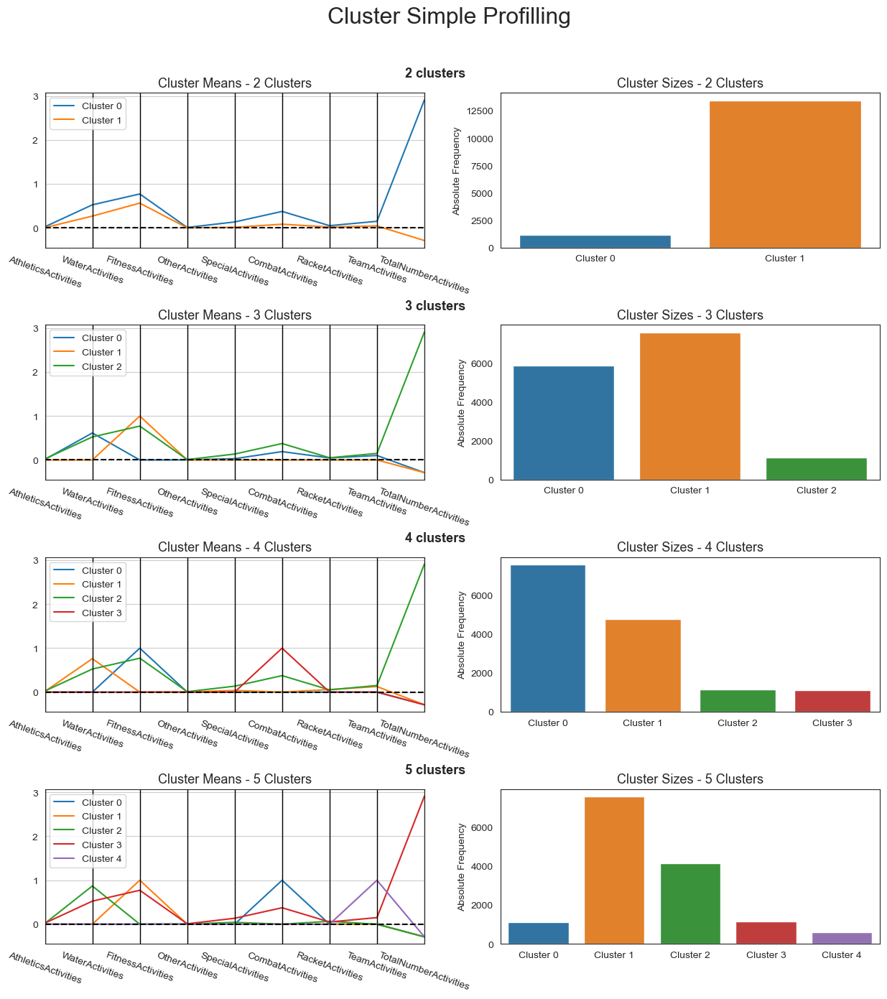

In [249]:
cluster_profiles(
    df = df_activities_concat, 
    label_columns = ['2_labels', '3_labels', '4_labels', '5_labels'], 
    figsize = (15, 15), 
    compar_titles = ["2 clusters", "3 clusters", "4 clusters", "5 clusters"]
)

### Using grouped activities

Just like before, let's try visualizing these clusters using the altered version of the dataframe, where all activities that are not Water, Fitness or Combat are grouped in an "Other" category.

In [250]:
df_activities2

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
0,0,1,0,0,-0.287942
1,0,0,1,0,-0.287942
2,0,1,0,0,-0.287942
3,0,0,1,0,-0.287942
4,0,1,0,0,-0.287942
...,...,...,...,...,...
14852,1,0,0,0,-0.287942
14853,0,0,0,1,-0.287942
14854,0,1,0,0,-0.287942
14855,1,0,0,0,-0.287942


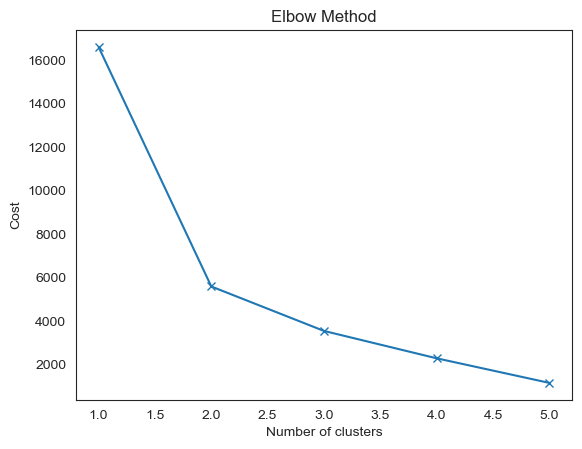

In [251]:
# Elbow curve to find optimal K (this time, we will only be trying between 1 and 5 clusters
cost = [] 
K = range(1,6)

for k in list(K): 
    kprototypes = KPrototypes(n_clusters = k, random_state = 0) 
    kprototypes.fit_predict(df_activities2, categorical = [0, 1]) 
    cost.append(kprototypes.cost_) 
      
plt.plot(K, cost, "x-") 
plt.xlabel("Number of clusters") 
plt.ylabel("Cost") 
plt.title("Elbow Method") 
plt.show()

In [252]:
# Results with 2 clusters
kprototypes2_v2 = KPrototypes(n_clusters = 2, random_state = 0) 
kprototypes2_v2_labels = kprototypes2_v2.fit_predict(df_activities2, categorical = [0, 1]) 
kprototypes2_v2_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=uint16)

In [253]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kprototypes2_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.268642,0.563354,0.084745,0.083259,-0.287942
1,0.524390,0.771777,0.344948,0.374564,2.913427


In [254]:
df_activities2_concat["labels"].value_counts()

labels
0    13464
1     1148
Name: count, dtype: int64

In [255]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5624


Having only two clusters returns exactly the same solution as the one we achieved before grouping the activities.

__Profiling__:
* Cluster 0:  People belonging to this cluster tend to be enrolled in fewer activities. The majority of them participates in fitness activities. Most of the users in our database belong to this cluster.
* Cluster 1 The majority of the people belonging to this cluster participates in either water or fitness activities (or both). On average, these users tend to take part in more activities than those in Cluster 0. This cluster represents only a small part of the users in our database.

In [256]:
# Results with 3 clusters
kprototypes3_v2 = KPrototypes(n_clusters = 3, random_state = 0) 
kprototypes3_v2_labels = kprototypes3_v2.fit_predict(df_activities2, categorical = [0, 1]) 
kprototypes3_v2_labels

array([0, 1, 0, ..., 0, 1, 0], dtype=uint16)

In [257]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kprototypes3_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.000000,1.000000,0.000000,0.000000,-0.287942
1,0.615241,0.000000,0.194081,0.190679,-0.287942
2,0.524390,0.771777,0.344948,0.374564,2.913427


In [258]:
df_activities2_concat["labels"].value_counts()

labels
0    7585
1    5879
2    1148
Name: count, dtype: int64

In [259]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.8240


Once again, we got the same clusters we had before grouping activities.

__Profiling__:
* Cluster 0: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.
* Cluster 1: The majority of the people belonging to this cluster take water activities, while no-one participates in fitness activities. This is the least represented cluster in this partition.
* Cluster 2: People in this cluster tend to enroll in the most activities. The majority of them participates in water and fitness activities, but combat activities are also well represented.

In [260]:
# Results with 4 clusters
kprototypes4_v2 = KPrototypes(n_clusters = 4, random_state = 0) 
kprototypes4_v2_labels = kprototypes4_v2.fit_predict(df_activities2, categorical = [0, 1]) 
kprototypes4_v2_labels

array([0, 2, 0, ..., 0, 3, 0], dtype=uint16)

In [261]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kprototypes4_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.00000,1.000000,0.000000,0.000000,-0.287942
1,0.52439,0.771777,0.344948,0.374564,2.913427
2,0.00000,0.000000,0.504421,0.495579,-0.287942
3,1.00000,0.000000,0.000000,0.000000,-0.287942


In [262]:
df_activities2_concat["labels"].value_counts()

labels
0    7585
3    3617
2    2262
1    1148
Name: count, dtype: int64

In [263]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9424


__Profiling__:
* Cluster 0: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.
* Cluster 1: People in this cluster tend to enroll in the most activities. The majority of them participates in water and fitness activities, but combat and other activities are also well represented.
* Cluster 2: This cluster only contains people that participate in either combat or combat activities. Around 50% of the people belonging to this cluster participate in each of these activities.
* Cluster 3: Everyone in this cluster participates in water and only water activities. It is the second most representative cluster.

In [264]:
# Results with 5 clusters
kprototypes5_v2 = KPrototypes(n_clusters = 5, random_state = 0) 
kprototypes5_v2_labels = kprototypes5_v2.fit_predict(df_activities2, categorical = [0, 1]) 
kprototypes5_v2_labels

array([4, 0, 4, ..., 4, 1, 4], dtype=uint16)

In [265]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kprototypes5_v2_labels, name = "labels", index = df_activities2.index)), axis = 1)
df_activities2_concat.groupby("labels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
labels,,,,,
0,0.00000,0.000000,1.000000,0.000000,-0.287942
1,1.00000,0.000000,0.000000,0.000000,-0.287942
2,0.00000,0.000000,0.000000,1.000000,-0.287942
3,0.52439,0.771777,0.344948,0.374564,2.913427
4,0.00000,1.000000,0.000000,0.000000,-0.287942


In [266]:
df_activities2_concat["labels"].value_counts()

labels
4    7585
1    3617
3    1148
0    1141
2    1121
Name: count, dtype: int64

In [267]:
sst = get_ss(df_activities2_concat)
ssw_labels = df_activities2_concat.groupby(by = "labels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9727


__Profiling__:
* Cluster 0: Everyone in this cluster participates in other and only other activities.
* Cluster 1: Everyone in this cluster participates in water and only water activities. It is the second most representative cluster.
* Cluster 2: Everyone in this cluster participates in combat and only combat activities. This is the least represented cluster, but it is not very different from Clusters 0 and 3 in this aspect.
* Cluster 3: People in this cluster tend to enroll in the most activities. The majority of them participates in water and fitness activities, but other and combat activities are also well represented.
* Cluster 4: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.

In [268]:
df_activities2_concat_2_3 = pd.concat((data, pd.Series(kprototypes2_v2_labels, name = "2_labels", index = df_activities2.index),
                                      pd.Series(kprototypes3_v2_labels, name = "3_labels", index = df_activities2.index)), axis=1)

pd.crosstab(df_activities2_concat_2_3['2_labels'], df_activities2_concat_2_3['3_labels'])

3_labels,0,1,2
2_labels,,,
0,7585,5879,0
1,0,0,1148


In [269]:
df_activities2_concat_2_4 = pd.concat((data, pd.Series(kprototypes2_v2_labels, name = "2_labels", index = df_activities2.index),
                                      pd.Series(kprototypes4_v2_labels, name = "4_labels", index = df_activities2.index)), axis=1)

pd.crosstab(df_activities2_concat_2_4['2_labels'], df_activities2_concat_2_4['4_labels'])

4_labels,0,1,2,3
2_labels,,,,
0,7585,0,2262,3617
1,0,1148,0,0


In [270]:
df_activities2_concat_2_4 = pd.concat((data, pd.Series(kprototypes2_v2_labels, name = "2_labels", index = df_activities2.index),
                                      pd.Series(kprototypes4_v2_labels, name = "4_labels", index = df_activities2.index)), axis=1)

pd.crosstab(df_activities2_concat_2_4['2_labels'], df_activities2_concat_2_4['4_labels'])

4_labels,0,1,2,3
2_labels,,,,
0,7585,0,2262,3617
1,0,1148,0,0


In [271]:
df_activities2_concat_4_5 = pd.concat((data, pd.Series(kprototypes4_v2_labels, name = "4_labels", index = df_activities2.index),
                                      pd.Series(kprototypes5_v2_labels, name = "5_labels", index = df_activities2.index)), axis=1)

pd.crosstab(df_activities2_concat_4_5['4_labels'], df_activities2_concat_4_5['5_labels'])

5_labels,0,1,2,3,4
4_labels,,,,,
0,0,0,0,0,7585
1,0,0,0,1148,0
2,1141,0,1121,0,0
3,0,3617,0,0,0


In [272]:
df_activities2_concat = pd.concat((df_activities2, pd.Series(kprototypes2_v2_labels, name = "2_labels", index = df_activities.index),
                                  pd.Series(kprototypes3_v2_labels, name = "3_labels", index = df_activities.index),
                                  pd.Series(kprototypes4_v2_labels, name = "4_labels", index = df_activities.index),
                                  pd.Series(kprototypes5_v2_labels, name = "5_labels", index = df_activities.index)), axis=1)

df_activities2_concat.head()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities,2_labels,3_labels,4_labels,5_labels
0,0,1,0,0,-0.287942,0,0,0,4
1,0,0,1,0,-0.287942,0,1,2,0
2,0,1,0,0,-0.287942,0,0,0,4
3,0,0,1,0,-0.287942,0,1,2,0
4,0,1,0,0,-0.287942,0,0,0,4


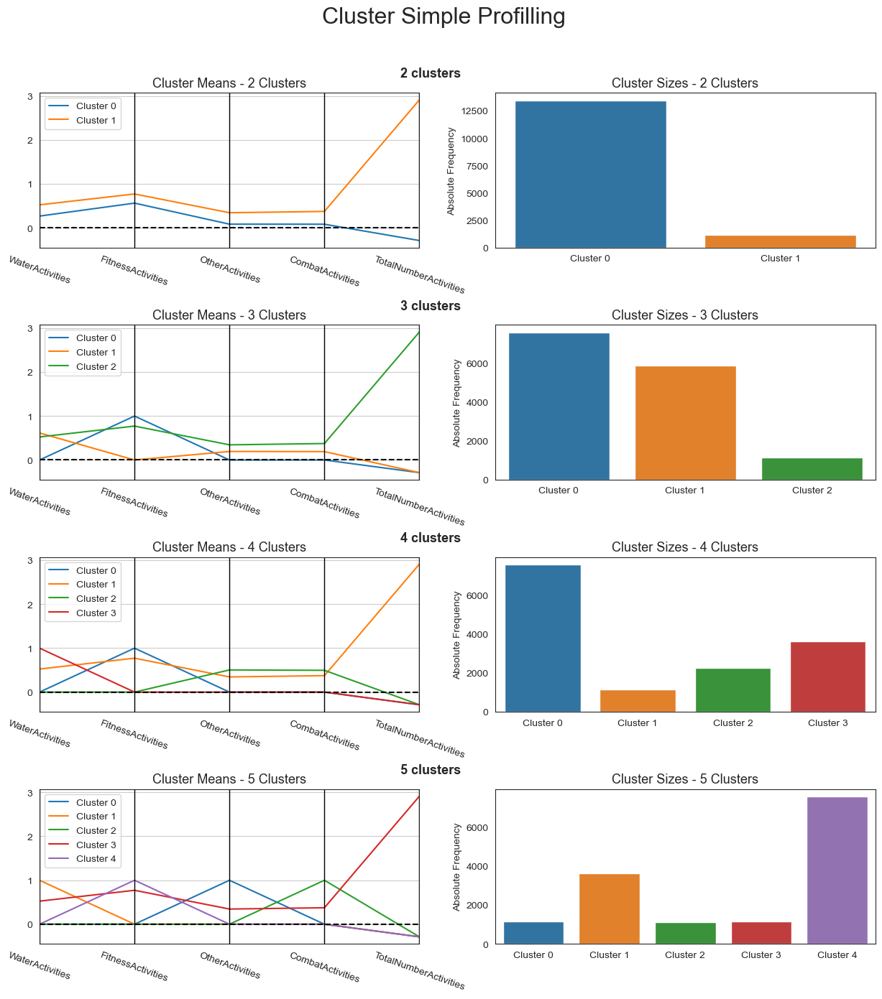

In [273]:
cluster_profiles(
    df = df_activities2_concat, 
    label_columns = ['2_labels', '3_labels', '4_labels', '5_labels'], 
    figsize = (15, 15), 
    compar_titles = ["2 clusters", "3 clusters", "4 clusters", "5 clusters"]
)

<hr>
<a class = "anchor" id = "41st-bullet">

## 8.3. Value View

</a>
</div>

[Return to Index](#index)

In [274]:
value = ['Income','LifetimeValue','PercentageIncomeSpent','TotalIncomeDuringEnrollment', 'NumberOfRenewals']

<hr>
<a class = "anchor" id = "42nd-bullet">

### 8.3.1. K-Means

</a>
</div>

[Return to Index](#index)

Defining the number of clusters

In [275]:
range_clusters = range(1, 20)

Calculating inertia for each range of cluster

In [276]:
inertia = []
for n_clus in range_clusters:  
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=42)
    kmclust.fit(df_value)
    inertia.append(kmclust.inertia_)

Inertia Plotting and Elbow Identification

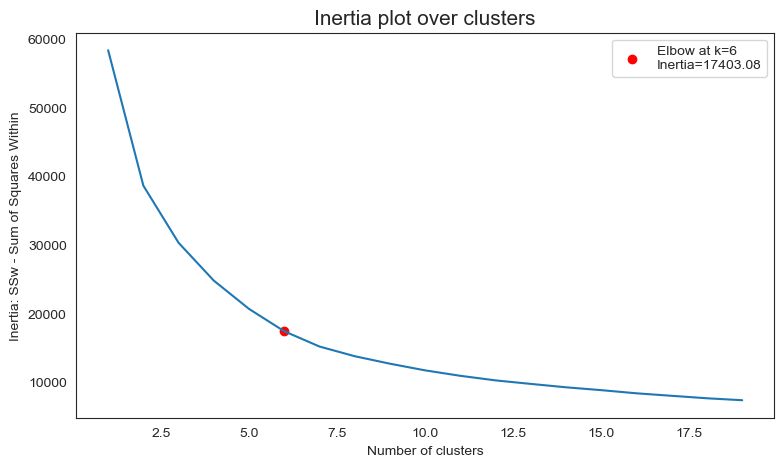

In [277]:
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia)
plt.ylabel("Inertia: SSw - Sum of Squares Within")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)

kneedle = KneeLocator(range_clusters, inertia, curve='convex', direction='decreasing')
elbow_k = kneedle.knee
elbow_inertia = inertia[elbow_k - 1]

# Plot the elbow point
plt.scatter(elbow_k, elbow_inertia, color='red', marker='o', label=f'Elbow at k={elbow_k}\nInertia={elbow_inertia:.2f}')
plt.legend()

plt.show()

Evaluate Clusters through Silhouette

In [278]:
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=42)
    cluster_labels = kmclust.fit_predict(df_value)

    silhouette_avg = silhouette_score(df_value, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

For n_clusters = 2, the average silhouette_score is : 0.4671547792908661
For n_clusters = 3, the average silhouette_score is : 0.4484237293162491
For n_clusters = 4, the average silhouette_score is : 0.3451129231595285
For n_clusters = 5, the average silhouette_score is : 0.3415949980954559
For n_clusters = 6, the average silhouette_score is : 0.370371153117103
For n_clusters = 7, the average silhouette_score is : 0.33527046086233936
For n_clusters = 8, the average silhouette_score is : 0.32065152185992984
For n_clusters = 9, the average silhouette_score is : 0.32680569294830686
For n_clusters = 10, the average silhouette_score is : 0.33082204905472556
For n_clusters = 11, the average silhouette_score is : 0.3192810219832436
For n_clusters = 12, the average silhouette_score is : 0.325968484701127
For n_clusters = 13, the average silhouette_score is : 0.31693585475676117
For n_clusters = 14, the average silhouette_score is : 0.32095007441386975
For n_clusters = 15, the average silhouett

Eventhough using 2 and 3 clusters provides a bigger average silhouette score than 6, if we use 2 or 3 clusters the inertia will be way bigger than when we have 6 clusters. And since 6 clusters (besides 2 and 3) is the number of clusters for which average silhouette score is higher, we will define the optimal number of clusters as 6 for the value perspective (using k-means).

Definitive Number of Clusters

In [279]:
kmclust = KMeans(n_clusters=6, init='k-means++', n_init=15, random_state=42)
km_labels = kmclust.fit_predict(df_value)
km_labels

array([0, 2, 4, ..., 4, 1, 1])

#### Cluster Characterization

__Only with df_value__

In [280]:
df_kmeans_value_original = pd.concat((df_value, pd.Series(km_labels, name='labels', index=df_value.index)), axis=1)
df_kmeans_value_original.groupby('labels').mean()

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
labels,,,,,
0,1.722163,-0.283136,-0.192108,0.163480,-0.385740
1,1.450335,1.458031,-0.291099,3.061576,1.780493
2,0.001688,0.149983,-0.110984,0.457507,0.874047
3,-1.254007,2.561972,-0.451322,-0.444279,1.774175
4,-0.117034,-0.509021,0.281308,-0.385634,-0.615246
5,-1.377569,0.057799,-0.583792,-0.620764,-0.173297


__r2__

In [281]:
sst = get_ss(df_kmeans_value_original[value])  # get total sum of squares
ssw_labels = df_kmeans_value_original[value + ["labels"]].groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.7019442850797726

__Full dataset__

In [282]:
df_kmeans_value = pd.concat((data, pd.Series(km_labels, name='labels', index=data.index)), axis=1)
df_kmeans_value.groupby('labels').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
labels,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.353890,1.722163,-0.060911,-0.283136,0.043804,0.006916,0.253026,0.619020,0.020749,0.020173,0.066859,0.072046,0.006916,-0.219500,-0.215565,0.115524,0.151365,0.017353,-0.385740,0.010951,0.815562,-0.423981,-0.085866,0.163480,-0.192108,0.031231
1,0.481383,1.450335,0.026985,1.458031,0.158245,0.010638,0.352394,0.642287,0.038564,0.009309,0.075798,0.083777,0.001330,1.613707,0.303281,0.193925,0.257814,0.298578,1.780493,0.022606,0.582447,1.908123,0.370500,3.061576,-0.291099,-0.066387
2,0.441082,0.001688,0.256066,0.149983,0.106941,0.008878,0.223971,0.661017,0.065375,0.025827,0.144875,0.030266,0.000807,0.330504,-0.109296,0.241870,0.242895,0.059391,0.874047,0.011299,0.829298,0.718054,0.207258,0.457507,-0.110984,-0.167094
3,0.464020,-1.254007,-0.159458,2.561972,0.007444,0.006203,0.867246,0.035980,0.124069,0.011166,0.068238,0.007444,0.000000,0.972104,2.277993,-1.357297,-0.921805,-0.090182,1.774175,0.135236,0.409429,1.860333,0.082181,-0.444279,-0.451322,0.164718
4,0.368966,-0.117034,-0.077148,-0.509021,0.029383,0.006017,0.144116,0.728418,0.027564,0.021128,0.114034,0.008395,0.001539,-0.343784,-0.305728,0.374795,0.194261,-0.004110,-0.615246,0.002519,0.896320,-0.558172,-0.130447,-0.385634,0.281308,-0.000205
5,0.452774,-1.377569,-0.105230,0.057799,0.001771,0.006494,0.726682,0.024203,0.146989,0.040142,0.087957,0.001771,0.000000,-0.309606,0.223914,-1.444871,-1.011532,-0.290112,-0.173297,0.054309,0.685950,-0.241807,-0.182643,-0.620764,-0.583792,0.154206


__Perspective Profiling__

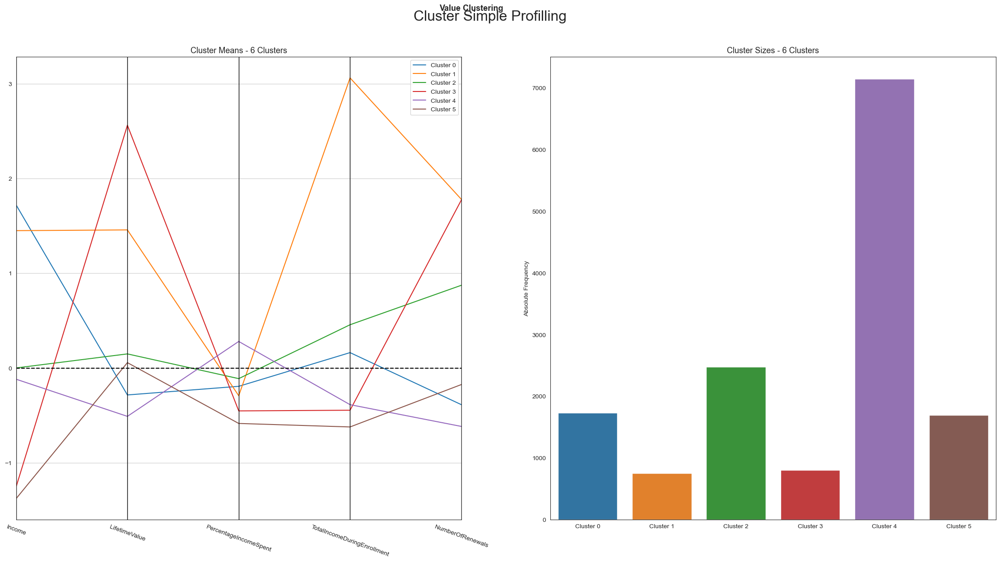

In [283]:
cluster_profiles(
    df = df_kmeans_value_original, 
    label_columns = ['labels'], 
    figsize = (28, 13), 
    compar_titles = ["Value Clustering"]
)

<hr>
<a class = "anchor" id = "43rd-bullet">

### 8.3.2. Self-Organizing Maps

</a>
</div>

[Return to Index](#index)

In [284]:
sm_value = sompy.SOMFactory().build(
    df_value.values, 
    mapsize=[3, 2],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals'] #the name of the list which contains the variables of this perspective
)

sm_value.train(n_job=-1, verbose='info',
         train_rough_len=2000,
         train_finetune_len=2000)

final_clusters = pd.DataFrame(sm_value._data, columns = ['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals'])

my_labels = pd.DataFrame(sm_value._bmu[0])
    
final_clusters = pd.concat([final_clusters,my_labels], axis = 1)

final_clusters.columns = ['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals','Value']

final_clusters

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 1.000000 , radius_final: 1.000000, trainlen: 2000

 epoch: 1 ---> elapsed time:  0.016000, quantization error: 7.147074

 epoch: 2 ---> elapsed time:  0.031000, quantization error: 1.763609

 epoch: 3 ---> elapsed time:  0.031000, quantization error: 1.606069

 epoch: 4 ---> elapsed time:  0.016000, quantization error: 1.523864

 epoch: 5 ---> elapsed time:  0.032000, quantization error: 1.501066

 epoch: 6 ---> elapsed time:  0.016000, quantization error: 1.494565

 epoch: 7 ---> elapsed time:  0.031000, quantization error: 1.491005

 epoch: 8 ---> elapsed time:  0.016000, quantization error: 1.489219

 epoch: 9 ---> elapsed time:  0.032000, quantization error: 1.479469

 epoch: 10 ---> elapsed time:  0.016000, quantization error: 1.472400

 epoch: 11 ---> elapsed time:  0.031000, quantization error: 1.469346

 epoch: 12 ---> elapsed time:  0.016000, quantization error: 1.467717

 epoch: 13 --->

 epoch: 115 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 116 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 117 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 118 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 119 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 120 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 121 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 122 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 123 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 124 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 125 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 126 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 127 ---> elapsed time:  0.019000, quantization error: 1.465251

 epoch: 128 ---> elapsed time:  0.029000, quantization error: 1.

 epoch: 229 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 230 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 231 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 232 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 233 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 234 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 235 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 236 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 237 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 238 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 239 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 240 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 241 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 242 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 343 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 344 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 345 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 346 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 347 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 348 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 349 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 350 ---> elapsed time:  0.022000, quantization error: 1.465251

 epoch: 351 ---> elapsed time:  0.025000, quantization error: 1.465251

 epoch: 352 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 353 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 354 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 355 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 356 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 457 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 458 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 459 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 460 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 461 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 462 ---> elapsed time:  0.023000, quantization error: 1.465251

 epoch: 463 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 464 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 465 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 466 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 467 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 468 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 469 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 470 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 571 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 572 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 573 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 574 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 575 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 576 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 577 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 578 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 579 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 580 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 581 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 582 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 583 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 584 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 685 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 686 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 687 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 688 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 689 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 690 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 691 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 692 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 693 ---> elapsed time:  0.019000, quantization error: 1.465251

 epoch: 694 ---> elapsed time:  0.013000, quantization error: 1.465251

 epoch: 695 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 696 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 697 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 698 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 799 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 800 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 801 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 802 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 803 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 804 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 805 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 806 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 807 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 808 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 809 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 810 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 811 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 812 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 913 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 914 ---> elapsed time:  0.023000, quantization error: 1.465251

 epoch: 915 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 916 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 917 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 918 ---> elapsed time:  0.015000, quantization error: 1.465251

 epoch: 919 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 920 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 921 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 922 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 923 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 924 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 925 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 926 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 1027 ---> elapsed time:  0.029000, quantization error: 1.465251

 epoch: 1028 ---> elapsed time:  0.023000, quantization error: 1.465251

 epoch: 1029 ---> elapsed time:  0.025000, quantization error: 1.465251

 epoch: 1030 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1031 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1032 ---> elapsed time:  0.028000, quantization error: 1.465251

 epoch: 1033 ---> elapsed time:  0.019000, quantization error: 1.465251

 epoch: 1034 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1035 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1036 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1037 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1038 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1039 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1040 ---> elapsed time:  0.031000, quantiza

 epoch: 1140 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1141 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1142 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1143 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1144 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1145 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1146 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1147 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1148 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1149 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1150 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1151 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1152 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1153 ---> elapsed time:  0.016000, quantiza

 epoch: 1253 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1254 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1255 ---> elapsed time:  0.034000, quantization error: 1.465251

 epoch: 1256 ---> elapsed time:  0.014000, quantization error: 1.465251

 epoch: 1257 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1258 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1259 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1260 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1261 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1262 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1263 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1264 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1265 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1266 ---> elapsed time:  0.032000, quantiza

 epoch: 1366 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1367 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1368 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1369 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1370 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1371 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1372 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 1373 ---> elapsed time:  0.030000, quantization error: 1.465251

 epoch: 1374 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1375 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1376 ---> elapsed time:  0.022000, quantization error: 1.465251

 epoch: 1377 ---> elapsed time:  0.026000, quantization error: 1.465251

 epoch: 1378 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1379 ---> elapsed time:  0.031000, quantiza

 epoch: 1479 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1480 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1481 ---> elapsed time:  0.020000, quantization error: 1.465251

 epoch: 1482 ---> elapsed time:  0.028000, quantization error: 1.465251

 epoch: 1483 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1484 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1485 ---> elapsed time:  0.025000, quantization error: 1.465251

 epoch: 1486 ---> elapsed time:  0.022000, quantization error: 1.465251

 epoch: 1487 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1488 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1489 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1490 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1491 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1492 ---> elapsed time:  0.031000, quantiza

 epoch: 1592 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1593 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1594 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1595 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1596 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1597 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1598 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1599 ---> elapsed time:  0.034000, quantization error: 1.465251

 epoch: 1600 ---> elapsed time:  0.014000, quantization error: 1.465251

 epoch: 1601 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1602 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1603 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1604 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1605 ---> elapsed time:  0.032000, quantiza

 epoch: 1705 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1706 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1707 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1708 ---> elapsed time:  0.018000, quantization error: 1.465251

 epoch: 1709 ---> elapsed time:  0.029000, quantization error: 1.465251

 epoch: 1710 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1711 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1712 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 1713 ---> elapsed time:  0.008000, quantization error: 1.465251

 epoch: 1714 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1715 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1716 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1717 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1718 ---> elapsed time:  0.032000, quantiza

 epoch: 1818 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1819 ---> elapsed time:  0.019000, quantization error: 1.465251

 epoch: 1820 ---> elapsed time:  0.029000, quantization error: 1.465251

 epoch: 1821 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1822 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1823 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 1824 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 1825 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1826 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1827 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1828 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1829 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1830 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1831 ---> elapsed time:  0.016000, quantiza

 epoch: 1931 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1932 ---> elapsed time:  0.015000, quantization error: 1.465251

 epoch: 1933 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 1934 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1935 ---> elapsed time:  0.014000, quantization error: 1.465251

 epoch: 1936 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1937 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 1938 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1939 ---> elapsed time:  0.023000, quantization error: 1.465251

 epoch: 1940 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 1941 ---> elapsed time:  0.021000, quantization error: 1.465251

 epoch: 1942 ---> elapsed time:  0.026000, quantization error: 1.465251

 epoch: 1943 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1944 ---> elapsed time:  0.032000, quantiza

 epoch: 44 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 45 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 46 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 47 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 48 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 49 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 50 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 51 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 52 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 53 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 54 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 55 ---> elapsed time:  0.033000, quantization error: 1.465251

 epoch: 56 ---> elapsed time:  0.015000, quantization error: 1.465251

 epoch: 57 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch

 epoch: 159 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 160 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 161 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 162 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 163 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 164 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 165 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 166 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 167 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 168 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 169 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 170 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 171 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 172 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 273 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 274 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 275 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 276 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 277 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 278 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 279 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 280 ---> elapsed time:  0.030000, quantization error: 1.465251

 epoch: 281 ---> elapsed time:  0.018000, quantization error: 1.465251

 epoch: 282 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 283 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 284 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 285 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 286 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 387 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 388 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 389 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 390 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 391 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 392 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 393 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 394 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 395 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 396 ---> elapsed time:  0.020000, quantization error: 1.465251

 epoch: 397 ---> elapsed time:  0.027000, quantization error: 1.465251

 epoch: 398 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 399 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 400 ---> elapsed time:  0.026000, quantization error: 1.

 epoch: 501 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 502 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 503 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 504 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 505 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 506 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 507 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 508 ---> elapsed time:  0.020000, quantization error: 1.465251

 epoch: 509 ---> elapsed time:  0.027000, quantization error: 1.465251

 epoch: 510 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 511 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 512 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 513 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 514 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 615 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 616 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 617 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 618 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 619 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 620 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 621 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 622 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 623 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 624 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 625 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 626 ---> elapsed time:  0.033000, quantization error: 1.465251

 epoch: 627 ---> elapsed time:  0.014000, quantization error: 1.465251

 epoch: 628 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 729 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 730 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 731 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 732 ---> elapsed time:  0.029000, quantization error: 1.465251

 epoch: 733 ---> elapsed time:  0.023000, quantization error: 1.465251

 epoch: 734 ---> elapsed time:  0.011000, quantization error: 1.465251

 epoch: 735 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 736 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 737 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 738 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 739 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 740 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 741 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 742 ---> elapsed time:  0.016000, quantization error: 1.

 epoch: 843 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 844 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 845 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 846 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 847 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 848 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 849 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 850 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 851 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 852 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 853 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 854 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 855 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 856 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 957 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 958 ---> elapsed time:  0.020000, quantization error: 1.465251

 epoch: 959 ---> elapsed time:  0.027000, quantization error: 1.465251

 epoch: 960 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 961 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 962 ---> elapsed time:  0.026000, quantization error: 1.465251

 epoch: 963 ---> elapsed time:  0.022000, quantization error: 1.465251

 epoch: 964 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 965 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 966 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 967 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 968 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 969 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 970 ---> elapsed time:  0.038000, quantization error: 1.

 epoch: 1070 ---> elapsed time:  0.026000, quantization error: 1.465251

 epoch: 1071 ---> elapsed time:  0.021000, quantization error: 1.465251

 epoch: 1072 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1073 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1074 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1075 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1076 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1077 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1078 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1079 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1080 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1081 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1082 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1083 ---> elapsed time:  0.032000, quantiza

 epoch: 1183 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1184 ---> elapsed time:  0.034000, quantization error: 1.465251

 epoch: 1185 ---> elapsed time:  0.013000, quantization error: 1.465251

 epoch: 1186 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1187 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1188 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1189 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1190 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1191 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1192 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1193 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1194 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1195 ---> elapsed time:  0.036000, quantization error: 1.465251

 epoch: 1196 ---> elapsed time:  0.011000, quantiza

 epoch: 1296 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1297 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1298 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1299 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1300 ---> elapsed time:  0.035000, quantization error: 1.465251

 epoch: 1301 ---> elapsed time:  0.013000, quantization error: 1.465251

 epoch: 1302 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1303 ---> elapsed time:  0.034000, quantization error: 1.465251

 epoch: 1304 ---> elapsed time:  0.023000, quantization error: 1.465251

 epoch: 1305 ---> elapsed time:  0.023000, quantization error: 1.465251

 epoch: 1306 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1307 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1308 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1309 ---> elapsed time:  0.032000, quantiza

 epoch: 1409 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1410 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1411 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1412 ---> elapsed time:  0.015000, quantization error: 1.465251

 epoch: 1413 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1414 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1415 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1416 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1417 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1418 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1419 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1420 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1421 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1422 ---> elapsed time:  0.016000, quantiza

 epoch: 1522 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1523 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1524 ---> elapsed time:  0.022000, quantization error: 1.465251

 epoch: 1525 ---> elapsed time:  0.025000, quantization error: 1.465251

 epoch: 1526 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 1527 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1528 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 1529 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1530 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1531 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 1532 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1533 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1534 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1535 ---> elapsed time:  0.016000, quantiza

 epoch: 1635 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1636 ---> elapsed time:  0.024000, quantization error: 1.465251

 epoch: 1637 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1638 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1639 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1640 ---> elapsed time:  0.028000, quantization error: 1.465251

 epoch: 1641 ---> elapsed time:  0.020000, quantization error: 1.465251

 epoch: 1642 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1643 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1644 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1645 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1646 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1647 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1648 ---> elapsed time:  0.016000, quantiza

 epoch: 1748 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1749 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1750 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1751 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1752 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1753 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1754 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1755 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1756 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1757 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1758 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1759 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1760 ---> elapsed time:  0.026000, quantization error: 1.465251

 epoch: 1761 ---> elapsed time:  0.022000, quantiza

 epoch: 1861 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1862 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1863 ---> elapsed time:  0.018000, quantization error: 1.465251

 epoch: 1864 ---> elapsed time:  0.029000, quantization error: 1.465251

 epoch: 1865 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1866 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1867 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1868 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1869 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1870 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1871 ---> elapsed time:  0.032000, quantization error: 1.465251

 epoch: 1872 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1873 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1874 ---> elapsed time:  0.016000, quantiza

 epoch: 1974 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1975 ---> elapsed time:  0.019000, quantization error: 1.465251

 epoch: 1976 ---> elapsed time:  0.029000, quantization error: 1.465251

 epoch: 1977 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1978 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1979 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1980 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1981 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1982 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1983 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1984 ---> elapsed time:  0.017000, quantization error: 1.465251

 epoch: 1985 ---> elapsed time:  0.031000, quantization error: 1.465251

 epoch: 1986 ---> elapsed time:  0.016000, quantization error: 1.465251

 epoch: 1987 ---> elapsed time:  0.032000, quantiza

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals,Value
0,2.146182,-0.602238,0.627817,-0.511560,-0.868689,2.0
1,0.299464,0.594652,0.407157,0.165160,0.637396,5.0
2,-0.118782,-0.761117,0.908656,-0.594588,-0.868689,1.0
3,-1.392825,-0.399456,-0.997040,-0.641291,-0.868689,0.0
4,1.386905,0.269218,-0.645991,1.906141,1.390439,5.0
...,...,...,...,...,...,...
14607,-1.392825,3.607216,-0.997040,-0.641291,1.390439,5.0
14608,0.547307,0.179110,0.437247,-0.072331,-0.868689,1.0
14609,-0.228170,-0.742696,1.420185,-0.598598,-0.868689,1.0
14610,1.695763,1.544550,-0.174582,1.623093,0.637396,5.0


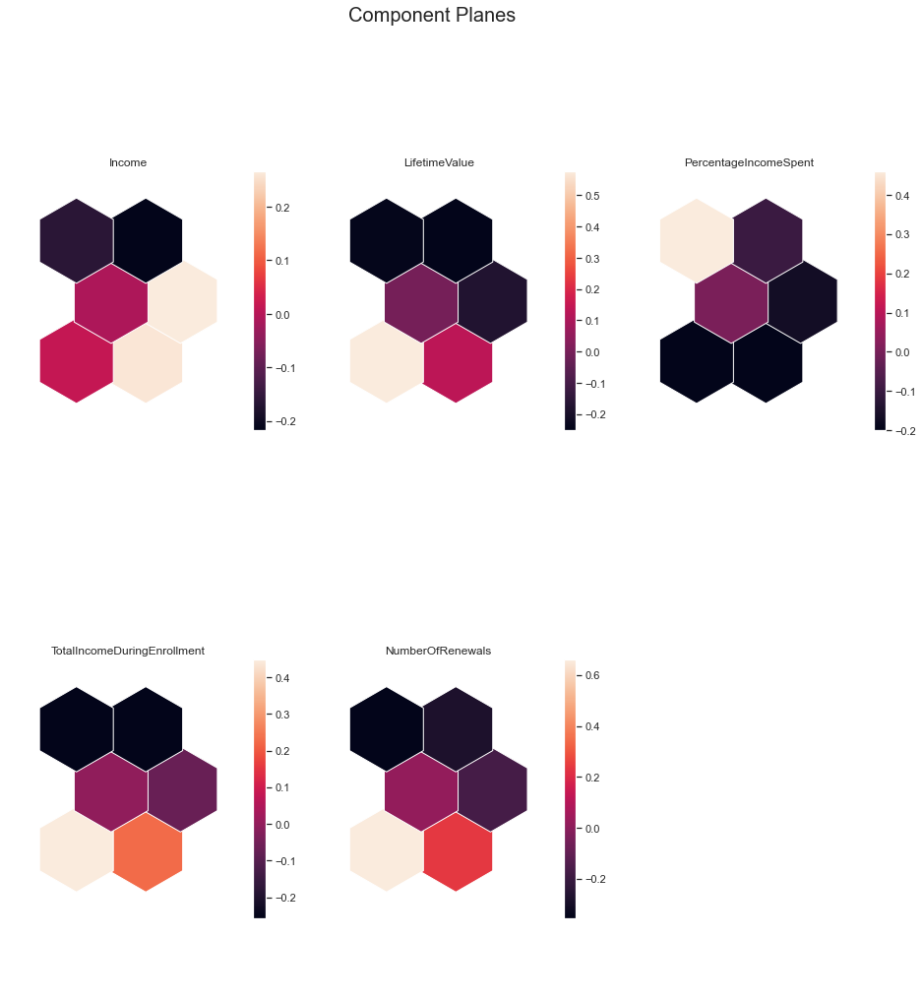

In [285]:
plt.rcParams['figure.dpi'] = 72

sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm_value, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

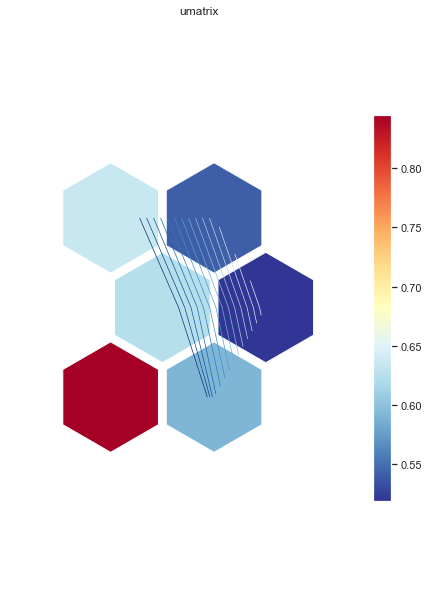

In [286]:
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm_value, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True
)

<hr>
<a class = "anchor" id = "44th-bullet">

### 8.3.3. Self-Organizing Maps + K-Means

</a>
</div>

[Return to Index](#index)

In [287]:
sm_value = sompy.SOMFactory().build(
    df_value.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals'] #the name of the list which contains the variables of this perspective
)

sm_value.train(n_job=-1, verbose='info',
         train_rough_len=2000,
         train_finetune_len=2000)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 2000

 epoch: 1 ---> elapsed time:  0.206000, quantization error: 1.200399

 epoch: 2 ---> elapsed time:  0.226000, quantization error: 1.871292

 epoch: 3 ---> elapsed time:  0.200000, quantization error: 1.836584

 epoch: 4 ---> elapsed time:  0.218000, quantization error: 1.831378

 epoch: 5 ---> elapsed time:  0.204000, quantization error: 1.829378

 epoch: 6 ---> elapsed time:  0.220000, quantization error: 1.827918

 epoch: 7 ---> elapsed time:  0.204000, quantization error: 1.826103

 epoch: 8 ---> elapsed time:  0.229000, quantization error: 1.823757

 epoch: 9 ---> elapsed time:  0.196000, quantization error: 1.823136

 epoch: 10 ---> elapsed time:  0.219000, quantization error: 1.823034

 epoch: 11 ---> elapsed time:  0.213000, quantization error: 1.822971

 epoch: 12 ---> elapsed time:  0.200000, quantization error: 1.822915

 epoch: 13 ---

 epoch: 115 ---> elapsed time:  0.216000, quantization error: 1.817480

 epoch: 116 ---> elapsed time:  0.220000, quantization error: 1.817424

 epoch: 117 ---> elapsed time:  0.204000, quantization error: 1.817368

 epoch: 118 ---> elapsed time:  0.205000, quantization error: 1.817312

 epoch: 119 ---> elapsed time:  0.220000, quantization error: 1.817256

 epoch: 120 ---> elapsed time:  0.223000, quantization error: 1.817200

 epoch: 121 ---> elapsed time:  0.218000, quantization error: 1.817143

 epoch: 122 ---> elapsed time:  0.220000, quantization error: 1.817087

 epoch: 123 ---> elapsed time:  0.220000, quantization error: 1.817030

 epoch: 124 ---> elapsed time:  0.220000, quantization error: 1.816973

 epoch: 125 ---> elapsed time:  0.220000, quantization error: 1.816917

 epoch: 126 ---> elapsed time:  0.236000, quantization error: 1.816860

 epoch: 127 ---> elapsed time:  0.220000, quantization error: 1.816804

 epoch: 128 ---> elapsed time:  0.220000, quantization error: 1.

 epoch: 229 ---> elapsed time:  0.236000, quantization error: 1.810634

 epoch: 230 ---> elapsed time:  0.235000, quantization error: 1.810570

 epoch: 231 ---> elapsed time:  0.236000, quantization error: 1.810506

 epoch: 232 ---> elapsed time:  0.235000, quantization error: 1.810441

 epoch: 233 ---> elapsed time:  0.220000, quantization error: 1.810377

 epoch: 234 ---> elapsed time:  0.251000, quantization error: 1.810312

 epoch: 235 ---> elapsed time:  0.235000, quantization error: 1.810247

 epoch: 236 ---> elapsed time:  0.238000, quantization error: 1.810182

 epoch: 237 ---> elapsed time:  0.234000, quantization error: 1.810117

 epoch: 238 ---> elapsed time:  0.236000, quantization error: 1.810052

 epoch: 239 ---> elapsed time:  0.236000, quantization error: 1.809987

 epoch: 240 ---> elapsed time:  0.253000, quantization error: 1.809921

 epoch: 241 ---> elapsed time:  0.236000, quantization error: 1.809856

 epoch: 242 ---> elapsed time:  0.251000, quantization error: 1.

 epoch: 343 ---> elapsed time:  0.251000, quantization error: 1.802731

 epoch: 344 ---> elapsed time:  0.251000, quantization error: 1.802656

 epoch: 345 ---> elapsed time:  0.236000, quantization error: 1.802582

 epoch: 346 ---> elapsed time:  0.251000, quantization error: 1.802507

 epoch: 347 ---> elapsed time:  0.252000, quantization error: 1.802432

 epoch: 348 ---> elapsed time:  0.251000, quantization error: 1.802358

 epoch: 349 ---> elapsed time:  0.266000, quantization error: 1.802283

 epoch: 350 ---> elapsed time:  0.235000, quantization error: 1.802207

 epoch: 351 ---> elapsed time:  0.283000, quantization error: 1.802132

 epoch: 352 ---> elapsed time:  0.252000, quantization error: 1.802056

 epoch: 353 ---> elapsed time:  0.251000, quantization error: 1.801980

 epoch: 354 ---> elapsed time:  0.251000, quantization error: 1.801904

 epoch: 355 ---> elapsed time:  0.251000, quantization error: 1.801828

 epoch: 356 ---> elapsed time:  0.251000, quantization error: 1.

 epoch: 457 ---> elapsed time:  0.283000, quantization error: 1.793538

 epoch: 458 ---> elapsed time:  0.298000, quantization error: 1.793450

 epoch: 459 ---> elapsed time:  0.282000, quantization error: 1.793363

 epoch: 460 ---> elapsed time:  0.283000, quantization error: 1.793276

 epoch: 461 ---> elapsed time:  0.268000, quantization error: 1.793188

 epoch: 462 ---> elapsed time:  0.282000, quantization error: 1.793101

 epoch: 463 ---> elapsed time:  0.298000, quantization error: 1.793013

 epoch: 464 ---> elapsed time:  0.283000, quantization error: 1.792925

 epoch: 465 ---> elapsed time:  0.267000, quantization error: 1.792836

 epoch: 466 ---> elapsed time:  0.283000, quantization error: 1.792748

 epoch: 467 ---> elapsed time:  0.283000, quantization error: 1.792660

 epoch: 468 ---> elapsed time:  0.283000, quantization error: 1.792572

 epoch: 469 ---> elapsed time:  0.285000, quantization error: 1.792483

 epoch: 470 ---> elapsed time:  0.281000, quantization error: 1.

 epoch: 571 ---> elapsed time:  0.315000, quantization error: 1.782794

 epoch: 572 ---> elapsed time:  0.331000, quantization error: 1.782691

 epoch: 573 ---> elapsed time:  0.330000, quantization error: 1.782589

 epoch: 574 ---> elapsed time:  0.314000, quantization error: 1.782486

 epoch: 575 ---> elapsed time:  0.315000, quantization error: 1.782383

 epoch: 576 ---> elapsed time:  0.314000, quantization error: 1.782281

 epoch: 577 ---> elapsed time:  0.314000, quantization error: 1.782178

 epoch: 578 ---> elapsed time:  0.314000, quantization error: 1.782074

 epoch: 579 ---> elapsed time:  0.318000, quantization error: 1.781971

 epoch: 580 ---> elapsed time:  0.311000, quantization error: 1.781867

 epoch: 581 ---> elapsed time:  0.298000, quantization error: 1.781763

 epoch: 582 ---> elapsed time:  0.329000, quantization error: 1.781660

 epoch: 583 ---> elapsed time:  0.314000, quantization error: 1.781555

 epoch: 584 ---> elapsed time:  0.314000, quantization error: 1.

 epoch: 685 ---> elapsed time:  0.298000, quantization error: 1.770142

 epoch: 686 ---> elapsed time:  0.314000, quantization error: 1.770021

 epoch: 687 ---> elapsed time:  0.298000, quantization error: 1.769901

 epoch: 688 ---> elapsed time:  0.314000, quantization error: 1.769779

 epoch: 689 ---> elapsed time:  0.298000, quantization error: 1.769658

 epoch: 690 ---> elapsed time:  0.299000, quantization error: 1.769539

 epoch: 691 ---> elapsed time:  0.298000, quantization error: 1.769421

 epoch: 692 ---> elapsed time:  0.298000, quantization error: 1.769300

 epoch: 693 ---> elapsed time:  0.283000, quantization error: 1.769178

 epoch: 694 ---> elapsed time:  0.298000, quantization error: 1.769056

 epoch: 695 ---> elapsed time:  0.298000, quantization error: 1.768934

 epoch: 696 ---> elapsed time:  0.283000, quantization error: 1.768813

 epoch: 697 ---> elapsed time:  0.330000, quantization error: 1.768690

 epoch: 698 ---> elapsed time:  0.298000, quantization error: 1.

 epoch: 799 ---> elapsed time:  0.251000, quantization error: 1.754953

 epoch: 800 ---> elapsed time:  0.242000, quantization error: 1.754807

 epoch: 801 ---> elapsed time:  0.245000, quantization error: 1.754662

 epoch: 802 ---> elapsed time:  0.235000, quantization error: 1.754516

 epoch: 803 ---> elapsed time:  0.251000, quantization error: 1.754369

 epoch: 804 ---> elapsed time:  0.252000, quantization error: 1.754223

 epoch: 805 ---> elapsed time:  0.236000, quantization error: 1.754074

 epoch: 806 ---> elapsed time:  0.251000, quantization error: 1.753925

 epoch: 807 ---> elapsed time:  0.251000, quantization error: 1.753777

 epoch: 808 ---> elapsed time:  0.236000, quantization error: 1.753627

 epoch: 809 ---> elapsed time:  0.248000, quantization error: 1.753476

 epoch: 810 ---> elapsed time:  0.252000, quantization error: 1.753324

 epoch: 811 ---> elapsed time:  0.246000, quantization error: 1.753177

 epoch: 812 ---> elapsed time:  0.235000, quantization error: 1.

 epoch: 913 ---> elapsed time:  0.251000, quantization error: 1.736628

 epoch: 914 ---> elapsed time:  0.235000, quantization error: 1.736446

 epoch: 915 ---> elapsed time:  0.236000, quantization error: 1.736267

 epoch: 916 ---> elapsed time:  0.220000, quantization error: 1.736088

 epoch: 917 ---> elapsed time:  0.220000, quantization error: 1.735906

 epoch: 918 ---> elapsed time:  0.220000, quantization error: 1.735726

 epoch: 919 ---> elapsed time:  0.236000, quantization error: 1.735548

 epoch: 920 ---> elapsed time:  0.220000, quantization error: 1.735371

 epoch: 921 ---> elapsed time:  0.235000, quantization error: 1.735196

 epoch: 922 ---> elapsed time:  0.236000, quantization error: 1.735015

 epoch: 923 ---> elapsed time:  0.235000, quantization error: 1.734841

 epoch: 924 ---> elapsed time:  0.220000, quantization error: 1.734660

 epoch: 925 ---> elapsed time:  0.236000, quantization error: 1.734477

 epoch: 926 ---> elapsed time:  0.236000, quantization error: 1.

 epoch: 1027 ---> elapsed time:  0.236000, quantization error: 1.711700

 epoch: 1028 ---> elapsed time:  0.251000, quantization error: 1.711463

 epoch: 1029 ---> elapsed time:  0.252000, quantization error: 1.711230

 epoch: 1030 ---> elapsed time:  0.236000, quantization error: 1.710996

 epoch: 1031 ---> elapsed time:  0.235000, quantization error: 1.710761

 epoch: 1032 ---> elapsed time:  0.252000, quantization error: 1.710525

 epoch: 1033 ---> elapsed time:  0.262000, quantization error: 1.710285

 epoch: 1034 ---> elapsed time:  0.240000, quantization error: 1.710047

 epoch: 1035 ---> elapsed time:  0.251000, quantization error: 1.709811

 epoch: 1036 ---> elapsed time:  0.236000, quantization error: 1.709572

 epoch: 1037 ---> elapsed time:  0.251000, quantization error: 1.709333

 epoch: 1038 ---> elapsed time:  0.251000, quantization error: 1.709093

 epoch: 1039 ---> elapsed time:  0.235000, quantization error: 1.708854

 epoch: 1040 ---> elapsed time:  0.251000, quantiza

 epoch: 1140 ---> elapsed time:  0.253000, quantization error: 1.681975

 epoch: 1141 ---> elapsed time:  0.267000, quantization error: 1.681678

 epoch: 1142 ---> elapsed time:  0.267000, quantization error: 1.681378

 epoch: 1143 ---> elapsed time:  0.251000, quantization error: 1.681073

 epoch: 1144 ---> elapsed time:  0.267000, quantization error: 1.680770

 epoch: 1145 ---> elapsed time:  0.267000, quantization error: 1.680475

 epoch: 1146 ---> elapsed time:  0.252000, quantization error: 1.680178

 epoch: 1147 ---> elapsed time:  0.267000, quantization error: 1.679879

 epoch: 1148 ---> elapsed time:  0.282000, quantization error: 1.679579

 epoch: 1149 ---> elapsed time:  0.267000, quantization error: 1.679280

 epoch: 1150 ---> elapsed time:  0.267000, quantization error: 1.678976

 epoch: 1151 ---> elapsed time:  0.276000, quantization error: 1.678672

 epoch: 1152 ---> elapsed time:  0.258000, quantization error: 1.678363

 epoch: 1153 ---> elapsed time:  0.267000, quantiza

 epoch: 1253 ---> elapsed time:  0.283000, quantization error: 1.643927

 epoch: 1254 ---> elapsed time:  0.298000, quantization error: 1.643538

 epoch: 1255 ---> elapsed time:  0.298000, quantization error: 1.643154

 epoch: 1256 ---> elapsed time:  0.300000, quantization error: 1.642771

 epoch: 1257 ---> elapsed time:  0.299000, quantization error: 1.642387

 epoch: 1258 ---> elapsed time:  0.299000, quantization error: 1.642000

 epoch: 1259 ---> elapsed time:  0.299000, quantization error: 1.641606

 epoch: 1260 ---> elapsed time:  0.315000, quantization error: 1.641223

 epoch: 1261 ---> elapsed time:  0.284000, quantization error: 1.640838

 epoch: 1262 ---> elapsed time:  0.301000, quantization error: 1.640453

 epoch: 1263 ---> elapsed time:  0.301000, quantization error: 1.640067

 epoch: 1264 ---> elapsed time:  0.308000, quantization error: 1.639681

 epoch: 1265 ---> elapsed time:  0.293000, quantization error: 1.639289

 epoch: 1266 ---> elapsed time:  0.283000, quantiza

 epoch: 1366 ---> elapsed time:  0.308000, quantization error: 1.594732

 epoch: 1367 ---> elapsed time:  0.330000, quantization error: 1.594241

 epoch: 1368 ---> elapsed time:  0.314000, quantization error: 1.593749

 epoch: 1369 ---> elapsed time:  0.314000, quantization error: 1.593254

 epoch: 1370 ---> elapsed time:  0.337000, quantization error: 1.592758

 epoch: 1371 ---> elapsed time:  0.315000, quantization error: 1.592251

 epoch: 1372 ---> elapsed time:  0.314000, quantization error: 1.591743

 epoch: 1373 ---> elapsed time:  0.314000, quantization error: 1.591239

 epoch: 1374 ---> elapsed time:  0.314000, quantization error: 1.590739

 epoch: 1375 ---> elapsed time:  0.330000, quantization error: 1.590239

 epoch: 1376 ---> elapsed time:  0.298000, quantization error: 1.589735

 epoch: 1377 ---> elapsed time:  0.315000, quantization error: 1.589230

 epoch: 1378 ---> elapsed time:  0.314000, quantization error: 1.588722

 epoch: 1379 ---> elapsed time:  0.314000, quantiza

 epoch: 1479 ---> elapsed time:  0.252000, quantization error: 1.530360

 epoch: 1480 ---> elapsed time:  0.251000, quantization error: 1.529714

 epoch: 1481 ---> elapsed time:  0.236000, quantization error: 1.529063

 epoch: 1482 ---> elapsed time:  0.267000, quantization error: 1.528408

 epoch: 1483 ---> elapsed time:  0.251000, quantization error: 1.527762

 epoch: 1484 ---> elapsed time:  0.236000, quantization error: 1.527109

 epoch: 1485 ---> elapsed time:  0.251000, quantization error: 1.526456

 epoch: 1486 ---> elapsed time:  0.251000, quantization error: 1.525781

 epoch: 1487 ---> elapsed time:  0.251000, quantization error: 1.525127

 epoch: 1488 ---> elapsed time:  0.235000, quantization error: 1.524469

 epoch: 1489 ---> elapsed time:  0.236000, quantization error: 1.523814

 epoch: 1490 ---> elapsed time:  0.251000, quantization error: 1.523137

 epoch: 1491 ---> elapsed time:  0.251000, quantization error: 1.522466

 epoch: 1492 ---> elapsed time:  0.251000, quantiza

 epoch: 1592 ---> elapsed time:  0.235000, quantization error: 1.447002

 epoch: 1593 ---> elapsed time:  0.220000, quantization error: 1.446172

 epoch: 1594 ---> elapsed time:  0.251000, quantization error: 1.445338

 epoch: 1595 ---> elapsed time:  0.220000, quantization error: 1.444483

 epoch: 1596 ---> elapsed time:  0.235000, quantization error: 1.443642

 epoch: 1597 ---> elapsed time:  0.235000, quantization error: 1.442780

 epoch: 1598 ---> elapsed time:  0.220000, quantization error: 1.441937

 epoch: 1599 ---> elapsed time:  0.237000, quantization error: 1.441086

 epoch: 1600 ---> elapsed time:  0.218000, quantization error: 1.440258

 epoch: 1601 ---> elapsed time:  0.235000, quantization error: 1.439416

 epoch: 1602 ---> elapsed time:  0.220000, quantization error: 1.438573

 epoch: 1603 ---> elapsed time:  0.236000, quantization error: 1.437723

 epoch: 1604 ---> elapsed time:  0.220000, quantization error: 1.436872

 epoch: 1605 ---> elapsed time:  0.235000, quantiza

 epoch: 1705 ---> elapsed time:  0.236000, quantization error: 1.340119

 epoch: 1706 ---> elapsed time:  0.251000, quantization error: 1.339048

 epoch: 1707 ---> elapsed time:  0.251000, quantization error: 1.337979

 epoch: 1708 ---> elapsed time:  0.235000, quantization error: 1.336904

 epoch: 1709 ---> elapsed time:  0.253000, quantization error: 1.335822

 epoch: 1710 ---> elapsed time:  0.251000, quantization error: 1.334743

 epoch: 1711 ---> elapsed time:  0.251000, quantization error: 1.333661

 epoch: 1712 ---> elapsed time:  0.251000, quantization error: 1.332586

 epoch: 1713 ---> elapsed time:  0.236000, quantization error: 1.331503

 epoch: 1714 ---> elapsed time:  0.236000, quantization error: 1.330425

 epoch: 1715 ---> elapsed time:  0.266000, quantization error: 1.329338

 epoch: 1716 ---> elapsed time:  0.237000, quantization error: 1.328243

 epoch: 1717 ---> elapsed time:  0.251000, quantization error: 1.327148

 epoch: 1718 ---> elapsed time:  0.236000, quantiza

 epoch: 1818 ---> elapsed time:  0.251000, quantization error: 1.201089

 epoch: 1819 ---> elapsed time:  0.267000, quantization error: 1.199683

 epoch: 1820 ---> elapsed time:  0.267000, quantization error: 1.198284

 epoch: 1821 ---> elapsed time:  0.251000, quantization error: 1.196875

 epoch: 1822 ---> elapsed time:  0.283000, quantization error: 1.195455

 epoch: 1823 ---> elapsed time:  0.251000, quantization error: 1.194044

 epoch: 1824 ---> elapsed time:  0.267000, quantization error: 1.192639

 epoch: 1825 ---> elapsed time:  0.266000, quantization error: 1.191200

 epoch: 1826 ---> elapsed time:  0.270000, quantization error: 1.189729

 epoch: 1827 ---> elapsed time:  0.264000, quantization error: 1.188186

 epoch: 1828 ---> elapsed time:  0.252000, quantization error: 1.186582

 epoch: 1829 ---> elapsed time:  0.251000, quantization error: 1.185143

 epoch: 1830 ---> elapsed time:  0.251000, quantization error: 1.183716

 epoch: 1831 ---> elapsed time:  0.282000, quantiza

 epoch: 1931 ---> elapsed time:  0.299000, quantization error: 1.012751

 epoch: 1932 ---> elapsed time:  0.314000, quantization error: 1.010800

 epoch: 1933 ---> elapsed time:  0.299000, quantization error: 1.008865

 epoch: 1934 ---> elapsed time:  0.298000, quantization error: 1.006909

 epoch: 1935 ---> elapsed time:  0.298000, quantization error: 1.004947

 epoch: 1936 ---> elapsed time:  0.299000, quantization error: 1.002956

 epoch: 1937 ---> elapsed time:  0.290000, quantization error: 1.000928

 epoch: 1938 ---> elapsed time:  0.292000, quantization error: 0.998913

 epoch: 1939 ---> elapsed time:  0.282000, quantization error: 0.996933

 epoch: 1940 ---> elapsed time:  0.299000, quantization error: 0.994985

 epoch: 1941 ---> elapsed time:  0.283000, quantization error: 0.993007

 epoch: 1942 ---> elapsed time:  0.299000, quantization error: 0.991042

 epoch: 1943 ---> elapsed time:  0.298000, quantization error: 0.989096

 epoch: 1944 ---> elapsed time:  0.299000, quantiza

 epoch: 44 ---> elapsed time:  0.330000, quantization error: 1.191503

 epoch: 45 ---> elapsed time:  0.348000, quantization error: 1.191168

 epoch: 46 ---> elapsed time:  0.327000, quantization error: 1.190832

 epoch: 47 ---> elapsed time:  0.345000, quantization error: 1.190501

 epoch: 48 ---> elapsed time:  0.330000, quantization error: 1.190167

 epoch: 49 ---> elapsed time:  0.330000, quantization error: 1.189834

 epoch: 50 ---> elapsed time:  0.315000, quantization error: 1.189502

 epoch: 51 ---> elapsed time:  0.314000, quantization error: 1.189168

 epoch: 52 ---> elapsed time:  0.330000, quantization error: 1.188835

 epoch: 53 ---> elapsed time:  0.298000, quantization error: 1.188502

 epoch: 54 ---> elapsed time:  0.314000, quantization error: 1.188170

 epoch: 55 ---> elapsed time:  0.314000, quantization error: 1.187839

 epoch: 56 ---> elapsed time:  0.329000, quantization error: 1.187506

 epoch: 57 ---> elapsed time:  0.330000, quantization error: 1.187172

 epoch

 epoch: 159 ---> elapsed time:  0.251000, quantization error: 1.152356

 epoch: 160 ---> elapsed time:  0.259000, quantization error: 1.152007

 epoch: 161 ---> elapsed time:  0.251000, quantization error: 1.151652

 epoch: 162 ---> elapsed time:  0.251000, quantization error: 1.151299

 epoch: 163 ---> elapsed time:  0.251000, quantization error: 1.150945

 epoch: 164 ---> elapsed time:  0.252000, quantization error: 1.150594

 epoch: 165 ---> elapsed time:  0.267000, quantization error: 1.150243

 epoch: 166 ---> elapsed time:  0.251000, quantization error: 1.149896

 epoch: 167 ---> elapsed time:  0.235000, quantization error: 1.149550

 epoch: 168 ---> elapsed time:  0.236000, quantization error: 1.149194

 epoch: 169 ---> elapsed time:  0.253000, quantization error: 1.148846

 epoch: 170 ---> elapsed time:  0.251000, quantization error: 1.148498

 epoch: 171 ---> elapsed time:  0.251000, quantization error: 1.148142

 epoch: 172 ---> elapsed time:  0.252000, quantization error: 1.

 epoch: 273 ---> elapsed time:  0.220000, quantization error: 1.111589

 epoch: 274 ---> elapsed time:  0.221000, quantization error: 1.111218

 epoch: 275 ---> elapsed time:  0.236000, quantization error: 1.110850

 epoch: 276 ---> elapsed time:  0.220000, quantization error: 1.110477

 epoch: 277 ---> elapsed time:  0.236000, quantization error: 1.110104

 epoch: 278 ---> elapsed time:  0.236000, quantization error: 1.109746

 epoch: 279 ---> elapsed time:  0.220000, quantization error: 1.109386

 epoch: 280 ---> elapsed time:  0.219000, quantization error: 1.109009

 epoch: 281 ---> elapsed time:  0.219000, quantization error: 1.108637

 epoch: 282 ---> elapsed time:  0.236000, quantization error: 1.108263

 epoch: 283 ---> elapsed time:  0.235000, quantization error: 1.107897

 epoch: 284 ---> elapsed time:  0.236000, quantization error: 1.107525

 epoch: 285 ---> elapsed time:  0.235000, quantization error: 1.107150

 epoch: 286 ---> elapsed time:  0.235000, quantization error: 1.

 epoch: 387 ---> elapsed time:  0.235000, quantization error: 1.068145

 epoch: 388 ---> elapsed time:  0.235000, quantization error: 1.067751

 epoch: 389 ---> elapsed time:  0.251000, quantization error: 1.067348

 epoch: 390 ---> elapsed time:  0.235000, quantization error: 1.066946

 epoch: 391 ---> elapsed time:  0.267000, quantization error: 1.066529

 epoch: 392 ---> elapsed time:  0.250000, quantization error: 1.066112

 epoch: 393 ---> elapsed time:  0.236000, quantization error: 1.065711

 epoch: 394 ---> elapsed time:  0.251000, quantization error: 1.065321

 epoch: 395 ---> elapsed time:  0.236000, quantization error: 1.064922

 epoch: 396 ---> elapsed time:  0.252000, quantization error: 1.064533

 epoch: 397 ---> elapsed time:  0.267000, quantization error: 1.064147

 epoch: 398 ---> elapsed time:  0.251000, quantization error: 1.063751

 epoch: 399 ---> elapsed time:  0.236000, quantization error: 1.063352

 epoch: 400 ---> elapsed time:  0.233000, quantization error: 1.

 epoch: 501 ---> elapsed time:  0.268000, quantization error: 1.021754

 epoch: 502 ---> elapsed time:  0.282000, quantization error: 1.021329

 epoch: 503 ---> elapsed time:  0.252000, quantization error: 1.020907

 epoch: 504 ---> elapsed time:  0.260000, quantization error: 1.020482

 epoch: 505 ---> elapsed time:  0.243000, quantization error: 1.020054

 epoch: 506 ---> elapsed time:  0.267000, quantization error: 1.019630

 epoch: 507 ---> elapsed time:  0.251000, quantization error: 1.019208

 epoch: 508 ---> elapsed time:  0.267000, quantization error: 1.018787

 epoch: 509 ---> elapsed time:  0.275000, quantization error: 1.018364

 epoch: 510 ---> elapsed time:  0.260000, quantization error: 1.017941

 epoch: 511 ---> elapsed time:  0.267000, quantization error: 1.017518

 epoch: 512 ---> elapsed time:  0.275000, quantization error: 1.017094

 epoch: 513 ---> elapsed time:  0.259000, quantization error: 1.016672

 epoch: 514 ---> elapsed time:  0.267000, quantization error: 1.

 epoch: 615 ---> elapsed time:  0.282000, quantization error: 0.972035

 epoch: 616 ---> elapsed time:  0.298000, quantization error: 0.971594

 epoch: 617 ---> elapsed time:  0.283000, quantization error: 0.971139

 epoch: 618 ---> elapsed time:  0.283000, quantization error: 0.970702

 epoch: 619 ---> elapsed time:  0.282000, quantization error: 0.970257

 epoch: 620 ---> elapsed time:  0.282000, quantization error: 0.969806

 epoch: 621 ---> elapsed time:  0.298000, quantization error: 0.969357

 epoch: 622 ---> elapsed time:  0.298000, quantization error: 0.968906

 epoch: 623 ---> elapsed time:  0.283000, quantization error: 0.968449

 epoch: 624 ---> elapsed time:  0.282000, quantization error: 0.967997

 epoch: 625 ---> elapsed time:  0.298000, quantization error: 0.967546

 epoch: 626 ---> elapsed time:  0.298000, quantization error: 0.967093

 epoch: 627 ---> elapsed time:  0.283000, quantization error: 0.966638

 epoch: 628 ---> elapsed time:  0.298000, quantization error: 0.

 epoch: 729 ---> elapsed time:  0.330000, quantization error: 0.919949

 epoch: 730 ---> elapsed time:  0.346000, quantization error: 0.919500

 epoch: 731 ---> elapsed time:  0.315000, quantization error: 0.919039

 epoch: 732 ---> elapsed time:  0.345000, quantization error: 0.918579

 epoch: 733 ---> elapsed time:  0.330000, quantization error: 0.918113

 epoch: 734 ---> elapsed time:  0.330000, quantization error: 0.917653

 epoch: 735 ---> elapsed time:  0.346000, quantization error: 0.917207

 epoch: 736 ---> elapsed time:  0.345000, quantization error: 0.916751

 epoch: 737 ---> elapsed time:  0.347000, quantization error: 0.916283

 epoch: 738 ---> elapsed time:  0.359000, quantization error: 0.915816

 epoch: 739 ---> elapsed time:  0.345000, quantization error: 0.915326

 epoch: 740 ---> elapsed time:  0.345000, quantization error: 0.914822

 epoch: 741 ---> elapsed time:  0.353000, quantization error: 0.914355

 epoch: 742 ---> elapsed time:  0.339000, quantization error: 0.

 epoch: 843 ---> elapsed time:  0.267000, quantization error: 0.865398

 epoch: 844 ---> elapsed time:  0.267000, quantization error: 0.864949

 epoch: 845 ---> elapsed time:  0.267000, quantization error: 0.864486

 epoch: 846 ---> elapsed time:  0.267000, quantization error: 0.863998

 epoch: 847 ---> elapsed time:  0.283000, quantization error: 0.863538

 epoch: 848 ---> elapsed time:  0.292000, quantization error: 0.863101

 epoch: 849 ---> elapsed time:  0.274000, quantization error: 0.862639

 epoch: 850 ---> elapsed time:  0.284000, quantization error: 0.862139

 epoch: 851 ---> elapsed time:  0.299000, quantization error: 0.861662

 epoch: 852 ---> elapsed time:  0.267000, quantization error: 0.861202

 epoch: 853 ---> elapsed time:  0.279000, quantization error: 0.860712

 epoch: 854 ---> elapsed time:  0.254000, quantization error: 0.860219

 epoch: 855 ---> elapsed time:  0.284000, quantization error: 0.859755

 epoch: 856 ---> elapsed time:  0.298000, quantization error: 0.

 epoch: 957 ---> elapsed time:  0.235000, quantization error: 0.807371

 epoch: 958 ---> elapsed time:  0.220000, quantization error: 0.806848

 epoch: 959 ---> elapsed time:  0.235000, quantization error: 0.806302

 epoch: 960 ---> elapsed time:  0.220000, quantization error: 0.805764

 epoch: 961 ---> elapsed time:  0.251000, quantization error: 0.805227

 epoch: 962 ---> elapsed time:  0.251000, quantization error: 0.804676

 epoch: 963 ---> elapsed time:  0.220000, quantization error: 0.804129

 epoch: 964 ---> elapsed time:  0.235000, quantization error: 0.803587

 epoch: 965 ---> elapsed time:  0.235000, quantization error: 0.803037

 epoch: 966 ---> elapsed time:  0.219000, quantization error: 0.802501

 epoch: 967 ---> elapsed time:  0.240000, quantization error: 0.801980

 epoch: 968 ---> elapsed time:  0.236000, quantization error: 0.801434

 epoch: 969 ---> elapsed time:  0.225000, quantization error: 0.800907

 epoch: 970 ---> elapsed time:  0.231000, quantization error: 0.

 epoch: 1070 ---> elapsed time:  0.251000, quantization error: 0.743627

 epoch: 1071 ---> elapsed time:  0.236000, quantization error: 0.743096

 epoch: 1072 ---> elapsed time:  0.251000, quantization error: 0.742567

 epoch: 1073 ---> elapsed time:  0.236000, quantization error: 0.742032

 epoch: 1074 ---> elapsed time:  0.235000, quantization error: 0.741500

 epoch: 1075 ---> elapsed time:  0.240000, quantization error: 0.740979

 epoch: 1076 ---> elapsed time:  0.247000, quantization error: 0.740452

 epoch: 1077 ---> elapsed time:  0.255000, quantization error: 0.739915

 epoch: 1078 ---> elapsed time:  0.247000, quantization error: 0.739370

 epoch: 1079 ---> elapsed time:  0.251000, quantization error: 0.738822

 epoch: 1080 ---> elapsed time:  0.236000, quantization error: 0.738291

 epoch: 1081 ---> elapsed time:  0.235000, quantization error: 0.737732

 epoch: 1082 ---> elapsed time:  0.252000, quantization error: 0.737200

 epoch: 1083 ---> elapsed time:  0.235000, quantiza

 epoch: 1183 ---> elapsed time:  0.267000, quantization error: 0.682261

 epoch: 1184 ---> elapsed time:  0.251000, quantization error: 0.681729

 epoch: 1185 ---> elapsed time:  0.267000, quantization error: 0.681169

 epoch: 1186 ---> elapsed time:  0.267000, quantization error: 0.680660

 epoch: 1187 ---> elapsed time:  0.267000, quantization error: 0.680127

 epoch: 1188 ---> elapsed time:  0.267000, quantization error: 0.679597

 epoch: 1189 ---> elapsed time:  0.251000, quantization error: 0.679046

 epoch: 1190 ---> elapsed time:  0.267000, quantization error: 0.678518

 epoch: 1191 ---> elapsed time:  0.259000, quantization error: 0.677988

 epoch: 1192 ---> elapsed time:  0.260000, quantization error: 0.677474

 epoch: 1193 ---> elapsed time:  0.267000, quantization error: 0.676932

 epoch: 1194 ---> elapsed time:  0.251000, quantization error: 0.676376

 epoch: 1195 ---> elapsed time:  0.267000, quantization error: 0.675866

 epoch: 1196 ---> elapsed time:  0.267000, quantiza

 epoch: 1296 ---> elapsed time:  0.298000, quantization error: 0.619624

 epoch: 1297 ---> elapsed time:  0.298000, quantization error: 0.619076

 epoch: 1298 ---> elapsed time:  0.299000, quantization error: 0.618528

 epoch: 1299 ---> elapsed time:  0.300000, quantization error: 0.617951

 epoch: 1300 ---> elapsed time:  0.300000, quantization error: 0.617418

 epoch: 1301 ---> elapsed time:  0.299000, quantization error: 0.616861

 epoch: 1302 ---> elapsed time:  0.299000, quantization error: 0.616329

 epoch: 1303 ---> elapsed time:  0.282000, quantization error: 0.615780

 epoch: 1304 ---> elapsed time:  0.291000, quantization error: 0.615226

 epoch: 1305 ---> elapsed time:  0.290000, quantization error: 0.614687

 epoch: 1306 ---> elapsed time:  0.283000, quantization error: 0.614140

 epoch: 1307 ---> elapsed time:  0.283000, quantization error: 0.613576

 epoch: 1308 ---> elapsed time:  0.314000, quantization error: 0.613036

 epoch: 1309 ---> elapsed time:  0.299000, quantiza

 epoch: 1409 ---> elapsed time:  0.441000, quantization error: 0.557774

 epoch: 1410 ---> elapsed time:  0.456000, quantization error: 0.557166

 epoch: 1411 ---> elapsed time:  0.405000, quantization error: 0.556525

 epoch: 1412 ---> elapsed time:  0.409000, quantization error: 0.555885

 epoch: 1413 ---> elapsed time:  0.392000, quantization error: 0.555355

 epoch: 1414 ---> elapsed time:  0.392000, quantization error: 0.554872

 epoch: 1415 ---> elapsed time:  0.439000, quantization error: 0.554302

 epoch: 1416 ---> elapsed time:  0.393000, quantization error: 0.553704

 epoch: 1417 ---> elapsed time:  0.393000, quantization error: 0.553040

 epoch: 1418 ---> elapsed time:  0.393000, quantization error: 0.552419

 epoch: 1419 ---> elapsed time:  0.362000, quantization error: 0.551817

 epoch: 1420 ---> elapsed time:  0.377000, quantization error: 0.551236

 epoch: 1421 ---> elapsed time:  0.378000, quantization error: 0.550580

 epoch: 1422 ---> elapsed time:  0.362000, quantiza

 epoch: 1522 ---> elapsed time:  0.299000, quantization error: 0.495753

 epoch: 1523 ---> elapsed time:  0.267000, quantization error: 0.495246

 epoch: 1524 ---> elapsed time:  0.252000, quantization error: 0.494760

 epoch: 1525 ---> elapsed time:  0.268000, quantization error: 0.494253

 epoch: 1526 ---> elapsed time:  0.253000, quantization error: 0.493726

 epoch: 1527 ---> elapsed time:  0.268000, quantization error: 0.493209

 epoch: 1528 ---> elapsed time:  0.267000, quantization error: 0.492672

 epoch: 1529 ---> elapsed time:  0.268000, quantization error: 0.492168

 epoch: 1530 ---> elapsed time:  0.253000, quantization error: 0.491670

 epoch: 1531 ---> elapsed time:  0.251000, quantization error: 0.491144

 epoch: 1532 ---> elapsed time:  0.251000, quantization error: 0.490623

 epoch: 1533 ---> elapsed time:  0.252000, quantization error: 0.490130

 epoch: 1534 ---> elapsed time:  0.284000, quantization error: 0.489637

 epoch: 1535 ---> elapsed time:  0.261000, quantiza

 epoch: 1635 ---> elapsed time:  0.235000, quantization error: 0.434250

 epoch: 1636 ---> elapsed time:  0.251000, quantization error: 0.433683

 epoch: 1637 ---> elapsed time:  0.236000, quantization error: 0.433082

 epoch: 1638 ---> elapsed time:  0.251000, quantization error: 0.432582

 epoch: 1639 ---> elapsed time:  0.252000, quantization error: 0.432083

 epoch: 1640 ---> elapsed time:  0.251000, quantization error: 0.431579

 epoch: 1641 ---> elapsed time:  0.236000, quantization error: 0.431041

 epoch: 1642 ---> elapsed time:  0.235000, quantization error: 0.430463

 epoch: 1643 ---> elapsed time:  0.253000, quantization error: 0.429865

 epoch: 1644 ---> elapsed time:  0.265000, quantization error: 0.429356

 epoch: 1645 ---> elapsed time:  0.237000, quantization error: 0.428800

 epoch: 1646 ---> elapsed time:  0.250000, quantization error: 0.428271

 epoch: 1647 ---> elapsed time:  0.251000, quantization error: 0.427752

 epoch: 1648 ---> elapsed time:  0.251000, quantiza

 epoch: 1748 ---> elapsed time:  0.267000, quantization error: 0.371219

 epoch: 1749 ---> elapsed time:  0.268000, quantization error: 0.370701

 epoch: 1750 ---> elapsed time:  0.283000, quantization error: 0.370163

 epoch: 1751 ---> elapsed time:  0.267000, quantization error: 0.369637

 epoch: 1752 ---> elapsed time:  0.267000, quantization error: 0.369130

 epoch: 1753 ---> elapsed time:  0.273000, quantization error: 0.368617

 epoch: 1754 ---> elapsed time:  0.261000, quantization error: 0.368110

 epoch: 1755 ---> elapsed time:  0.268000, quantization error: 0.367581

 epoch: 1756 ---> elapsed time:  0.273000, quantization error: 0.367042

 epoch: 1757 ---> elapsed time:  0.261000, quantization error: 0.366474

 epoch: 1758 ---> elapsed time:  0.267000, quantization error: 0.365920

 epoch: 1759 ---> elapsed time:  0.274000, quantization error: 0.365365

 epoch: 1760 ---> elapsed time:  0.260000, quantization error: 0.364846

 epoch: 1761 ---> elapsed time:  0.266000, quantiza

 epoch: 1861 ---> elapsed time:  0.299000, quantization error: 0.309725

 epoch: 1862 ---> elapsed time:  0.283000, quantization error: 0.309196

 epoch: 1863 ---> elapsed time:  0.314000, quantization error: 0.308688

 epoch: 1864 ---> elapsed time:  0.280000, quantization error: 0.308118

 epoch: 1865 ---> elapsed time:  0.298000, quantization error: 0.307574

 epoch: 1866 ---> elapsed time:  0.314000, quantization error: 0.307010

 epoch: 1867 ---> elapsed time:  0.298000, quantization error: 0.306471

 epoch: 1868 ---> elapsed time:  0.298000, quantization error: 0.305998

 epoch: 1869 ---> elapsed time:  0.298000, quantization error: 0.305516

 epoch: 1870 ---> elapsed time:  0.298000, quantization error: 0.305009

 epoch: 1871 ---> elapsed time:  0.298000, quantization error: 0.304459

 epoch: 1872 ---> elapsed time:  0.298000, quantization error: 0.303946

 epoch: 1873 ---> elapsed time:  0.283000, quantization error: 0.303465

 epoch: 1874 ---> elapsed time:  0.298000, quantiza

 epoch: 1974 ---> elapsed time:  0.329000, quantization error: 0.252847

 epoch: 1975 ---> elapsed time:  0.346000, quantization error: 0.252344

 epoch: 1976 ---> elapsed time:  0.330000, quantization error: 0.251866

 epoch: 1977 ---> elapsed time:  0.315000, quantization error: 0.251384

 epoch: 1978 ---> elapsed time:  0.316000, quantization error: 0.250915

 epoch: 1979 ---> elapsed time:  0.329000, quantization error: 0.250462

 epoch: 1980 ---> elapsed time:  0.314000, quantization error: 0.250010

 epoch: 1981 ---> elapsed time:  0.330000, quantization error: 0.249557

 epoch: 1982 ---> elapsed time:  0.315000, quantization error: 0.249085

 epoch: 1983 ---> elapsed time:  0.330000, quantization error: 0.248626

 epoch: 1984 ---> elapsed time:  0.314000, quantization error: 0.248170

 epoch: 1985 ---> elapsed time:  0.330000, quantization error: 0.247721

 epoch: 1986 ---> elapsed time:  0.314000, quantization error: 0.247277

 epoch: 1987 ---> elapsed time:  0.298000, quantiza

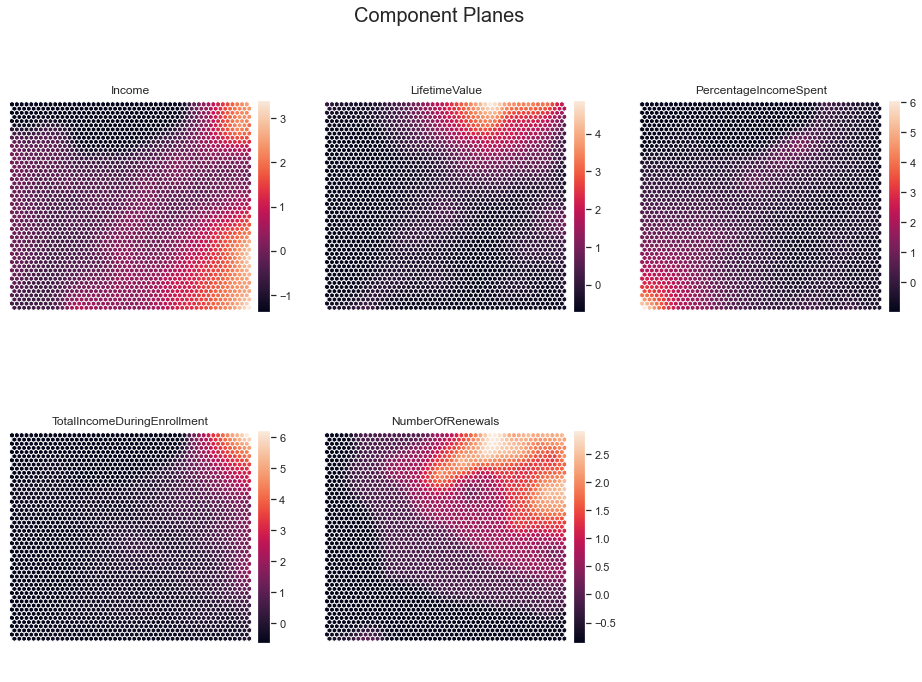

In [288]:
plt.rcParams['figure.dpi'] = 72

sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm_value, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

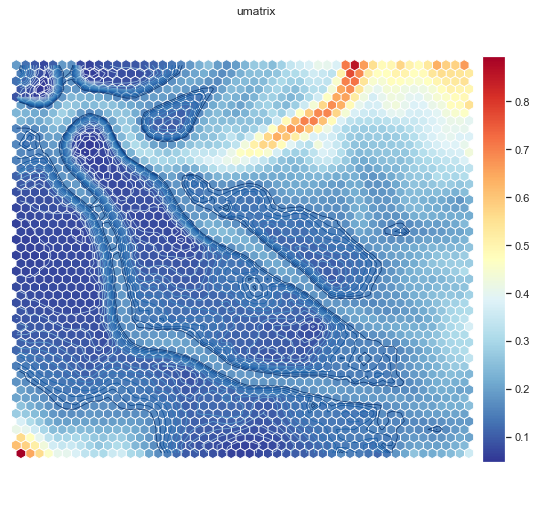

In [289]:
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm_value, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True
)

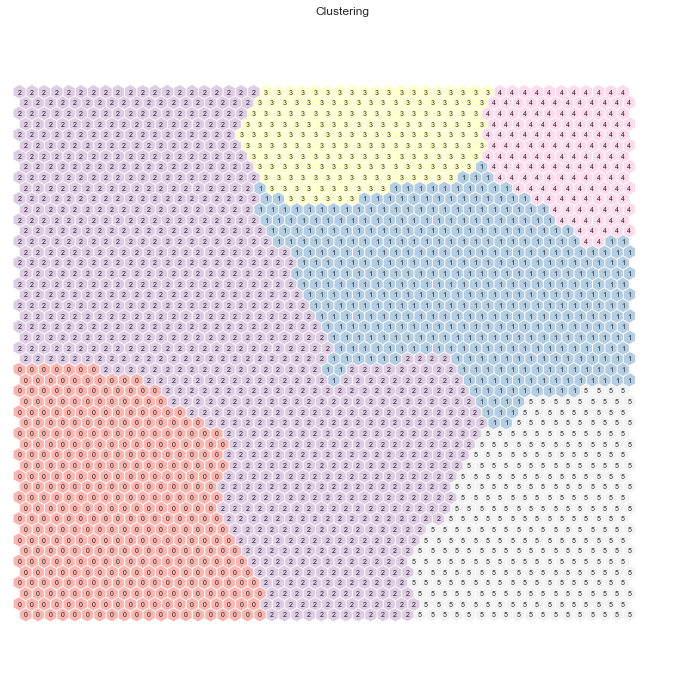

In [290]:
kmeans = KMeans(n_clusters=6, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm_value.codebook.matrix)
sm_value.cluster_labels = nodeclus_labels 

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm_value, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [291]:
nodes = sm_value.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=df_value.columns)
df_nodes['label'] = nodeclus_labels
df_nodes

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals,label
0,2.486483,2.013244,-0.663057,6.210207,2.418924,4
1,2.277573,2.282485,-0.599782,5.693233,2.351773,4
2,2.088391,2.715348,-0.511058,5.219736,2.280827,4
3,1.828445,3.232816,-0.418505,4.931027,2.371028,4
4,1.583216,3.254809,-0.363200,4.490299,2.353917,4
...,...,...,...,...,...,...
2495,-0.559306,-0.278983,3.433428,-0.529815,-0.453455,0
2496,-0.598053,-0.316432,3.970529,-0.550560,-0.516203,0
2497,-0.650715,-0.300346,4.584834,-0.560064,-0.492530,0
2498,-0.633798,-0.379781,5.260955,-0.578911,-0.628357,0


In [292]:
bmus_map = sm_value.find_bmu(df_value)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((data, np.expand_dims(bmus_map,1)), axis=1),
    index=data.index, columns=np.append(data.columns,"BMU")
)
df_bmus

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2456.0
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,867.0
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,1347.0
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,148.0
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,1250.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,20.0
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2126.0
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,1544.0
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,1450.0


In [293]:
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU,label
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2456.0,5
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,867.0,1
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,1347.0,0
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,148.0,2
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,1250.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,20.0,3
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2126.0,2
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,1544.0,0
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,1450.0,5


In [294]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('label').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
label,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.396089,-0.305233,-0.314040,-0.535022,0.010615,0.002793,0.169832,0.643575,0.053073,0.034078,0.142458,0.005587,0.000559,-0.443006,-0.290194,0.332772,0.145729,0.024982,-0.825831,0.003352,0.864804,-0.758334,-0.128156,-0.530007,1.103686,0.031244
1,0.453216,0.002448,0.294408,0.262676,0.110136,0.007310,0.252437,0.637914,0.075049,0.028752,0.142300,0.031676,0.000975,0.428039,-0.036198,0.205617,0.213503,0.099159,0.963011,0.010234,0.807505,0.852793,0.254609,0.542172,-0.083434,-0.146707
2,0.379165,-0.343153,-0.010549,-0.404638,0.032335,0.006889,0.249824,0.608745,0.046956,0.022494,0.103754,0.007592,0.001125,-0.308054,-0.229915,0.018786,-0.027144,-0.076432,-0.439097,0.013637,0.867426,-0.429301,-0.142233,-0.374534,-0.125787,0.016979
3,0.468150,-1.331228,-0.143569,2.209384,0.002022,0.007078,0.882710,0.017189,0.119312,0.008089,0.063701,0.006067,0.000000,0.709333,2.024144,-1.447392,-0.994994,-0.125031,1.533563,0.120324,0.423660,1.568470,0.032353,-0.544558,-0.528853,0.095407
4,0.481481,1.284894,-0.004265,1.574232,0.166667,0.011396,0.356125,0.631054,0.044160,0.008547,0.086895,0.079772,0.000000,1.746268,0.317082,0.191448,0.244970,0.301308,1.928832,0.027066,0.578348,2.070137,0.382350,3.086399,-0.270666,-0.070407
5,0.361139,1.677923,-0.066627,-0.250041,0.043235,0.008647,0.252798,0.620549,0.020855,0.020346,0.072228,0.071719,0.007630,-0.187130,-0.194199,0.116251,0.150791,0.008092,-0.341038,0.010682,0.816887,-0.388686,-0.057987,0.216685,-0.186194,0.031608


In [295]:
df_final.groupby('label').mean()[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals']]

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
label,,,,,
0,-0.305233,-0.535022,1.103686,-0.530007,-0.825831
1,0.002448,0.262676,-0.083434,0.542172,0.963011
2,-0.343153,-0.404638,-0.125787,-0.374534,-0.439097
3,-1.331228,2.209384,-0.528853,-0.544558,1.533563
4,1.284894,1.574232,-0.270666,3.086399,1.928832
5,1.677923,-0.250041,-0.186194,0.216685,-0.341038


In [296]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [297]:
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable


sst = get_ss(df_final[value])  # get total sum of squares
ssw_labels = df_final[value + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.6757471528601747

__Perspective Profiling__

In [298]:
df_final

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU,label
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2456.0,5
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,867.0,1
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,1347.0,0
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,148.0,2
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,1250.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,20.0,3
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2126.0,2
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,1544.0,0
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,1450.0,5


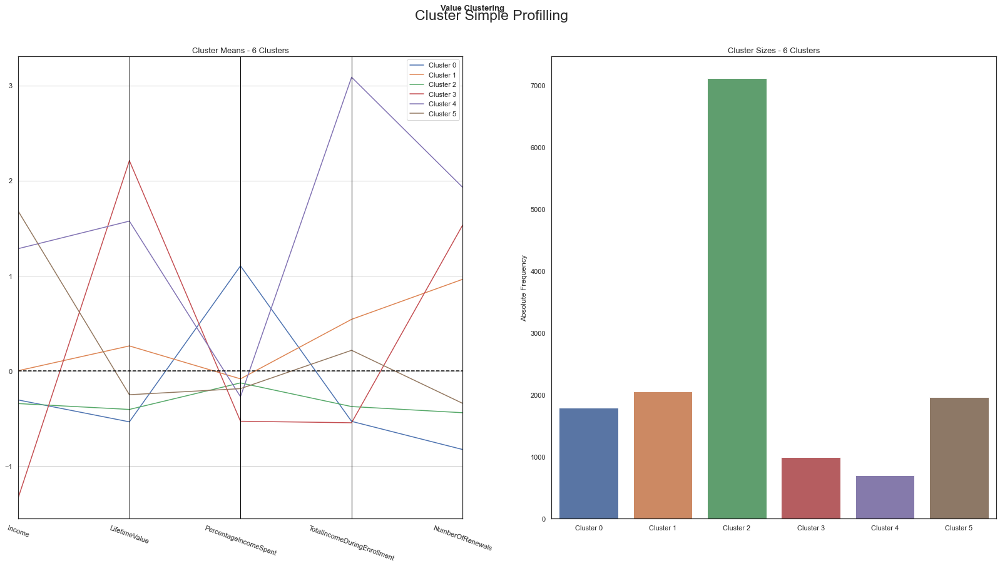

In [299]:
cluster_profiles(
    df = df_final[value + ["label"]], 
    label_columns = ['label'], 
    figsize = (28, 13), 
    compar_titles = ["Value Clustering"]
)

__Cluster Visualization using t-SNE__

In [300]:
two_dim_kmeans_value = TSNE(random_state=42).fit_transform(
    df_final[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals']])

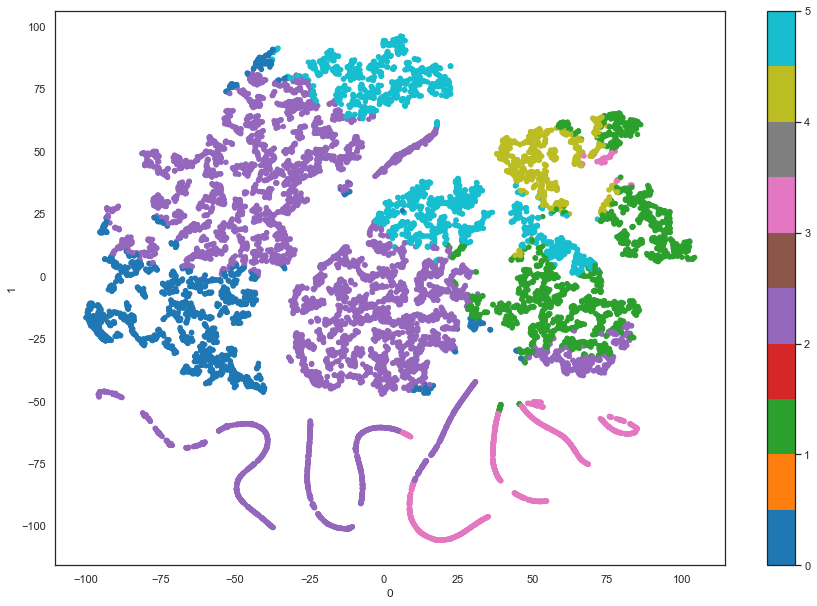

In [301]:
pd.DataFrame(two_dim_kmeans_value).plot.scatter(x=0, y=1, c=df_final['label'], colormap='tab10', figsize=(15,10))
plt.show()

<hr>
<a class = "anchor" id = "45th-bullet">

### 8.3.4. Self-Organizing Maps + Hierarchical Clustering

</a>
</div>

[Return to Index](#index)

In [302]:
df_value

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
0,2.116632,-0.602168,0.350878,-0.502626,-0.872388
1,0.289571,0.526814,0.223479,0.121885,0.589661
2,-0.124224,-0.752033,0.513022,-0.579248,-0.872388
3,-1.384705,-0.410891,-0.587242,-0.622348,-0.872388
4,1.365436,0.219844,-0.384561,1.728548,1.320686
...,...,...,...,...,...
14852,-1.384705,3.368455,-0.587242,-0.622348,1.320686
14853,0.534775,0.134849,0.240851,-0.097284,-0.872388
14854,-0.232447,-0.734657,0.808356,-0.582948,-0.872388
14855,1.671007,1.422818,-0.112391,1.467338,0.589661


In [303]:
sm_value_clusters=pd.DataFrame(nodes)
sm_value_clusters.rename(columns={0:'Income',
                                  1:'LifetimeValue',
                                  2:'PercentageIncomeSpent',
                                  3:'TotalIncomeDuringEnrollment',
                                  4:'NumberOfRenewals'},inplace=True)

In [304]:
sm_value_clusters

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
0,2.486483,2.013244,-0.663057,6.210207,2.418924
1,2.277573,2.282485,-0.599782,5.693233,2.351773
2,2.088391,2.715348,-0.511058,5.219736,2.280827
3,1.828445,3.232816,-0.418505,4.931027,2.371028
4,1.583216,3.254809,-0.363200,4.490299,2.353917
...,...,...,...,...,...
2495,-0.559306,-0.278983,3.433428,-0.529815,-0.453455
2496,-0.598053,-0.316432,3.970529,-0.550560,-0.516203
2497,-0.650715,-0.300346,4.584834,-0.560064,-0.492530
2498,-0.633798,-0.379781,5.260955,-0.578911,-0.628357


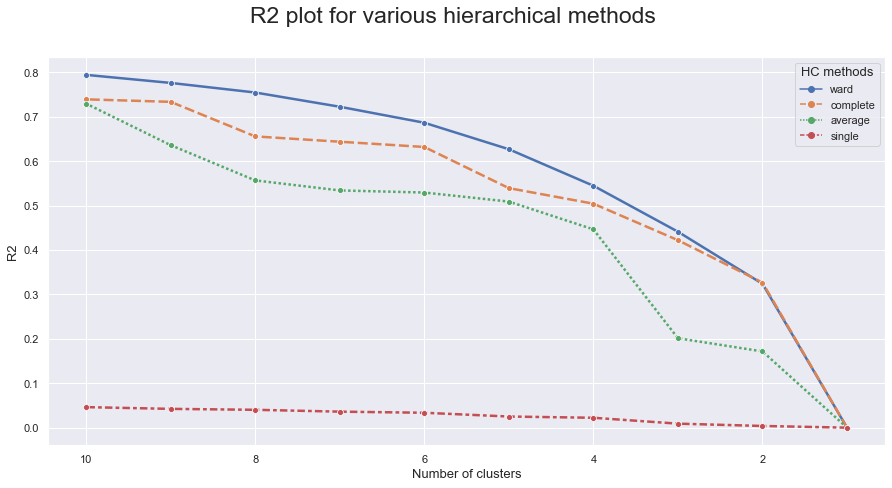

In [305]:
hier_methods = ["ward", "complete", "average", "single"]
# Function defined above to obtain the R2 statistic

r2_hier_methods = pd.DataFrame(data=np.concatenate([np.expand_dims(get_r2_hc(df=sm_value_clusters, link_method=i, max_nclus=10), 1) for i in hier_methods], axis=1),
                             index=range(1,10+1), columns=hier_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(15,7))
sns.lineplot(data=r2_hier_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=23)
plt.gca().invert_xaxis()
plt.legend(title="HC methods", title_fontsize=13)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2", fontsize=13)

plt.show()

Cluster equal to 2 seems lika a good choice

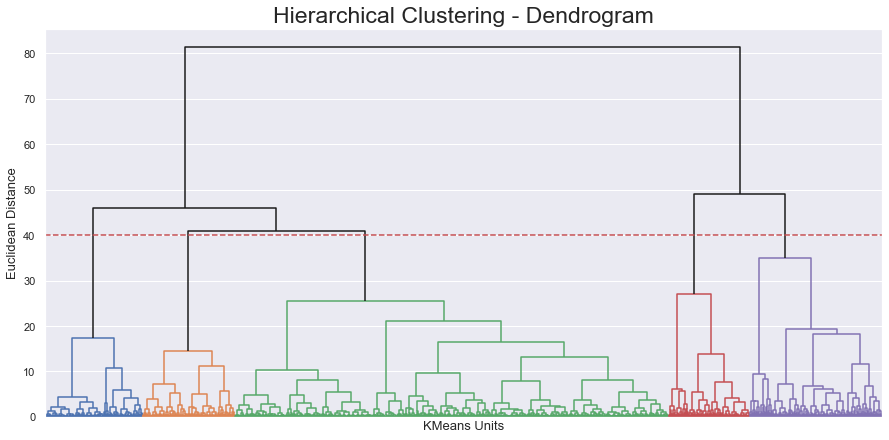

In [306]:
Z = linkage(sm_value_clusters, method="ward")

sns.set()
fig = plt.figure(figsize=(15,7))

# Dendrogram
set_link_color_palette(list(sns.color_palette().as_hex()))
dendrogram(Z, color_threshold=40, orientation='top', no_labels=True, above_threshold_color='k')

plt.hlines(40, 0, 1000000, colors="r", linestyles="dashed")
plt.title('Hierarchical Clustering - Dendrogram', fontsize=23)
plt.xlabel('KMeans Units', fontsize=13)
plt.ylabel('Euclidean Distance', fontsize=13)
plt.show()

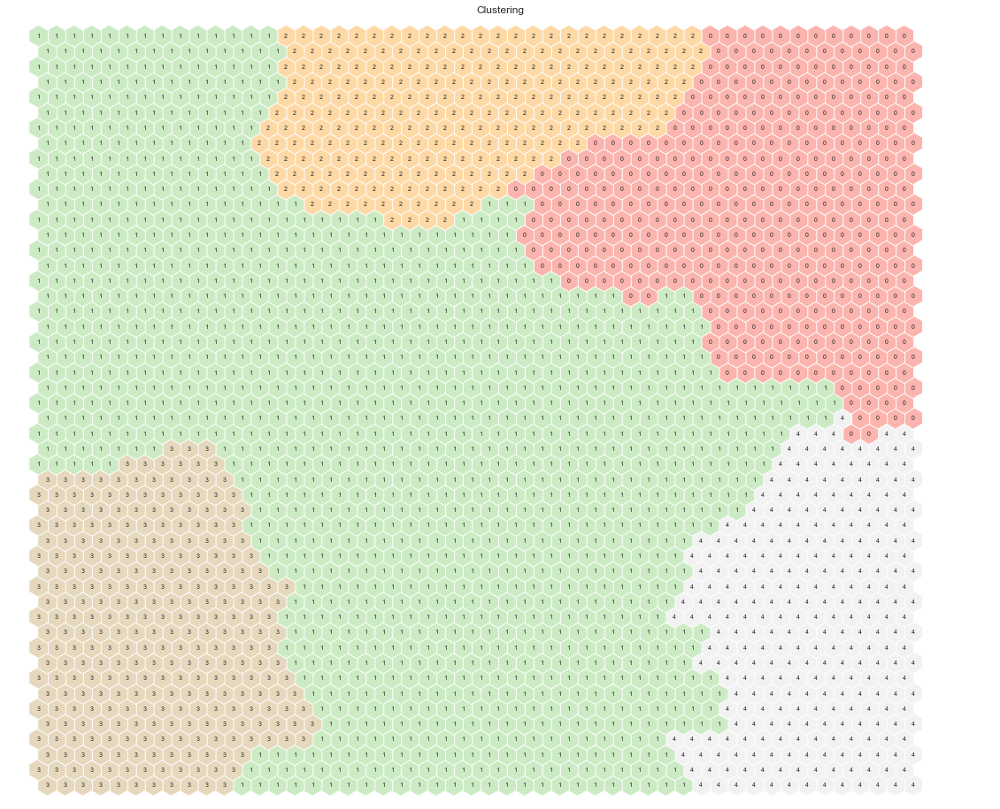

In [307]:
hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm_value.codebook.matrix)
sm_value.cluster_labels = nodeclus_labels

hits  = HitMapView(20, 20,"Clustering",text_size=10)
hits.show(sm_value, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [308]:
nodes = sm_value.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=value)
df_nodes['label'] = nodeclus_labels
df_nodes

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals,label
0,2.486483,2.013244,-0.663057,6.210207,2.418924,0
1,2.277573,2.282485,-0.599782,5.693233,2.351773,0
2,2.088391,2.715348,-0.511058,5.219736,2.280827,0
3,1.828445,3.232816,-0.418505,4.931027,2.371028,0
4,1.583216,3.254809,-0.363200,4.490299,2.353917,0
...,...,...,...,...,...,...
2495,-0.559306,-0.278983,3.433428,-0.529815,-0.453455,3
2496,-0.598053,-0.316432,3.970529,-0.550560,-0.516203,3
2497,-0.650715,-0.300346,4.584834,-0.560064,-0.492530,3
2498,-0.633798,-0.379781,5.260955,-0.578911,-0.628357,3


In [309]:
bmus_map = sm_value.find_bmu(df_value)[0]

df_bmus = pd.DataFrame(
    np.concatenate((data, np.expand_dims(bmus_map,1)), axis=1),
    index=data.index, columns=np.append(data.columns,"BMU")
)
df_bmus

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2456.0
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,867.0
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,1347.0
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,148.0
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,1250.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,20.0
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2126.0
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,1544.0
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,1450.0


In [310]:
df_final_hier = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final_hier

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU,label
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2456.0,4
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,867.0,1
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,1347.0,1
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,148.0,1
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,1250.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,20.0,2
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2126.0,1
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,1544.0,3
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,1450.0,4


In [311]:
df_final_hier.drop(columns='BMU').groupby('label').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
label,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.476088,0.472171,0.268646,0.954338,0.134336,0.010747,0.298764,0.624395,0.076303,0.024718,0.125202,0.049973,0.000537,1.096922,0.207186,0.192825,0.230778,0.195210,1.532412,0.019882,0.696937,1.605117,0.359870,1.677937,-0.135393,-0.063423
1,0.383072,-0.174597,-0.024429,-0.417647,0.041073,0.006410,0.213557,0.647673,0.043803,0.023148,0.111705,0.010684,0.001543,-0.275479,-0.266773,0.148700,0.070537,-0.044668,-0.411592,0.008072,0.874406,-0.405483,-0.107957,-0.308735,-0.036383,-0.019882
2,0.460251,-1.381455,-0.086136,1.549022,0.000697,0.006974,0.859135,0.006276,0.118550,0.013250,0.064854,0.002092,0.000000,0.345936,1.480696,-1.493785,-1.023487,-0.196332,1.101481,0.106695,0.524407,1.023761,-0.069186,-0.618067,-0.584096,0.161142
3,0.387227,-0.409570,-0.334922,-0.574983,0.009701,0.004042,0.160065,0.666936,0.044462,0.033953,0.140663,0.003234,0.000000,-0.477525,-0.303031,0.354063,0.128474,0.023406,-0.842249,0.002425,0.873888,-0.791187,-0.123852,-0.552606,1.286441,0.026308
4,0.359300,1.800576,-0.039467,-0.160669,0.042271,0.007246,0.262077,0.615338,0.022343,0.019324,0.066425,0.085749,0.007246,-0.104126,-0.164966,0.105859,0.166268,0.044618,-0.209786,0.013285,0.791063,-0.290771,-0.024226,0.363450,-0.220235,0.002793


In [312]:
df_final_hier[value + ['label']].groupby('label').mean()

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
label,,,,,
0,0.472171,0.954338,-0.135393,1.677937,1.532412
1,-0.174597,-0.417647,-0.036383,-0.308735,-0.411592
2,-1.381455,1.549022,-0.584096,-0.618067,1.101481
3,-0.409570,-0.574983,1.286441,-0.552606,-0.842249
4,1.800576,-0.160669,-0.220235,0.363450,-0.209786


In [313]:
sst = get_ss(df_final_hier[value])  # get total sum of squares
ssw_labels = df_final_hier[value + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.5879958846915655

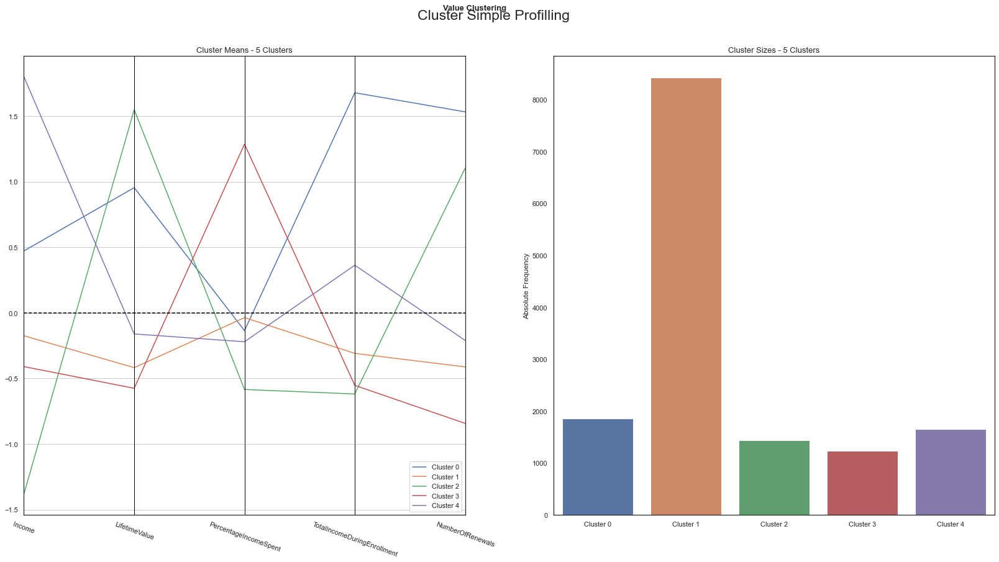

In [314]:
cluster_profiles(
    df = df_final_hier[value + ["label"]], 
    label_columns = ['label'], 
    figsize = (28, 13), 
    compar_titles = ["Value Clustering"]
)

__Cluster Visualization using t-SNE__

In [315]:
two_dim_hier_value = TSNE(random_state=42).fit_transform(
    df_final_hier[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals']])

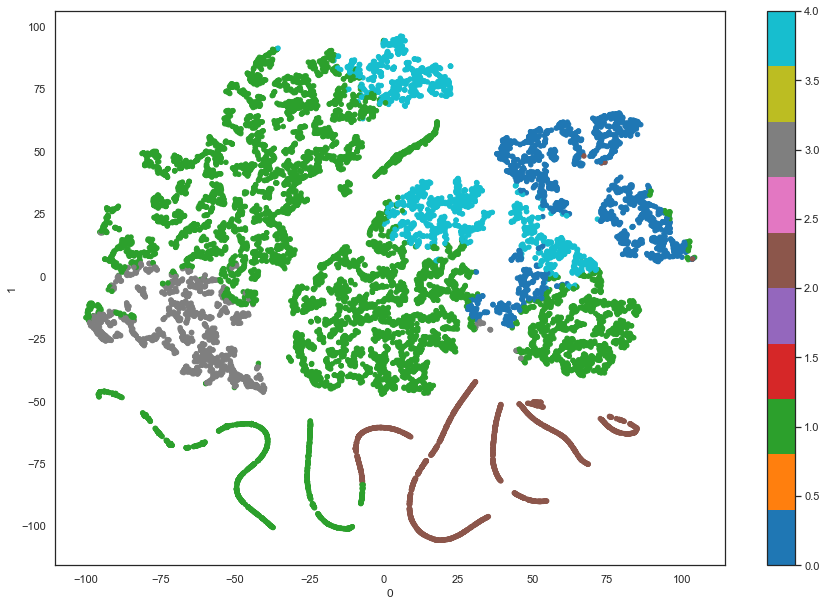

In [316]:
pd.DataFrame(two_dim_hier_value).plot.scatter(x=0, y=1, c=df_final_hier['label'], colormap='tab10', figsize=(15,10))
plt.show()

<hr>
<a class = "anchor" id = "46th-bullet">

### 8.3.5. Mean-Shift Clustering

</a>
</div>

[Return to Index](#index)

In [317]:
bandwidth_values = [0.5, 1.0, 1.2, 1.5, 2.0]

r2_df_ms = pd.DataFrame(columns=['Bandwidth', 'NumClusters', 'R2'])

for bandwidth in bandwidth_values:
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
    ms_labels = ms.fit_predict(df_value)
    ms_n_clusters = len(np.unique(ms_labels))

    df_final_ms = pd.concat([df_value, pd.Series(ms_labels, index=df_value.index, name="ms_labels")], axis=1)
    
    sst = get_ss(df_final_ms[value])
    ssw_labels = df_final_ms[value + ["ms_labels"]].groupby(by='ms_labels').apply(get_ss)
    ssb = sst - np.sum(ssw_labels)
    r2 = ssb / sst

    r2_df_ms.loc[len(r2_df_ms)] = {'Bandwidth': bandwidth, 'NumClusters': ms_n_clusters, 'R2': r2}

print(r2_df_ms)

   Bandwidth  NumClusters        R2
0        0.5          334  0.930145
1        1.0           38  0.745671
2        1.2           12  0.516083
3        1.5            5  0.211865
4        2.0            1  0.000000


In [318]:
ms = MeanShift(bandwidth = 1.2, bin_seeding = True, n_jobs = 4)
ms_labels = ms.fit_predict(df_value)
ms_n_clusters = len(np.unique(ms_labels))

In [319]:
df_final_ms = pd.concat([data, pd.Series(ms_labels, index=data.index, name="ms_labels")], axis=1)
df_final_ms.groupby(by='ms_labels').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
ms_labels,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.389656,-0.066118,-0.037495,-0.313389,0.037187,0.006902,0.253573,0.603605,0.048555,0.023790,0.108720,0.017701,0.002030,-0.242187,-0.190752,0.057285,0.018104,-0.039192,-0.313198,0.012017,0.849302,-0.329792,-0.088422,-0.268658,0.010088,-0.009654
1,0.458266,1.040537,0.293292,0.776313,0.140449,0.008828,0.308989,0.654896,0.048154,0.012841,0.092295,0.069823,0.000803,0.969806,0.112252,0.176861,0.251125,0.173479,1.401650,0.018459,0.703050,1.466652,0.316782,1.860349,-0.278323,-0.047535
2,0.451613,1.515771,-0.415353,3.782853,0.161290,0.000000,0.451613,0.580645,0.032258,0.000000,0.096774,0.161290,0.000000,3.282921,0.178791,0.313220,0.624762,0.477472,2.523339,0.064516,0.322581,2.812954,0.704141,4.523080,-0.192342,0.216760
3,0.491525,0.497709,-0.036348,3.265927,0.135593,0.000000,0.474576,0.491525,0.135593,0.000000,0.050847,0.050847,0.000000,3.400120,0.836968,0.011747,0.155256,0.439810,2.485369,0.050847,0.440678,2.771003,0.337574,2.634920,-0.009137,-0.067425
4,0.445946,2.467970,-0.223383,2.125116,0.148649,0.027027,0.283784,0.675676,0.013514,0.013514,0.094595,0.081081,0.000000,1.962501,0.734448,0.179274,0.290823,0.442069,2.140619,0.067568,0.459459,2.367353,0.293901,5.346701,-0.367267,-0.030407
5,0.487805,2.141513,-0.242143,0.221586,0.292683,0.000000,0.219512,0.829268,0.000000,0.000000,0.048780,0.121951,0.000000,0.543152,-0.307771,0.529391,0.173618,0.418877,2.230009,0.000000,0.634146,2.490833,0.387158,5.016654,-0.503910,0.051288
6,0.500000,-0.977894,-0.064628,-0.466377,0.000000,0.000000,0.200000,0.400000,0.000000,0.000000,0.400000,0.100000,0.000000,-0.467267,-0.246872,0.115588,-0.544451,-0.042248,-0.579978,0.000000,0.700000,-0.718551,0.019603,-0.591424,5.084905,0.506301
7,0.462774,-1.180692,-0.181628,2.532468,0.013139,0.004380,0.829197,0.056934,0.129927,0.020438,0.080292,0.008759,0.000000,1.047705,2.283701,-1.227378,-0.802426,-0.069129,1.698471,0.128467,0.430657,1.791100,0.111643,-0.398526,-0.332300,0.147458
8,0.000000,1.282677,-0.575560,0.415031,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.369186,0.262764,0.586864,0.377892,1.930568,-0.872388,0.000000,0.000000,-0.854101,-0.287942,-0.531142,5.504742,0.623632


In [320]:
df_final_ms[value + ["ms_labels"]].groupby(by='ms_labels').mean()

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
ms_labels,,,,,
0,-0.066118,-0.313389,0.010088,-0.268658,-0.313198
1,1.040537,0.776313,-0.278323,1.860349,1.401650
2,1.515771,3.782853,-0.192342,4.523080,2.523339
3,0.497709,3.265927,-0.009137,2.634920,2.485369
4,2.467970,2.125116,-0.367267,5.346701,2.140619
5,2.141513,0.221586,-0.503910,5.016654,2.230009
6,-0.977894,-0.466377,5.084905,-0.591424,-0.579978
7,-1.180692,2.532468,-0.332300,-0.398526,1.698471
8,1.282677,0.415031,5.504742,-0.531142,-0.872388


<hr>
<a class = "anchor" id = "47th-bullet">

### 8.3.6. DBSCAN

</a>
</div>

[Return to Index](#index)

In [321]:
df_value.shape

(14612, 5)

Some general rules for determining MinPts

The MinPts value is better to be set using domain knowledge and familiarity with the data set. Here are a few rules of thumb for selecting the MinPts value:  
- The larger the data set, the larger the value of MinPts should be
- If the data set is noisier, choose a larger value of MinPts
- Generally, MinPts should be greater than or equal to the dimensionality of the data set
- For 2-dimensional data, use DBSCAN’s default value of MinPts = 4 (Ester et al., 1996).
- If your data has more than 2 dimensions, choose MinPts = 2*dim, where dim= the dimensions of your data set (Sander et al., 1998).  

(http://www.sefidian.com/2022/12/18/how-to-determine-epsilon-and-minpts-parameters-of-dbscan-clustering/)

In [322]:
len(indices)

14857

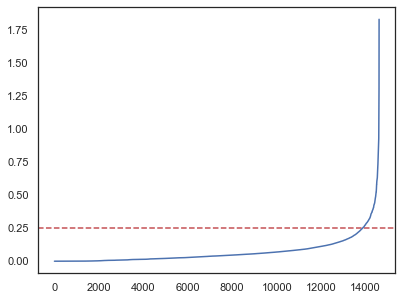

In [323]:
neigh = NearestNeighbors(n_neighbors = 10)
neighbors_fit = neigh.fit(df_value)
distances, indices = neighbors_fit.kneighbors(df_value)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.axhline(y=0.25, color='r', linestyle='--')

plt.plot(distances)


In [324]:
dbscan = DBSCAN(eps=0.25, min_samples=10, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_value)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 19


In [325]:
eps_values = np.arange(0.1, 1.0, 0.05)

r2_df_dbscan = pd.DataFrame(columns=['Clusters', 'Eps', 'R2'])

for eps in eps_values:
    dbscan = DBSCAN(eps=eps, min_samples=10, n_jobs=4)
    dbscan_labels = dbscan.fit_predict(df_value)
    
    dbscan_n_clusters = len(np.unique(dbscan_labels))

    df_final_dbscan = pd.concat([df_value, pd.Series(dbscan_labels, index=df_value.index, name="dbscan_labels")], axis=1)
    
    sst = get_ss(df_final_dbscan[value])
    ssw_labels = df_final_dbscan[value + ["dbscan_labels"]].groupby(by='dbscan_labels').apply(get_ss)
    ssb = sst - np.sum(ssw_labels)
    r2 = ssb / sst
    
    r2_df_dbscan.loc[len(r2_df_dbscan)] = {'Clusters': dbscan_n_clusters,'Eps': eps, 'R2': r2}

print(r2_df_dbscan)

    Clusters   Eps        R2
0         39  0.10  0.380047
1         34  0.15  0.492227
2         24  0.20  0.556222
3         19  0.25  0.580253
4         19  0.30  0.604101
5         18  0.35  0.622928
6         17  0.40  0.595249
7         19  0.45  0.609707
8         16  0.50  0.608559
9         15  0.55  0.609028
10        13  0.60  0.575882
11        13  0.65  0.577149
12        12  0.70  0.573747
13         3  0.75  0.074508
14         3  0.80  0.059146
15         3  0.85  0.044734
16         2  0.90  0.022191
17         2  0.95  0.015467


In [326]:
dbscan = DBSCAN(eps=0.35, min_samples=10, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_value)
dbscan_n_clusters = len(np.unique(dbscan_labels))

In [327]:
df_final_dbscan = pd.concat([data, pd.Series(dbscan_labels, index=data.index, name="dbscan_labels")], axis=1)
df_final_dbscan.groupby(by='dbscan_labels').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
dbscan_labels,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,0.458432,1.170391,0.256696,1.149779,0.108472,0.007918,0.347585,0.556611,0.083927,0.027712,0.092637,0.073634,0.000792,1.043218,0.320156,0.064806,0.148625,0.126709,1.357150,0.030087,0.593032,1.367031,0.298903,1.959790,-0.031397,0.053004
0,0.366075,0.151838,-0.288515,-0.547008,0.032556,0.006289,0.160007,0.712172,0.027562,0.016648,0.107658,0.009064,0.000185,-0.400899,-0.315885,0.366813,0.326220,-0.013571,-0.872388,0.001850,0.926748,-0.701053,-0.166199,-0.432302,0.349152,0.012020
1,0.428665,0.153144,0.020309,-0.006609,0.089005,0.005890,0.229712,0.655105,0.055628,0.022906,0.132853,0.038613,0.001963,0.170093,-0.133563,0.210275,0.206389,0.026934,0.589661,0.006545,0.839660,0.238309,0.150834,0.217720,-0.089595,-0.290325
2,0.436364,-1.384705,-0.292134,-0.325973,0.001653,0.006612,0.664463,0.021488,0.163636,0.069421,0.092562,0.000000,0.000000,-0.465422,-0.048429,-1.412796,-1.032159,-0.324312,-0.872388,0.021488,0.775207,-0.637991,-0.232025,-0.622348,-0.587242,0.278913
3,0.466667,-0.018184,0.245341,0.391360,0.140351,0.015789,0.250877,0.659649,0.059649,0.015789,0.145614,0.035088,0.000000,0.630863,0.048759,0.264412,0.253870,0.093022,1.320686,0.014035,0.817544,1.274515,0.273194,0.816056,-0.177320,-0.136444
4,0.440000,-0.025677,1.017689,-0.293548,0.280000,0.000000,0.160000,0.920000,0.040000,0.000000,0.160000,0.000000,0.000000,-0.196023,-0.315068,0.492609,0.282334,0.161609,2.782735,0.000000,0.760000,2.822087,0.573186,1.825414,-0.485554,-0.737402
5,0.485401,-1.384705,-0.093303,0.798041,0.000000,0.010949,0.841241,0.003650,0.125912,0.009124,0.067518,0.000000,0.000000,-0.007124,0.827050,-1.536460,-1.049597,-0.257950,0.589661,0.058394,0.607664,0.302471,-0.108354,-0.622348,-0.587242,0.083547
6,0.367588,0.175676,0.249067,-0.339199,0.032909,0.006520,0.162993,0.708165,0.024837,0.027010,0.107420,0.031046,0.006520,-0.163283,-0.254272,0.281068,-0.035635,0.048144,-0.141363,0.008382,0.824899,-0.237454,-0.058787,-0.099542,-0.098735,0.040531
7,0.455882,-1.384705,-0.069322,2.564037,0.000000,0.009804,0.877451,0.004902,0.127451,0.014706,0.068627,0.004902,0.000000,0.801115,2.353001,-1.538500,-1.101782,-0.205038,2.051711,0.166667,0.392157,2.021482,0.043725,-0.622348,-0.587242,0.048482


In [328]:
df_final_dbscan[value + ["dbscan_labels"]].groupby(by='dbscan_labels').mean()

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
dbscan_labels,,,,,
-1,1.170391,1.149779,-0.031397,1.959790,1.357150
0,0.151838,-0.547008,0.349152,-0.432302,-0.872388
1,0.153144,-0.006609,-0.089595,0.217720,0.589661
2,-1.384705,-0.325973,-0.587242,-0.622348,-0.872388
3,-0.018184,0.391360,-0.177320,0.816056,1.320686
4,-0.025677,-0.293548,-0.485554,1.825414,2.782735
5,-1.384705,0.798041,-0.587242,-0.622348,0.589661
6,0.175676,-0.339199,-0.098735,-0.099542,-0.141363
7,-1.384705,2.564037,-0.587242,-0.622348,2.051711


In [329]:
df_final_dbscan.loc[df_final_dbscan['dbscan_labels'] == -1]

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,dbscan_labels
4,1,1.365436,0.925078,0.219844,0,0,0,1,0,0,0,0,0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0,1,0.866532,-0.287942,1.728548,-0.384561,-0.843000,-1
16,1,1.473659,-0.325454,1.538366,1,0,0,1,0,0,1,0,0,4.348824,-0.360532,0.586864,0.033373,0.615357,2.782735,0,1,3.422423,2.787515,5.339568,-0.413516,0.916958,-1
26,1,-0.563482,-0.132514,1.766276,0,0,0,0,0,1,0,0,0,0.425604,2.095990,-1.769518,-1.204678,-0.864255,0.589661,0,1,0.384468,-0.287942,-0.088825,1.555376,-1.722979,-1
49,1,2.778703,-0.561268,0.703177,0,0,1,0,0,0,0,0,0,1.237305,-0.360532,0.586864,0.988860,4.396590,-0.141363,0,0,0.014568,-0.287942,1.370690,-0.245581,0.623632,-1
54,1,3.205230,-0.139660,1.529678,0,0,0,0,0,0,1,0,0,0.662350,-0.360532,0.586864,1.041746,-0.699854,1.320686,0,1,1.599173,-0.287942,5.027639,-0.401934,0.623632,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14794,0,2.619551,-0.032472,-0.361081,0,0,0,1,0,0,0,0,0,-0.572111,-0.250539,-1.769518,-1.506888,-0.864255,0.589661,0,1,-0.696595,-0.287942,-0.074676,-0.187672,0.330306,-1
14804,1,1.028034,-0.568414,1.036644,0,0,1,0,0,0,0,0,0,-0.335365,-0.360532,0.586864,0.939499,2.259371,-0.141363,0,0,-0.620229,-0.287942,-0.209852,1.416396,-0.549673,-1
14829,1,1.117159,0.867911,0.312804,1,0,0,1,1,0,0,0,0,-0.149351,-0.360532,0.586864,1.041746,-0.699854,1.320686,0,1,1.007333,2.787515,1.687408,-0.367189,-0.843000,-1
14855,1,1.671007,-0.554122,1.422818,0,0,1,0,0,0,0,0,0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0,0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,-1


In [330]:
df_nonoise = df_final_dbscan.loc[df_final_dbscan['dbscan_labels'] != -1]
sst = get_ss(df_nonoise[value])  # get total sum of squares
ssw_labels = df_nonoise[value + ["dbscan_labels"]].groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.6828


<hr>
<a class = "anchor" id = "48th-bullet">

## 8.4. Time View

</a>
</div>

[Return to Index](#index)

In [331]:
time = ['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses','RealNumberOfVisits','EnrolledDays']

<hr>
<a class = "anchor" id = "49th-bullet">

### 8.4.1. K-Means

</a>
</div>

[Return to Index](#index)

In [332]:
range_clusters2 = range(1, 20)

Calculating inertia for each range of cluster

In [333]:
inertia2 = []
for n_clus in range_clusters2:  
    kmclust2 = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=42)
    kmclust2.fit(df_time)
    inertia2.append(kmclust2.inertia_)

Inertia Plotting and Elbow Identification


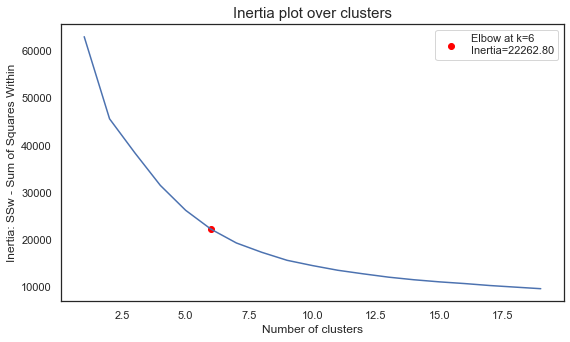

In [334]:
plt.figure(figsize=(9,5))
plt.plot(range_clusters2, inertia2)
plt.ylabel("Inertia: SSw - Sum of Squares Within")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)

kneedle2 = KneeLocator(range_clusters2, inertia2, curve='convex', direction='decreasing')
elbow_k2 = kneedle2.knee
elbow_inertia2 = inertia2[elbow_k2 - 1]

# Plot the elbow point
plt.scatter(elbow_k2, elbow_inertia2, color='red', marker='o', label=f'Elbow at k={elbow_k2}\nInertia={elbow_inertia2:.2f}')
plt.legend()

plt.show()

In [335]:
avg_silhouette2 = []
for nclus in range_clusters2:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    kmclust2 = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=42)
    cluster_labels2 = kmclust2.fit_predict(df_time)

    silhouette_avg = silhouette_score(df_time, cluster_labels2)
    avg_silhouette2.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

For n_clusters = 2, the average silhouette_score is : 0.5036052988501365
For n_clusters = 3, the average silhouette_score is : 0.43377192005921145
For n_clusters = 4, the average silhouette_score is : 0.45288625818080924
For n_clusters = 5, the average silhouette_score is : 0.4170947041381658
For n_clusters = 6, the average silhouette_score is : 0.3906816646088811
For n_clusters = 7, the average silhouette_score is : 0.37692422312761686
For n_clusters = 8, the average silhouette_score is : 0.33447140294612837
For n_clusters = 9, the average silhouette_score is : 0.3449587317796915
For n_clusters = 10, the average silhouette_score is : 0.32752607491744223
For n_clusters = 11, the average silhouette_score is : 0.3240989846102731
For n_clusters = 12, the average silhouette_score is : 0.2904455731462486
For n_clusters = 13, the average silhouette_score is : 0.2789512742463353
For n_clusters = 14, the average silhouette_score is : 0.27509189073666374
For n_clusters = 15, the average silhoue

Even though using 2 to 5 clusters provides a bigger average silhouette score than 6, if we use 2 to 5 clusters the inertia will be way bigger than when we have 6 clusters. And since 6 clusters (besides 2 to 5) is the number of clusters for which average silhouette score is higher, we will define the optimal number of clusters as 6 for the value perspective (using k-means), but just to be sure we will also test with 5 clusters to perfectly define the best approach.

Definitive Number of Clusters


For 6 clusters

In [336]:
kmclust2 = KMeans(n_clusters=6, init='k-means++', n_init=15, random_state=1)
km_labels2 = kmclust2.fit_predict(df_time)
km_labels2

array([4, 4, 4, ..., 4, 2, 5])

For 5 clusters

In [337]:
kmclust3 = KMeans(n_clusters=5, init='k-means++', n_init=15, random_state=1)
km_labels3 = kmclust3.fit_predict(df_time)
km_labels3

array([0, 0, 0, ..., 0, 2, 3])

Cluster Characterization

Only df_time

For 6 clusters

In [338]:
df_kmeans_time_original = pd.concat((df_time, pd.Series(km_labels2, name='labels', index=df_time.index)), axis=1)
df_kmeans_time_original.groupby('labels').mean()

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
labels,,,,,
0,-0.343930,0.116704,-0.207668,1.615850,-0.372895
1,5.284716,-0.278130,-0.172352,-0.388615,1.150652
2,-0.332577,1.332436,3.502969,0.128565,1.803071
3,-0.118875,0.270222,0.158074,-0.276887,1.164924
4,-0.025427,-0.417322,-0.264045,-0.373696,-0.506176
5,-0.345627,3.228011,-0.294857,1.420042,1.718956


For 5 clusters

In [339]:
df_kmeans_time_original2 = pd.concat((df_time, pd.Series(km_labels3, name='labels', index=df_time.index)), axis=1)
df_kmeans_time_original2.groupby('labels').mean()

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
labels,,,,,
0,-0.031302,-0.369424,-0.221249,-0.369413,-0.379076
1,-0.354613,0.168264,-0.216653,1.695647,-0.354988
2,-0.307997,1.087755,3.011012,0.021748,1.608359
3,-0.220274,1.493813,-0.225664,0.325387,1.801347
4,5.204610,-0.280354,-0.170364,-0.387423,1.149123


R2 (for 5 and 6 clusters)

For 5 clusters

In [340]:
sst = get_ss(df_kmeans_time_original2[time])  # get total sum of squares
ssw_labels = df_kmeans_time_original2[time + ["labels"]].groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.5833298815227526

For 6 clusters

In [341]:
sst = get_ss(df_kmeans_time_original[time])  # get total sum of squares
ssw_labels = df_kmeans_time_original[time + ["labels"]].groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.6467802142835442

After checking, __maintaining 6 clusters for k-means clustering is the best choice__.

Full Dataset

For 6 clusters

In [342]:
df_kmeans_time = pd.concat((data, pd.Series(km_labels2, name='labels', index=data.index)), axis=1)
df_kmeans_time.groupby('labels').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
labels,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.439772,0.229496,-0.343930,-0.286479,0.045691,0.005192,0.213396,0.723780,0.015576,0.019730,0.051402,0.035826,0.000519,0.116704,-0.207668,0.346696,0.320981,1.615850,-0.364922,0.007269,0.762201,-0.372895,-0.086744,-0.171121,0.122926,-0.037951
1,0.431624,-0.069122,5.284716,0.099638,0.000000,0.000000,0.183761,0.568376,0.123932,0.042735,0.102564,0.004274,0.000000,-0.278130,-0.172352,-0.049561,-0.018984,-0.388615,1.361298,0.021368,0.769231,1.150652,-0.209085,0.676513,-0.306756,0.026951
2,0.414977,-0.700588,-0.332577,2.565842,0.012480,0.001560,0.864275,0.092044,0.082683,0.020281,0.018721,0.009360,0.000000,1.332436,3.502969,-1.344560,-0.896109,0.128565,1.644572,0.127925,0.385335,1.803071,-0.014462,0.140327,-0.368625,0.159618
3,0.455441,-0.080884,-0.118875,0.666903,0.118674,0.011196,0.406628,0.505598,0.084639,0.017017,0.130318,0.023287,0.000000,0.270222,0.158074,-0.208375,-0.134116,-0.276887,1.063371,0.032691,0.736677,1.164924,0.261591,0.740974,-0.271563,0.062726
4,0.367383,-0.023610,-0.025427,-0.428034,0.026556,0.006612,0.240220,0.594050,0.050138,0.025895,0.119449,0.016088,0.002755,-0.417322,-0.264045,0.050786,-0.007646,-0.373696,-0.464383,0.011019,0.879780,-0.506176,-0.118157,-0.331979,0.060606,-0.026825
5,0.560636,0.636445,-0.345627,1.552078,0.153082,0.009940,0.244533,0.725646,0.033797,0.000000,0.081511,0.115308,0.000000,3.228011,-0.294857,0.582179,0.635721,1.420042,1.480552,0.017893,0.560636,1.718956,0.360166,1.974735,-0.082942,0.100543


__Perspective Profiling__

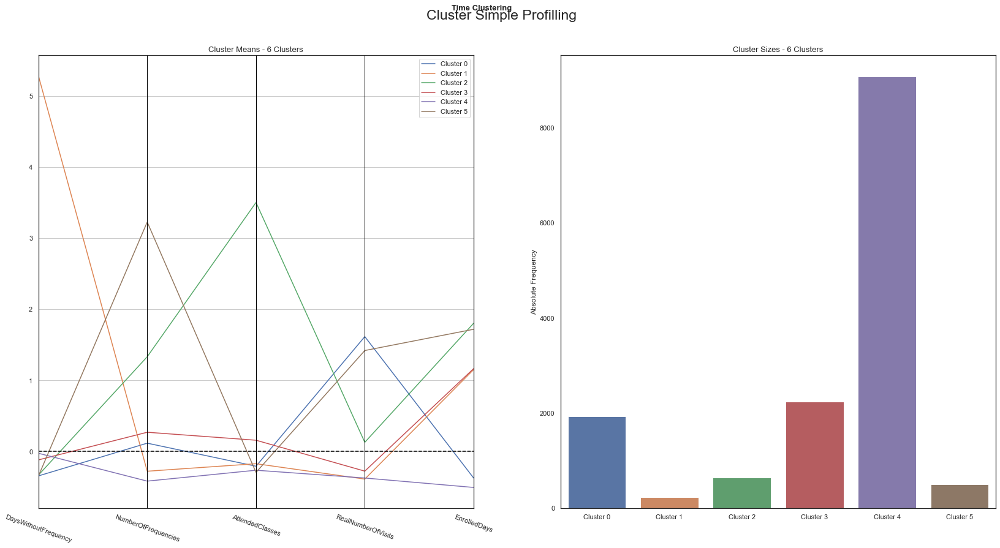

In [343]:
cluster_profiles(
    df = df_kmeans_time_original, 
    label_columns = ['labels'], 
    figsize = (28, 13), 
    compar_titles = ["Time Clustering"]
)

<hr>
<a class = "anchor" id = "50th-bullet">

### 8.4.2. Self-Organizing Maps

</a>
</div>

[Return to Index](#index)

Only SOM

In [344]:
sm_time = sompy.SOMFactory().build(
    df_time.values, 
    mapsize=[3, 2],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays'] #the name of the list which contains the variables of this perspective
)

sm_time.train(n_job=-1, verbose='info',
         train_rough_len=2000,
         train_finetune_len=2000)

final_clusters_time = pd.DataFrame(sm_time._data, columns = ['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays'])

my_labels_time = pd.DataFrame(sm_time._bmu[0])
    
final_clusters_time = pd.concat([final_clusters_time,my_labels_time], axis = 1)

final_clusters_time.columns = ['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays','Value']

final_clusters_time

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 1.000000 , radius_final: 1.000000, trainlen: 2000

 epoch: 1 ---> elapsed time:  0.071000, quantization error: 7.158263

 epoch: 2 ---> elapsed time:  0.059000, quantization error: 1.748105

 epoch: 3 ---> elapsed time:  0.047000, quantization error: 1.514421

 epoch: 4 ---> elapsed time:  0.047000, quantization error: 1.466864

 epoch: 5 ---> elapsed time:  0.032000, quantization error: 1.458637

 epoch: 6 ---> elapsed time:  0.031000, quantization error: 1.439266

 epoch: 7 ---> elapsed time:  0.031000, quantization error: 1.396999

 epoch: 8 ---> elapsed time:  0.032000, quantization error: 1.381427

 epoch: 9 ---> elapsed time:  0.031000, quantization error: 1.379343

 epoch: 10 ---> elapsed time:  0.047000, quantization error: 1.379047

 epoch: 11 ---> elapsed time:  0.048000, quantization error: 1.378991

 epoch: 12 ---> elapsed time:  0.065000, quantization error: 1.378731

 epoch: 13 --->

 epoch: 115 ---> elapsed time:  0.035000, quantization error: 1.378797

 epoch: 116 ---> elapsed time:  0.028000, quantization error: 1.378797

 epoch: 117 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 118 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 119 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 120 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 121 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 122 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 123 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 124 ---> elapsed time:  0.038000, quantization error: 1.378797

 epoch: 125 ---> elapsed time:  0.025000, quantization error: 1.378797

 epoch: 126 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 127 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 128 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 229 ---> elapsed time:  0.051000, quantization error: 1.378797

 epoch: 230 ---> elapsed time:  0.043000, quantization error: 1.378797

 epoch: 231 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 232 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 233 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 234 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 235 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 236 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 237 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 238 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 239 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 240 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 241 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 242 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 343 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 344 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 345 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 346 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 347 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 348 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 349 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 350 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 351 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 352 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 353 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 354 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 355 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 356 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 457 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 458 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 459 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 460 ---> elapsed time:  0.030000, quantization error: 1.378797

 epoch: 461 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 462 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 463 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 464 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 465 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 466 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 467 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 468 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 469 ---> elapsed time:  0.030000, quantization error: 1.378797

 epoch: 470 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 571 ---> elapsed time:  0.041000, quantization error: 1.378797

 epoch: 572 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 573 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 574 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 575 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 576 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 577 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 578 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 579 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 580 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 581 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 582 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 583 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 584 ---> elapsed time:  0.047000, quantization error: 1.

 epoch: 685 ---> elapsed time:  0.025000, quantization error: 1.378797

 epoch: 686 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 687 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 688 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 689 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 690 ---> elapsed time:  0.035000, quantization error: 1.378797

 epoch: 691 ---> elapsed time:  0.044000, quantization error: 1.378797

 epoch: 692 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 693 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 694 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 695 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 696 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 697 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 698 ---> elapsed time:  0.041000, quantization error: 1.

 epoch: 799 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 800 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 801 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 802 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 803 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 804 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 805 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 806 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 807 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 808 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 809 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 810 ---> elapsed time:  0.037000, quantization error: 1.378797

 epoch: 811 ---> elapsed time:  0.042000, quantization error: 1.378797

 epoch: 812 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 913 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 914 ---> elapsed time:  0.041000, quantization error: 1.378797

 epoch: 915 ---> elapsed time:  0.022000, quantization error: 1.378797

 epoch: 916 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 917 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 918 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 919 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 920 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 921 ---> elapsed time:  0.025000, quantization error: 1.378797

 epoch: 922 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 923 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 924 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 925 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 926 ---> elapsed time:  0.034000, quantization error: 1.

 epoch: 1027 ---> elapsed time:  0.021000, quantization error: 1.378797

 epoch: 1028 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1029 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1030 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1031 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1032 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1033 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1034 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1035 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1036 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1037 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1038 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1039 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1040 ---> elapsed time:  0.031000, quantiza

 epoch: 1140 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1141 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1142 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1143 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1144 ---> elapsed time:  0.035000, quantization error: 1.378797

 epoch: 1145 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1146 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1147 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1148 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1149 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1150 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1151 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1152 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1153 ---> elapsed time:  0.047000, quantiza

 epoch: 1253 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1254 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1255 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1256 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1257 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1258 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1259 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1260 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1261 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1262 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1263 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1264 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1265 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1266 ---> elapsed time:  0.031000, quantiza

 epoch: 1366 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1367 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1368 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1369 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1370 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1371 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1372 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1373 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1374 ---> elapsed time:  0.050000, quantization error: 1.378797

 epoch: 1375 ---> elapsed time:  0.046000, quantization error: 1.378797

 epoch: 1376 ---> elapsed time:  0.048000, quantization error: 1.378797

 epoch: 1377 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1378 ---> elapsed time:  0.048000, quantization error: 1.378797

 epoch: 1379 ---> elapsed time:  0.031000, quantiza

 epoch: 1479 ---> elapsed time:  0.046000, quantization error: 1.378797

 epoch: 1480 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1481 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1482 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1483 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1484 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1485 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1486 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1487 ---> elapsed time:  0.034000, quantization error: 1.378797

 epoch: 1488 ---> elapsed time:  0.035000, quantization error: 1.378797

 epoch: 1489 ---> elapsed time:  0.028000, quantization error: 1.378797

 epoch: 1490 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1491 ---> elapsed time:  0.040000, quantization error: 1.378797

 epoch: 1492 ---> elapsed time:  0.021000, quantiza

 epoch: 1592 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1593 ---> elapsed time:  0.024000, quantization error: 1.378797

 epoch: 1594 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1595 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1596 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1597 ---> elapsed time:  0.045000, quantization error: 1.378797

 epoch: 1598 ---> elapsed time:  0.034000, quantization error: 1.378797

 epoch: 1599 ---> elapsed time:  0.046000, quantization error: 1.378797

 epoch: 1600 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1601 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1602 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1603 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1604 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1605 ---> elapsed time:  0.033000, quantiza

 epoch: 1705 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1706 ---> elapsed time:  0.035000, quantization error: 1.378797

 epoch: 1707 ---> elapsed time:  0.027000, quantization error: 1.378797

 epoch: 1708 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1709 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1710 ---> elapsed time:  0.036000, quantization error: 1.378797

 epoch: 1711 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1712 ---> elapsed time:  0.028000, quantization error: 1.378797

 epoch: 1713 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1714 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1715 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1716 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1717 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1718 ---> elapsed time:  0.033000, quantiza

 epoch: 1818 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1819 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1820 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1821 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1822 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1823 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1824 ---> elapsed time:  0.042000, quantization error: 1.378797

 epoch: 1825 ---> elapsed time:  0.038000, quantization error: 1.378797

 epoch: 1826 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1827 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1828 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1829 ---> elapsed time:  0.048000, quantization error: 1.378797

 epoch: 1830 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1831 ---> elapsed time:  0.032000, quantiza

 epoch: 1931 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1932 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1933 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1934 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1935 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1936 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1937 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1938 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1939 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1940 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1941 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1942 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1943 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1944 ---> elapsed time:  0.048000, quantiza

 epoch: 44 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 45 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 46 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 47 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 48 ---> elapsed time:  0.016000, quantization error: 1.378797

 epoch: 49 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 50 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 51 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 52 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 53 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 54 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 55 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 56 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 57 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch

 epoch: 159 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 160 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 161 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 162 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 163 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 164 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 165 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 166 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 167 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 168 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 169 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 170 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 171 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 172 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 273 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 274 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 275 ---> elapsed time:  0.038000, quantization error: 1.378797

 epoch: 276 ---> elapsed time:  0.025000, quantization error: 1.378797

 epoch: 277 ---> elapsed time:  0.110000, quantization error: 1.378797

 epoch: 278 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 279 ---> elapsed time:  0.034000, quantization error: 1.378797

 epoch: 280 ---> elapsed time:  0.029000, quantization error: 1.378797

 epoch: 281 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 282 ---> elapsed time:  0.040000, quantization error: 1.378797

 epoch: 283 ---> elapsed time:  0.039000, quantization error: 1.378797

 epoch: 284 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 285 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 286 ---> elapsed time:  0.047000, quantization error: 1.

 epoch: 387 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 388 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 389 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 390 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 391 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 392 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 393 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 394 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 395 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 396 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 397 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 398 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 399 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 400 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 501 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 502 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 503 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 504 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 505 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 506 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 507 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 508 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 509 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 510 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 511 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 512 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 513 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 514 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 615 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 616 ---> elapsed time:  0.035000, quantization error: 1.378797

 epoch: 617 ---> elapsed time:  0.028000, quantization error: 1.378797

 epoch: 618 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 619 ---> elapsed time:  0.041000, quantization error: 1.378797

 epoch: 620 ---> elapsed time:  0.022000, quantization error: 1.378797

 epoch: 621 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 622 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 623 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 624 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 625 ---> elapsed time:  0.063000, quantization error: 1.378797

 epoch: 626 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 627 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 628 ---> elapsed time:  0.047000, quantization error: 1.

 epoch: 729 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 730 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 731 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 732 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 733 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 734 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 735 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 736 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 737 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 738 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 739 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 740 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 741 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 742 ---> elapsed time:  0.032000, quantization error: 1.

 epoch: 843 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 844 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 845 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 846 ---> elapsed time:  0.038000, quantization error: 1.378797

 epoch: 847 ---> elapsed time:  0.056000, quantization error: 1.378797

 epoch: 848 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 849 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 850 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 851 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 852 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 853 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 854 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 855 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 856 ---> elapsed time:  0.031000, quantization error: 1.

 epoch: 957 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 958 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 959 ---> elapsed time:  0.066000, quantization error: 1.378797

 epoch: 960 ---> elapsed time:  0.029000, quantization error: 1.378797

 epoch: 961 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 962 ---> elapsed time:  0.040000, quantization error: 1.378797

 epoch: 963 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 964 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 965 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 966 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 967 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 968 ---> elapsed time:  0.037000, quantization error: 1.378797

 epoch: 969 ---> elapsed time:  0.026000, quantization error: 1.378797

 epoch: 970 ---> elapsed time:  0.047000, quantization error: 1.

 epoch: 1070 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1071 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1072 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1073 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1074 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1075 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1076 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1077 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1078 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1079 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1080 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1081 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1082 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1083 ---> elapsed time:  0.032000, quantiza

 epoch: 1183 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1184 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1185 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1186 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1187 ---> elapsed time:  0.038000, quantization error: 1.378797

 epoch: 1188 ---> elapsed time:  0.025000, quantization error: 1.378797

 epoch: 1189 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1190 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1191 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1192 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1193 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1194 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1195 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1196 ---> elapsed time:  0.031000, quantiza

 epoch: 1296 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1297 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1298 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1299 ---> elapsed time:  0.063000, quantization error: 1.378797

 epoch: 1300 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1301 ---> elapsed time:  0.039000, quantization error: 1.378797

 epoch: 1302 ---> elapsed time:  0.024000, quantization error: 1.378797

 epoch: 1303 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1304 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1305 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1306 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1307 ---> elapsed time:  0.035000, quantization error: 1.378797

 epoch: 1308 ---> elapsed time:  0.028000, quantization error: 1.378797

 epoch: 1309 ---> elapsed time:  0.047000, quantiza

 epoch: 1409 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1410 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1411 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1412 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1413 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1414 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1415 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1416 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1417 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1418 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1419 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1420 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1421 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1422 ---> elapsed time:  0.032000, quantiza

 epoch: 1522 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1523 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1524 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1525 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1526 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1527 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1528 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1529 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1530 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1531 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1532 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1533 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1534 ---> elapsed time:  0.094000, quantization error: 1.378797

 epoch: 1535 ---> elapsed time:  0.031000, quantiza

 epoch: 1635 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1636 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1637 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1638 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1639 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1640 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1641 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1642 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1643 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1644 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1645 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1646 ---> elapsed time:  0.041000, quantization error: 1.378797

 epoch: 1647 ---> elapsed time:  0.022000, quantization error: 1.378797

 epoch: 1648 ---> elapsed time:  0.031000, quantiza

 epoch: 1748 ---> elapsed time:  0.063000, quantization error: 1.378797

 epoch: 1749 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1750 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1751 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1752 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1753 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1754 ---> elapsed time:  0.048000, quantization error: 1.378797

 epoch: 1755 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1756 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1757 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1758 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1759 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1760 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1761 ---> elapsed time:  0.047000, quantiza

 epoch: 1861 ---> elapsed time:  0.023000, quantization error: 1.378797

 epoch: 1862 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1863 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1864 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1865 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1866 ---> elapsed time:  0.037000, quantization error: 1.378797

 epoch: 1867 ---> elapsed time:  0.026000, quantization error: 1.378797

 epoch: 1868 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1869 ---> elapsed time:  0.043000, quantization error: 1.378797

 epoch: 1870 ---> elapsed time:  0.036000, quantization error: 1.378797

 epoch: 1871 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1872 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1873 ---> elapsed time:  0.030000, quantization error: 1.378797

 epoch: 1874 ---> elapsed time:  0.047000, quantiza

 epoch: 1974 ---> elapsed time:  0.078000, quantization error: 1.378797

 epoch: 1975 ---> elapsed time:  0.063000, quantization error: 1.378797

 epoch: 1976 ---> elapsed time:  0.079000, quantization error: 1.378797

 epoch: 1977 ---> elapsed time:  0.031000, quantization error: 1.378797

 epoch: 1978 ---> elapsed time:  0.033000, quantization error: 1.378797

 epoch: 1979 ---> elapsed time:  0.030000, quantization error: 1.378797

 epoch: 1980 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1981 ---> elapsed time:  0.032000, quantization error: 1.378797

 epoch: 1982 ---> elapsed time:  0.066000, quantization error: 1.378797

 epoch: 1983 ---> elapsed time:  0.044000, quantization error: 1.378797

 epoch: 1984 ---> elapsed time:  0.047000, quantization error: 1.378797

 epoch: 1985 ---> elapsed time:  0.048000, quantization error: 1.378797

 epoch: 1986 ---> elapsed time:  0.048000, quantization error: 1.378797

 epoch: 1987 ---> elapsed time:  0.047000, quantiza

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays,Value
0,-0.598367,-0.526005,-0.085161,-0.541643,-0.852542,5.0
1,-0.137391,-0.259393,-0.327099,-0.712122,-0.011936,5.0
2,-0.551488,-0.583136,-0.367421,0.140273,-0.921768,5.0
3,-0.434291,-0.316524,-0.286776,-0.371164,-0.600360,5.0
4,1.034580,0.083394,-0.367421,-0.882601,0.927563,1.0
...,...,...,...,...,...,...
14607,-0.590554,1.435499,3.503585,0.481231,1.837395,0.0
14608,-0.309281,0.388094,-0.367421,-0.371164,-0.350651,5.0
14609,-0.590554,-0.583136,-0.367421,0.481231,-0.921768,4.0
14610,-0.582741,2.825691,5.882640,0.310752,0.502316,0.0


In [345]:
len(final_clusters_time.Value.unique())  #som is not

6

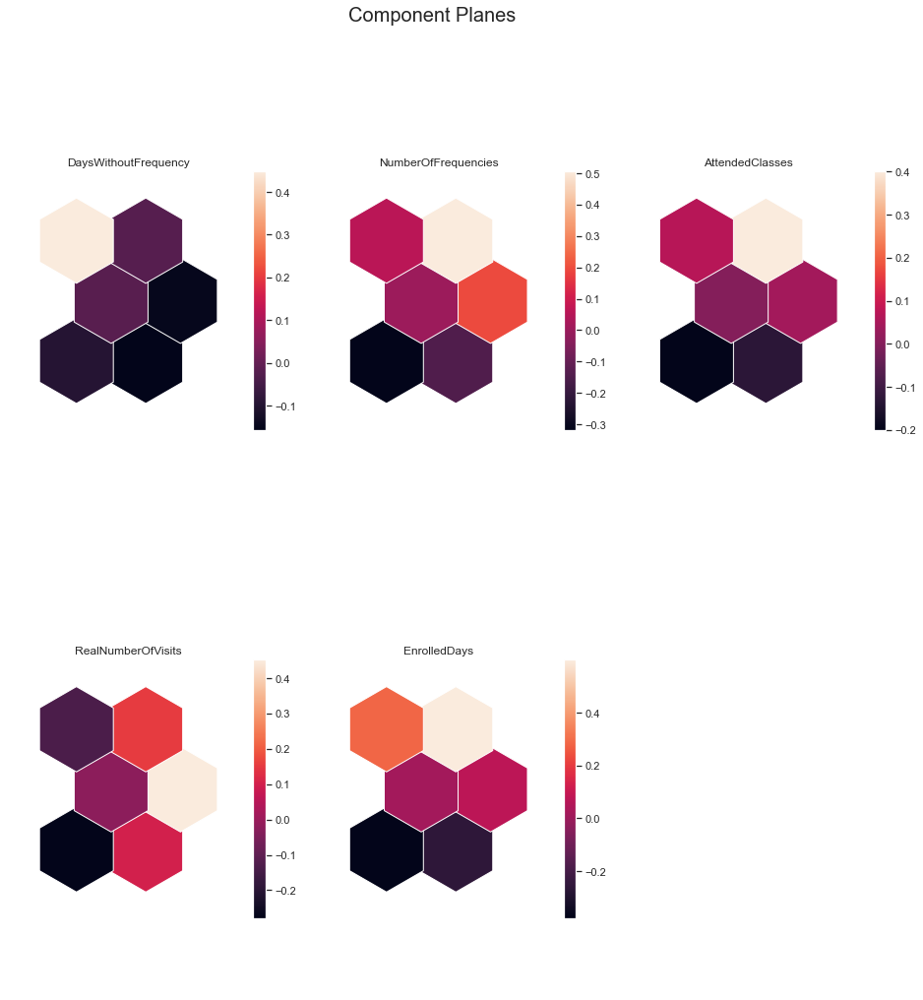

In [346]:
plt.rcParams['figure.dpi'] = 72

sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm_time, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

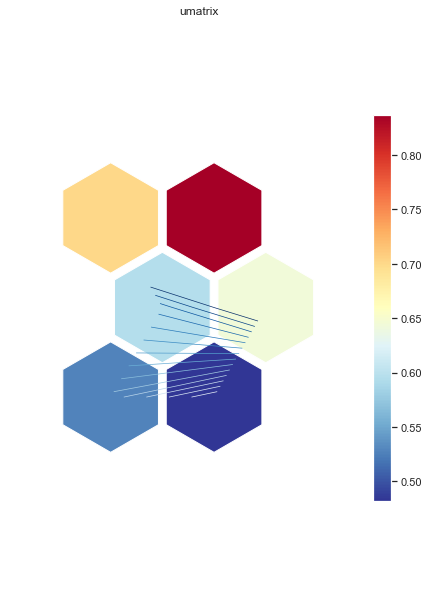

In [347]:
# U-matrix of the 50x50 grid
u_time = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u_time.show(
    sm_time, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

<hr>
<a class = "anchor" id = "51st-bullet">

### 8.4.3. Self-Organizing Maps + K-Means

</a>
</div>

[Return to Index](#index)

In [348]:
sm_time = sompy.SOMFactory().build(
    df_time.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays'] #the name of the list which contains the variables of this perspective
)

sm_time.train(n_job=-1, verbose='info',
         train_rough_len=2000,
         train_finetune_len=2000)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 2000

 epoch: 1 ---> elapsed time:  0.298000, quantization error: 1.820408

 epoch: 2 ---> elapsed time:  0.298000, quantization error: 1.751941

 epoch: 3 ---> elapsed time:  0.268000, quantization error: 1.730931

 epoch: 4 ---> elapsed time:  0.440000, quantization error: 1.720833

 epoch: 5 ---> elapsed time:  0.425000, quantization error: 1.716454

 epoch: 6 ---> elapsed time:  0.283000, quantization error: 1.715485

 epoch: 7 ---> elapsed time:  0.252000, quantization error: 1.715210

 epoch: 8 ---> elapsed time:  0.251000, quantization error: 1.715118

 epoch: 9 ---> elapsed time:  0.315000, quantization error: 1.715081

 epoch: 10 ---> elapsed time:  0.267000, quantization error: 1.715056

 epoch: 11 ---> elapsed time:  0.268000, quantization error: 1.715018

 epoch: 12 ---> elapsed time:  0.267000, quantization error: 1.714967

 epoch: 13 ---

 epoch: 115 ---> elapsed time:  0.267000, quantization error: 1.709923

 epoch: 116 ---> elapsed time:  0.267000, quantization error: 1.709872

 epoch: 117 ---> elapsed time:  0.267000, quantization error: 1.709819

 epoch: 118 ---> elapsed time:  0.299000, quantization error: 1.709767

 epoch: 119 ---> elapsed time:  0.266000, quantization error: 1.709715

 epoch: 120 ---> elapsed time:  0.251000, quantization error: 1.709663

 epoch: 121 ---> elapsed time:  0.298000, quantization error: 1.709610

 epoch: 122 ---> elapsed time:  0.251000, quantization error: 1.709558

 epoch: 123 ---> elapsed time:  0.298000, quantization error: 1.709506

 epoch: 124 ---> elapsed time:  0.299000, quantization error: 1.709453

 epoch: 125 ---> elapsed time:  0.267000, quantization error: 1.709400

 epoch: 126 ---> elapsed time:  0.251000, quantization error: 1.709348

 epoch: 127 ---> elapsed time:  0.299000, quantization error: 1.709295

 epoch: 128 ---> elapsed time:  0.283000, quantization error: 1.

 epoch: 229 ---> elapsed time:  0.251000, quantization error: 1.703551

 epoch: 230 ---> elapsed time:  0.267000, quantization error: 1.703491

 epoch: 231 ---> elapsed time:  0.267000, quantization error: 1.703431

 epoch: 232 ---> elapsed time:  0.298000, quantization error: 1.703371

 epoch: 233 ---> elapsed time:  0.251000, quantization error: 1.703310

 epoch: 234 ---> elapsed time:  0.298000, quantization error: 1.703250

 epoch: 235 ---> elapsed time:  0.235000, quantization error: 1.703190

 epoch: 236 ---> elapsed time:  0.283000, quantization error: 1.703129

 epoch: 237 ---> elapsed time:  0.266000, quantization error: 1.703069

 epoch: 238 ---> elapsed time:  0.266000, quantization error: 1.703008

 epoch: 239 ---> elapsed time:  0.283000, quantization error: 1.702948

 epoch: 240 ---> elapsed time:  0.251000, quantization error: 1.702888

 epoch: 241 ---> elapsed time:  0.251000, quantization error: 1.702827

 epoch: 242 ---> elapsed time:  0.267000, quantization error: 1.

 epoch: 343 ---> elapsed time:  0.267000, quantization error: 1.696176

 epoch: 344 ---> elapsed time:  0.251000, quantization error: 1.696107

 epoch: 345 ---> elapsed time:  0.314000, quantization error: 1.696037

 epoch: 346 ---> elapsed time:  0.315000, quantization error: 1.695967

 epoch: 347 ---> elapsed time:  0.283000, quantization error: 1.695897

 epoch: 348 ---> elapsed time:  0.283000, quantization error: 1.695827

 epoch: 349 ---> elapsed time:  0.251000, quantization error: 1.695757

 epoch: 350 ---> elapsed time:  0.299000, quantization error: 1.695686

 epoch: 351 ---> elapsed time:  0.268000, quantization error: 1.695616

 epoch: 352 ---> elapsed time:  0.283000, quantization error: 1.695545

 epoch: 353 ---> elapsed time:  0.299000, quantization error: 1.695475

 epoch: 354 ---> elapsed time:  0.283000, quantization error: 1.695405

 epoch: 355 ---> elapsed time:  0.251000, quantization error: 1.695333

 epoch: 356 ---> elapsed time:  0.283000, quantization error: 1.

 epoch: 457 ---> elapsed time:  0.236000, quantization error: 1.687591

 epoch: 458 ---> elapsed time:  0.299000, quantization error: 1.687510

 epoch: 459 ---> elapsed time:  0.283000, quantization error: 1.687428

 epoch: 460 ---> elapsed time:  0.282000, quantization error: 1.687344

 epoch: 461 ---> elapsed time:  0.314000, quantization error: 1.687262

 epoch: 462 ---> elapsed time:  0.267000, quantization error: 1.687178

 epoch: 463 ---> elapsed time:  0.314000, quantization error: 1.687091

 epoch: 464 ---> elapsed time:  0.283000, quantization error: 1.687009

 epoch: 465 ---> elapsed time:  0.251000, quantization error: 1.686925

 epoch: 466 ---> elapsed time:  0.282000, quantization error: 1.686842

 epoch: 467 ---> elapsed time:  0.251000, quantization error: 1.686757

 epoch: 468 ---> elapsed time:  0.257000, quantization error: 1.686670

 epoch: 469 ---> elapsed time:  0.276000, quantization error: 1.686584

 epoch: 470 ---> elapsed time:  0.298000, quantization error: 1.

 epoch: 571 ---> elapsed time:  0.280000, quantization error: 1.677428

 epoch: 572 ---> elapsed time:  0.283000, quantization error: 1.677331

 epoch: 573 ---> elapsed time:  0.283000, quantization error: 1.677234

 epoch: 574 ---> elapsed time:  0.298000, quantization error: 1.677138

 epoch: 575 ---> elapsed time:  0.283000, quantization error: 1.677041

 epoch: 576 ---> elapsed time:  0.252000, quantization error: 1.676944

 epoch: 577 ---> elapsed time:  0.283000, quantization error: 1.676847

 epoch: 578 ---> elapsed time:  0.298000, quantization error: 1.676749

 epoch: 579 ---> elapsed time:  0.264000, quantization error: 1.676652

 epoch: 580 ---> elapsed time:  0.316000, quantization error: 1.676554

 epoch: 581 ---> elapsed time:  0.314000, quantization error: 1.676456

 epoch: 582 ---> elapsed time:  0.267000, quantization error: 1.676358

 epoch: 583 ---> elapsed time:  0.266000, quantization error: 1.676261

 epoch: 584 ---> elapsed time:  0.268000, quantization error: 1.

 epoch: 685 ---> elapsed time:  0.298000, quantization error: 1.664783

 epoch: 686 ---> elapsed time:  0.270000, quantization error: 1.664665

 epoch: 687 ---> elapsed time:  0.264000, quantization error: 1.664546

 epoch: 688 ---> elapsed time:  0.267000, quantization error: 1.664427

 epoch: 689 ---> elapsed time:  0.283000, quantization error: 1.664307

 epoch: 690 ---> elapsed time:  0.266000, quantization error: 1.664188

 epoch: 691 ---> elapsed time:  0.267000, quantization error: 1.664068

 epoch: 692 ---> elapsed time:  0.267000, quantization error: 1.663948

 epoch: 693 ---> elapsed time:  0.251000, quantization error: 1.663829

 epoch: 694 ---> elapsed time:  0.267000, quantization error: 1.663710

 epoch: 695 ---> elapsed time:  0.278000, quantization error: 1.663589

 epoch: 696 ---> elapsed time:  0.240000, quantization error: 1.663469

 epoch: 697 ---> elapsed time:  0.260000, quantization error: 1.663349

 epoch: 698 ---> elapsed time:  0.251000, quantization error: 1.

 epoch: 799 ---> elapsed time:  0.283000, quantization error: 1.649902

 epoch: 800 ---> elapsed time:  0.235000, quantization error: 1.649759

 epoch: 801 ---> elapsed time:  0.283000, quantization error: 1.649613

 epoch: 802 ---> elapsed time:  0.298000, quantization error: 1.649469

 epoch: 803 ---> elapsed time:  0.267000, quantization error: 1.649325

 epoch: 804 ---> elapsed time:  0.298000, quantization error: 1.649179

 epoch: 805 ---> elapsed time:  0.314000, quantization error: 1.649034

 epoch: 806 ---> elapsed time:  0.346000, quantization error: 1.648889

 epoch: 807 ---> elapsed time:  0.268000, quantization error: 1.648743

 epoch: 808 ---> elapsed time:  0.348000, quantization error: 1.648598

 epoch: 809 ---> elapsed time:  0.281000, quantization error: 1.648452

 epoch: 810 ---> elapsed time:  0.282000, quantization error: 1.648304

 epoch: 811 ---> elapsed time:  0.346000, quantization error: 1.648158

 epoch: 812 ---> elapsed time:  0.314000, quantization error: 1.

 epoch: 913 ---> elapsed time:  0.268000, quantization error: 1.631800

 epoch: 914 ---> elapsed time:  0.267000, quantization error: 1.631624

 epoch: 915 ---> elapsed time:  0.299000, quantization error: 1.631448

 epoch: 916 ---> elapsed time:  0.266000, quantization error: 1.631269

 epoch: 917 ---> elapsed time:  0.299000, quantization error: 1.631094

 epoch: 918 ---> elapsed time:  0.252000, quantization error: 1.630918

 epoch: 919 ---> elapsed time:  0.314000, quantization error: 1.630741

 epoch: 920 ---> elapsed time:  0.282000, quantization error: 1.630564

 epoch: 921 ---> elapsed time:  0.330000, quantization error: 1.630385

 epoch: 922 ---> elapsed time:  0.252000, quantization error: 1.630206

 epoch: 923 ---> elapsed time:  0.267000, quantization error: 1.630027

 epoch: 924 ---> elapsed time:  0.283000, quantization error: 1.629848

 epoch: 925 ---> elapsed time:  0.298000, quantization error: 1.629667

 epoch: 926 ---> elapsed time:  0.283000, quantization error: 1.

 epoch: 1027 ---> elapsed time:  0.345000, quantization error: 1.609453

 epoch: 1028 ---> elapsed time:  0.314000, quantization error: 1.609235

 epoch: 1029 ---> elapsed time:  0.330000, quantization error: 1.609017

 epoch: 1030 ---> elapsed time:  0.330000, quantization error: 1.608798

 epoch: 1031 ---> elapsed time:  0.361000, quantization error: 1.608577

 epoch: 1032 ---> elapsed time:  0.330000, quantization error: 1.608358

 epoch: 1033 ---> elapsed time:  0.346000, quantization error: 1.608139

 epoch: 1034 ---> elapsed time:  0.347000, quantization error: 1.607917

 epoch: 1035 ---> elapsed time:  0.344000, quantization error: 1.607694

 epoch: 1036 ---> elapsed time:  0.346000, quantization error: 1.607473

 epoch: 1037 ---> elapsed time:  0.346000, quantization error: 1.607251

 epoch: 1038 ---> elapsed time:  0.314000, quantization error: 1.607028

 epoch: 1039 ---> elapsed time:  0.361000, quantization error: 1.606806

 epoch: 1040 ---> elapsed time:  0.361000, quantiza

 epoch: 1140 ---> elapsed time:  0.314000, quantization error: 1.581703

 epoch: 1141 ---> elapsed time:  0.298000, quantization error: 1.581429

 epoch: 1142 ---> elapsed time:  0.251000, quantization error: 1.581154

 epoch: 1143 ---> elapsed time:  0.267000, quantization error: 1.580878

 epoch: 1144 ---> elapsed time:  0.264000, quantization error: 1.580601

 epoch: 1145 ---> elapsed time:  0.269000, quantization error: 1.580324

 epoch: 1146 ---> elapsed time:  0.314000, quantization error: 1.580047

 epoch: 1147 ---> elapsed time:  0.330000, quantization error: 1.579769

 epoch: 1148 ---> elapsed time:  0.314000, quantization error: 1.579487

 epoch: 1149 ---> elapsed time:  0.283000, quantization error: 1.579207

 epoch: 1150 ---> elapsed time:  0.282000, quantization error: 1.578922

 epoch: 1151 ---> elapsed time:  0.251000, quantization error: 1.578642

 epoch: 1152 ---> elapsed time:  0.262000, quantization error: 1.578361

 epoch: 1153 ---> elapsed time:  0.240000, quantiza

 epoch: 1253 ---> elapsed time:  0.269000, quantization error: 1.546537

 epoch: 1254 ---> elapsed time:  0.283000, quantization error: 1.546188

 epoch: 1255 ---> elapsed time:  0.283000, quantization error: 1.545838

 epoch: 1256 ---> elapsed time:  0.301000, quantization error: 1.545486

 epoch: 1257 ---> elapsed time:  0.269000, quantization error: 1.545135

 epoch: 1258 ---> elapsed time:  0.270000, quantization error: 1.544782

 epoch: 1259 ---> elapsed time:  0.268000, quantization error: 1.544429

 epoch: 1260 ---> elapsed time:  0.347000, quantization error: 1.544075

 epoch: 1261 ---> elapsed time:  0.283000, quantization error: 1.543719

 epoch: 1262 ---> elapsed time:  0.253000, quantization error: 1.543362

 epoch: 1263 ---> elapsed time:  0.283000, quantization error: 1.543006

 epoch: 1264 ---> elapsed time:  0.268000, quantization error: 1.542651

 epoch: 1265 ---> elapsed time:  0.299000, quantization error: 1.542293

 epoch: 1266 ---> elapsed time:  0.314000, quantiza

 epoch: 1366 ---> elapsed time:  0.267000, quantization error: 1.501531

 epoch: 1367 ---> elapsed time:  0.315000, quantization error: 1.501078

 epoch: 1368 ---> elapsed time:  0.259000, quantization error: 1.500623

 epoch: 1369 ---> elapsed time:  0.284000, quantization error: 1.500169

 epoch: 1370 ---> elapsed time:  0.268000, quantization error: 1.499710

 epoch: 1371 ---> elapsed time:  0.282000, quantization error: 1.499247

 epoch: 1372 ---> elapsed time:  0.274000, quantization error: 1.498778

 epoch: 1373 ---> elapsed time:  0.299000, quantization error: 1.498315

 epoch: 1374 ---> elapsed time:  0.251000, quantization error: 1.497849

 epoch: 1375 ---> elapsed time:  0.283000, quantization error: 1.497384

 epoch: 1376 ---> elapsed time:  0.298000, quantization error: 1.496914

 epoch: 1377 ---> elapsed time:  0.251000, quantization error: 1.496445

 epoch: 1378 ---> elapsed time:  0.298000, quantization error: 1.495968

 epoch: 1379 ---> elapsed time:  0.251000, quantiza

 epoch: 1479 ---> elapsed time:  0.283000, quantization error: 1.442692

 epoch: 1480 ---> elapsed time:  0.267000, quantization error: 1.442102

 epoch: 1481 ---> elapsed time:  0.314000, quantization error: 1.441510

 epoch: 1482 ---> elapsed time:  0.272000, quantization error: 1.440917

 epoch: 1483 ---> elapsed time:  0.248000, quantization error: 1.440323

 epoch: 1484 ---> elapsed time:  0.268000, quantization error: 1.439727

 epoch: 1485 ---> elapsed time:  0.299000, quantization error: 1.439127

 epoch: 1486 ---> elapsed time:  0.267000, quantization error: 1.438517

 epoch: 1487 ---> elapsed time:  0.252000, quantization error: 1.437916

 epoch: 1488 ---> elapsed time:  0.269000, quantization error: 1.437314

 epoch: 1489 ---> elapsed time:  0.250000, quantization error: 1.436710

 epoch: 1490 ---> elapsed time:  0.267000, quantization error: 1.436106

 epoch: 1491 ---> elapsed time:  0.267000, quantization error: 1.435496

 epoch: 1492 ---> elapsed time:  0.347000, quantiza

 epoch: 1592 ---> elapsed time:  0.314000, quantization error: 1.366175

 epoch: 1593 ---> elapsed time:  0.298000, quantization error: 1.365409

 epoch: 1594 ---> elapsed time:  0.237000, quantization error: 1.364622

 epoch: 1595 ---> elapsed time:  0.283000, quantization error: 1.363838

 epoch: 1596 ---> elapsed time:  0.282000, quantization error: 1.363059

 epoch: 1597 ---> elapsed time:  0.268000, quantization error: 1.362284

 epoch: 1598 ---> elapsed time:  0.267000, quantization error: 1.361504

 epoch: 1599 ---> elapsed time:  0.301000, quantization error: 1.360723

 epoch: 1600 ---> elapsed time:  0.266000, quantization error: 1.359940

 epoch: 1601 ---> elapsed time:  0.268000, quantization error: 1.359156

 epoch: 1602 ---> elapsed time:  0.299000, quantization error: 1.358361

 epoch: 1603 ---> elapsed time:  0.269000, quantization error: 1.357572

 epoch: 1604 ---> elapsed time:  0.251000, quantization error: 1.356787

 epoch: 1605 ---> elapsed time:  0.268000, quantiza

 epoch: 1705 ---> elapsed time:  0.284000, quantization error: 1.266721

 epoch: 1706 ---> elapsed time:  0.283000, quantization error: 1.265725

 epoch: 1707 ---> elapsed time:  0.283000, quantization error: 1.264727

 epoch: 1708 ---> elapsed time:  0.251000, quantization error: 1.263727

 epoch: 1709 ---> elapsed time:  0.299000, quantization error: 1.262724

 epoch: 1710 ---> elapsed time:  0.253000, quantization error: 1.261724

 epoch: 1711 ---> elapsed time:  0.283000, quantization error: 1.260719

 epoch: 1712 ---> elapsed time:  0.266000, quantization error: 1.259712

 epoch: 1713 ---> elapsed time:  0.268000, quantization error: 1.258702

 epoch: 1714 ---> elapsed time:  0.267000, quantization error: 1.257692

 epoch: 1715 ---> elapsed time:  0.251000, quantization error: 1.256681

 epoch: 1716 ---> elapsed time:  0.268000, quantization error: 1.255668

 epoch: 1717 ---> elapsed time:  0.283000, quantization error: 1.254644

 epoch: 1718 ---> elapsed time:  0.284000, quantiza

 epoch: 1818 ---> elapsed time:  0.315000, quantization error: 1.138958

 epoch: 1819 ---> elapsed time:  0.314000, quantization error: 1.137665

 epoch: 1820 ---> elapsed time:  0.330000, quantization error: 1.136357

 epoch: 1821 ---> elapsed time:  0.315000, quantization error: 1.135089

 epoch: 1822 ---> elapsed time:  0.364000, quantization error: 1.133814

 epoch: 1823 ---> elapsed time:  0.472000, quantization error: 1.132537

 epoch: 1824 ---> elapsed time:  0.409000, quantization error: 1.131247

 epoch: 1825 ---> elapsed time:  0.331000, quantization error: 1.129948

 epoch: 1826 ---> elapsed time:  0.346000, quantization error: 1.128668

 epoch: 1827 ---> elapsed time:  0.317000, quantization error: 1.127385

 epoch: 1828 ---> elapsed time:  0.311000, quantization error: 1.126097

 epoch: 1829 ---> elapsed time:  0.330000, quantization error: 1.124812

 epoch: 1830 ---> elapsed time:  0.346000, quantization error: 1.123522

 epoch: 1831 ---> elapsed time:  0.361000, quantiza

 epoch: 1931 ---> elapsed time:  0.282000, quantization error: 0.972986

 epoch: 1932 ---> elapsed time:  0.283000, quantization error: 0.971293

 epoch: 1933 ---> elapsed time:  0.331000, quantization error: 0.969500

 epoch: 1934 ---> elapsed time:  0.288000, quantization error: 0.967288

 epoch: 1935 ---> elapsed time:  0.278000, quantization error: 0.964224

 epoch: 1936 ---> elapsed time:  0.314000, quantization error: 0.962164

 epoch: 1937 ---> elapsed time:  0.299000, quantization error: 0.960535

 epoch: 1938 ---> elapsed time:  0.284000, quantization error: 0.958928

 epoch: 1939 ---> elapsed time:  0.299000, quantization error: 0.957311

 epoch: 1940 ---> elapsed time:  0.283000, quantization error: 0.955667

 epoch: 1941 ---> elapsed time:  0.284000, quantization error: 0.954039

 epoch: 1942 ---> elapsed time:  0.425000, quantization error: 0.952399

 epoch: 1943 ---> elapsed time:  0.394000, quantization error: 0.950778

 epoch: 1944 ---> elapsed time:  0.395000, quantiza

 epoch: 44 ---> elapsed time:  0.252000, quantization error: 1.128896

 epoch: 45 ---> elapsed time:  0.283000, quantization error: 1.128597

 epoch: 46 ---> elapsed time:  0.252000, quantization error: 1.128291

 epoch: 47 ---> elapsed time:  0.251000, quantization error: 1.127986

 epoch: 48 ---> elapsed time:  0.267000, quantization error: 1.127681

 epoch: 49 ---> elapsed time:  0.283000, quantization error: 1.127376

 epoch: 50 ---> elapsed time:  0.283000, quantization error: 1.127071

 epoch: 51 ---> elapsed time:  0.267000, quantization error: 1.126767

 epoch: 52 ---> elapsed time:  0.283000, quantization error: 1.126459

 epoch: 53 ---> elapsed time:  0.268000, quantization error: 1.126154

 epoch: 54 ---> elapsed time:  0.268000, quantization error: 1.125853

 epoch: 55 ---> elapsed time:  0.268000, quantization error: 1.125548

 epoch: 56 ---> elapsed time:  0.252000, quantization error: 1.125235

 epoch: 57 ---> elapsed time:  0.283000, quantization error: 1.124932

 epoch

 epoch: 159 ---> elapsed time:  0.278000, quantization error: 1.092872

 epoch: 160 ---> elapsed time:  0.298000, quantization error: 1.092552

 epoch: 161 ---> elapsed time:  0.236000, quantization error: 1.092231

 epoch: 162 ---> elapsed time:  0.266000, quantization error: 1.091906

 epoch: 163 ---> elapsed time:  0.258000, quantization error: 1.091586

 epoch: 164 ---> elapsed time:  0.283000, quantization error: 1.091269

 epoch: 165 ---> elapsed time:  0.267000, quantization error: 1.090945

 epoch: 166 ---> elapsed time:  0.299000, quantization error: 1.090623

 epoch: 167 ---> elapsed time:  0.298000, quantization error: 1.090301

 epoch: 168 ---> elapsed time:  0.251000, quantization error: 1.089982

 epoch: 169 ---> elapsed time:  0.267000, quantization error: 1.089659

 epoch: 170 ---> elapsed time:  0.266000, quantization error: 1.089340

 epoch: 171 ---> elapsed time:  0.282000, quantization error: 1.089014

 epoch: 172 ---> elapsed time:  0.267000, quantization error: 1.

 epoch: 273 ---> elapsed time:  0.299000, quantization error: 1.055236

 epoch: 274 ---> elapsed time:  0.299000, quantization error: 1.054899

 epoch: 275 ---> elapsed time:  0.283000, quantization error: 1.054550

 epoch: 276 ---> elapsed time:  0.251000, quantization error: 1.054214

 epoch: 277 ---> elapsed time:  0.299000, quantization error: 1.053877

 epoch: 278 ---> elapsed time:  0.267000, quantization error: 1.053538

 epoch: 279 ---> elapsed time:  0.314000, quantization error: 1.053196

 epoch: 280 ---> elapsed time:  0.251000, quantization error: 1.052855

 epoch: 281 ---> elapsed time:  0.282000, quantization error: 1.052507

 epoch: 282 ---> elapsed time:  0.253000, quantization error: 1.052158

 epoch: 283 ---> elapsed time:  0.283000, quantization error: 1.051820

 epoch: 284 ---> elapsed time:  0.268000, quantization error: 1.051480

 epoch: 285 ---> elapsed time:  0.299000, quantization error: 1.051139

 epoch: 286 ---> elapsed time:  0.267000, quantization error: 1.

 epoch: 387 ---> elapsed time:  0.330000, quantization error: 1.015724

 epoch: 388 ---> elapsed time:  0.268000, quantization error: 1.015374

 epoch: 389 ---> elapsed time:  0.313000, quantization error: 1.015025

 epoch: 390 ---> elapsed time:  0.250000, quantization error: 1.014672

 epoch: 391 ---> elapsed time:  0.267000, quantization error: 1.014321

 epoch: 392 ---> elapsed time:  0.251000, quantization error: 1.013979

 epoch: 393 ---> elapsed time:  0.298000, quantization error: 1.013628

 epoch: 394 ---> elapsed time:  0.251000, quantization error: 1.013281

 epoch: 395 ---> elapsed time:  0.274000, quantization error: 1.012926

 epoch: 396 ---> elapsed time:  0.276000, quantization error: 1.012567

 epoch: 397 ---> elapsed time:  0.267000, quantization error: 1.012214

 epoch: 398 ---> elapsed time:  0.267000, quantization error: 1.011860

 epoch: 399 ---> elapsed time:  0.299000, quantization error: 1.011501

 epoch: 400 ---> elapsed time:  0.282000, quantization error: 1.

 epoch: 501 ---> elapsed time:  0.298000, quantization error: 0.974615

 epoch: 502 ---> elapsed time:  0.314000, quantization error: 0.974248

 epoch: 503 ---> elapsed time:  0.354000, quantization error: 0.973880

 epoch: 504 ---> elapsed time:  0.305000, quantization error: 0.973506

 epoch: 505 ---> elapsed time:  0.329000, quantization error: 0.973145

 epoch: 506 ---> elapsed time:  0.314000, quantization error: 0.972780

 epoch: 507 ---> elapsed time:  0.298000, quantization error: 0.972413

 epoch: 508 ---> elapsed time:  0.298000, quantization error: 0.972043

 epoch: 509 ---> elapsed time:  0.329000, quantization error: 0.971670

 epoch: 510 ---> elapsed time:  0.298000, quantization error: 0.971289

 epoch: 511 ---> elapsed time:  0.317000, quantization error: 0.970914

 epoch: 512 ---> elapsed time:  0.327000, quantization error: 0.970542

 epoch: 513 ---> elapsed time:  0.314000, quantization error: 0.970156

 epoch: 514 ---> elapsed time:  0.314000, quantization error: 0.

 epoch: 615 ---> elapsed time:  0.329000, quantization error: 0.932264

 epoch: 616 ---> elapsed time:  0.347000, quantization error: 0.931877

 epoch: 617 ---> elapsed time:  0.330000, quantization error: 0.931494

 epoch: 618 ---> elapsed time:  0.330000, quantization error: 0.931107

 epoch: 619 ---> elapsed time:  0.339000, quantization error: 0.930705

 epoch: 620 ---> elapsed time:  0.337000, quantization error: 0.930326

 epoch: 621 ---> elapsed time:  0.314000, quantization error: 0.929941

 epoch: 622 ---> elapsed time:  0.351000, quantization error: 0.929561

 epoch: 623 ---> elapsed time:  0.340000, quantization error: 0.929179

 epoch: 624 ---> elapsed time:  0.330000, quantization error: 0.928799

 epoch: 625 ---> elapsed time:  0.298000, quantization error: 0.928422

 epoch: 626 ---> elapsed time:  0.299000, quantization error: 0.928036

 epoch: 627 ---> elapsed time:  0.337000, quantization error: 0.927647

 epoch: 628 ---> elapsed time:  0.338000, quantization error: 0.

 epoch: 729 ---> elapsed time:  0.288000, quantization error: 0.888812

 epoch: 730 ---> elapsed time:  0.260000, quantization error: 0.888425

 epoch: 731 ---> elapsed time:  0.283000, quantization error: 0.888038

 epoch: 732 ---> elapsed time:  0.283000, quantization error: 0.887650

 epoch: 733 ---> elapsed time:  0.276000, quantization error: 0.887267

 epoch: 734 ---> elapsed time:  0.305000, quantization error: 0.886882

 epoch: 735 ---> elapsed time:  0.236000, quantization error: 0.886494

 epoch: 736 ---> elapsed time:  0.267000, quantization error: 0.886100

 epoch: 737 ---> elapsed time:  0.251000, quantization error: 0.885727

 epoch: 738 ---> elapsed time:  0.267000, quantization error: 0.885348

 epoch: 739 ---> elapsed time:  0.266000, quantization error: 0.884973

 epoch: 740 ---> elapsed time:  0.236000, quantization error: 0.884601

 epoch: 741 ---> elapsed time:  0.267000, quantization error: 0.884223

 epoch: 742 ---> elapsed time:  0.314000, quantization error: 0.

 epoch: 843 ---> elapsed time:  0.299000, quantization error: 0.844302

 epoch: 844 ---> elapsed time:  0.267000, quantization error: 0.843911

 epoch: 845 ---> elapsed time:  0.283000, quantization error: 0.843513

 epoch: 846 ---> elapsed time:  0.267000, quantization error: 0.843131

 epoch: 847 ---> elapsed time:  0.315000, quantization error: 0.842738

 epoch: 848 ---> elapsed time:  0.266000, quantization error: 0.842347

 epoch: 849 ---> elapsed time:  0.252000, quantization error: 0.841947

 epoch: 850 ---> elapsed time:  0.299000, quantization error: 0.841549

 epoch: 851 ---> elapsed time:  0.284000, quantization error: 0.841154

 epoch: 852 ---> elapsed time:  0.283000, quantization error: 0.840760

 epoch: 853 ---> elapsed time:  0.252000, quantization error: 0.840366

 epoch: 854 ---> elapsed time:  0.267000, quantization error: 0.839974

 epoch: 855 ---> elapsed time:  0.282000, quantization error: 0.839586

 epoch: 856 ---> elapsed time:  0.251000, quantization error: 0.

 epoch: 957 ---> elapsed time:  0.267000, quantization error: 0.797044

 epoch: 958 ---> elapsed time:  0.266000, quantization error: 0.796629

 epoch: 959 ---> elapsed time:  0.252000, quantization error: 0.796218

 epoch: 960 ---> elapsed time:  0.283000, quantization error: 0.795797

 epoch: 961 ---> elapsed time:  0.267000, quantization error: 0.795381

 epoch: 962 ---> elapsed time:  0.252000, quantization error: 0.794966

 epoch: 963 ---> elapsed time:  0.283000, quantization error: 0.794551

 epoch: 964 ---> elapsed time:  0.282000, quantization error: 0.794128

 epoch: 965 ---> elapsed time:  0.268000, quantization error: 0.793703

 epoch: 966 ---> elapsed time:  0.267000, quantization error: 0.793261

 epoch: 967 ---> elapsed time:  0.283000, quantization error: 0.792836

 epoch: 968 ---> elapsed time:  0.314000, quantization error: 0.792425

 epoch: 969 ---> elapsed time:  0.315000, quantization error: 0.792018

 epoch: 970 ---> elapsed time:  0.283000, quantization error: 0.

 epoch: 1070 ---> elapsed time:  0.283000, quantization error: 0.749093

 epoch: 1071 ---> elapsed time:  0.283000, quantization error: 0.748643

 epoch: 1072 ---> elapsed time:  0.314000, quantization error: 0.748225

 epoch: 1073 ---> elapsed time:  0.251000, quantization error: 0.747811

 epoch: 1074 ---> elapsed time:  0.252000, quantization error: 0.747389

 epoch: 1075 ---> elapsed time:  0.251000, quantization error: 0.746968

 epoch: 1076 ---> elapsed time:  0.283000, quantization error: 0.746508

 epoch: 1077 ---> elapsed time:  0.267000, quantization error: 0.746073

 epoch: 1078 ---> elapsed time:  0.267000, quantization error: 0.745642

 epoch: 1079 ---> elapsed time:  0.282000, quantization error: 0.745224

 epoch: 1080 ---> elapsed time:  0.283000, quantization error: 0.744805

 epoch: 1081 ---> elapsed time:  0.252000, quantization error: 0.744373

 epoch: 1082 ---> elapsed time:  0.299000, quantization error: 0.743953

 epoch: 1083 ---> elapsed time:  0.267000, quantiza

 epoch: 1183 ---> elapsed time:  0.287000, quantization error: 0.699573

 epoch: 1184 ---> elapsed time:  0.325000, quantization error: 0.699147

 epoch: 1185 ---> elapsed time:  0.283000, quantization error: 0.698706

 epoch: 1186 ---> elapsed time:  0.282000, quantization error: 0.698269

 epoch: 1187 ---> elapsed time:  0.299000, quantization error: 0.697751

 epoch: 1188 ---> elapsed time:  0.315000, quantization error: 0.697256

 epoch: 1189 ---> elapsed time:  0.330000, quantization error: 0.696812

 epoch: 1190 ---> elapsed time:  0.299000, quantization error: 0.696363

 epoch: 1191 ---> elapsed time:  0.283000, quantization error: 0.695910

 epoch: 1192 ---> elapsed time:  0.298000, quantization error: 0.695472

 epoch: 1193 ---> elapsed time:  0.298000, quantization error: 0.695018

 epoch: 1194 ---> elapsed time:  0.299000, quantization error: 0.694585

 epoch: 1195 ---> elapsed time:  0.299000, quantization error: 0.694147

 epoch: 1196 ---> elapsed time:  0.315000, quantiza

 epoch: 1296 ---> elapsed time:  0.352000, quantization error: 0.646903

 epoch: 1297 ---> elapsed time:  0.345000, quantization error: 0.646441

 epoch: 1298 ---> elapsed time:  0.377000, quantization error: 0.645963

 epoch: 1299 ---> elapsed time:  0.345000, quantization error: 0.645498

 epoch: 1300 ---> elapsed time:  0.330000, quantization error: 0.644999

 epoch: 1301 ---> elapsed time:  0.330000, quantization error: 0.644519

 epoch: 1302 ---> elapsed time:  0.361000, quantization error: 0.644040

 epoch: 1303 ---> elapsed time:  0.377000, quantization error: 0.643590

 epoch: 1304 ---> elapsed time:  0.329000, quantization error: 0.643136

 epoch: 1305 ---> elapsed time:  0.377000, quantization error: 0.642685

 epoch: 1306 ---> elapsed time:  0.330000, quantization error: 0.642237

 epoch: 1307 ---> elapsed time:  0.329000, quantization error: 0.641762

 epoch: 1308 ---> elapsed time:  0.346000, quantization error: 0.641294

 epoch: 1309 ---> elapsed time:  0.345000, quantiza

 epoch: 1409 ---> elapsed time:  0.298000, quantization error: 0.591951

 epoch: 1410 ---> elapsed time:  0.299000, quantization error: 0.591417

 epoch: 1411 ---> elapsed time:  0.267000, quantization error: 0.590890

 epoch: 1412 ---> elapsed time:  0.276000, quantization error: 0.590361

 epoch: 1413 ---> elapsed time:  0.304000, quantization error: 0.589865

 epoch: 1414 ---> elapsed time:  0.267000, quantization error: 0.589332

 epoch: 1415 ---> elapsed time:  0.267000, quantization error: 0.588786

 epoch: 1416 ---> elapsed time:  0.298000, quantization error: 0.588281

 epoch: 1417 ---> elapsed time:  0.267000, quantization error: 0.587769

 epoch: 1418 ---> elapsed time:  0.267000, quantization error: 0.587252

 epoch: 1419 ---> elapsed time:  0.298000, quantization error: 0.586761

 epoch: 1420 ---> elapsed time:  0.299000, quantization error: 0.586277

 epoch: 1421 ---> elapsed time:  0.283000, quantization error: 0.585764

 epoch: 1422 ---> elapsed time:  0.235000, quantiza

 epoch: 1522 ---> elapsed time:  0.267000, quantization error: 0.534251

 epoch: 1523 ---> elapsed time:  0.299000, quantization error: 0.533757

 epoch: 1524 ---> elapsed time:  0.250000, quantization error: 0.533259

 epoch: 1525 ---> elapsed time:  0.268000, quantization error: 0.532777

 epoch: 1526 ---> elapsed time:  0.283000, quantization error: 0.532291

 epoch: 1527 ---> elapsed time:  0.313000, quantization error: 0.531785

 epoch: 1528 ---> elapsed time:  0.283000, quantization error: 0.531262

 epoch: 1529 ---> elapsed time:  0.247000, quantization error: 0.530760

 epoch: 1530 ---> elapsed time:  0.254000, quantization error: 0.530289

 epoch: 1531 ---> elapsed time:  0.264000, quantization error: 0.529794

 epoch: 1532 ---> elapsed time:  0.267000, quantization error: 0.529297

 epoch: 1533 ---> elapsed time:  0.283000, quantization error: 0.528796

 epoch: 1534 ---> elapsed time:  0.282000, quantization error: 0.528300

 epoch: 1535 ---> elapsed time:  0.283000, quantiza

 epoch: 1635 ---> elapsed time:  0.267000, quantization error: 0.476372

 epoch: 1636 ---> elapsed time:  0.235000, quantization error: 0.475772

 epoch: 1637 ---> elapsed time:  0.251000, quantization error: 0.475200

 epoch: 1638 ---> elapsed time:  0.236000, quantization error: 0.474643

 epoch: 1639 ---> elapsed time:  0.267000, quantization error: 0.474127

 epoch: 1640 ---> elapsed time:  194.391000, quantization error: 0.473670

 epoch: 1641 ---> elapsed time:  0.354000, quantization error: 0.473196

 epoch: 1642 ---> elapsed time:  0.511000, quantization error: 0.472749

 epoch: 1643 ---> elapsed time:  0.900000, quantization error: 0.472193

 epoch: 1644 ---> elapsed time:  0.625000, quantization error: 0.471691

 epoch: 1645 ---> elapsed time:  0.483000, quantization error: 0.471139

 epoch: 1646 ---> elapsed time:  0.408000, quantization error: 0.470619

 epoch: 1647 ---> elapsed time:  0.361000, quantization error: 0.470098

 epoch: 1648 ---> elapsed time:  0.314000, quanti

 epoch: 1748 ---> elapsed time:  0.339000, quantization error: 0.419212

 epoch: 1749 ---> elapsed time:  0.301000, quantization error: 0.418691

 epoch: 1750 ---> elapsed time:  0.301000, quantization error: 0.418199

 epoch: 1751 ---> elapsed time:  0.280000, quantization error: 0.417682

 epoch: 1752 ---> elapsed time:  0.261000, quantization error: 0.417153

 epoch: 1753 ---> elapsed time:  0.267000, quantization error: 0.416659

 epoch: 1754 ---> elapsed time:  0.251000, quantization error: 0.416136

 epoch: 1755 ---> elapsed time:  0.220000, quantization error: 0.415657

 epoch: 1756 ---> elapsed time:  0.236000, quantization error: 0.415167

 epoch: 1757 ---> elapsed time:  0.220000, quantization error: 0.414656

 epoch: 1758 ---> elapsed time:  0.235000, quantization error: 0.414190

 epoch: 1759 ---> elapsed time:  0.235000, quantization error: 0.413716

 epoch: 1760 ---> elapsed time:  0.311000, quantization error: 0.413223

 epoch: 1761 ---> elapsed time:  0.439000, quantiza

 epoch: 1861 ---> elapsed time:  0.326000, quantization error: 0.366184

 epoch: 1862 ---> elapsed time:  0.328000, quantization error: 0.365746

 epoch: 1863 ---> elapsed time:  0.283000, quantization error: 0.365286

 epoch: 1864 ---> elapsed time:  0.294000, quantization error: 0.364831

 epoch: 1865 ---> elapsed time:  0.309000, quantization error: 0.364324

 epoch: 1866 ---> elapsed time:  0.321000, quantization error: 0.363817

 epoch: 1867 ---> elapsed time:  0.289000, quantization error: 0.363304

 epoch: 1868 ---> elapsed time:  0.297000, quantization error: 0.362850

 epoch: 1869 ---> elapsed time:  0.303000, quantization error: 0.362352

 epoch: 1870 ---> elapsed time:  0.321000, quantization error: 0.361787

 epoch: 1871 ---> elapsed time:  0.295000, quantization error: 0.361223

 epoch: 1872 ---> elapsed time:  0.271000, quantization error: 0.360704

 epoch: 1873 ---> elapsed time:  0.313000, quantization error: 0.360209

 epoch: 1874 ---> elapsed time:  0.348000, quantiza

 epoch: 1974 ---> elapsed time:  0.299000, quantization error: 0.315076

 epoch: 1975 ---> elapsed time:  0.313000, quantization error: 0.314608

 epoch: 1976 ---> elapsed time:  0.331000, quantization error: 0.314165

 epoch: 1977 ---> elapsed time:  0.308000, quantization error: 0.313762

 epoch: 1978 ---> elapsed time:  0.289000, quantization error: 0.313336

 epoch: 1979 ---> elapsed time:  0.315000, quantization error: 0.312905

 epoch: 1980 ---> elapsed time:  0.313000, quantization error: 0.312497

 epoch: 1981 ---> elapsed time:  0.299000, quantization error: 0.312062

 epoch: 1982 ---> elapsed time:  0.299000, quantization error: 0.311586

 epoch: 1983 ---> elapsed time:  0.298000, quantization error: 0.311053

 epoch: 1984 ---> elapsed time:  0.298000, quantization error: 0.310391

 epoch: 1985 ---> elapsed time:  0.314000, quantization error: 0.309937

 epoch: 1986 ---> elapsed time:  0.299000, quantization error: 0.309443

 epoch: 1987 ---> elapsed time:  0.283000, quantiza

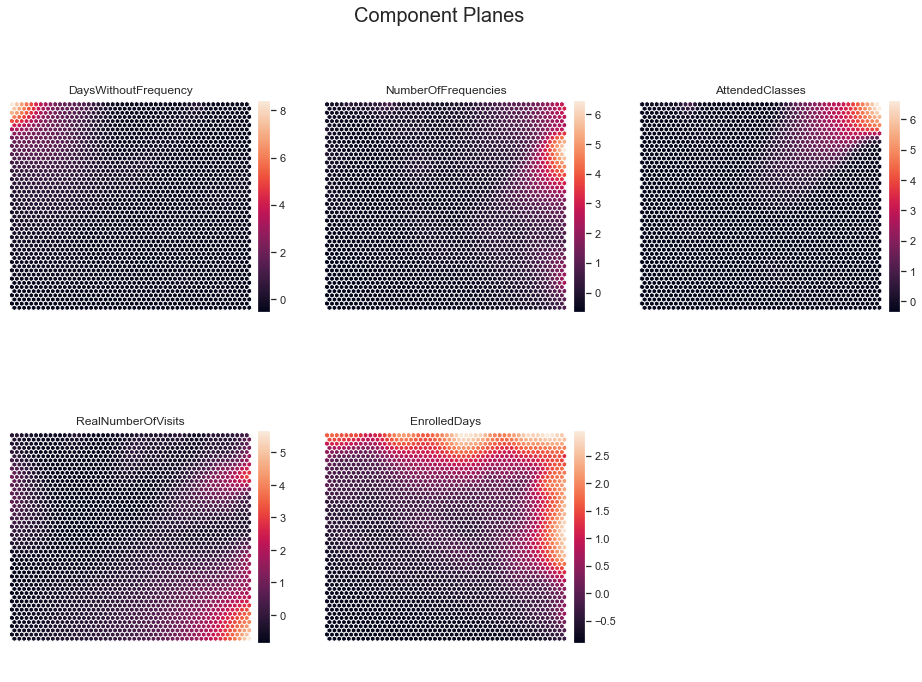

In [349]:
plt.rcParams['figure.dpi'] = 72

sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm_time, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

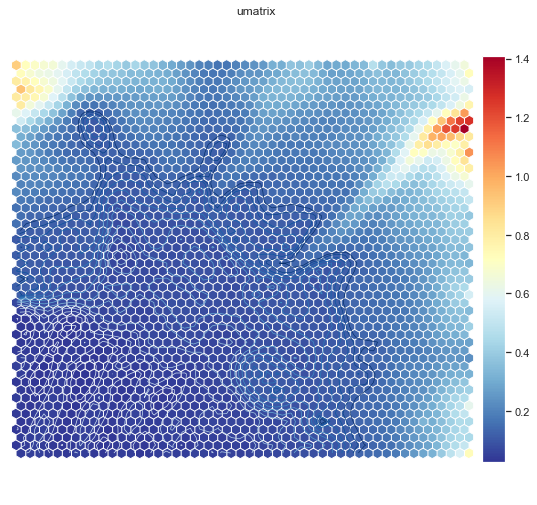

In [350]:
# U-matrix of the 50x50 grid
u_time = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u_time.show(
    sm_time, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

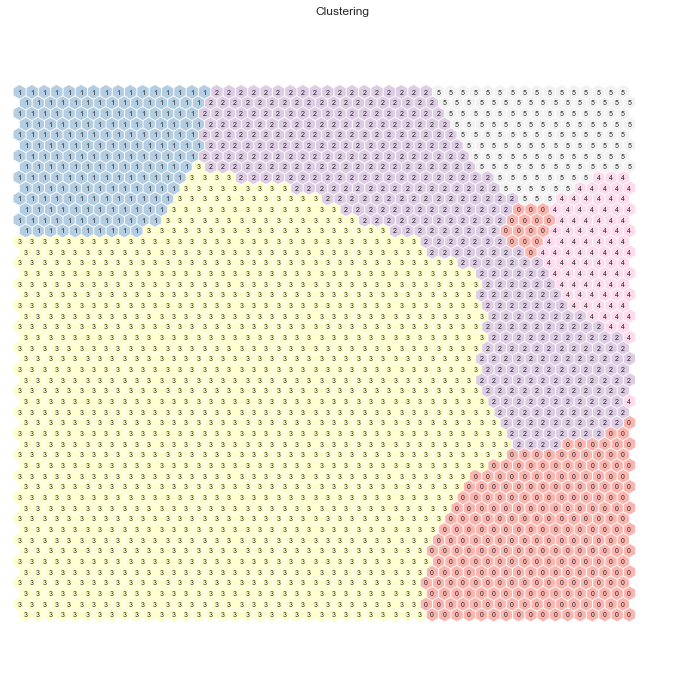

In [351]:
kmeans_time = KMeans(n_clusters=6, init='k-means++', n_init=20, random_state=42)
nodeclus_labels_time = kmeans_time.fit_predict(sm_time.codebook.matrix)
sm_time.cluster_labels = nodeclus_labels_time

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm_time, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [352]:
nodes_time = sm_time.codebook.matrix
df_nodes_time = pd.DataFrame(nodes_time, columns=time)
df_nodes_time['label'] = nodeclus_labels_time
df_nodes_time

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays,label
0,-0.277771,2.846555,6.589072,0.277513,2.620811,5
1,-0.330740,2.499357,5.967420,0.134659,2.722300,5
2,-0.362102,2.198395,5.327817,-0.044902,2.894344,5
3,-0.356263,1.951154,4.787891,-0.155644,2.962373,5
4,-0.358139,1.725155,4.323302,-0.152573,2.855723,5
...,...,...,...,...,...,...
2495,-0.523332,-0.624449,-0.325454,-0.543417,-0.865285,3
2496,-0.535681,-0.644265,-0.335460,-0.554948,-0.900077,3
2497,-0.523950,-0.647428,-0.339816,-0.596802,-0.898144,3
2498,-0.518886,-0.650842,-0.344703,-0.667903,-0.895197,3


In [353]:
bmus_map_time = sm_time.find_bmu(df_time)[0]  # get bmus for each observation in df

df_bmus_time = pd.DataFrame(
    np.concatenate((data, np.expand_dims(bmus_map_time,1)), axis=1),
    index=data.index, columns=np.append(data.columns,"BMU")
)
df_bmus_time

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2495.0
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,727.0
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,2427.0
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,1680.0
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,234.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,206.0
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,1366.0
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,2472.0
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,201.0


In [354]:
df_final_time = df_bmus_time.merge(df_nodes_time['label'], 'left', left_on="BMU", right_index=True)
df_final_time

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU,label
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2495.0,3
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,727.0,3
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,2427.0,3
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,1680.0,3
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,234.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,206.0,5
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,1366.0,3
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,2472.0,3
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,201.0,5


In [355]:
# Characterizing the final clusters
df_final_time.drop(columns='BMU').groupby('label').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
label,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.473125,0.272787,-0.408699,-0.226162,0.049375,0.005625,0.220625,0.723125,0.015625,0.015000,0.048125,0.043750,0.000000,0.265844,-0.232825,0.396393,0.421743,1.879399,-0.328231,0.006875,0.743125,-0.325174,-0.066894,-0.115216,0.151933,-0.042036
1,0.360731,0.052248,2.392930,-0.199712,0.096804,0.008219,0.218265,0.596347,0.069406,0.037443,0.114155,0.020091,0.003653,-0.351746,-0.236241,0.016598,-0.182887,-0.397325,0.407406,0.027397,0.901370,0.331121,-0.080103,0.250924,-0.306382,0.416562
2,0.447607,-0.081839,-0.250195,0.546486,0.092281,0.009918,0.407503,0.508840,0.081932,0.022423,0.120310,0.021992,0.000000,0.240357,0.154826,-0.219325,-0.138318,-0.221537,0.912144,0.028892,0.741699,0.985365,0.243864,0.616399,-0.252373,0.081503
3,0.369251,-0.025857,-0.155495,-0.438694,0.023352,0.006164,0.234353,0.600996,0.048720,0.023945,0.120199,0.015173,0.002608,-0.421015,-0.273326,0.070577,0.021658,-0.331529,-0.513201,0.009483,0.873755,-0.549448,-0.127535,-0.362477,0.096119,-0.087292
4,0.542373,0.637448,-0.333478,1.667084,0.154661,0.012712,0.230932,0.739407,0.031780,0.000000,0.086864,0.116525,0.000000,3.217955,-0.299632,0.577878,0.583337,0.978643,1.647479,0.021186,0.567797,1.890199,0.383185,2.131586,-0.102208,0.073645
5,0.414493,-0.702348,-0.327535,2.505708,0.014493,0.002899,0.863768,0.089855,0.081159,0.021739,0.021739,0.008696,0.000000,1.288281,3.381054,-1.346735,-0.900792,0.123106,1.580253,0.123188,0.392754,1.731597,-0.011597,0.124284,-0.368700,0.154310


In [356]:
df_final_time.groupby('label').mean()[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays']]

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
label,,,,,
0,-0.408699,0.265844,-0.232825,1.879399,-0.325174
1,2.392930,-0.351746,-0.236241,-0.397325,0.331121
2,-0.250195,0.240357,0.154826,-0.221537,0.985365
3,-0.155495,-0.421015,-0.273326,-0.331529,-0.549448
4,-0.333478,3.217955,-0.299632,0.978643,1.890199
5,-0.327535,1.288281,3.381054,0.123106,1.731597


In [357]:
df_final_time=df_final_time[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays','label']]

In [358]:
# using R²
sst = get_ss(df_final_time)  # get total sum of squares
ssw_labels = df_final_time[time + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.7220737547814325

__Perspective Profiling__

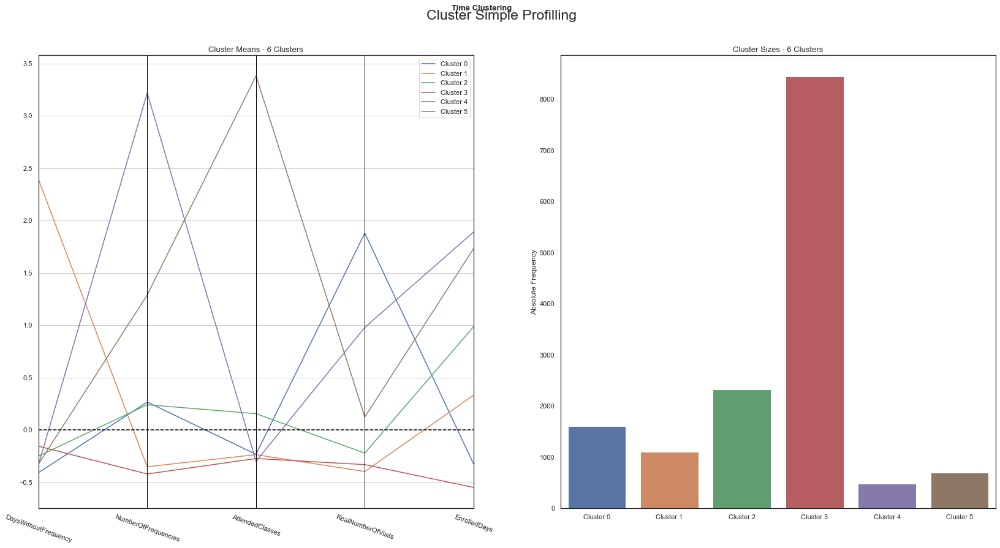

In [359]:
cluster_profiles(
    df = df_final_time, 
    label_columns = ['label'], 
    figsize = (28, 13), 
    compar_titles = ["Time Clustering"]
)

__Cluster Visualization using t-SNE__

In [360]:
two_dim_kmeans_time = TSNE(random_state=42).fit_transform(
    df_final_time[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays']])

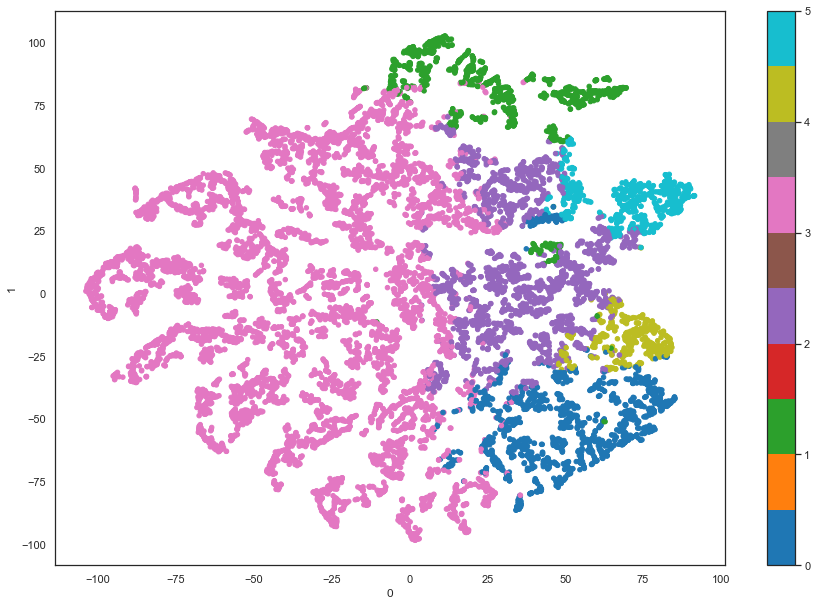

In [361]:
pd.DataFrame(two_dim_kmeans_time).plot.scatter(x=0, y=1, c=df_final_time['label'], colormap='tab10', figsize=(15,10))
plt.show()

<hr>
<a class = "anchor" id = "52nd-bullet">

### 8.4.4. Self-Organizing Maps + Hierarchical Clustering

</a>
</div>

[Return to Index](#index)

In [362]:
df_time

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
0,-0.568414,-0.504470,-0.103881,-0.535453,-0.851715
1,-0.146806,-0.267724,-0.323868,-0.699854,-0.040321
2,-0.525539,-0.555201,-0.360532,0.122153,-0.918535
3,-0.418350,-0.318455,-0.287203,-0.371051,-0.608297
4,0.925078,0.036664,-0.360532,-0.864255,0.866532
...,...,...,...,...,...
14852,-0.561268,1.237305,3.159261,0.450956,1.744747
14853,-0.304016,0.307231,-0.360532,-0.371051,-0.367265
14854,-0.561268,-0.555201,-0.360532,0.450956,-0.918535
14855,-0.554122,2.471766,5.322467,0.286554,0.456062


In [363]:
sm_time_clusters=pd.DataFrame(nodes_time)
sm_time_clusters.rename(columns={0:'DaysWithoutFrequency',
                                  1:'NumberOfFrequencies',
                                  2:'AttendedClasses',
                                  3:'RealNumberOfVisits',
                                  4:'EnrolledDays'},inplace=True)

In [364]:
sm_time_clusters

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
0,-0.277771,2.846555,6.589072,0.277513,2.620811
1,-0.330740,2.499357,5.967420,0.134659,2.722300
2,-0.362102,2.198395,5.327817,-0.044902,2.894344
3,-0.356263,1.951154,4.787891,-0.155644,2.962373
4,-0.358139,1.725155,4.323302,-0.152573,2.855723
...,...,...,...,...,...
2495,-0.523332,-0.624449,-0.325454,-0.543417,-0.865285
2496,-0.535681,-0.644265,-0.335460,-0.554948,-0.900077
2497,-0.523950,-0.647428,-0.339816,-0.596802,-0.898144
2498,-0.518886,-0.650842,-0.344703,-0.667903,-0.895197


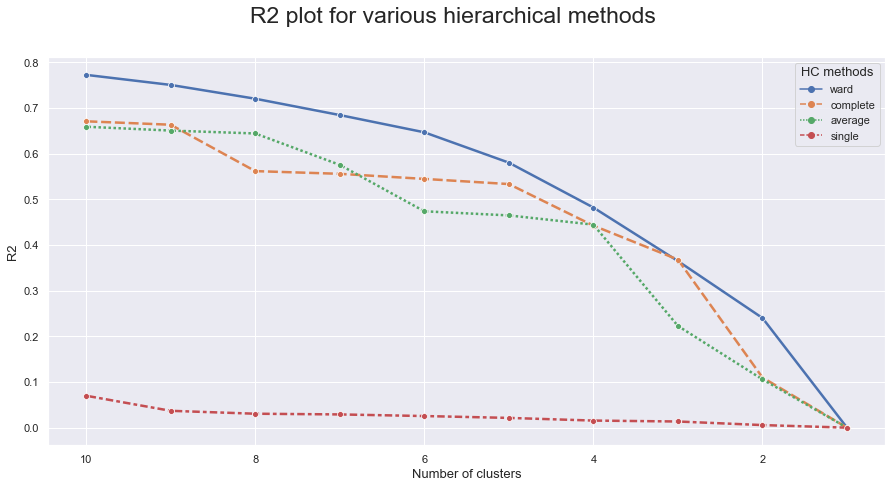

In [365]:
hier_methods = ["ward", "complete", "average", "single"]
# Function defined above to obtain the R2 statistic

r2_hier_methods = pd.DataFrame(data=np.concatenate([np.expand_dims(get_r2_hc(df=sm_time_clusters, link_method=i, max_nclus=10), 1) for i in hier_methods], axis=1),
                             index=range(1,10+1), columns=hier_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(15,7))
sns.lineplot(data=r2_hier_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=23)
plt.gca().invert_xaxis()
plt.legend(title="HC methods", title_fontsize=13)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2", fontsize=13)

plt.show()

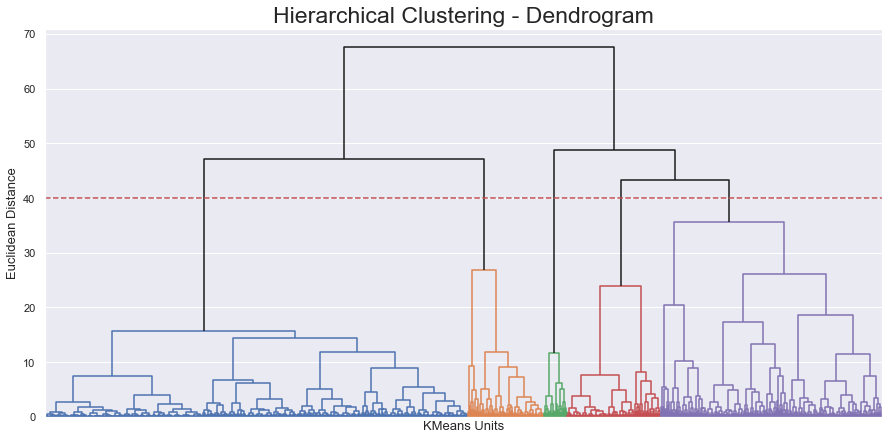

In [366]:
Z = linkage(sm_time_clusters, method="ward")

sns.set()
fig = plt.figure(figsize=(15,7))

# Dendrogram
set_link_color_palette(list(sns.color_palette().as_hex()))
dendrogram(Z, color_threshold=40, orientation='top', no_labels=True, above_threshold_color='k')

plt.hlines(40, 0, 1000000, colors="r", linestyles="dashed")
plt.title('Hierarchical Clustering - Dendrogram', fontsize=23)
plt.xlabel('KMeans Units', fontsize=13)
plt.ylabel('Euclidean Distance', fontsize=13)
plt.show()

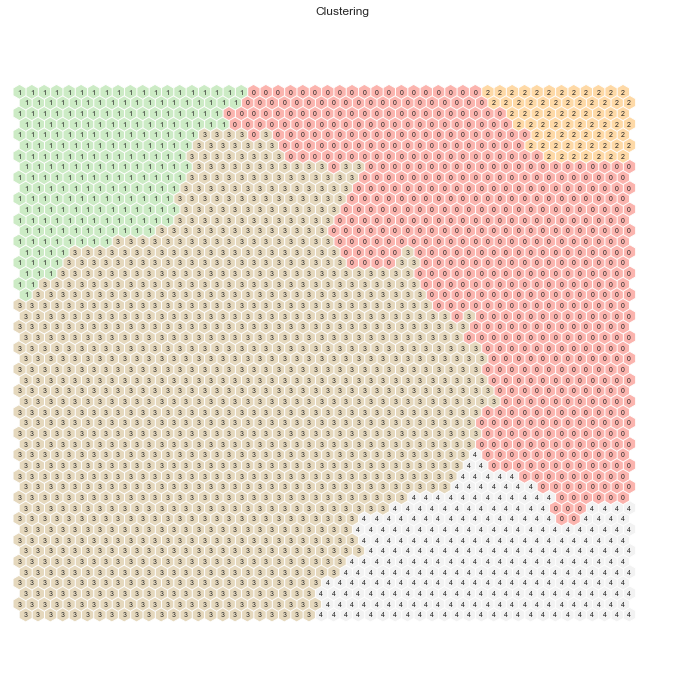

In [367]:
hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm_time.codebook.matrix)
sm_time.cluster_labels = nodeclus_labels

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm_time, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [368]:
nodes = sm_time.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=time)
df_nodes['label'] = nodeclus_labels
df_nodes

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays,label
0,-0.277771,2.846555,6.589072,0.277513,2.620811,2
1,-0.330740,2.499357,5.967420,0.134659,2.722300,2
2,-0.362102,2.198395,5.327817,-0.044902,2.894344,2
3,-0.356263,1.951154,4.787891,-0.155644,2.962373,2
4,-0.358139,1.725155,4.323302,-0.152573,2.855723,2
...,...,...,...,...,...,...
2495,-0.523332,-0.624449,-0.325454,-0.543417,-0.865285,3
2496,-0.535681,-0.644265,-0.335460,-0.554948,-0.900077,3
2497,-0.523950,-0.647428,-0.339816,-0.596802,-0.898144,3
2498,-0.518886,-0.650842,-0.344703,-0.667903,-0.895197,3


In [369]:
bmus_map = sm_time.find_bmu(df_time)[0]

df_bmus = pd.DataFrame(
    np.concatenate((data, np.expand_dims(bmus_map,1)), axis=1),
    index=data.index, columns=np.append(data.columns,"BMU")
)
df_bmus

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2495.0
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,727.0
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,2427.0
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,1680.0
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,234.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,206.0
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,1366.0
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,2472.0
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,201.0


In [370]:
df_final_hier = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final_hier

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU,label
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2495.0,3
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,727.0,3
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,2427.0,3
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,1680.0,3
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,234.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,206.0,2
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,1366.0,3
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,2472.0,4
14855,1.0,1.671007,-0.554122,1.422818,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,201.0,2


In [371]:
df_final_hier.drop(columns='BMU').groupby('label').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
label,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.459130,-0.043708,-0.315580,0.755980,0.077971,0.007536,0.424638,0.494783,0.070435,0.028986,0.087246,0.038261,0.000580,0.744159,0.310928,-0.255833,-0.128173,0.163182,0.859399,0.029855,0.688696,0.939570,0.180953,0.646284,-0.212764,0.125572
1,0.353686,0.041860,2.084027,-0.232057,0.107967,0.007446,0.201042,0.635145,0.064780,0.032762,0.105733,0.020104,0.003723,-0.347852,-0.252777,0.089269,-0.181025,-0.284382,0.381730,0.024572,0.902457,0.296573,-0.070393,0.237107,-0.294551,0.308901
2,0.397500,-0.757492,-0.305106,3.017260,0.010000,0.002500,0.885000,0.080000,0.067500,0.010000,0.020000,0.010000,0.000000,1.639510,4.146636,-1.383071,-0.936206,0.113111,1.985918,0.170000,0.337500,2.199318,-0.057283,0.197189,-0.393725,0.173376
3,0.372489,-0.013866,-0.145737,-0.425971,0.026074,0.007184,0.231741,0.596115,0.051084,0.022083,0.133830,0.013968,0.002129,-0.428521,-0.293910,0.092358,0.065267,-0.441103,-0.483390,0.009312,0.883996,-0.514797,-0.109151,-0.332396,0.086194,-0.094251
4,0.435857,0.212313,-0.421435,-0.420410,0.034175,0.005258,0.203996,0.735016,0.016824,0.010515,0.049422,0.033649,0.001577,-0.042645,-0.299155,0.370346,0.294138,1.523541,-0.559147,0.004732,0.756046,-0.562894,-0.114928,-0.302059,0.246980,-0.118937


In [372]:
df_final_hier[time + ['label']].groupby('label').mean()

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
label,,,,,
0,-0.315580,0.744159,0.310928,0.163182,0.939570
1,2.084027,-0.347852,-0.252777,-0.284382,0.296573
2,-0.305106,1.639510,4.146636,0.113111,2.199318
3,-0.145737,-0.428521,-0.293910,-0.441103,-0.514797
4,-0.421435,-0.042645,-0.299155,1.523541,-0.562894


In [373]:
sst = get_ss(df_final_hier[time])  # get total sum of squares
ssw_labels = df_final_hier[time + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.5249165823390497

In [374]:
df_final_hier=df_final_hier[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays','label']]

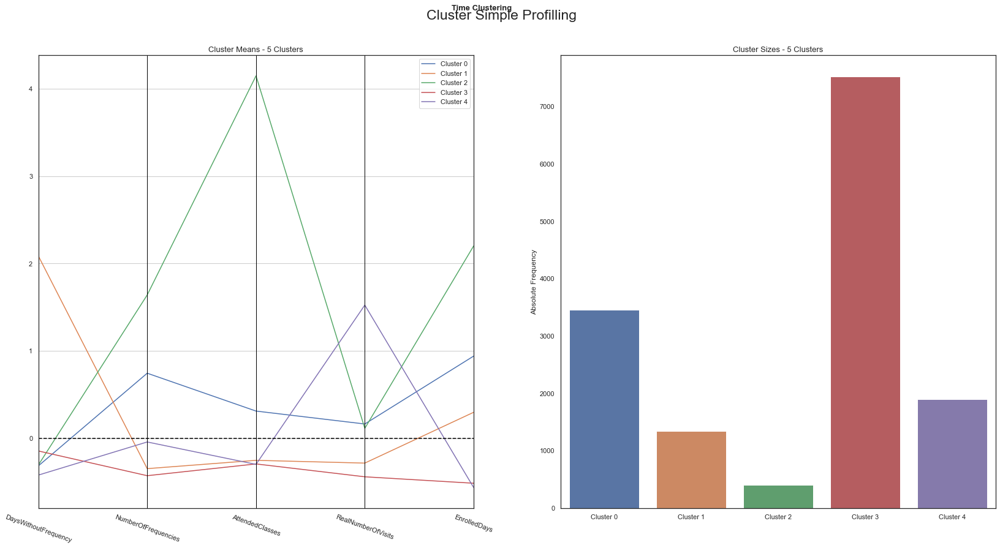

In [375]:
cluster_profiles(
    df =  df_final_hier, 
    label_columns = ['label'], 
    figsize = (28, 13), 
    compar_titles = ["Time Clustering"]
)

__Cluster visualization using t-SNE__

In [376]:
two_dim_hier_time = TSNE(random_state=42).fit_transform(
    df_final_hier[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays']])

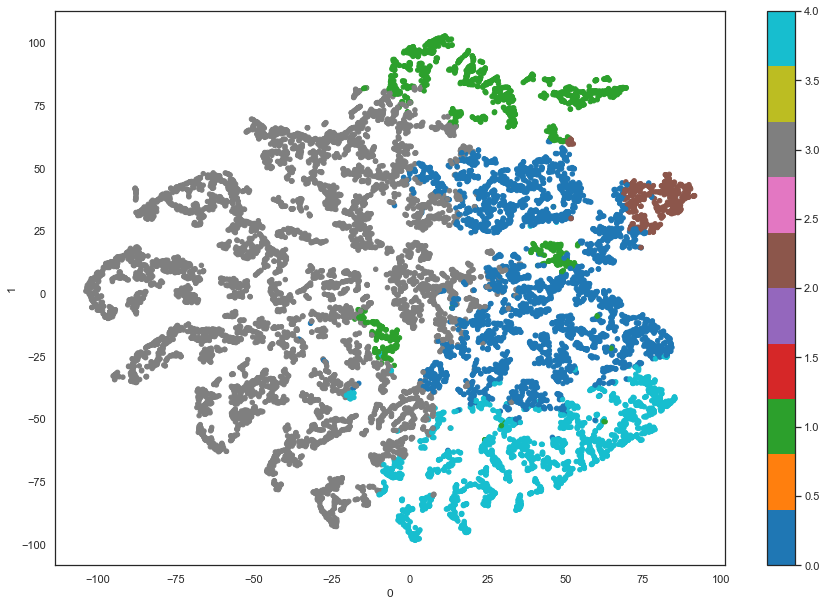

In [377]:
pd.DataFrame(two_dim_hier_time).plot.scatter(x=0, y=1, c=df_final_hier['label'], colormap='tab10', figsize=(15,10))
plt.show()

<hr>
<a class = "anchor" id = "53rd-bullet">

### 8.4.5. Mean-Shift Clustering

</a>
</div>

[Return to Index](#index)

In [378]:
bandwidth_values = [0.5, 1.0, 1.2, 1.5, 2.0, 2.2, 2.5]

r2_df_ms = pd.DataFrame(columns=['Bandwidth', 'NumClusters', 'R2'])

for bandwidth in bandwidth_values:
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
    ms_labels = ms.fit_predict(df_time)
    ms_n_clusters = len(np.unique(ms_labels))

    df_final_ms = pd.concat([df_time, pd.Series(ms_labels, index=df_time.index, name="ms_labels")], axis=1)
    
    sst = get_ss(df_final_ms[time])
    ssw_labels = df_final_ms[time + ["ms_labels"]].groupby(by='ms_labels').apply(get_ss)
    ssb = sst - np.sum(ssw_labels)
    r2 = ssb / sst

    r2_df_ms.loc[len(r2_df_ms)] = {'Bandwidth': bandwidth, 'NumClusters': ms_n_clusters, 'R2': r2}

print(r2_df_ms)

   Bandwidth  NumClusters        R2
0        0.5          734  0.936828
1        1.0          105  0.743021
2        1.2           63  0.678423
3        1.5           26  0.551574
4        2.0            8  0.350285
5        2.2            2  0.099776
6        2.5            1  0.000000


In [379]:
ms = MeanShift(bandwidth = 2, bin_seeding = True, n_jobs = 4)
ms_labels = ms.fit_predict(df_time)
ms_n_clusters = len(np.unique(ms_labels))

In [380]:
df_final_ms = pd.concat([data, pd.Series(ms_labels, index=data.index, name="ms_labels")], axis=1)
df_final_ms.groupby(by='ms_labels').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
ms_labels,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.396949,-0.005209,-0.093693,-0.116986,0.045832,0.007090,0.280507,0.586651,0.052707,0.022844,0.107992,0.021770,0.001862,-0.133139,-0.104873,0.019694,0.002630,-0.051243,-0.107440,0.016972,0.821613,-0.111994,-0.037527,-0.079597,-0.001066,-0.007805
1,0.415789,-0.098478,5.129234,0.269180,0.000000,0.000000,0.194737,0.563158,0.131579,0.052632,0.089474,0.010526,0.000000,-0.192784,-0.078023,-0.122531,-0.018713,-0.384896,1.455348,0.031579,0.847368,1.471849,-0.158450,0.836938,-0.356400,0.050874
2,0.641221,0.712999,-0.373075,2.430476,0.175573,0.007634,0.274809,0.664122,0.038168,0.000000,0.129771,0.106870,0.000000,4.951661,-0.305116,0.586864,0.661016,1.230294,1.973586,0.038168,0.435115,2.282919,0.392884,2.565367,-0.080342,0.128784
3,0.375000,0.226706,8.170421,-0.370601,0.000000,0.000000,0.208333,0.708333,0.041667,0.000000,0.041667,0.000000,0.000000,-0.361436,-0.348311,0.311953,-0.112736,-0.165549,1.960333,0.041667,0.291667,0.296567,-0.287942,0.268181,-0.147860,-0.158572
4,0.000000,0.092223,8.135287,-0.479815,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.493246,-0.360532,0.586864,0.988860,3.081378,2.051711,0.000000,0.000000,-0.534316,-0.287942,-0.319343,-0.037110,1.503611
5,0.394595,-0.538521,-0.458020,2.774923,0.016216,0.000000,0.854054,0.102703,0.027027,0.027027,0.027027,0.021622,0.000000,1.839042,4.459959,-1.165775,-0.713740,0.811750,1.707931,0.113514,0.275676,1.880323,-0.105077,0.333683,-0.320580,0.155895
6,0.358491,-0.672862,-0.232422,3.626014,0.037736,0.000000,0.905660,0.075472,0.018868,0.000000,0.000000,0.000000,0.000000,2.651081,6.249456,-1.431622,-0.970732,-0.001924,2.327569,0.245283,0.471698,2.677310,-0.287942,0.497588,-0.321081,0.363512
7,0.625000,0.465831,-0.523975,1.088020,0.171875,0.015625,0.281250,0.687500,0.000000,0.000000,0.046875,0.125000,0.000000,3.566452,-0.231061,0.586864,0.870526,4.478790,0.806684,0.000000,0.500000,1.062743,0.192598,1.188145,0.056358,0.302806


In [381]:
df_final_ms[time + ["ms_labels"]].groupby(by='ms_labels').mean()

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
ms_labels,,,,,
0,-0.093693,-0.133139,-0.104873,-0.051243,-0.111994
1,5.129234,-0.192784,-0.078023,-0.384896,1.471849
2,-0.373075,4.951661,-0.305116,1.230294,2.282919
3,8.170421,-0.361436,-0.348311,-0.165549,0.296567
4,8.135287,0.493246,-0.360532,3.081378,-0.534316
5,-0.458020,1.839042,4.459959,0.811750,1.880323
6,-0.232422,2.651081,6.249456,-0.001924,2.677310
7,-0.523975,3.566452,-0.231061,4.478790,1.062743


<hr>
<a class = "anchor" id = "54th-bullet">

### 8.4.6. DBSCAN

</a>
</div>

[Return to Index](#index)

In [382]:
df_time.shape

(14612, 5)

Some general rules for determining MinPts

The MinPts value is better to be set using domain knowledge and familiarity with the data set. Here are a few rules of thumb for selecting the MinPts value:  
- The larger the data set, the larger the value of MinPts should be
- If the data set is noisier, choose a larger value of MinPts
- Generally, MinPts should be greater than or equal to the dimensionality of the data set
- For 2-dimensional data, use DBSCAN’s default value of MinPts = 4 (Ester et al., 1996).
- If your data has more than 2 dimensions, choose MinPts = 2*dim, where dim= the dimensions of your data set (Sander et al., 1998).  

(http://www.sefidian.com/2022/12/18/how-to-determine-epsilon-and-minpts-parameters-of-dbscan-clustering/)

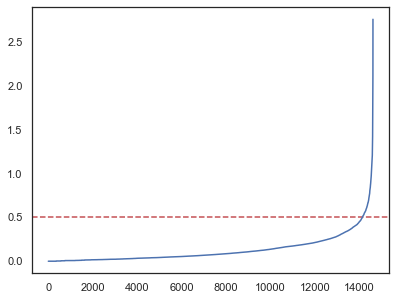

In [383]:
neigh = NearestNeighbors(n_neighbors = 10)
neighbors_fit = neigh.fit(df_time)
distances, indices = neighbors_fit.kneighbors(df_time)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.axhline(y=0.5, color='r', linestyle='--')

plt.plot(distances)


In [384]:
dbscan = DBSCAN(eps=0.5, min_samples=10, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_time)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 9


In [385]:
eps_values = np.arange(0.1, 3.0, 0.05)

r2_df_dbscan = pd.DataFrame(columns=['Clusters', 'Eps', 'R2'])

for eps in eps_values:
    dbscan = DBSCAN(eps=eps, min_samples=10, n_jobs=-1)
    dbscan_labels = dbscan.fit_predict(df_time)
    
    dbscan_n_clusters = len(np.unique(dbscan_labels))

    df_final_dbscan = pd.concat([df_time, pd.Series(dbscan_labels, index=df_time.index, name="dbscan_labels")], axis=1)
    
    sst = get_ss(df_final_dbscan[time])
    ssw_labels = df_final_dbscan[time + ["dbscan_labels"]].groupby(by='dbscan_labels').apply(get_ss)
    ssb = sst - np.sum(ssw_labels)
    r2 = ssb / sst
    
    r2_df_dbscan.loc[len(r2_df_dbscan)] = {'Clusters': dbscan_n_clusters,'Eps': eps, 'R2': r2}

print(r2_df_dbscan)

    Clusters   Eps        R2
0         44  0.10  0.154754
1         44  0.15  0.222141
2         13  0.20  0.221063
3         14  0.25  0.248077
4          6  0.30  0.235936
5         14  0.35  0.247544
6          6  0.40  0.221827
7          5  0.45  0.209898
8          9  0.50  0.204163
9          6  0.55  0.182275
10         4  0.60  0.172790
11         4  0.65  0.138594
12         2  0.70  0.116194
13         4  0.75  0.106177
14         3  0.80  0.096955
15         2  0.85  0.081190
16         3  0.90  0.073373
17         2  0.95  0.063224
18         3  1.00  0.060154
19         2  1.05  0.048574
20         2  1.10  0.043930
21         2  1.15  0.041818
22         2  1.20  0.037305
23         2  1.25  0.034769
24         2  1.30  0.033358
25         2  1.35  0.030205
26         2  1.40  0.026860
27         4  1.45  0.030814
28         3  1.50  0.021464
29         3  1.55  0.018671
30         2  1.60  0.009189
31         2  1.65  0.008508
32         2  1.70  0.008624
33         2  

In [386]:
min_samples = np.arange(1, 30, 1)

r2_df_dbscan = pd.DataFrame(columns=['Clusters', 'Samples', 'R2'])

for sample in min_samples:
    dbscan = DBSCAN(eps = 0.3, min_samples = sample, n_jobs=-1)
    dbscan_labels = dbscan.fit_predict(df_time)
    
    dbscan_n_clusters = len(np.unique(dbscan_labels))

    df_final_dbscan = pd.concat([df_time, pd.Series(dbscan_labels, index=df_time.index, name="dbscan_labels")], axis=1)
    
    sst = get_ss(df_final_dbscan[time])
    ssw_labels = df_final_dbscan[time + ["dbscan_labels"]].groupby(by='dbscan_labels').apply(get_ss)
    ssb = sst - np.sum(ssw_labels)
    r2 = ssb / sst
    
    r2_df_dbscan.loc[len(r2_df_dbscan)] = {'Clusters': dbscan_n_clusters,'Samples': sample, 'R2': r2}

print(r2_df_dbscan)

    Clusters  Samples        R2
0       1752        1  0.695112
1        268        2  0.372755
2        107        3  0.317858
3         65        4  0.281553
4         41        5  0.264696
5         38        6  0.256220
6         18        7  0.245332
7         15        8  0.242750
8         12        9  0.241277
9          6       10  0.235936
10         6       11  0.240506
11         8       12  0.247453
12         6       13  0.245311
13         7       14  0.243869
14         6       15  0.242162
15         8       16  0.243837
16         6       17  0.241998
17         3       18  0.239202
18         4       19  0.243819
19         4       20  0.243628
20         4       21  0.243641
21         4       22  0.243283
22         4       23  0.241337
23         4       24  0.239867
24         4       25  0.239377
25         4       26  0.238906
26         3       27  0.232063
27         2       28  0.229092
28         2       29  0.228016


In [387]:
dbscan = DBSCAN(eps=0.30, min_samples=13, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_time)
dbscan_n_clusters = len(np.unique(dbscan_labels))

In [388]:
df_final_dbscan = pd.concat([data, pd.Series(dbscan_labels, index=data.index, name="dbscan_labels")], axis=1)
df_final_dbscan.groupby(by='dbscan_labels').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
dbscan_labels,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,0.471425,-0.013584,0.240919,0.981678,0.103429,0.008085,0.429607,0.495958,0.075272,0.023697,0.079175,0.042096,0.000279,0.907745,0.639396,-0.220959,-0.083603,0.475430,1.107105,0.044606,0.638695,1.187018,0.186194,0.732884,-0.206207,0.095203
0,0.377046,0.000815,-0.106429,-0.375886,0.027709,0.006493,0.239781,0.609694,0.045816,0.022405,0.115409,0.016552,0.002286,-0.349076,-0.254016,0.088358,0.032895,-0.171800,-0.409573,0.011065,0.866209,-0.436397,-0.108224,-0.282275,0.055938,-0.034991
1,0.342857,-0.919437,-0.485930,1.710495,0.000000,0.000000,0.885714,0.028571,0.028571,0.057143,0.000000,0.000000,0.000000,0.527550,2.034184,-1.742588,-1.236626,-0.042248,0.694093,0.000000,0.228571,0.836053,-0.287942,-0.233044,-0.501206,0.598490
2,0.320000,-1.234721,-0.492953,1.468900,0.000000,0.000000,0.840000,0.000000,0.040000,0.040000,0.080000,0.000000,0.000000,0.288968,1.474160,-1.788369,-1.269331,0.043240,0.794348,0.080000,0.360000,0.795511,-0.287942,-0.511063,-0.523542,0.259907
3,0.578947,-0.002263,-0.399921,-0.149395,0.263158,0.000000,0.210526,0.947368,0.000000,0.000000,0.000000,0.000000,0.000000,-0.257933,-0.358603,0.586864,-0.147183,-0.448926,1.705436,0.000000,0.789474,2.206965,0.197656,1.469067,-0.423878,0.083294
4,0.181818,0.446986,2.503671,-0.270372,0.000000,0.090909,0.000000,0.545455,0.000000,0.090909,0.272727,0.000000,0.000000,-0.549052,-0.320535,0.329804,0.750572,-0.864255,0.523205,0.000000,1.000000,0.206352,-0.287942,0.426967,-0.251372,-0.469675


In [389]:
df_final_dbscan[time + ["dbscan_labels"]].groupby(by='dbscan_labels').mean()

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
dbscan_labels,,,,,
-1,0.240919,0.907745,0.639396,0.475430,1.187018
0,-0.106429,-0.349076,-0.254016,-0.171800,-0.436397
1,-0.485930,0.527550,2.034184,-0.042248,0.836053
2,-0.492953,0.288968,1.474160,0.043240,0.795511
3,-0.399921,-0.257933,-0.358603,-0.448926,2.206965
4,2.503671,-0.549052,-0.320535,-0.864255,0.206352


In [390]:
df_final_dbscan.loc[df_final_dbscan['dbscan_labels'] == -1]

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,dbscan_labels
4,1,1.365436,0.925078,0.219844,0,0,0,1,0,0,0,0,0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0,1,0.866532,-0.287942,1.728548,-0.384561,-0.843000,-1
5,0,0.028562,-0.554122,-0.455489,0,0,0,1,0,0,0,0,0,-0.183172,-0.360532,0.586864,0.890138,3.410181,-0.872388,0,1,-0.410221,-0.287942,-0.235756,-0.129764,1.503611,-1
7,1,-0.168786,0.131884,-0.183560,1,0,0,1,0,0,0,0,0,-0.081709,-0.360532,0.586864,0.988860,0.944160,2.782735,0,1,2.801946,-0.287942,1.539606,-0.448261,-1.136326,-1
11,0,0.391428,-0.118223,0.780209,1,0,0,1,0,0,1,0,0,2.623960,-0.360532,0.586864,0.988860,3.738984,-0.141363,0,1,0.506177,2.787515,0.592282,0.003426,1.210284,-1
16,1,1.473659,-0.325454,1.538366,1,0,0,1,0,0,1,0,0,4.348824,-0.360532,0.586864,0.033373,0.615357,2.782735,0,1,3.422423,2.787515,5.339568,-0.413516,0.916958,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14843,0,0.410526,-0.289724,0.568805,0,0,0,1,0,0,0,0,0,0.746902,-0.360532,0.586864,0.988860,-0.206650,2.051711,0,1,1.890320,-0.287942,1.833032,-0.332444,-1.136326,-1
14850,0,-0.467991,-0.032472,-0.142727,0,0,0,1,0,0,0,0,0,0.848365,-0.360532,0.586864,0.988860,-0.864255,-0.141363,0,1,0.038432,-0.287942,-0.183514,0.125034,1.210284,-1
14852,1,-1.384705,-0.561268,3.368455,0,0,1,0,0,0,0,0,0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0,0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,-1
14855,1,1.671007,-0.554122,1.422818,0,0,1,0,0,0,0,0,0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0,0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,-1


In [391]:
df_nonoise = df_final_dbscan.loc[df_final_dbscan['dbscan_labels'] != -1]
sst = get_ss(df_final_dbscan[time])  # get total sum of squares
ssw_labels = df_final_dbscan[time + ["dbscan_labels"]].groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.2453


<div class="alert alert-block alert-success">

<a class="anchor" id="55th-bullet">    </a>
# 9. Merging Perspectives
    

    
</div>

[Return to Index](#index)

<hr>
<a class = "anchor" id = "56th-bullet">

## 9.1. Recap

</a>
</div>

[Return to Index](#index)

Before proceeding to merge the three perspectives previously defined, let's recap what we've discovered with each one by computing the final algorithm used for each one, with the optimal number of clusters.

### Activities View
The best solution for this perspective was achieved with the creation of 4 clusters, using the K-Prototypes algorithm. Additionally, we also learned that merging all activities that are not "water", "fitness" or "combat" into a single attribute led to better clusters, both in the R-Squared score, but also in the insights and profiling that it enables us to make. Therefore, before computing the final solution for the Activities perspective, let's apply this transformation to our original dataframe.

In [392]:
data['OtherActivities'] = data[['AthleticsActivities', 'OtherActivities', 'SpecialActivities', 'RacketActivities', 'TeamActivities']].any(axis = 1).astype('int8')
data.drop(columns = {'AthleticsActivities', 'SpecialActivities', 'RacketActivities', 'TeamActivities'}, inplace = True)

In [393]:
df_activities = data[["WaterActivities", "FitnessActivities", "OtherActivities", "CombatActivities", "TotalNumberActivities"]]

In [394]:
kprototypes_final = KPrototypes(n_clusters = 4, random_state = 0) 
kprototypes_final_labels = kprototypes_final.fit_predict(df_activities, categorical = [0, 1]) 
kprototypes_final_labels

array([0, 2, 0, ..., 0, 3, 0], dtype=uint16)

In [395]:
df_activities_concat = pd.concat((df_activities, pd.Series(kprototypes_final_labels, name = "ActivitiesLabels", index = df_activities.index)), axis = 1)
df_activities_concat.groupby("ActivitiesLabels").mean()

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities
ActivitiesLabels,,,,,
0,0.00000,1.000000,0.000000,0.000000,-0.287942
1,0.52439,0.771777,0.344948,0.374564,2.913427
2,0.00000,0.000000,0.504421,0.495579,-0.287942
3,1.00000,0.000000,0.000000,0.000000,-0.287942


In [396]:
df_activities_concat["ActivitiesLabels"].value_counts()

ActivitiesLabels
0    7585
3    3617
2    2262
1    1148
Name: count, dtype: int64

In [397]:
sst = get_ss(df_activities_concat)
ssw_labels = df_activities_concat.groupby(by = "ActivitiesLabels").apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9424


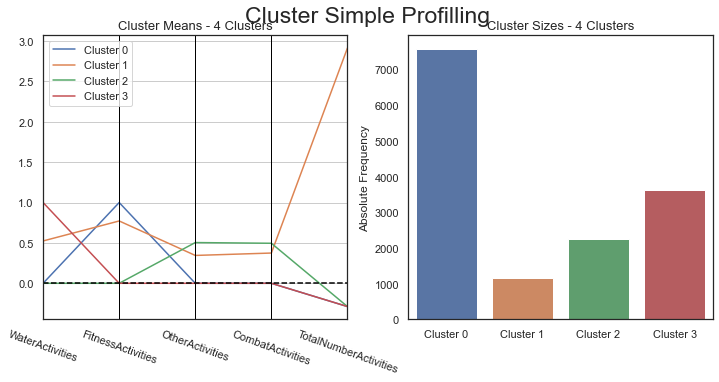

In [398]:
cluster_profiles(
    df = df_activities_concat, 
    label_columns = ['ActivitiesLabels'], 
    figsize = (12, 5), 
    compar_titles = [""]
)

__Profiling__:
* Cluster 0: Everyone in this cluster participates in fitness and only fitness activities. Despite being this specific, it is the most representative cluster.
* Cluster 1: People in this cluster tend to enroll in the most activities. The majority of them participates in water and fitness activities, but combat and other activities are also well represented.
* Cluster 2: This cluster only contains people that participate in either combat or combat activities. Around 50% of the people belonging to this cluster participate in each of these activities.
* Cluster 3: Everyone in this cluster participates in water and only water activities. It is the second most representative cluster.

### Value View

In [399]:
df_value = data[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals']]

In [400]:
value = ['Income','LifetimeValue','PercentageIncomeSpent','TotalIncomeDuringEnrollment', 'NumberOfRenewals']

In [401]:
sm_value = sompy.SOMFactory().build(
    df_value.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals'] #the name of the list which contains the variables of this perspective
)

sm_value.train(n_job=-1, verbose='info',
         train_rough_len=2000,
         train_finetune_len=2000)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 2000

 epoch: 1 ---> elapsed time:  0.235000, quantization error: 1.289015

 epoch: 2 ---> elapsed time:  0.219000, quantization error: 1.867108

 epoch: 3 ---> elapsed time:  0.251000, quantization error: 1.839609

 epoch: 4 ---> elapsed time:  0.220000, quantization error: 1.833117

 epoch: 5 ---> elapsed time:  0.235000, quantization error: 1.828999

 epoch: 6 ---> elapsed time:  0.204000, quantization error: 1.827257

 epoch: 7 ---> elapsed time:  0.220000, quantization error: 1.826097

 epoch: 8 ---> elapsed time:  0.220000, quantization error: 1.825186

 epoch: 9 ---> elapsed time:  0.220000, quantization error: 1.824674

 epoch: 10 ---> elapsed time:  0.235000, quantization error: 1.824229

 epoch: 11 ---> elapsed time:  0.252000, quantization error: 1.823753

 epoch: 12 ---> elapsed time:  0.235000, quantization error: 1.823465

 epoch: 13 ---

 epoch: 115 ---> elapsed time:  0.283000, quantization error: 1.817822

 epoch: 116 ---> elapsed time:  0.266000, quantization error: 1.817766

 epoch: 117 ---> elapsed time:  0.282000, quantization error: 1.817711

 epoch: 118 ---> elapsed time:  0.267000, quantization error: 1.817655

 epoch: 119 ---> elapsed time:  0.267000, quantization error: 1.817599

 epoch: 120 ---> elapsed time:  0.283000, quantization error: 1.817543

 epoch: 121 ---> elapsed time:  0.286000, quantization error: 1.817487

 epoch: 122 ---> elapsed time:  0.279000, quantization error: 1.817431

 epoch: 123 ---> elapsed time:  0.283000, quantization error: 1.817374

 epoch: 124 ---> elapsed time:  0.283000, quantization error: 1.817318

 epoch: 125 ---> elapsed time:  0.298000, quantization error: 1.817262

 epoch: 126 ---> elapsed time:  0.267000, quantization error: 1.817205

 epoch: 127 ---> elapsed time:  0.291000, quantization error: 1.817148

 epoch: 128 ---> elapsed time:  0.274000, quantization error: 1.

 epoch: 229 ---> elapsed time:  0.314000, quantization error: 1.811004

 epoch: 230 ---> elapsed time:  0.315000, quantization error: 1.810940

 epoch: 231 ---> elapsed time:  0.283000, quantization error: 1.810876

 epoch: 232 ---> elapsed time:  0.298000, quantization error: 1.810811

 epoch: 233 ---> elapsed time:  0.298000, quantization error: 1.810747

 epoch: 234 ---> elapsed time:  0.283000, quantization error: 1.810682

 epoch: 235 ---> elapsed time:  0.298000, quantization error: 1.810618

 epoch: 236 ---> elapsed time:  0.314000, quantization error: 1.810553

 epoch: 237 ---> elapsed time:  0.298000, quantization error: 1.810488

 epoch: 238 ---> elapsed time:  0.314000, quantization error: 1.810423

 epoch: 239 ---> elapsed time:  0.299000, quantization error: 1.810358

 epoch: 240 ---> elapsed time:  0.283000, quantization error: 1.810293

 epoch: 241 ---> elapsed time:  0.298000, quantization error: 1.810228

 epoch: 242 ---> elapsed time:  0.282000, quantization error: 1.

 epoch: 343 ---> elapsed time:  0.346000, quantization error: 1.803117

 epoch: 344 ---> elapsed time:  0.329000, quantization error: 1.803042

 epoch: 345 ---> elapsed time:  0.329000, quantization error: 1.802969

 epoch: 346 ---> elapsed time:  0.330000, quantization error: 1.802896

 epoch: 347 ---> elapsed time:  0.314000, quantization error: 1.802822

 epoch: 348 ---> elapsed time:  0.330000, quantization error: 1.802748

 epoch: 349 ---> elapsed time:  0.376000, quantization error: 1.802673

 epoch: 350 ---> elapsed time:  0.346000, quantization error: 1.802599

 epoch: 351 ---> elapsed time:  0.362000, quantization error: 1.802528

 epoch: 352 ---> elapsed time:  0.346000, quantization error: 1.802452

 epoch: 353 ---> elapsed time:  0.362000, quantization error: 1.802375

 epoch: 354 ---> elapsed time:  0.361000, quantization error: 1.802299

 epoch: 355 ---> elapsed time:  0.346000, quantization error: 1.802223

 epoch: 356 ---> elapsed time:  0.361000, quantization error: 1.

 epoch: 457 ---> elapsed time:  0.361000, quantization error: 1.793964

 epoch: 458 ---> elapsed time:  0.346000, quantization error: 1.793877

 epoch: 459 ---> elapsed time:  0.392000, quantization error: 1.793789

 epoch: 460 ---> elapsed time:  0.330000, quantization error: 1.793700

 epoch: 461 ---> elapsed time:  0.356000, quantization error: 1.793611

 epoch: 462 ---> elapsed time:  0.335000, quantization error: 1.793523

 epoch: 463 ---> elapsed time:  0.330000, quantization error: 1.793436

 epoch: 464 ---> elapsed time:  0.346000, quantization error: 1.793347

 epoch: 465 ---> elapsed time:  0.361000, quantization error: 1.793259

 epoch: 466 ---> elapsed time:  0.345000, quantization error: 1.793171

 epoch: 467 ---> elapsed time:  0.362000, quantization error: 1.793082

 epoch: 468 ---> elapsed time:  0.346000, quantization error: 1.792993

 epoch: 469 ---> elapsed time:  0.314000, quantization error: 1.792903

 epoch: 470 ---> elapsed time:  0.345000, quantization error: 1.

 epoch: 571 ---> elapsed time:  0.283000, quantization error: 1.783187

 epoch: 572 ---> elapsed time:  0.283000, quantization error: 1.783085

 epoch: 573 ---> elapsed time:  0.272000, quantization error: 1.782982

 epoch: 574 ---> elapsed time:  0.278000, quantization error: 1.782880

 epoch: 575 ---> elapsed time:  0.267000, quantization error: 1.782779

 epoch: 576 ---> elapsed time:  0.267000, quantization error: 1.782677

 epoch: 577 ---> elapsed time:  0.267000, quantization error: 1.782575

 epoch: 578 ---> elapsed time:  0.267000, quantization error: 1.782472

 epoch: 579 ---> elapsed time:  0.282000, quantization error: 1.782369

 epoch: 580 ---> elapsed time:  0.266000, quantization error: 1.782265

 epoch: 581 ---> elapsed time:  0.283000, quantization error: 1.782162

 epoch: 582 ---> elapsed time:  0.327000, quantization error: 1.782058

 epoch: 583 ---> elapsed time:  0.301000, quantization error: 1.781954

 epoch: 584 ---> elapsed time:  0.282000, quantization error: 1.

 epoch: 685 ---> elapsed time:  0.282000, quantization error: 1.770546

 epoch: 686 ---> elapsed time:  0.283000, quantization error: 1.770425

 epoch: 687 ---> elapsed time:  0.283000, quantization error: 1.770303

 epoch: 688 ---> elapsed time:  0.298000, quantization error: 1.770183

 epoch: 689 ---> elapsed time:  0.298000, quantization error: 1.770061

 epoch: 690 ---> elapsed time:  0.282000, quantization error: 1.769943

 epoch: 691 ---> elapsed time:  0.283000, quantization error: 1.769826

 epoch: 692 ---> elapsed time:  0.299000, quantization error: 1.769706

 epoch: 693 ---> elapsed time:  0.298000, quantization error: 1.769584

 epoch: 694 ---> elapsed time:  0.283000, quantization error: 1.769461

 epoch: 695 ---> elapsed time:  0.314000, quantization error: 1.769339

 epoch: 696 ---> elapsed time:  0.299000, quantization error: 1.769216

 epoch: 697 ---> elapsed time:  0.298000, quantization error: 1.769092

 epoch: 698 ---> elapsed time:  0.314000, quantization error: 1.

 epoch: 799 ---> elapsed time:  0.377000, quantization error: 1.755374

 epoch: 800 ---> elapsed time:  0.378000, quantization error: 1.755230

 epoch: 801 ---> elapsed time:  0.424000, quantization error: 1.755087

 epoch: 802 ---> elapsed time:  0.376000, quantization error: 1.754945

 epoch: 803 ---> elapsed time:  0.361000, quantization error: 1.754801

 epoch: 804 ---> elapsed time:  0.407000, quantization error: 1.754656

 epoch: 805 ---> elapsed time:  0.392000, quantization error: 1.754511

 epoch: 806 ---> elapsed time:  0.392000, quantization error: 1.754365

 epoch: 807 ---> elapsed time:  0.503000, quantization error: 1.754221

 epoch: 808 ---> elapsed time:  0.408000, quantization error: 1.754078

 epoch: 809 ---> elapsed time:  0.408000, quantization error: 1.753933

 epoch: 810 ---> elapsed time:  0.361000, quantization error: 1.753786

 epoch: 811 ---> elapsed time:  0.455000, quantization error: 1.753640

 epoch: 812 ---> elapsed time:  0.388000, quantization error: 1.

 epoch: 913 ---> elapsed time:  0.408000, quantization error: 1.737167

 epoch: 914 ---> elapsed time:  0.377000, quantization error: 1.736953

 epoch: 915 ---> elapsed time:  0.377000, quantization error: 1.736734

 epoch: 916 ---> elapsed time:  0.377000, quantization error: 1.736361

 epoch: 917 ---> elapsed time:  0.346000, quantization error: 1.735660

 epoch: 918 ---> elapsed time:  0.330000, quantization error: 1.735224

 epoch: 919 ---> elapsed time:  0.362000, quantization error: 1.734965

 epoch: 920 ---> elapsed time:  0.362000, quantization error: 1.734752

 epoch: 921 ---> elapsed time:  0.346000, quantization error: 1.734542

 epoch: 922 ---> elapsed time:  0.377000, quantization error: 1.734344

 epoch: 923 ---> elapsed time:  0.362000, quantization error: 1.734152

 epoch: 924 ---> elapsed time:  0.377000, quantization error: 1.733962

 epoch: 925 ---> elapsed time:  0.345000, quantization error: 1.733770

 epoch: 926 ---> elapsed time:  0.361000, quantization error: 1.

 epoch: 1027 ---> elapsed time:  0.291000, quantization error: 1.712177

 epoch: 1028 ---> elapsed time:  0.273000, quantization error: 1.711943

 epoch: 1029 ---> elapsed time:  0.283000, quantization error: 1.711707

 epoch: 1030 ---> elapsed time:  0.283000, quantization error: 1.711473

 epoch: 1031 ---> elapsed time:  0.298000, quantization error: 1.711239

 epoch: 1032 ---> elapsed time:  0.268000, quantization error: 1.711005

 epoch: 1033 ---> elapsed time:  0.267000, quantization error: 1.710770

 epoch: 1034 ---> elapsed time:  0.298000, quantization error: 1.710534

 epoch: 1035 ---> elapsed time:  0.283000, quantization error: 1.710299

 epoch: 1036 ---> elapsed time:  0.267000, quantization error: 1.710062

 epoch: 1037 ---> elapsed time:  0.267000, quantization error: 1.709815

 epoch: 1038 ---> elapsed time:  0.282000, quantization error: 1.709577

 epoch: 1039 ---> elapsed time:  0.276000, quantization error: 1.709340

 epoch: 1040 ---> elapsed time:  0.289000, quantiza

 epoch: 1140 ---> elapsed time:  0.298000, quantization error: 1.682443

 epoch: 1141 ---> elapsed time:  0.299000, quantization error: 1.682149

 epoch: 1142 ---> elapsed time:  0.330000, quantization error: 1.681854

 epoch: 1143 ---> elapsed time:  0.327000, quantization error: 1.681560

 epoch: 1144 ---> elapsed time:  0.302000, quantization error: 1.681265

 epoch: 1145 ---> elapsed time:  0.314000, quantization error: 1.680969

 epoch: 1146 ---> elapsed time:  0.329000, quantization error: 1.680674

 epoch: 1147 ---> elapsed time:  0.298000, quantization error: 1.680377

 epoch: 1148 ---> elapsed time:  0.314000, quantization error: 1.680071

 epoch: 1149 ---> elapsed time:  0.330000, quantization error: 1.679769

 epoch: 1150 ---> elapsed time:  0.330000, quantization error: 1.679470

 epoch: 1151 ---> elapsed time:  0.329000, quantization error: 1.679170

 epoch: 1152 ---> elapsed time:  0.314000, quantization error: 1.678870

 epoch: 1153 ---> elapsed time:  0.314000, quantiza

 epoch: 1253 ---> elapsed time:  0.455000, quantization error: 1.644511

 epoch: 1254 ---> elapsed time:  0.361000, quantization error: 1.644132

 epoch: 1255 ---> elapsed time:  0.376000, quantization error: 1.643754

 epoch: 1256 ---> elapsed time:  0.377000, quantization error: 1.643368

 epoch: 1257 ---> elapsed time:  0.345000, quantization error: 1.642987

 epoch: 1258 ---> elapsed time:  0.386000, quantization error: 1.642600

 epoch: 1259 ---> elapsed time:  0.383000, quantization error: 1.642197

 epoch: 1260 ---> elapsed time:  0.392000, quantization error: 1.641802

 epoch: 1261 ---> elapsed time:  0.377000, quantization error: 1.641407

 epoch: 1262 ---> elapsed time:  0.377000, quantization error: 1.641017

 epoch: 1263 ---> elapsed time:  0.393000, quantization error: 1.640624

 epoch: 1264 ---> elapsed time:  0.408000, quantization error: 1.640237

 epoch: 1265 ---> elapsed time:  0.377000, quantization error: 1.639847

 epoch: 1266 ---> elapsed time:  0.399000, quantiza

 epoch: 1366 ---> elapsed time:  0.329000, quantization error: 1.595384

 epoch: 1367 ---> elapsed time:  0.347000, quantization error: 1.594884

 epoch: 1368 ---> elapsed time:  0.345000, quantization error: 1.594385

 epoch: 1369 ---> elapsed time:  0.346000, quantization error: 1.593887

 epoch: 1370 ---> elapsed time:  0.330000, quantization error: 1.593392

 epoch: 1371 ---> elapsed time:  0.314000, quantization error: 1.592897

 epoch: 1372 ---> elapsed time:  0.353000, quantization error: 1.592399

 epoch: 1373 ---> elapsed time:  0.338000, quantization error: 1.591899

 epoch: 1374 ---> elapsed time:  0.345000, quantization error: 1.591400

 epoch: 1375 ---> elapsed time:  0.346000, quantization error: 1.590892

 epoch: 1376 ---> elapsed time:  0.345000, quantization error: 1.590388

 epoch: 1377 ---> elapsed time:  0.346000, quantization error: 1.589875

 epoch: 1378 ---> elapsed time:  0.329000, quantization error: 1.589367

 epoch: 1379 ---> elapsed time:  0.345000, quantiza

 epoch: 1479 ---> elapsed time:  0.329000, quantization error: 1.531063

 epoch: 1480 ---> elapsed time:  0.299000, quantization error: 1.530415

 epoch: 1481 ---> elapsed time:  0.361000, quantization error: 1.529760

 epoch: 1482 ---> elapsed time:  0.361000, quantization error: 1.529102

 epoch: 1483 ---> elapsed time:  0.298000, quantization error: 1.528447

 epoch: 1484 ---> elapsed time:  0.297000, quantization error: 1.527794

 epoch: 1485 ---> elapsed time:  0.300000, quantization error: 1.527137

 epoch: 1486 ---> elapsed time:  0.328000, quantization error: 1.526473

 epoch: 1487 ---> elapsed time:  0.329000, quantization error: 1.525794

 epoch: 1488 ---> elapsed time:  0.329000, quantization error: 1.525132

 epoch: 1489 ---> elapsed time:  0.345000, quantization error: 1.524472

 epoch: 1490 ---> elapsed time:  0.329000, quantization error: 1.523803

 epoch: 1491 ---> elapsed time:  0.345000, quantization error: 1.523140

 epoch: 1492 ---> elapsed time:  0.345000, quantiza

 epoch: 1592 ---> elapsed time:  0.361000, quantization error: 1.447611

 epoch: 1593 ---> elapsed time:  0.330000, quantization error: 1.446773

 epoch: 1594 ---> elapsed time:  0.346000, quantization error: 1.445938

 epoch: 1595 ---> elapsed time:  0.393000, quantization error: 1.445106

 epoch: 1596 ---> elapsed time:  0.357000, quantization error: 1.444260

 epoch: 1597 ---> elapsed time:  0.318000, quantization error: 1.443424

 epoch: 1598 ---> elapsed time:  0.298000, quantization error: 1.442575

 epoch: 1599 ---> elapsed time:  0.314000, quantization error: 1.441733

 epoch: 1600 ---> elapsed time:  0.298000, quantization error: 1.440883

 epoch: 1601 ---> elapsed time:  0.283000, quantization error: 1.440037

 epoch: 1602 ---> elapsed time:  0.333000, quantization error: 1.439190

 epoch: 1603 ---> elapsed time:  0.309000, quantization error: 1.438345

 epoch: 1604 ---> elapsed time:  0.314000, quantization error: 1.437475

 epoch: 1605 ---> elapsed time:  0.346000, quantiza

 epoch: 1705 ---> elapsed time:  0.345000, quantization error: 1.340761

 epoch: 1706 ---> elapsed time:  0.346000, quantization error: 1.339704

 epoch: 1707 ---> elapsed time:  0.362000, quantization error: 1.338642

 epoch: 1708 ---> elapsed time:  0.345000, quantization error: 1.337572

 epoch: 1709 ---> elapsed time:  0.377000, quantization error: 1.336483

 epoch: 1710 ---> elapsed time:  0.362000, quantization error: 1.335385

 epoch: 1711 ---> elapsed time:  0.345000, quantization error: 1.334303

 epoch: 1712 ---> elapsed time:  0.361000, quantization error: 1.333224

 epoch: 1713 ---> elapsed time:  0.377000, quantization error: 1.332139

 epoch: 1714 ---> elapsed time:  0.345000, quantization error: 1.331043

 epoch: 1715 ---> elapsed time:  0.377000, quantization error: 1.329955

 epoch: 1716 ---> elapsed time:  0.361000, quantization error: 1.328857

 epoch: 1717 ---> elapsed time:  0.346000, quantization error: 1.327765

 epoch: 1718 ---> elapsed time:  0.377000, quantiza

 epoch: 1818 ---> elapsed time:  0.298000, quantization error: 1.201230

 epoch: 1819 ---> elapsed time:  0.314000, quantization error: 1.199806

 epoch: 1820 ---> elapsed time:  0.319000, quantization error: 1.198395

 epoch: 1821 ---> elapsed time:  0.309000, quantization error: 1.196970

 epoch: 1822 ---> elapsed time:  0.315000, quantization error: 1.195549

 epoch: 1823 ---> elapsed time:  0.330000, quantization error: 1.194130

 epoch: 1824 ---> elapsed time:  0.314000, quantization error: 1.192715

 epoch: 1825 ---> elapsed time:  0.314000, quantization error: 1.191277

 epoch: 1826 ---> elapsed time:  0.283000, quantization error: 1.189846

 epoch: 1827 ---> elapsed time:  0.299000, quantization error: 1.188402

 epoch: 1828 ---> elapsed time:  0.313000, quantization error: 1.186972

 epoch: 1829 ---> elapsed time:  0.331000, quantization error: 1.185540

 epoch: 1830 ---> elapsed time:  0.315000, quantization error: 1.184102

 epoch: 1831 ---> elapsed time:  0.314000, quantiza

 epoch: 1931 ---> elapsed time:  0.268000, quantization error: 1.013473

 epoch: 1932 ---> elapsed time:  0.283000, quantization error: 1.011563

 epoch: 1933 ---> elapsed time:  0.266000, quantization error: 1.009632

 epoch: 1934 ---> elapsed time:  0.267000, quantization error: 1.007716

 epoch: 1935 ---> elapsed time:  0.262000, quantization error: 1.005815

 epoch: 1936 ---> elapsed time:  0.272000, quantization error: 1.003892

 epoch: 1937 ---> elapsed time:  0.283000, quantization error: 1.001934

 epoch: 1938 ---> elapsed time:  0.267000, quantization error: 0.999946

 epoch: 1939 ---> elapsed time:  0.267000, quantization error: 0.997874

 epoch: 1940 ---> elapsed time:  0.315000, quantization error: 0.995609

 epoch: 1941 ---> elapsed time:  0.267000, quantization error: 0.992856

 epoch: 1942 ---> elapsed time:  0.267000, quantization error: 0.990783

 epoch: 1943 ---> elapsed time:  0.283000, quantization error: 0.988850

 epoch: 1944 ---> elapsed time:  0.283000, quantiza

 epoch: 44 ---> elapsed time:  0.291000, quantization error: 1.191876

 epoch: 45 ---> elapsed time:  0.299000, quantization error: 1.191544

 epoch: 46 ---> elapsed time:  0.298000, quantization error: 1.191210

 epoch: 47 ---> elapsed time:  0.298000, quantization error: 1.190877

 epoch: 48 ---> elapsed time:  0.283000, quantization error: 1.190552

 epoch: 49 ---> elapsed time:  0.283000, quantization error: 1.190232

 epoch: 50 ---> elapsed time:  0.299000, quantization error: 1.189904

 epoch: 51 ---> elapsed time:  0.299000, quantization error: 1.189572

 epoch: 52 ---> elapsed time:  0.299000, quantization error: 1.189239

 epoch: 53 ---> elapsed time:  0.298000, quantization error: 1.188904

 epoch: 54 ---> elapsed time:  0.330000, quantization error: 1.188570

 epoch: 55 ---> elapsed time:  0.283000, quantization error: 1.188234

 epoch: 56 ---> elapsed time:  0.330000, quantization error: 1.187900

 epoch: 57 ---> elapsed time:  0.315000, quantization error: 1.187562

 epoch

 epoch: 159 ---> elapsed time:  0.361000, quantization error: 1.151685

 epoch: 160 ---> elapsed time:  0.330000, quantization error: 1.151323

 epoch: 161 ---> elapsed time:  0.377000, quantization error: 1.150962

 epoch: 162 ---> elapsed time:  0.377000, quantization error: 1.150605

 epoch: 163 ---> elapsed time:  0.346000, quantization error: 1.150244

 epoch: 164 ---> elapsed time:  0.346000, quantization error: 1.149880

 epoch: 165 ---> elapsed time:  0.351000, quantization error: 1.149523

 epoch: 166 ---> elapsed time:  0.324000, quantization error: 1.149171

 epoch: 167 ---> elapsed time:  0.377000, quantization error: 1.148818

 epoch: 168 ---> elapsed time:  0.360000, quantization error: 1.148468

 epoch: 169 ---> elapsed time:  0.393000, quantization error: 1.148115

 epoch: 170 ---> elapsed time:  0.377000, quantization error: 1.147750

 epoch: 171 ---> elapsed time:  0.330000, quantization error: 1.147377

 epoch: 172 ---> elapsed time:  0.330000, quantization error: 1.

 epoch: 273 ---> elapsed time:  0.330000, quantization error: 1.109348

 epoch: 274 ---> elapsed time:  0.345000, quantization error: 1.108975

 epoch: 275 ---> elapsed time:  0.345000, quantization error: 1.108598

 epoch: 276 ---> elapsed time:  0.330000, quantization error: 1.108217

 epoch: 277 ---> elapsed time:  0.314000, quantization error: 1.107837

 epoch: 278 ---> elapsed time:  0.345000, quantization error: 1.107461

 epoch: 279 ---> elapsed time:  0.330000, quantization error: 1.107088

 epoch: 280 ---> elapsed time:  0.314000, quantization error: 1.106717

 epoch: 281 ---> elapsed time:  0.330000, quantization error: 1.106337

 epoch: 282 ---> elapsed time:  0.330000, quantization error: 1.105954

 epoch: 283 ---> elapsed time:  0.346000, quantization error: 1.105577

 epoch: 284 ---> elapsed time:  0.345000, quantization error: 1.105195

 epoch: 285 ---> elapsed time:  0.330000, quantization error: 1.104810

 epoch: 286 ---> elapsed time:  0.314000, quantization error: 1.

 epoch: 387 ---> elapsed time:  0.250000, quantization error: 1.065435

 epoch: 388 ---> elapsed time:  0.282000, quantization error: 1.065028

 epoch: 389 ---> elapsed time:  0.270000, quantization error: 1.064626

 epoch: 390 ---> elapsed time:  0.280000, quantization error: 1.064213

 epoch: 391 ---> elapsed time:  0.251000, quantization error: 1.063808

 epoch: 392 ---> elapsed time:  0.271000, quantization error: 1.063399

 epoch: 393 ---> elapsed time:  0.278000, quantization error: 1.062993

 epoch: 394 ---> elapsed time:  0.267000, quantization error: 1.062595

 epoch: 395 ---> elapsed time:  0.257000, quantization error: 1.062210

 epoch: 396 ---> elapsed time:  0.261000, quantization error: 1.061814

 epoch: 397 ---> elapsed time:  0.267000, quantization error: 1.061423

 epoch: 398 ---> elapsed time:  0.284000, quantization error: 1.061023

 epoch: 399 ---> elapsed time:  0.267000, quantization error: 1.060627

 epoch: 400 ---> elapsed time:  0.267000, quantization error: 1.

 epoch: 501 ---> elapsed time:  0.298000, quantization error: 1.017961

 epoch: 502 ---> elapsed time:  0.282000, quantization error: 1.017529

 epoch: 503 ---> elapsed time:  0.285000, quantization error: 1.017100

 epoch: 504 ---> elapsed time:  0.295000, quantization error: 1.016672

 epoch: 505 ---> elapsed time:  0.283000, quantization error: 1.016237

 epoch: 506 ---> elapsed time:  0.283000, quantization error: 1.015798

 epoch: 507 ---> elapsed time:  0.314000, quantization error: 1.015366

 epoch: 508 ---> elapsed time:  0.298000, quantization error: 1.014934

 epoch: 509 ---> elapsed time:  0.298000, quantization error: 1.014502

 epoch: 510 ---> elapsed time:  0.298000, quantization error: 1.014075

 epoch: 511 ---> elapsed time:  0.306000, quantization error: 1.013646

 epoch: 512 ---> elapsed time:  0.290000, quantization error: 1.013216

 epoch: 513 ---> elapsed time:  0.298000, quantization error: 1.012779

 epoch: 514 ---> elapsed time:  0.298000, quantization error: 1.

 epoch: 615 ---> elapsed time:  0.345000, quantization error: 0.967125

 epoch: 616 ---> elapsed time:  0.346000, quantization error: 0.966670

 epoch: 617 ---> elapsed time:  0.346000, quantization error: 0.966216

 epoch: 618 ---> elapsed time:  0.330000, quantization error: 0.965751

 epoch: 619 ---> elapsed time:  0.330000, quantization error: 0.965278

 epoch: 620 ---> elapsed time:  0.366000, quantization error: 0.964814

 epoch: 621 ---> elapsed time:  0.326000, quantization error: 0.964344

 epoch: 622 ---> elapsed time:  0.361000, quantization error: 0.963881

 epoch: 623 ---> elapsed time:  0.393000, quantization error: 0.963423

 epoch: 624 ---> elapsed time:  0.330000, quantization error: 0.962956

 epoch: 625 ---> elapsed time:  0.345000, quantization error: 0.962489

 epoch: 626 ---> elapsed time:  0.350000, quantization error: 0.962031

 epoch: 627 ---> elapsed time:  0.326000, quantization error: 0.961562

 epoch: 628 ---> elapsed time:  0.331000, quantization error: 0.

 epoch: 729 ---> elapsed time:  0.346000, quantization error: 0.912914

 epoch: 730 ---> elapsed time:  0.345000, quantization error: 0.912429

 epoch: 731 ---> elapsed time:  0.361000, quantization error: 0.911942

 epoch: 732 ---> elapsed time:  0.329000, quantization error: 0.911459

 epoch: 733 ---> elapsed time:  0.392000, quantization error: 0.910984

 epoch: 734 ---> elapsed time:  0.377000, quantization error: 0.910502

 epoch: 735 ---> elapsed time:  0.330000, quantization error: 0.910021

 epoch: 736 ---> elapsed time:  0.345000, quantization error: 0.909520

 epoch: 737 ---> elapsed time:  0.362000, quantization error: 0.909019

 epoch: 738 ---> elapsed time:  0.329000, quantization error: 0.908531

 epoch: 739 ---> elapsed time:  0.330000, quantization error: 0.908035

 epoch: 740 ---> elapsed time:  0.347000, quantization error: 0.907555

 epoch: 741 ---> elapsed time:  0.330000, quantization error: 0.907062

 epoch: 742 ---> elapsed time:  0.330000, quantization error: 0.

 epoch: 843 ---> elapsed time:  0.282000, quantization error: 0.856387

 epoch: 844 ---> elapsed time:  0.267000, quantization error: 0.855891

 epoch: 845 ---> elapsed time:  0.267000, quantization error: 0.855398

 epoch: 846 ---> elapsed time:  0.267000, quantization error: 0.854896

 epoch: 847 ---> elapsed time:  0.267000, quantization error: 0.854396

 epoch: 848 ---> elapsed time:  0.267000, quantization error: 0.853884

 epoch: 849 ---> elapsed time:  0.267000, quantization error: 0.853369

 epoch: 850 ---> elapsed time:  0.267000, quantization error: 0.852854

 epoch: 851 ---> elapsed time:  0.282000, quantization error: 0.852325

 epoch: 852 ---> elapsed time:  0.251000, quantization error: 0.851824

 epoch: 853 ---> elapsed time:  0.267000, quantization error: 0.851316

 epoch: 854 ---> elapsed time:  0.266000, quantization error: 0.850819

 epoch: 855 ---> elapsed time:  0.283000, quantization error: 0.850317

 epoch: 856 ---> elapsed time:  0.283000, quantization error: 0.

 epoch: 957 ---> elapsed time:  0.260000, quantization error: 0.795429

 epoch: 958 ---> elapsed time:  0.284000, quantization error: 0.794912

 epoch: 959 ---> elapsed time:  0.267000, quantization error: 0.794365

 epoch: 960 ---> elapsed time:  0.298000, quantization error: 0.793830

 epoch: 961 ---> elapsed time:  0.281000, quantization error: 0.793317

 epoch: 962 ---> elapsed time:  0.314000, quantization error: 0.792808

 epoch: 963 ---> elapsed time:  0.266000, quantization error: 0.792278

 epoch: 964 ---> elapsed time:  0.299000, quantization error: 0.791760

 epoch: 965 ---> elapsed time:  0.282000, quantization error: 0.791235

 epoch: 966 ---> elapsed time:  0.314000, quantization error: 0.790706

 epoch: 967 ---> elapsed time:  0.267000, quantization error: 0.790197

 epoch: 968 ---> elapsed time:  0.299000, quantization error: 0.789674

 epoch: 969 ---> elapsed time:  0.283000, quantization error: 0.789132

 epoch: 970 ---> elapsed time:  0.266000, quantization error: 0.

 epoch: 1070 ---> elapsed time:  0.308000, quantization error: 0.734019

 epoch: 1071 ---> elapsed time:  0.314000, quantization error: 0.733467

 epoch: 1072 ---> elapsed time:  0.314000, quantization error: 0.732903

 epoch: 1073 ---> elapsed time:  0.314000, quantization error: 0.732358

 epoch: 1074 ---> elapsed time:  0.314000, quantization error: 0.731783

 epoch: 1075 ---> elapsed time:  0.329000, quantization error: 0.731186

 epoch: 1076 ---> elapsed time:  0.314000, quantization error: 0.730596

 epoch: 1077 ---> elapsed time:  0.314000, quantization error: 0.730051

 epoch: 1078 ---> elapsed time:  0.298000, quantization error: 0.729462

 epoch: 1079 ---> elapsed time:  0.314000, quantization error: 0.728911

 epoch: 1080 ---> elapsed time:  0.314000, quantization error: 0.728356

 epoch: 1081 ---> elapsed time:  0.330000, quantization error: 0.727822

 epoch: 1082 ---> elapsed time:  0.346000, quantization error: 0.727280

 epoch: 1083 ---> elapsed time:  0.330000, quantiza

 epoch: 1183 ---> elapsed time:  0.377000, quantization error: 0.673709

 epoch: 1184 ---> elapsed time:  0.361000, quantization error: 0.673186

 epoch: 1185 ---> elapsed time:  0.366000, quantization error: 0.672626

 epoch: 1186 ---> elapsed time:  0.372000, quantization error: 0.672126

 epoch: 1187 ---> elapsed time:  0.394000, quantization error: 0.671631

 epoch: 1188 ---> elapsed time:  0.408000, quantization error: 0.671140

 epoch: 1189 ---> elapsed time:  0.392000, quantization error: 0.670630

 epoch: 1190 ---> elapsed time:  0.377000, quantization error: 0.670121

 epoch: 1191 ---> elapsed time:  0.423000, quantization error: 0.669614

 epoch: 1192 ---> elapsed time:  0.409000, quantization error: 0.669120

 epoch: 1193 ---> elapsed time:  0.361000, quantization error: 0.668586

 epoch: 1194 ---> elapsed time:  0.392000, quantization error: 0.668055

 epoch: 1195 ---> elapsed time:  0.378000, quantization error: 0.667551

 epoch: 1196 ---> elapsed time:  0.401000, quantiza

 epoch: 1296 ---> elapsed time:  0.298000, quantization error: 0.613314

 epoch: 1297 ---> elapsed time:  0.313000, quantization error: 0.612811

 epoch: 1298 ---> elapsed time:  0.314000, quantization error: 0.612321

 epoch: 1299 ---> elapsed time:  0.283000, quantization error: 0.611810

 epoch: 1300 ---> elapsed time:  0.298000, quantization error: 0.611310

 epoch: 1301 ---> elapsed time:  0.298000, quantization error: 0.610804

 epoch: 1302 ---> elapsed time:  0.298000, quantization error: 0.610229

 epoch: 1303 ---> elapsed time:  0.314000, quantization error: 0.609672

 epoch: 1304 ---> elapsed time:  0.298000, quantization error: 0.609128

 epoch: 1305 ---> elapsed time:  0.299000, quantization error: 0.608570

 epoch: 1306 ---> elapsed time:  0.283000, quantization error: 0.608050

 epoch: 1307 ---> elapsed time:  0.283000, quantization error: 0.607441

 epoch: 1308 ---> elapsed time:  0.330000, quantization error: 0.606941

 epoch: 1309 ---> elapsed time:  0.267000, quantiza

 epoch: 1409 ---> elapsed time:  0.267000, quantization error: 0.552732

 epoch: 1410 ---> elapsed time:  0.282000, quantization error: 0.552196

 epoch: 1411 ---> elapsed time:  0.267000, quantization error: 0.551678

 epoch: 1412 ---> elapsed time:  0.267000, quantization error: 0.551159

 epoch: 1413 ---> elapsed time:  0.283000, quantization error: 0.550619

 epoch: 1414 ---> elapsed time:  0.267000, quantization error: 0.550100

 epoch: 1415 ---> elapsed time:  0.283000, quantization error: 0.549557

 epoch: 1416 ---> elapsed time:  0.283000, quantization error: 0.549009

 epoch: 1417 ---> elapsed time:  0.267000, quantization error: 0.548453

 epoch: 1418 ---> elapsed time:  0.283000, quantization error: 0.547908

 epoch: 1419 ---> elapsed time:  0.267000, quantization error: 0.547353

 epoch: 1420 ---> elapsed time:  0.268000, quantization error: 0.546785

 epoch: 1421 ---> elapsed time:  0.267000, quantization error: 0.546243

 epoch: 1422 ---> elapsed time:  0.267000, quantiza

 epoch: 1522 ---> elapsed time:  0.298000, quantization error: 0.491252

 epoch: 1523 ---> elapsed time:  0.299000, quantization error: 0.490744

 epoch: 1524 ---> elapsed time:  0.314000, quantization error: 0.490214

 epoch: 1525 ---> elapsed time:  0.313000, quantization error: 0.489650

 epoch: 1526 ---> elapsed time:  0.301000, quantization error: 0.489111

 epoch: 1527 ---> elapsed time:  0.299000, quantization error: 0.488587

 epoch: 1528 ---> elapsed time:  0.328000, quantization error: 0.488029

 epoch: 1529 ---> elapsed time:  0.314000, quantization error: 0.487491

 epoch: 1530 ---> elapsed time:  0.314000, quantization error: 0.486982

 epoch: 1531 ---> elapsed time:  0.298000, quantization error: 0.486480

 epoch: 1532 ---> elapsed time:  0.314000, quantization error: 0.485946

 epoch: 1533 ---> elapsed time:  0.314000, quantization error: 0.485401

 epoch: 1534 ---> elapsed time:  0.314000, quantization error: 0.484860

 epoch: 1535 ---> elapsed time:  0.309000, quantiza

 epoch: 1635 ---> elapsed time:  0.362000, quantization error: 0.430551

 epoch: 1636 ---> elapsed time:  0.346000, quantization error: 0.429957

 epoch: 1637 ---> elapsed time:  0.377000, quantization error: 0.429410

 epoch: 1638 ---> elapsed time:  0.364000, quantization error: 0.428851

 epoch: 1639 ---> elapsed time:  0.342000, quantization error: 0.428309

 epoch: 1640 ---> elapsed time:  0.362000, quantization error: 0.427796

 epoch: 1641 ---> elapsed time:  0.392000, quantization error: 0.427245

 epoch: 1642 ---> elapsed time:  0.362000, quantization error: 0.426686

 epoch: 1643 ---> elapsed time:  0.393000, quantization error: 0.426165

 epoch: 1644 ---> elapsed time:  0.455000, quantization error: 0.425656

 epoch: 1645 ---> elapsed time:  0.424000, quantization error: 0.425150

 epoch: 1646 ---> elapsed time:  0.392000, quantization error: 0.424652

 epoch: 1647 ---> elapsed time:  0.424000, quantization error: 0.424133

 epoch: 1648 ---> elapsed time:  0.408000, quantiza

 epoch: 1748 ---> elapsed time:  0.330000, quantization error: 0.367682

 epoch: 1749 ---> elapsed time:  0.314000, quantization error: 0.367125

 epoch: 1750 ---> elapsed time:  0.298000, quantization error: 0.366532

 epoch: 1751 ---> elapsed time:  0.298000, quantization error: 0.365992

 epoch: 1752 ---> elapsed time:  0.298000, quantization error: 0.365421

 epoch: 1753 ---> elapsed time:  0.314000, quantization error: 0.364902

 epoch: 1754 ---> elapsed time:  0.298000, quantization error: 0.364392

 epoch: 1755 ---> elapsed time:  0.283000, quantization error: 0.363891

 epoch: 1756 ---> elapsed time:  0.314000, quantization error: 0.363387

 epoch: 1757 ---> elapsed time:  0.298000, quantization error: 0.362875

 epoch: 1758 ---> elapsed time:  0.314000, quantization error: 0.362388

 epoch: 1759 ---> elapsed time:  0.298000, quantization error: 0.361882

 epoch: 1760 ---> elapsed time:  0.299000, quantization error: 0.361382

 epoch: 1761 ---> elapsed time:  0.299000, quantiza

 epoch: 1861 ---> elapsed time:  0.267000, quantization error: 0.306032

 epoch: 1862 ---> elapsed time:  0.282000, quantization error: 0.305510

 epoch: 1863 ---> elapsed time:  0.267000, quantization error: 0.304979

 epoch: 1864 ---> elapsed time:  0.298000, quantization error: 0.304464

 epoch: 1865 ---> elapsed time:  0.283000, quantization error: 0.303897

 epoch: 1866 ---> elapsed time:  0.283000, quantization error: 0.303312

 epoch: 1867 ---> elapsed time:  0.282000, quantization error: 0.302771

 epoch: 1868 ---> elapsed time:  0.291000, quantization error: 0.302238

 epoch: 1869 ---> elapsed time:  0.274000, quantization error: 0.301741

 epoch: 1870 ---> elapsed time:  0.267000, quantization error: 0.301243

 epoch: 1871 ---> elapsed time:  0.283000, quantization error: 0.300768

 epoch: 1872 ---> elapsed time:  0.283000, quantization error: 0.300237

 epoch: 1873 ---> elapsed time:  0.267000, quantization error: 0.299752

 epoch: 1874 ---> elapsed time:  0.283000, quantiza

 epoch: 1974 ---> elapsed time:  0.314000, quantization error: 0.249114

 epoch: 1975 ---> elapsed time:  0.330000, quantization error: 0.248621

 epoch: 1976 ---> elapsed time:  0.283000, quantization error: 0.248098

 epoch: 1977 ---> elapsed time:  0.298000, quantization error: 0.247630

 epoch: 1978 ---> elapsed time:  0.314000, quantization error: 0.247174

 epoch: 1979 ---> elapsed time:  0.298000, quantization error: 0.246737

 epoch: 1980 ---> elapsed time:  0.314000, quantization error: 0.246273

 epoch: 1981 ---> elapsed time:  0.298000, quantization error: 0.245781

 epoch: 1982 ---> elapsed time:  0.298000, quantization error: 0.245280

 epoch: 1983 ---> elapsed time:  0.298000, quantization error: 0.244801

 epoch: 1984 ---> elapsed time:  0.283000, quantization error: 0.244287

 epoch: 1985 ---> elapsed time:  0.298000, quantization error: 0.243844

 epoch: 1986 ---> elapsed time:  0.314000, quantization error: 0.243387

 epoch: 1987 ---> elapsed time:  0.314000, quantiza

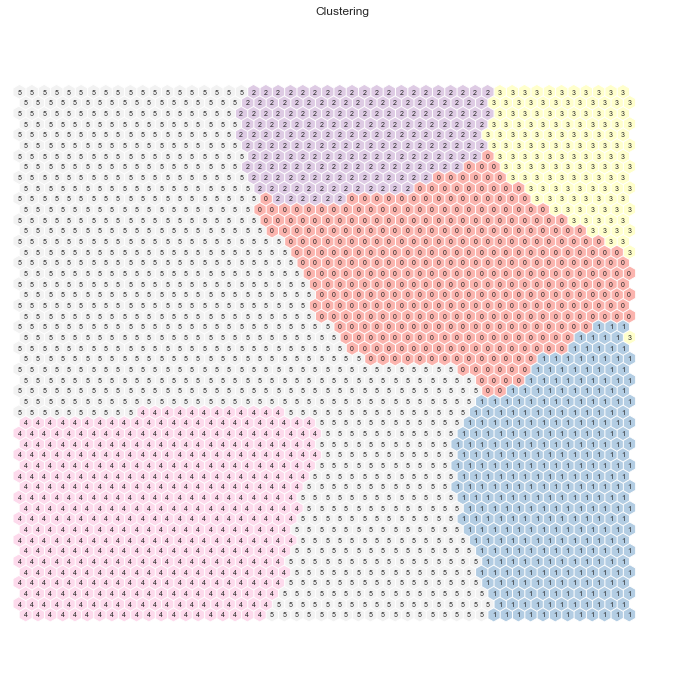

In [402]:
kmeans = KMeans(n_clusters=6, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm_value.codebook.matrix)
sm_value.cluster_labels = nodeclus_labels 

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm_value, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [403]:
nodes = sm_value.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=df_value.columns)
df_nodes['label'] = nodeclus_labels
df_nodes

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals,label
0,2.475387,2.222255,-0.639494,6.225528,2.426948,3
1,2.228182,2.489380,-0.570517,5.679518,2.404487,3
2,1.969456,2.964139,-0.472678,5.192473,2.367832,3
3,1.682811,3.409174,-0.376810,4.793498,2.413066,3
4,1.557438,3.169923,-0.349663,4.301738,2.251111,3
...,...,...,...,...,...,...
2495,-0.162800,-0.593721,3.174772,-0.588906,-0.793682,4
2496,-0.254989,-0.572624,3.569198,-0.590211,-0.758944,4
2497,-0.327107,-0.527624,4.123711,-0.589354,-0.729657,4
2498,-0.432990,-0.423451,4.789483,-0.581131,-0.612939,4


In [404]:
bmus_map = sm_value.find_bmu(df_value)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((data, np.expand_dims(bmus_map,1)), axis=1),
    index=data.index, columns=np.append(data.columns,"BMU")
)
df_bmus

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,CombatActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,1.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2455.0
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,1.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,972.0
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,1.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,2279.0
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,148.0
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,1.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,700.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,1.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,20.0
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,1.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,1771.0
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,1.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,2082.0
14855,1.0,1.671007,-0.554122,1.422818,0.0,1.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,1050.0


In [405]:
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,CombatActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,BMU,label
0,0.0,2.116632,-0.568414,-0.602168,0.0,0.0,1.0,0.0,0.0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0.0,0.0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,2455.0,1
1,0.0,0.289571,-0.146806,0.526814,0.0,0.0,0.0,0.0,1.0,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0.0,1.0,-0.040321,-0.287942,0.121885,0.223479,0.330306,972.0,0
2,1.0,-0.124224,-0.525539,-0.752033,0.0,0.0,1.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,2279.0,4
3,1.0,-1.384705,-0.418350,-0.410891,0.0,0.0,0.0,0.0,1.0,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0.0,1.0,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,148.0,5
4,1.0,1.365436,0.925078,0.219844,0.0,0.0,1.0,0.0,0.0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0.0,1.0,0.866532,-0.287942,1.728548,-0.384561,-0.843000,700.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1.0,-1.384705,-0.561268,3.368455,0.0,1.0,0.0,0.0,0.0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0.0,0.0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,20.0,2
14853,1.0,0.534775,-0.304016,0.134849,0.0,0.0,0.0,1.0,0.0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0.0,1.0,-0.367265,-0.287942,-0.097284,0.240851,0.623632,1771.0,5
14854,1.0,-0.232447,-0.561268,-0.734657,0.0,0.0,1.0,0.0,0.0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0.0,1.0,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,2082.0,4
14855,1.0,1.671007,-0.554122,1.422818,0.0,1.0,0.0,0.0,0.0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0.0,0.0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,1050.0,0


In [406]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('label').mean()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,CombatActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
label,,,,,,,,,,,,,,,,,,,,,,
0,0.453961,0.099842,0.297077,0.364741,0.120450,0.258565,0.642398,0.144004,0.141328,0.538468,-0.013142,0.207673,0.206185,0.127522,1.019354,0.009636,0.793362,0.972128,0.293233,0.682445,-0.120929,-0.093667
1,0.360750,1.660820,-0.067654,-0.315653,0.039042,0.237376,0.629360,0.071838,0.122332,-0.248535,-0.223856,0.123196,0.144127,0.005848,-0.392903,0.010411,0.821968,-0.453396,-0.092625,0.127872,-0.174873,-0.003027
2,0.467677,-1.304742,-0.137675,2.248103,0.004040,0.873737,0.027273,0.066667,0.133333,0.778055,2.017698,-1.424867,-0.977939,-0.114319,1.566576,0.122222,0.424242,1.615247,0.041349,-0.502562,-0.513370,0.107496
3,0.490284,1.413976,0.026031,1.497404,0.159940,0.351271,0.633782,0.079223,0.146487,1.629997,0.333024,0.200121,0.270324,0.294910,1.883433,0.026906,0.579970,2.020491,0.360248,3.186841,-0.294089,-0.064304
4,0.391020,-0.311148,-0.299484,-0.519873,0.010758,0.167914,0.657156,0.137512,0.091207,-0.414816,-0.288095,0.345180,0.206025,0.027957,-0.812210,0.002806,0.881665,-0.736813,-0.121079,-0.519358,1.004427,0.021750
5,0.381298,-0.350690,0.003585,-0.382739,0.034870,0.259180,0.598634,0.104042,0.087247,-0.291575,-0.218649,-0.000450,-0.046246,-0.083267,-0.377027,0.014233,0.861372,-0.390161,-0.131675,-0.354493,-0.149458,0.007630


In [407]:
df_final.groupby('label').mean()[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals']]

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals
label,,,,,
0,0.099842,0.364741,-0.120929,0.682445,1.019354
1,1.660820,-0.315653,-0.174873,0.127872,-0.392903
2,-1.304742,2.248103,-0.513370,-0.502562,1.566576
3,1.413976,1.497404,-0.294089,3.186841,1.883433
4,-0.311148,-0.519873,1.004427,-0.519358,-0.812210
5,-0.350690,-0.382739,-0.149458,-0.354493,-0.377027


In [408]:
sst = get_ss(df_final[value])  # get total sum of squares
ssw_labels = df_final[value + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.6763262726386411

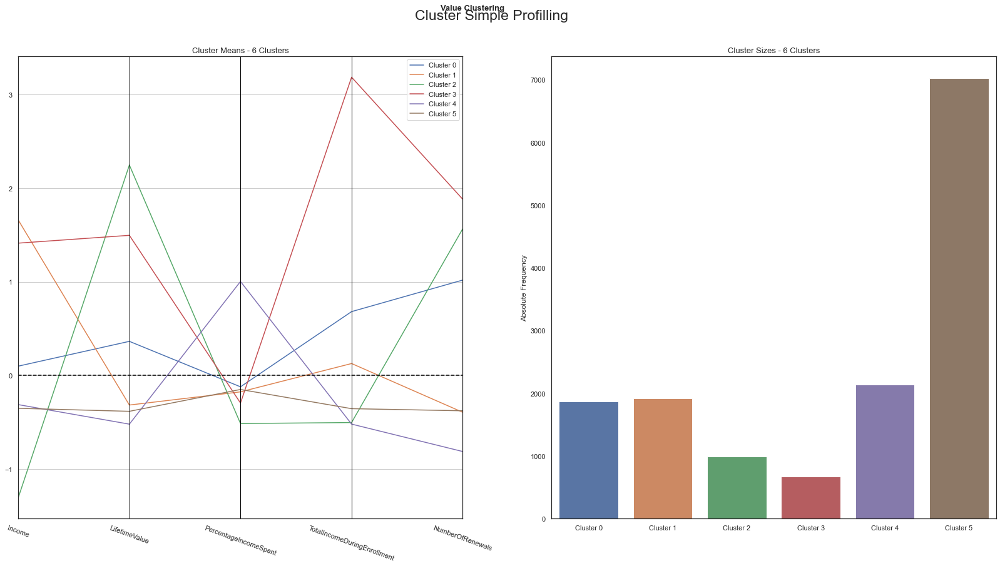

In [409]:
cluster_profiles(
    df = df_final[value + ["label"]], 
    label_columns = ['label'], 
    figsize = (28, 13), 
    compar_titles = ["Value Clustering"]
)

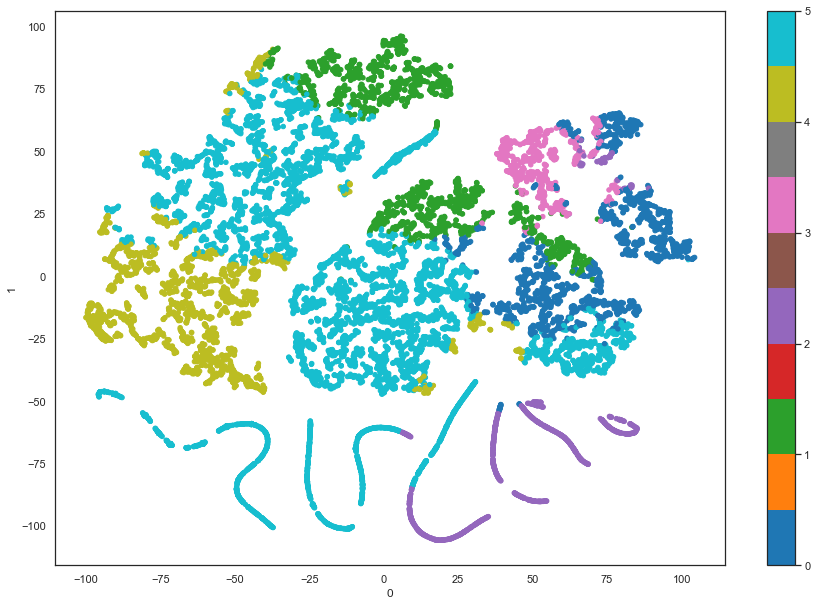

In [410]:
two_dim_kmeans_value = TSNE(random_state=42).fit_transform(
    df_final[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals']])

pd.DataFrame(two_dim_kmeans_value).plot.scatter(x=0, y=1, c=df_final['label'], colormap='tab10', figsize=(15,10))
plt.show()

### Time View

In [411]:
sm_time = sompy.SOMFactory().build(
    df_time.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays'] #the name of the list which contains the variables of this perspective
)

sm_time.train(n_job=-1, verbose='info',
         train_rough_len=2000,
         train_finetune_len=2000)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 2000

 epoch: 1 ---> elapsed time:  0.236000, quantization error: 2.392783

 epoch: 2 ---> elapsed time:  0.251000, quantization error: 1.761462

 epoch: 3 ---> elapsed time:  0.236000, quantization error: 1.741540

 epoch: 4 ---> elapsed time:  0.252000, quantization error: 1.733555

 epoch: 5 ---> elapsed time:  0.267000, quantization error: 1.723818

 epoch: 6 ---> elapsed time:  0.282000, quantization error: 1.718494

 epoch: 7 ---> elapsed time:  0.252000, quantization error: 1.716074

 epoch: 8 ---> elapsed time:  0.262000, quantization error: 1.715395

 epoch: 9 ---> elapsed time:  0.225000, quantization error: 1.715171

 epoch: 10 ---> elapsed time:  0.251000, quantization error: 1.715074

 epoch: 11 ---> elapsed time:  0.251000, quantization error: 1.715012

 epoch: 12 ---> elapsed time:  0.251000, quantization error: 1.714958

 epoch: 13 ---

 epoch: 115 ---> elapsed time:  0.263000, quantization error: 1.709923

 epoch: 116 ---> elapsed time:  0.260000, quantization error: 1.709871

 epoch: 117 ---> elapsed time:  0.262000, quantization error: 1.709819

 epoch: 118 ---> elapsed time:  0.251000, quantization error: 1.709767

 epoch: 119 ---> elapsed time:  0.266000, quantization error: 1.709715

 epoch: 120 ---> elapsed time:  0.299000, quantization error: 1.709663

 epoch: 121 ---> elapsed time:  0.298000, quantization error: 1.709610

 epoch: 122 ---> elapsed time:  0.315000, quantization error: 1.709558

 epoch: 123 ---> elapsed time:  0.315000, quantization error: 1.709505

 epoch: 124 ---> elapsed time:  0.282000, quantization error: 1.709453

 epoch: 125 ---> elapsed time:  0.283000, quantization error: 1.709400

 epoch: 126 ---> elapsed time:  0.267000, quantization error: 1.709348

 epoch: 127 ---> elapsed time:  0.251000, quantization error: 1.709294

 epoch: 128 ---> elapsed time:  0.268000, quantization error: 1.

 epoch: 229 ---> elapsed time:  0.283000, quantization error: 1.703551

 epoch: 230 ---> elapsed time:  0.282000, quantization error: 1.703491

 epoch: 231 ---> elapsed time:  0.298000, quantization error: 1.703431

 epoch: 232 ---> elapsed time:  0.282000, quantization error: 1.703371

 epoch: 233 ---> elapsed time:  0.376000, quantization error: 1.703311

 epoch: 234 ---> elapsed time:  0.267000, quantization error: 1.703250

 epoch: 235 ---> elapsed time:  0.283000, quantization error: 1.703190

 epoch: 236 ---> elapsed time:  0.298000, quantization error: 1.703129

 epoch: 237 ---> elapsed time:  0.283000, quantization error: 1.703069

 epoch: 238 ---> elapsed time:  0.314000, quantization error: 1.703008

 epoch: 239 ---> elapsed time:  0.283000, quantization error: 1.702948

 epoch: 240 ---> elapsed time:  0.313000, quantization error: 1.702887

 epoch: 241 ---> elapsed time:  0.283000, quantization error: 1.702826

 epoch: 242 ---> elapsed time:  0.314000, quantization error: 1.

 epoch: 343 ---> elapsed time:  0.338000, quantization error: 1.696176

 epoch: 344 ---> elapsed time:  0.323000, quantization error: 1.696107

 epoch: 345 ---> elapsed time:  0.330000, quantization error: 1.696037

 epoch: 346 ---> elapsed time:  0.314000, quantization error: 1.695967

 epoch: 347 ---> elapsed time:  0.299000, quantization error: 1.695897

 epoch: 348 ---> elapsed time:  0.298000, quantization error: 1.695827

 epoch: 349 ---> elapsed time:  0.347000, quantization error: 1.695757

 epoch: 350 ---> elapsed time:  0.299000, quantization error: 1.695686

 epoch: 351 ---> elapsed time:  0.330000, quantization error: 1.695616

 epoch: 352 ---> elapsed time:  0.314000, quantization error: 1.695545

 epoch: 353 ---> elapsed time:  0.329000, quantization error: 1.695475

 epoch: 354 ---> elapsed time:  0.355000, quantization error: 1.695404

 epoch: 355 ---> elapsed time:  0.362000, quantization error: 1.695333

 epoch: 356 ---> elapsed time:  0.377000, quantization error: 1.

 epoch: 457 ---> elapsed time:  0.393000, quantization error: 1.687591

 epoch: 458 ---> elapsed time:  0.416000, quantization error: 1.687510

 epoch: 459 ---> elapsed time:  0.383000, quantization error: 1.687428

 epoch: 460 ---> elapsed time:  0.393000, quantization error: 1.687344

 epoch: 461 ---> elapsed time:  0.408000, quantization error: 1.687262

 epoch: 462 ---> elapsed time:  0.409000, quantization error: 1.687178

 epoch: 463 ---> elapsed time:  0.408000, quantization error: 1.687091

 epoch: 464 ---> elapsed time:  0.377000, quantization error: 1.687006

 epoch: 465 ---> elapsed time:  0.407000, quantization error: 1.686923

 epoch: 466 ---> elapsed time:  0.392000, quantization error: 1.686839

 epoch: 467 ---> elapsed time:  0.378000, quantization error: 1.686755

 epoch: 468 ---> elapsed time:  0.401000, quantization error: 1.686670

 epoch: 469 ---> elapsed time:  0.367000, quantization error: 1.686584

 epoch: 470 ---> elapsed time:  0.392000, quantization error: 1.

 epoch: 571 ---> elapsed time:  0.377000, quantization error: 1.677428

 epoch: 572 ---> elapsed time:  0.362000, quantization error: 1.677331

 epoch: 573 ---> elapsed time:  0.370000, quantization error: 1.677235

 epoch: 574 ---> elapsed time:  0.345000, quantization error: 1.677137

 epoch: 575 ---> elapsed time:  0.377000, quantization error: 1.677041

 epoch: 576 ---> elapsed time:  0.361000, quantization error: 1.676944

 epoch: 577 ---> elapsed time:  0.331000, quantization error: 1.676847

 epoch: 578 ---> elapsed time:  0.360000, quantization error: 1.676749

 epoch: 579 ---> elapsed time:  0.330000, quantization error: 1.676652

 epoch: 580 ---> elapsed time:  0.345000, quantization error: 1.676554

 epoch: 581 ---> elapsed time:  0.349000, quantization error: 1.676456

 epoch: 582 ---> elapsed time:  0.358000, quantization error: 1.676359

 epoch: 583 ---> elapsed time:  0.329000, quantization error: 1.676261

 epoch: 584 ---> elapsed time:  0.330000, quantization error: 1.

 epoch: 685 ---> elapsed time:  0.283000, quantization error: 1.664783

 epoch: 686 ---> elapsed time:  0.298000, quantization error: 1.664665

 epoch: 687 ---> elapsed time:  0.313000, quantization error: 1.664545

 epoch: 688 ---> elapsed time:  0.427000, quantization error: 1.664427

 epoch: 689 ---> elapsed time:  0.405000, quantization error: 1.664307

 epoch: 690 ---> elapsed time:  0.300000, quantization error: 1.664188

 epoch: 691 ---> elapsed time:  0.294000, quantization error: 1.664068

 epoch: 692 ---> elapsed time:  0.334000, quantization error: 1.663948

 epoch: 693 ---> elapsed time:  0.376000, quantization error: 1.663829

 epoch: 694 ---> elapsed time:  0.414000, quantization error: 1.663710

 epoch: 695 ---> elapsed time:  0.330000, quantization error: 1.663589

 epoch: 696 ---> elapsed time:  0.305000, quantization error: 1.663469

 epoch: 697 ---> elapsed time:  0.302000, quantization error: 1.663349

 epoch: 698 ---> elapsed time:  0.318000, quantization error: 1.

 epoch: 799 ---> elapsed time:  0.305000, quantization error: 1.649902

 epoch: 800 ---> elapsed time:  0.316000, quantization error: 1.649759

 epoch: 801 ---> elapsed time:  0.346000, quantization error: 1.649613

 epoch: 802 ---> elapsed time:  0.299000, quantization error: 1.649469

 epoch: 803 ---> elapsed time:  0.298000, quantization error: 1.649324

 epoch: 804 ---> elapsed time:  0.315000, quantization error: 1.649179

 epoch: 805 ---> elapsed time:  0.315000, quantization error: 1.649034

 epoch: 806 ---> elapsed time:  0.298000, quantization error: 1.648889

 epoch: 807 ---> elapsed time:  0.329000, quantization error: 1.648743

 epoch: 808 ---> elapsed time:  0.440000, quantization error: 1.648598

 epoch: 809 ---> elapsed time:  0.442000, quantization error: 1.648452

 epoch: 810 ---> elapsed time:  0.330000, quantization error: 1.648304

 epoch: 811 ---> elapsed time:  0.362000, quantization error: 1.648157

 epoch: 812 ---> elapsed time:  0.347000, quantization error: 1.

 epoch: 913 ---> elapsed time:  0.378000, quantization error: 1.631800

 epoch: 914 ---> elapsed time:  0.424000, quantization error: 1.631624

 epoch: 915 ---> elapsed time:  0.361000, quantization error: 1.631448

 epoch: 916 ---> elapsed time:  0.409000, quantization error: 1.631271

 epoch: 917 ---> elapsed time:  0.393000, quantization error: 1.631094

 epoch: 918 ---> elapsed time:  0.393000, quantization error: 1.630918

 epoch: 919 ---> elapsed time:  0.395000, quantization error: 1.630741

 epoch: 920 ---> elapsed time:  0.390000, quantization error: 1.630564

 epoch: 921 ---> elapsed time:  0.394000, quantization error: 1.630386

 epoch: 922 ---> elapsed time:  0.418000, quantization error: 1.630206

 epoch: 923 ---> elapsed time:  0.399000, quantization error: 1.630027

 epoch: 924 ---> elapsed time:  0.403000, quantization error: 1.629848

 epoch: 925 ---> elapsed time:  0.367000, quantization error: 1.629667

 epoch: 926 ---> elapsed time:  0.362000, quantization error: 1.

 epoch: 1027 ---> elapsed time:  0.284000, quantization error: 1.609453

 epoch: 1028 ---> elapsed time:  0.283000, quantization error: 1.609235

 epoch: 1029 ---> elapsed time:  0.298000, quantization error: 1.609017

 epoch: 1030 ---> elapsed time:  0.298000, quantization error: 1.608798

 epoch: 1031 ---> elapsed time:  0.300000, quantization error: 1.608577

 epoch: 1032 ---> elapsed time:  0.283000, quantization error: 1.608358

 epoch: 1033 ---> elapsed time:  0.283000, quantization error: 1.608139

 epoch: 1034 ---> elapsed time:  0.282000, quantization error: 1.607917

 epoch: 1035 ---> elapsed time:  0.319000, quantization error: 1.607693

 epoch: 1036 ---> elapsed time:  0.263000, quantization error: 1.607473

 epoch: 1037 ---> elapsed time:  0.283000, quantization error: 1.607251

 epoch: 1038 ---> elapsed time:  0.299000, quantization error: 1.607028

 epoch: 1039 ---> elapsed time:  0.282000, quantization error: 1.606806

 epoch: 1040 ---> elapsed time:  0.283000, quantiza

 epoch: 1140 ---> elapsed time:  0.288000, quantization error: 1.581703

 epoch: 1141 ---> elapsed time:  0.277000, quantization error: 1.581429

 epoch: 1142 ---> elapsed time:  0.267000, quantization error: 1.581153

 epoch: 1143 ---> elapsed time:  0.314000, quantization error: 1.580878

 epoch: 1144 ---> elapsed time:  0.283000, quantization error: 1.580601

 epoch: 1145 ---> elapsed time:  0.267000, quantization error: 1.580324

 epoch: 1146 ---> elapsed time:  0.283000, quantization error: 1.580047

 epoch: 1147 ---> elapsed time:  0.298000, quantization error: 1.579769

 epoch: 1148 ---> elapsed time:  0.282000, quantization error: 1.579487

 epoch: 1149 ---> elapsed time:  0.263000, quantization error: 1.579207

 epoch: 1150 ---> elapsed time:  0.282000, quantization error: 1.578922

 epoch: 1151 ---> elapsed time:  0.298000, quantization error: 1.578642

 epoch: 1152 ---> elapsed time:  0.283000, quantization error: 1.578361

 epoch: 1153 ---> elapsed time:  0.277000, quantiza

 epoch: 1253 ---> elapsed time:  0.346000, quantization error: 1.546536

 epoch: 1254 ---> elapsed time:  0.314000, quantization error: 1.546188

 epoch: 1255 ---> elapsed time:  0.314000, quantization error: 1.545838

 epoch: 1256 ---> elapsed time:  0.314000, quantization error: 1.545486

 epoch: 1257 ---> elapsed time:  0.332000, quantization error: 1.545136

 epoch: 1258 ---> elapsed time:  0.329000, quantization error: 1.544782

 epoch: 1259 ---> elapsed time:  0.313000, quantization error: 1.544429

 epoch: 1260 ---> elapsed time:  0.314000, quantization error: 1.544075

 epoch: 1261 ---> elapsed time:  0.313000, quantization error: 1.543718

 epoch: 1262 ---> elapsed time:  0.330000, quantization error: 1.543362

 epoch: 1263 ---> elapsed time:  0.345000, quantization error: 1.543006

 epoch: 1264 ---> elapsed time:  0.361000, quantization error: 1.542650

 epoch: 1265 ---> elapsed time:  0.345000, quantization error: 1.542292

 epoch: 1266 ---> elapsed time:  0.307000, quantiza

 epoch: 1366 ---> elapsed time:  0.456000, quantization error: 1.501531

 epoch: 1367 ---> elapsed time:  0.424000, quantization error: 1.501078

 epoch: 1368 ---> elapsed time:  0.393000, quantization error: 1.500623

 epoch: 1369 ---> elapsed time:  0.409000, quantization error: 1.500169

 epoch: 1370 ---> elapsed time:  0.501000, quantization error: 1.499710

 epoch: 1371 ---> elapsed time:  0.473000, quantization error: 1.499247

 epoch: 1372 ---> elapsed time:  0.439000, quantization error: 1.498778

 epoch: 1373 ---> elapsed time:  0.502000, quantization error: 1.498314

 epoch: 1374 ---> elapsed time:  0.440000, quantization error: 1.497848

 epoch: 1375 ---> elapsed time:  0.455000, quantization error: 1.497384

 epoch: 1376 ---> elapsed time:  0.424000, quantization error: 1.496914

 epoch: 1377 ---> elapsed time:  0.508000, quantization error: 1.496445

 epoch: 1378 ---> elapsed time:  0.420000, quantization error: 1.495968

 epoch: 1379 ---> elapsed time:  0.425000, quantiza

 epoch: 1479 ---> elapsed time:  0.298000, quantization error: 1.442692

 epoch: 1480 ---> elapsed time:  0.283000, quantization error: 1.442102

 epoch: 1481 ---> elapsed time:  0.283000, quantization error: 1.441510

 epoch: 1482 ---> elapsed time:  0.267000, quantization error: 1.440916

 epoch: 1483 ---> elapsed time:  0.282000, quantization error: 1.440323

 epoch: 1484 ---> elapsed time:  0.283000, quantization error: 1.439728

 epoch: 1485 ---> elapsed time:  0.267000, quantization error: 1.439127

 epoch: 1486 ---> elapsed time:  0.283000, quantization error: 1.438517

 epoch: 1487 ---> elapsed time:  0.283000, quantization error: 1.437915

 epoch: 1488 ---> elapsed time:  0.282000, quantization error: 1.437314

 epoch: 1489 ---> elapsed time:  0.298000, quantization error: 1.436710

 epoch: 1490 ---> elapsed time:  0.361000, quantization error: 1.436106

 epoch: 1491 ---> elapsed time:  0.283000, quantization error: 1.435496

 epoch: 1492 ---> elapsed time:  0.283000, quantiza

 epoch: 1592 ---> elapsed time:  0.282000, quantization error: 1.366175

 epoch: 1593 ---> elapsed time:  0.298000, quantization error: 1.365410

 epoch: 1594 ---> elapsed time:  0.299000, quantization error: 1.364622

 epoch: 1595 ---> elapsed time:  0.298000, quantization error: 1.363839

 epoch: 1596 ---> elapsed time:  0.314000, quantization error: 1.363060

 epoch: 1597 ---> elapsed time:  0.283000, quantization error: 1.362285

 epoch: 1598 ---> elapsed time:  0.283000, quantization error: 1.361504

 epoch: 1599 ---> elapsed time:  0.283000, quantization error: 1.360724

 epoch: 1600 ---> elapsed time:  0.283000, quantization error: 1.359940

 epoch: 1601 ---> elapsed time:  0.329000, quantization error: 1.359156

 epoch: 1602 ---> elapsed time:  0.283000, quantization error: 1.358361

 epoch: 1603 ---> elapsed time:  0.299000, quantization error: 1.357572

 epoch: 1604 ---> elapsed time:  0.314000, quantization error: 1.356787

 epoch: 1605 ---> elapsed time:  0.283000, quantiza

 epoch: 1705 ---> elapsed time:  0.308000, quantization error: 1.266721

 epoch: 1706 ---> elapsed time:  0.332000, quantization error: 1.265725

 epoch: 1707 ---> elapsed time:  0.301000, quantization error: 1.264727

 epoch: 1708 ---> elapsed time:  0.324000, quantization error: 1.263727

 epoch: 1709 ---> elapsed time:  0.314000, quantization error: 1.262724

 epoch: 1710 ---> elapsed time:  0.314000, quantization error: 1.261724

 epoch: 1711 ---> elapsed time:  0.345000, quantization error: 1.260719

 epoch: 1712 ---> elapsed time:  0.314000, quantization error: 1.259712

 epoch: 1713 ---> elapsed time:  0.314000, quantization error: 1.258702

 epoch: 1714 ---> elapsed time:  0.346000, quantization error: 1.257692

 epoch: 1715 ---> elapsed time:  0.346000, quantization error: 1.256681

 epoch: 1716 ---> elapsed time:  0.330000, quantization error: 1.255668

 epoch: 1717 ---> elapsed time:  0.330000, quantization error: 1.254644

 epoch: 1718 ---> elapsed time:  0.346000, quantiza

 epoch: 1818 ---> elapsed time:  0.361000, quantization error: 1.138957

 epoch: 1819 ---> elapsed time:  0.377000, quantization error: 1.137664

 epoch: 1820 ---> elapsed time:  0.361000, quantization error: 1.136357

 epoch: 1821 ---> elapsed time:  0.361000, quantization error: 1.135089

 epoch: 1822 ---> elapsed time:  0.377000, quantization error: 1.133813

 epoch: 1823 ---> elapsed time:  0.362000, quantization error: 1.132536

 epoch: 1824 ---> elapsed time:  0.401000, quantization error: 1.131248

 epoch: 1825 ---> elapsed time:  0.353000, quantization error: 1.129948

 epoch: 1826 ---> elapsed time:  0.345000, quantization error: 1.128667

 epoch: 1827 ---> elapsed time:  0.326000, quantization error: 1.127384

 epoch: 1828 ---> elapsed time:  0.346000, quantization error: 1.126097

 epoch: 1829 ---> elapsed time:  0.361000, quantization error: 1.124813

 epoch: 1830 ---> elapsed time:  0.354000, quantization error: 1.123522

 epoch: 1831 ---> elapsed time:  0.368000, quantiza

 epoch: 1931 ---> elapsed time:  0.283000, quantization error: 0.972986

 epoch: 1932 ---> elapsed time:  0.283000, quantization error: 0.971293

 epoch: 1933 ---> elapsed time:  0.266000, quantization error: 0.969495

 epoch: 1934 ---> elapsed time:  0.287000, quantization error: 0.967278

 epoch: 1935 ---> elapsed time:  0.267000, quantization error: 0.964224

 epoch: 1936 ---> elapsed time:  0.283000, quantization error: 0.962166

 epoch: 1937 ---> elapsed time:  0.283000, quantization error: 0.960543

 epoch: 1938 ---> elapsed time:  0.266000, quantization error: 0.958933

 epoch: 1939 ---> elapsed time:  0.267000, quantization error: 0.957302

 epoch: 1940 ---> elapsed time:  0.267000, quantization error: 0.955659

 epoch: 1941 ---> elapsed time:  0.267000, quantization error: 0.954035

 epoch: 1942 ---> elapsed time:  0.298000, quantization error: 0.952396

 epoch: 1943 ---> elapsed time:  0.267000, quantization error: 0.950777

 epoch: 1944 ---> elapsed time:  0.267000, quantiza

 epoch: 44 ---> elapsed time:  0.283000, quantization error: 1.128896

 epoch: 45 ---> elapsed time:  0.298000, quantization error: 1.128597

 epoch: 46 ---> elapsed time:  0.299000, quantization error: 1.128291

 epoch: 47 ---> elapsed time:  0.299000, quantization error: 1.127986

 epoch: 48 ---> elapsed time:  0.283000, quantization error: 1.127681

 epoch: 49 ---> elapsed time:  0.298000, quantization error: 1.127376

 epoch: 50 ---> elapsed time:  0.282000, quantization error: 1.127071

 epoch: 51 ---> elapsed time:  0.311000, quantization error: 1.126767

 epoch: 52 ---> elapsed time:  0.285000, quantization error: 1.126459

 epoch: 53 ---> elapsed time:  0.283000, quantization error: 1.126154

 epoch: 54 ---> elapsed time:  0.298000, quantization error: 1.125853

 epoch: 55 ---> elapsed time:  0.283000, quantization error: 1.125548

 epoch: 56 ---> elapsed time:  0.298000, quantization error: 1.125235

 epoch: 57 ---> elapsed time:  0.298000, quantization error: 1.124932

 epoch

 epoch: 159 ---> elapsed time:  0.330000, quantization error: 1.092872

 epoch: 160 ---> elapsed time:  0.345000, quantization error: 1.092552

 epoch: 161 ---> elapsed time:  0.329000, quantization error: 1.092231

 epoch: 162 ---> elapsed time:  0.346000, quantization error: 1.091906

 epoch: 163 ---> elapsed time:  0.330000, quantization error: 1.091586

 epoch: 164 ---> elapsed time:  0.329000, quantization error: 1.091269

 epoch: 165 ---> elapsed time:  0.330000, quantization error: 1.090945

 epoch: 166 ---> elapsed time:  0.346000, quantization error: 1.090623

 epoch: 167 ---> elapsed time:  0.346000, quantization error: 1.090301

 epoch: 168 ---> elapsed time:  0.345000, quantization error: 1.089982

 epoch: 169 ---> elapsed time:  0.352000, quantization error: 1.089659

 epoch: 170 ---> elapsed time:  0.339000, quantization error: 1.089340

 epoch: 171 ---> elapsed time:  0.330000, quantization error: 1.089014

 epoch: 172 ---> elapsed time:  0.346000, quantization error: 1.

 epoch: 273 ---> elapsed time:  0.377000, quantization error: 1.055236

 epoch: 274 ---> elapsed time:  0.362000, quantization error: 1.054899

 epoch: 275 ---> elapsed time:  0.330000, quantization error: 1.054550

 epoch: 276 ---> elapsed time:  0.346000, quantization error: 1.054214

 epoch: 277 ---> elapsed time:  0.330000, quantization error: 1.053877

 epoch: 278 ---> elapsed time:  0.361000, quantization error: 1.053538

 epoch: 279 ---> elapsed time:  0.361000, quantization error: 1.053196

 epoch: 280 ---> elapsed time:  0.488000, quantization error: 1.052855

 epoch: 281 ---> elapsed time:  0.471000, quantization error: 1.052507

 epoch: 282 ---> elapsed time:  0.425000, quantization error: 1.052158

 epoch: 283 ---> elapsed time:  0.438000, quantization error: 1.051820

 epoch: 284 ---> elapsed time:  0.441000, quantization error: 1.051480

 epoch: 285 ---> elapsed time:  0.440000, quantization error: 1.051139

 epoch: 286 ---> elapsed time:  0.392000, quantization error: 1.

 epoch: 387 ---> elapsed time:  0.267000, quantization error: 1.015724

 epoch: 388 ---> elapsed time:  0.267000, quantization error: 1.015374

 epoch: 389 ---> elapsed time:  0.267000, quantization error: 1.015025

 epoch: 390 ---> elapsed time:  0.283000, quantization error: 1.014672

 epoch: 391 ---> elapsed time:  0.283000, quantization error: 1.014321

 epoch: 392 ---> elapsed time:  0.267000, quantization error: 1.013979

 epoch: 393 ---> elapsed time:  0.266000, quantization error: 1.013628

 epoch: 394 ---> elapsed time:  0.283000, quantization error: 1.013281

 epoch: 395 ---> elapsed time:  0.267000, quantization error: 1.012926

 epoch: 396 ---> elapsed time:  0.267000, quantization error: 1.012567

 epoch: 397 ---> elapsed time:  0.251000, quantization error: 1.012214

 epoch: 398 ---> elapsed time:  0.283000, quantization error: 1.011860

 epoch: 399 ---> elapsed time:  0.267000, quantization error: 1.011501

 epoch: 400 ---> elapsed time:  0.283000, quantization error: 1.

 epoch: 501 ---> elapsed time:  0.298000, quantization error: 0.974615

 epoch: 502 ---> elapsed time:  0.298000, quantization error: 0.974248

 epoch: 503 ---> elapsed time:  0.282000, quantization error: 0.973880

 epoch: 504 ---> elapsed time:  0.329000, quantization error: 0.973506

 epoch: 505 ---> elapsed time:  0.298000, quantization error: 0.973145

 epoch: 506 ---> elapsed time:  0.314000, quantization error: 0.972780

 epoch: 507 ---> elapsed time:  0.313000, quantization error: 0.972413

 epoch: 508 ---> elapsed time:  0.283000, quantization error: 0.972043

 epoch: 509 ---> elapsed time:  0.298000, quantization error: 0.971670

 epoch: 510 ---> elapsed time:  0.314000, quantization error: 0.971289

 epoch: 511 ---> elapsed time:  0.298000, quantization error: 0.970914

 epoch: 512 ---> elapsed time:  0.298000, quantization error: 0.970542

 epoch: 513 ---> elapsed time:  0.298000, quantization error: 0.970156

 epoch: 514 ---> elapsed time:  0.298000, quantization error: 0.

 epoch: 615 ---> elapsed time:  0.370000, quantization error: 0.932264

 epoch: 616 ---> elapsed time:  0.336000, quantization error: 0.931877

 epoch: 617 ---> elapsed time:  0.330000, quantization error: 0.931494

 epoch: 618 ---> elapsed time:  0.337000, quantization error: 0.931107

 epoch: 619 ---> elapsed time:  0.339000, quantization error: 0.930705

 epoch: 620 ---> elapsed time:  0.344000, quantization error: 0.930326

 epoch: 621 ---> elapsed time:  0.361000, quantization error: 0.929941

 epoch: 622 ---> elapsed time:  0.331000, quantization error: 0.929561

 epoch: 623 ---> elapsed time:  0.331000, quantization error: 0.929179

 epoch: 624 ---> elapsed time:  0.345000, quantization error: 0.928799

 epoch: 625 ---> elapsed time:  0.345000, quantization error: 0.928422

 epoch: 626 ---> elapsed time:  0.321000, quantization error: 0.928036

 epoch: 627 ---> elapsed time:  0.346000, quantization error: 0.927647

 epoch: 628 ---> elapsed time:  0.330000, quantization error: 0.

 epoch: 729 ---> elapsed time:  0.314000, quantization error: 0.888812

 epoch: 730 ---> elapsed time:  0.314000, quantization error: 0.888425

 epoch: 731 ---> elapsed time:  0.330000, quantization error: 0.888038

 epoch: 732 ---> elapsed time:  0.314000, quantization error: 0.887650

 epoch: 733 ---> elapsed time:  0.314000, quantization error: 0.887267

 epoch: 734 ---> elapsed time:  0.314000, quantization error: 0.886882

 epoch: 735 ---> elapsed time:  0.330000, quantization error: 0.886494

 epoch: 736 ---> elapsed time:  0.314000, quantization error: 0.886100

 epoch: 737 ---> elapsed time:  0.346000, quantization error: 0.885727

 epoch: 738 ---> elapsed time:  0.298000, quantization error: 0.885348

 epoch: 739 ---> elapsed time:  0.314000, quantization error: 0.884973

 epoch: 740 ---> elapsed time:  0.314000, quantization error: 0.884601

 epoch: 741 ---> elapsed time:  0.330000, quantization error: 0.884223

 epoch: 742 ---> elapsed time:  0.314000, quantization error: 0.

 epoch: 843 ---> elapsed time:  0.267000, quantization error: 0.844302

 epoch: 844 ---> elapsed time:  0.267000, quantization error: 0.843911

 epoch: 845 ---> elapsed time:  0.267000, quantization error: 0.843513

 epoch: 846 ---> elapsed time:  0.282000, quantization error: 0.843131

 epoch: 847 ---> elapsed time:  0.267000, quantization error: 0.842738

 epoch: 848 ---> elapsed time:  0.251000, quantization error: 0.842347

 epoch: 849 ---> elapsed time:  0.282000, quantization error: 0.841947

 epoch: 850 ---> elapsed time:  0.266000, quantization error: 0.841549

 epoch: 851 ---> elapsed time:  0.266000, quantization error: 0.841154

 epoch: 852 ---> elapsed time:  0.267000, quantization error: 0.840760

 epoch: 853 ---> elapsed time:  0.299000, quantization error: 0.840366

 epoch: 854 ---> elapsed time:  0.267000, quantization error: 0.839974

 epoch: 855 ---> elapsed time:  0.267000, quantization error: 0.839586

 epoch: 856 ---> elapsed time:  0.267000, quantization error: 0.

 epoch: 957 ---> elapsed time:  0.314000, quantization error: 0.797044

 epoch: 958 ---> elapsed time:  0.314000, quantization error: 0.796629

 epoch: 959 ---> elapsed time:  0.298000, quantization error: 0.796218

 epoch: 960 ---> elapsed time:  0.298000, quantization error: 0.795797

 epoch: 961 ---> elapsed time:  0.299000, quantization error: 0.795381

 epoch: 962 ---> elapsed time:  0.313000, quantization error: 0.794966

 epoch: 963 ---> elapsed time:  0.330000, quantization error: 0.794551

 epoch: 964 ---> elapsed time:  0.314000, quantization error: 0.794128

 epoch: 965 ---> elapsed time:  0.313000, quantization error: 0.793703

 epoch: 966 ---> elapsed time:  0.315000, quantization error: 0.793261

 epoch: 967 ---> elapsed time:  0.315000, quantization error: 0.792836

 epoch: 968 ---> elapsed time:  0.314000, quantization error: 0.792425

 epoch: 969 ---> elapsed time:  0.299000, quantization error: 0.792018

 epoch: 970 ---> elapsed time:  0.298000, quantization error: 0.

 epoch: 1070 ---> elapsed time:  0.394000, quantization error: 0.749093

 epoch: 1071 ---> elapsed time:  0.362000, quantization error: 0.748643

 epoch: 1072 ---> elapsed time:  0.346000, quantization error: 0.748225

 epoch: 1073 ---> elapsed time:  0.362000, quantization error: 0.747811

 epoch: 1074 ---> elapsed time:  0.345000, quantization error: 0.747389

 epoch: 1075 ---> elapsed time:  0.354000, quantization error: 0.746968

 epoch: 1076 ---> elapsed time:  0.337000, quantization error: 0.746508

 epoch: 1077 ---> elapsed time:  0.365000, quantization error: 0.746073

 epoch: 1078 ---> elapsed time:  0.357000, quantization error: 0.745642

 epoch: 1079 ---> elapsed time:  0.362000, quantization error: 0.745224

 epoch: 1080 ---> elapsed time:  0.377000, quantization error: 0.744805

 epoch: 1081 ---> elapsed time:  0.323000, quantization error: 0.744373

 epoch: 1082 ---> elapsed time:  0.345000, quantization error: 0.743953

 epoch: 1083 ---> elapsed time:  0.361000, quantiza

 epoch: 1183 ---> elapsed time:  0.314000, quantization error: 0.699573

 epoch: 1184 ---> elapsed time:  0.314000, quantization error: 0.699147

 epoch: 1185 ---> elapsed time:  0.330000, quantization error: 0.698706

 epoch: 1186 ---> elapsed time:  0.330000, quantization error: 0.698269

 epoch: 1187 ---> elapsed time:  0.298000, quantization error: 0.697751

 epoch: 1188 ---> elapsed time:  0.298000, quantization error: 0.697256

 epoch: 1189 ---> elapsed time:  0.314000, quantization error: 0.696812

 epoch: 1190 ---> elapsed time:  0.298000, quantization error: 0.696363

 epoch: 1191 ---> elapsed time:  0.314000, quantization error: 0.695910

 epoch: 1192 ---> elapsed time:  0.314000, quantization error: 0.695472

 epoch: 1193 ---> elapsed time:  0.298000, quantization error: 0.695018

 epoch: 1194 ---> elapsed time:  0.329000, quantization error: 0.694585

 epoch: 1195 ---> elapsed time:  0.298000, quantization error: 0.694147

 epoch: 1196 ---> elapsed time:  0.314000, quantiza

 epoch: 1296 ---> elapsed time:  0.267000, quantization error: 0.646903

 epoch: 1297 ---> elapsed time:  0.267000, quantization error: 0.646441

 epoch: 1298 ---> elapsed time:  0.267000, quantization error: 0.645963

 epoch: 1299 ---> elapsed time:  0.282000, quantization error: 0.645498

 epoch: 1300 ---> elapsed time:  0.276000, quantization error: 0.644999

 epoch: 1301 ---> elapsed time:  0.270000, quantization error: 0.644519

 epoch: 1302 ---> elapsed time:  0.265000, quantization error: 0.644040

 epoch: 1303 ---> elapsed time:  0.299000, quantization error: 0.643590

 epoch: 1304 ---> elapsed time:  0.283000, quantization error: 0.643136

 epoch: 1305 ---> elapsed time:  0.268000, quantization error: 0.642685

 epoch: 1306 ---> elapsed time:  0.294000, quantization error: 0.642237

 epoch: 1307 ---> elapsed time:  0.302000, quantization error: 0.641762

 epoch: 1308 ---> elapsed time:  0.267000, quantization error: 0.641294

 epoch: 1309 ---> elapsed time:  0.283000, quantiza

 epoch: 1409 ---> elapsed time:  0.314000, quantization error: 0.591951

 epoch: 1410 ---> elapsed time:  0.298000, quantization error: 0.591417

 epoch: 1411 ---> elapsed time:  0.298000, quantization error: 0.590890

 epoch: 1412 ---> elapsed time:  0.314000, quantization error: 0.590361

 epoch: 1413 ---> elapsed time:  0.283000, quantization error: 0.589865

 epoch: 1414 ---> elapsed time:  0.314000, quantization error: 0.589332

 epoch: 1415 ---> elapsed time:  0.298000, quantization error: 0.588786

 epoch: 1416 ---> elapsed time:  0.314000, quantization error: 0.588281

 epoch: 1417 ---> elapsed time:  0.314000, quantization error: 0.587769

 epoch: 1418 ---> elapsed time:  0.298000, quantization error: 0.587252

 epoch: 1419 ---> elapsed time:  0.335000, quantization error: 0.586761

 epoch: 1420 ---> elapsed time:  0.324000, quantization error: 0.586277

 epoch: 1421 ---> elapsed time:  0.283000, quantization error: 0.585764

 epoch: 1422 ---> elapsed time:  0.314000, quantiza

 epoch: 1522 ---> elapsed time:  0.392000, quantization error: 0.534251

 epoch: 1523 ---> elapsed time:  0.360000, quantization error: 0.533757

 epoch: 1524 ---> elapsed time:  0.361000, quantization error: 0.533259

 epoch: 1525 ---> elapsed time:  0.377000, quantization error: 0.532777

 epoch: 1526 ---> elapsed time:  0.377000, quantization error: 0.532291

 epoch: 1527 ---> elapsed time:  0.346000, quantization error: 0.531785

 epoch: 1528 ---> elapsed time:  0.346000, quantization error: 0.531262

 epoch: 1529 ---> elapsed time:  0.346000, quantization error: 0.530760

 epoch: 1530 ---> elapsed time:  0.361000, quantization error: 0.530289

 epoch: 1531 ---> elapsed time:  0.361000, quantization error: 0.529794

 epoch: 1532 ---> elapsed time:  0.377000, quantization error: 0.529297

 epoch: 1533 ---> elapsed time:  0.351000, quantization error: 0.528796

 epoch: 1534 ---> elapsed time:  0.386000, quantization error: 0.528300

 epoch: 1535 ---> elapsed time:  0.346000, quantiza

 epoch: 1635 ---> elapsed time:  0.295000, quantization error: 0.476372

 epoch: 1636 ---> elapsed time:  0.299000, quantization error: 0.475772

 epoch: 1637 ---> elapsed time:  0.314000, quantization error: 0.475200

 epoch: 1638 ---> elapsed time:  0.346000, quantization error: 0.474643

 epoch: 1639 ---> elapsed time:  0.314000, quantization error: 0.474127

 epoch: 1640 ---> elapsed time:  0.298000, quantization error: 0.473670

 epoch: 1641 ---> elapsed time:  0.299000, quantization error: 0.473196

 epoch: 1642 ---> elapsed time:  0.329000, quantization error: 0.472749

 epoch: 1643 ---> elapsed time:  0.314000, quantization error: 0.472193

 epoch: 1644 ---> elapsed time:  0.298000, quantization error: 0.471691

 epoch: 1645 ---> elapsed time:  0.299000, quantization error: 0.471139

 epoch: 1646 ---> elapsed time:  0.299000, quantization error: 0.470619

 epoch: 1647 ---> elapsed time:  0.338000, quantization error: 0.470098

 epoch: 1648 ---> elapsed time:  0.290000, quantiza

 epoch: 1748 ---> elapsed time:  0.268000, quantization error: 0.419212

 epoch: 1749 ---> elapsed time:  0.267000, quantization error: 0.418691

 epoch: 1750 ---> elapsed time:  0.283000, quantization error: 0.418199

 epoch: 1751 ---> elapsed time:  0.283000, quantization error: 0.417682

 epoch: 1752 ---> elapsed time:  0.267000, quantization error: 0.417153

 epoch: 1753 ---> elapsed time:  0.269000, quantization error: 0.416659

 epoch: 1754 ---> elapsed time:  0.265000, quantization error: 0.416136

 epoch: 1755 ---> elapsed time:  0.267000, quantization error: 0.415657

 epoch: 1756 ---> elapsed time:  0.269000, quantization error: 0.415167

 epoch: 1757 ---> elapsed time:  0.281000, quantization error: 0.414656

 epoch: 1758 ---> elapsed time:  0.267000, quantization error: 0.414190

 epoch: 1759 ---> elapsed time:  0.267000, quantization error: 0.413716

 epoch: 1760 ---> elapsed time:  0.266000, quantization error: 0.413223

 epoch: 1761 ---> elapsed time:  0.283000, quantiza

 epoch: 1861 ---> elapsed time:  0.323000, quantization error: 0.366184

 epoch: 1862 ---> elapsed time:  0.323000, quantization error: 0.365746

 epoch: 1863 ---> elapsed time:  0.345000, quantization error: 0.365286

 epoch: 1864 ---> elapsed time:  0.283000, quantization error: 0.364831

 epoch: 1865 ---> elapsed time:  0.283000, quantization error: 0.364324

 epoch: 1866 ---> elapsed time:  0.314000, quantization error: 0.363817

 epoch: 1867 ---> elapsed time:  0.314000, quantization error: 0.363304

 epoch: 1868 ---> elapsed time:  0.298000, quantization error: 0.362850

 epoch: 1869 ---> elapsed time:  0.314000, quantization error: 0.362352

 epoch: 1870 ---> elapsed time:  0.333000, quantization error: 0.361787

 epoch: 1871 ---> elapsed time:  0.326000, quantization error: 0.361223

 epoch: 1872 ---> elapsed time:  0.298000, quantization error: 0.360704

 epoch: 1873 ---> elapsed time:  0.345000, quantization error: 0.360209

 epoch: 1874 ---> elapsed time:  0.314000, quantiza

 epoch: 1974 ---> elapsed time:  0.346000, quantization error: 0.315076

 epoch: 1975 ---> elapsed time:  0.346000, quantization error: 0.314608

 epoch: 1976 ---> elapsed time:  0.346000, quantization error: 0.314165

 epoch: 1977 ---> elapsed time:  0.360000, quantization error: 0.313762

 epoch: 1978 ---> elapsed time:  0.345000, quantization error: 0.313336

 epoch: 1979 ---> elapsed time:  0.330000, quantization error: 0.312905

 epoch: 1980 ---> elapsed time:  0.361000, quantization error: 0.312497

 epoch: 1981 ---> elapsed time:  0.330000, quantization error: 0.312062

 epoch: 1982 ---> elapsed time:  0.380000, quantization error: 0.311586

 epoch: 1983 ---> elapsed time:  0.342000, quantization error: 0.311053

 epoch: 1984 ---> elapsed time:  0.361000, quantization error: 0.310391

 epoch: 1985 ---> elapsed time:  0.361000, quantization error: 0.309937

 epoch: 1986 ---> elapsed time:  0.346000, quantization error: 0.309443

 epoch: 1987 ---> elapsed time:  0.361000, quantiza

In [412]:
nodes_time = sm_time.codebook.matrix

In [413]:
df_time = data[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays']]

In [414]:
time = ['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses','RealNumberOfVisits','EnrolledDays']

In [415]:
sm_time_clusters=pd.DataFrame(nodes_time)
sm_time_clusters.rename(columns={0:'DaysWithoutFrequency',
                                  1:'NumberOfFrequencies',
                                  2:'AttendedClasses',
                                  3:'RealNumberOfVisits',
                                  4:'EnrolledDays'},inplace=True)

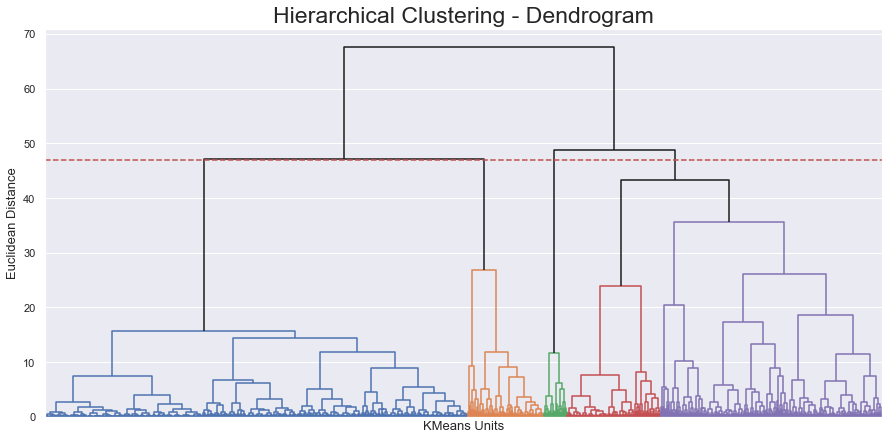

In [416]:
Z = linkage(sm_time_clusters, method="ward")

sns.set()
fig = plt.figure(figsize=(15,7))

# Dendrogram
set_link_color_palette(list(sns.color_palette().as_hex()))
dendrogram(Z, color_threshold=39, orientation='top', no_labels=True, above_threshold_color='k')

plt.hlines(47, 0, 1000000, colors="r", linestyles="dashed")
plt.title('Hierarchical Clustering - Dendrogram', fontsize=23)
plt.xlabel('KMeans Units', fontsize=13)
plt.ylabel('Euclidean Distance', fontsize=13)
plt.show()

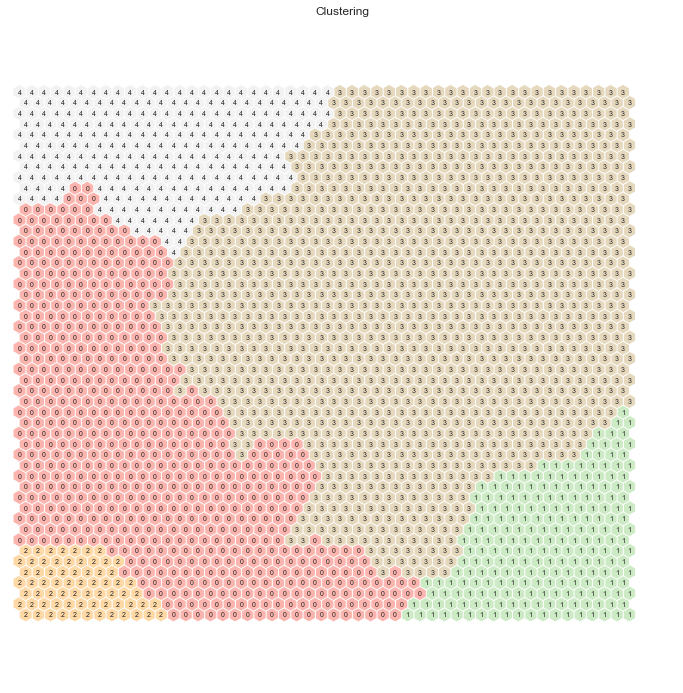

In [417]:
hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm_time.codebook.matrix)
sm_time.cluster_labels = nodeclus_labels

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm_time, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [418]:
nodes = sm_time.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=time)
df_nodes['label'] = nodeclus_labels

bmus_map = sm_time.find_bmu(df_time)[0]

df_bmus = pd.DataFrame(
    np.concatenate((data, np.expand_dims(bmus_map,1)), axis=1),
    index=data.index, columns=np.append(data.columns,"BMU")
)

df_final_hier = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)

In [419]:
df_final_hier[time + ['label']].groupby('label').mean()

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
label,,,,,
0,-0.315580,0.744159,0.310928,0.163182,0.939570
1,2.084027,-0.347852,-0.252777,-0.284382,0.296573
2,-0.305106,1.639510,4.146636,0.113111,2.199318
3,-0.145737,-0.428521,-0.293910,-0.441103,-0.514797
4,-0.421435,-0.042645,-0.299155,1.523541,-0.562894


In [420]:
sst = get_ss(df_final_hier[time])  # get total sum of squares
ssw_labels = df_final_hier[time + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.5249165823390497

In [421]:
df_final_hier=df_final_hier[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays','label']]

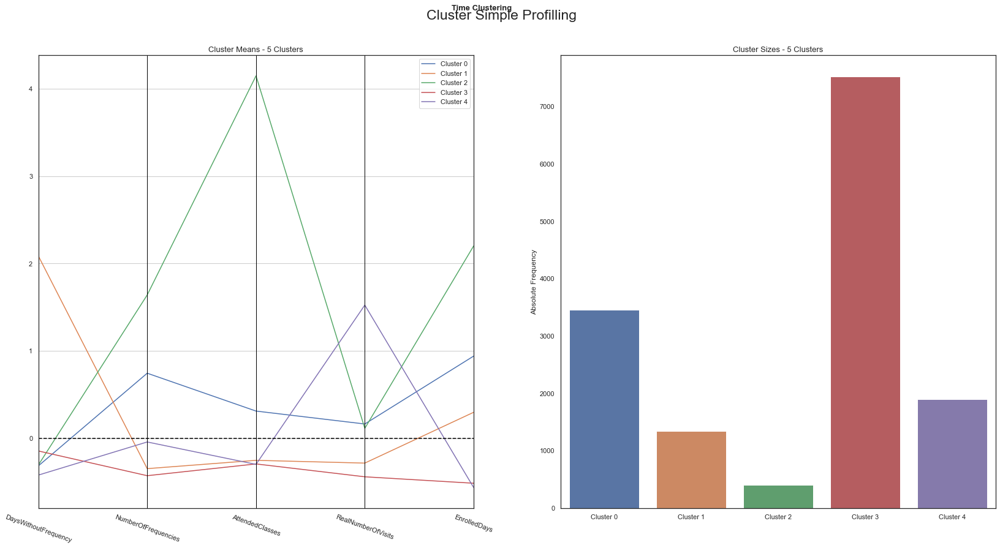

In [422]:
cluster_profiles(
    df =  df_final_hier, 
    label_columns = ['label'], 
    figsize = (28, 13), 
    compar_titles = ["Time Clustering"]
)

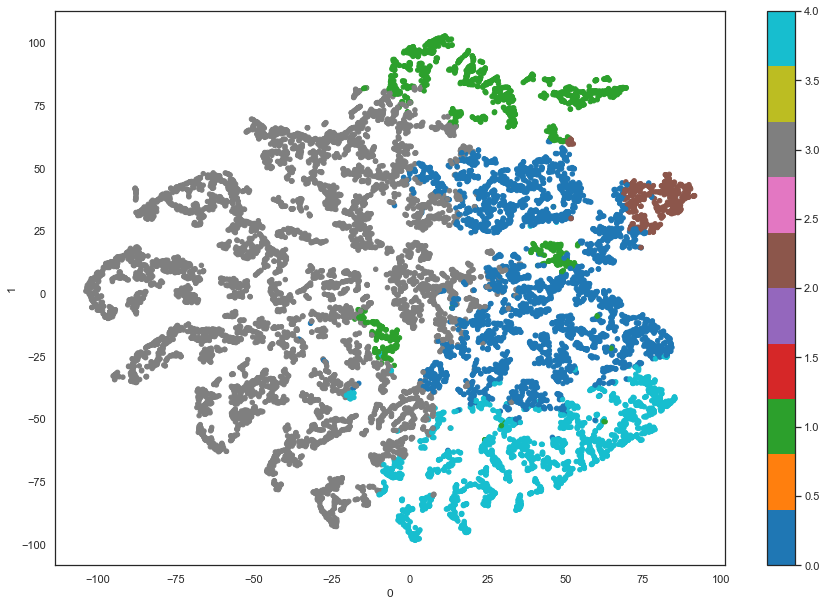

In [423]:
two_dim_hier_time = TSNE(random_state=42).fit_transform(
    df_final_hier[['DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays']])

pd.DataFrame(two_dim_hier_time).plot.scatter(x=0, y=1, c=df_final_hier['label'], colormap='tab10', figsize=(15,10))
plt.show()

<hr>
<a class = "anchor" id = "57th-bullet">

## 9.2. Joining Perspectives

</a>
</div>

[Return to Index](#index)

We will merge perspectives using Hierchical Clustering.

In [424]:
df_activities_concat

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities,ActivitiesLabels
0,0,1,0,0,-0.287942,0
1,0,0,1,0,-0.287942,2
2,0,1,0,0,-0.287942,0
3,0,0,1,0,-0.287942,2
4,0,1,0,0,-0.287942,0
...,...,...,...,...,...,...
14852,1,0,0,0,-0.287942,3
14853,0,0,0,1,-0.287942,2
14854,0,1,0,0,-0.287942,0
14855,1,0,0,0,-0.287942,3


In [425]:
df_final_somvalue=df_final.copy()
df_final_somvalue=df_final_somvalue[['Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 'NumberOfRenewals','label']]

In [426]:
df_final_somvalue

,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals,label
0,2.116632,-0.602168,0.350878,-0.502626,-0.872388,1
1,0.289571,0.526814,0.223479,0.121885,0.589661,0
2,-0.124224,-0.752033,0.513022,-0.579248,-0.872388,4
3,-1.384705,-0.410891,-0.587242,-0.622348,-0.872388,5
4,1.365436,0.219844,-0.384561,1.728548,1.320686,3
...,...,...,...,...,...,...
14852,-1.384705,3.368455,-0.587242,-0.622348,1.320686,2
14853,0.534775,0.134849,0.240851,-0.097284,-0.872388,5
14854,-0.232447,-0.734657,0.808356,-0.582948,-0.872388,4
14855,1.671007,1.422818,-0.112391,1.467338,0.589661,0


In [427]:
df_final_hier

,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays,label
0,-0.568414,-0.504470,-0.103881,-0.535453,-0.851715,3
1,-0.146806,-0.267724,-0.323868,-0.699854,-0.040321,3
2,-0.525539,-0.555201,-0.360532,0.122153,-0.918535,3
3,-0.418350,-0.318455,-0.287203,-0.371051,-0.608297,3
4,0.925078,0.036664,-0.360532,-0.864255,0.866532,3
...,...,...,...,...,...,...
14852,-0.561268,1.237305,3.159261,0.450956,1.744747,2
14853,-0.304016,0.307231,-0.360532,-0.371051,-0.367265,3
14854,-0.561268,-0.555201,-0.360532,0.450956,-0.918535,4
14855,-0.554122,2.471766,5.322467,0.286554,0.456062,2


In [428]:
data['Activity_labels']=df_activities_concat['ActivitiesLabels']
data['Value_labels']=df_final['label']
data['Time_labels']=df_final_hier['label']

In [429]:
variables_perspectives=["WaterActivities", "FitnessActivities", "OtherActivities", "CombatActivities", "TotalNumberActivities",'Income', 'LifetimeValue', 'PercentageIncomeSpent', 'TotalIncomeDuringEnrollment', 
'NumberOfRenewals','DaysWithoutFrequency', 'NumberOfFrequencies', 'AttendedClasses', 'RealNumberOfVisits', 'EnrolledDays']

In [430]:
# Centroids of the concatenated cluster labels
df_centroids = data.groupby(['Activity_labels', 'Value_labels', 'Time_labels'])\
    [variables_perspectives].mean()
df_centroids

WaterActivities  FitnessActivities  \
Activity_labels Value_labels Time_labels                                       
0               0            0                        0.0                1.0   
                             1                        0.0                1.0   
                             2                        0.0                1.0   
                             3                        0.0                1.0   
                             4                        0.0                1.0   
...                                                   ...                ...   
3               5            0                        1.0                0.0   
                             1                        1.0                0.0   
                             2                        1.0                0.0   
                             3                        1.0                0.0   
                             4                        1.0                0.0   

                                          OtherActivities  CombatActivities  \
Activity_labels Value_labels Time_labels                                      
0               0            0                        0.0               0.0   
                             1                        0.0               0.0   
                             2                        0.0               0.0   
                             3                        0.0               0.0   
                             4                        0.0               0.0   
...                                                   ...               ...   
3               5            0                        0.0               0.0   
                             1                        0.0               0.0   
                             2                        0.0               0.0   
                             3                        0.0               0.0   
                             4                        0.0               0.0   

                                          TotalNumberActivities    Income  \
Activity_labels Value_labels Time_labels                                    
0               0            0                        -0.287942  0.036386   
                             1                        -0.287942  0.086249   
                             2                        -0.287942  0.472595   
                             3                        -0.287942  0.314745   
                             4                        -0.287942  0.317840   
...                                                         ...       ...   
3               5            0                        -0.287942 -1.002226   
                             1                        -0.287942 -0.659436   
                             2                        -0.287942 -0.776746   
                             3                        -0.287942 -0.812289   
                             4                        -0.287942 -0.617851   

                                          LifetimeValue  \
Activity_labels Value_labels Time_labels                  
0               0            0                 0.272518   
                             1                -0.163518   
                             2                 1.199143   
                             3                -0.124994   
                             4                 0.250776   
...                                                 ...   
3               5            0                 0.330887   
                             1                -0.266925   
                             2                 0.768191   
                             3                -0.284551   
                             4                -0.369368   

                                          PercentageIncomeSpent  \
Activity_labels Value_labels Time_labels                          
0               0            0                        -0.192724   
  

In [431]:
linkage = 'ward'
hclust = AgglomerativeClustering(
    linkage=linkage, 
    metric='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

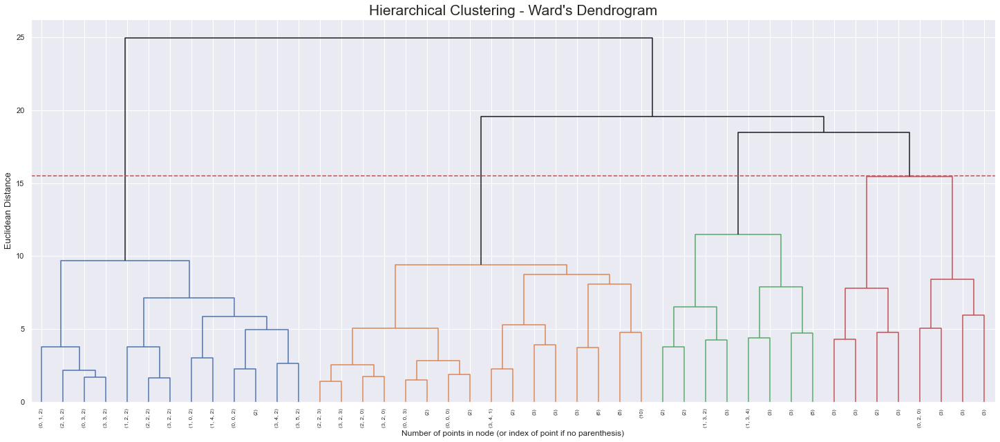

In [432]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(25,10))
# The Dendrogram parameters need to be tuned
y_threshold = 15.5
dendrogram(linkage_matrix, 
           truncate_mode='level', 
           labels=df_centroids.index, p=5, 
           color_threshold=y_threshold, 
           above_threshold_color='k')

plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [433]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    metric='euclidean', 
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

WaterActivities  FitnessActivities  \
Activity_labels Value_labels Time_labels                                       
0               0            0                        0.0                1.0   
                             1                        0.0                1.0   
                             2                        0.0                1.0   
                             3                        0.0                1.0   
                             4                        0.0                1.0   
...                                                   ...                ...   
3               5            0                        1.0                0.0   
                             1                        1.0                0.0   
                             2                        1.0                0.0   
                             3                        1.0                0.0   
                             4                        1.0                0.0   

                                          OtherActivities  CombatActivities  \
Activity_labels Value_labels Time_labels                                      
0               0            0                        0.0               0.0   
                             1                        0.0               0.0   
                             2                        0.0               0.0   
                             3                        0.0               0.0   
                             4                        0.0               0.0   
...                                                   ...               ...   
3               5            0                        0.0               0.0   
                             1                        0.0               0.0   
                             2                        0.0               0.0   
                             3                        0.0               0.0   
                             4                        0.0               0.0   

                                          TotalNumberActivities    Income  \
Activity_labels Value_labels Time_labels                                    
0               0            0                        -0.287942  0.036386   
                             1                        -0.287942  0.086249   
                             2                        -0.287942  0.472595   
                             3                        -0.287942  0.314745   
                             4                        -0.287942  0.317840   
...                                                         ...       ...   
3               5            0                        -0.287942 -1.002226   
                             1                        -0.287942 -0.659436   
                             2                        -0.287942 -0.776746   
                             3                        -0.287942 -0.812289   
                             4                        -0.287942 -0.617851   

                                          LifetimeValue  \
Activity_labels Value_labels Time_labels                  
0               0            0                 0.272518   
                             1                -0.163518   
                             2                 1.199143   
                             3                -0.124994   
                             4                 0.250776   
...                                                 ...   
3               5            0                 0.330887   
                             1                -0.266925   
                             2                 0.768191   
                             3                -0.284551   
                             4                -0.369368   

                                          PercentageIncomeSpent  \
Activity_labels Value_labels Time_labels                          
0               0            0                        -0.192724   
  

In [434]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = data.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['Activity_labels'], row['Value_labels'],row['Time_labels'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[variables_perspectives]

,WaterActivities,FitnessActivities,OtherActivities,CombatActivities,TotalNumberActivities,Income,LifetimeValue,PercentageIncomeSpent,TotalIncomeDuringEnrollment,NumberOfRenewals,DaysWithoutFrequency,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,EnrolledDays
merged_labels,,,,,,,,,,,,,,,
0,0.230950,0.582649,0.111372,0.075029,-0.287942,0.764610,0.909524,-0.287760,2.027365,1.604354,1.291219,1.049297,-0.135774,0.390052,1.625609
1,0.514693,0.788068,0.335708,0.378451,2.916230,0.188102,0.353721,-0.005381,0.498425,0.502433,-0.111312,0.282711,-0.078904,-0.043273,0.514739
2,0.252839,0.576832,0.084225,0.086104,-0.287942,-0.053442,-0.234385,0.019500,-0.228709,-0.256681,-0.095143,-0.196680,-0.149222,-0.042839,-0.265777
3,0.883544,0.070886,0.086076,0.020253,-0.093293,-0.777869,3.032406,-0.396524,0.163061,1.985086,-0.305771,1.642290,4.163590,0.122985,2.197140


In [435]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['Activity_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['Value_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts['Time_labels'] = df_counts['merged_labels'].apply(lambda x: x[2])


df_counts.pivot(values=0, index='Activity_labels', columns=['Value_labels','Time_labels'])

Value_labels         3        5       
Time_labels          4        4      2
Activity_labels                       
1                  NaN   1123.0    NaN
3                853.0  12241.0  395.0

In [436]:
data = df_.copy()

<hr>
<a class = "anchor" id = "58th-bullet">

## 9.3. Cluster Analysis

</a>
</div>

[Return to Index](#index)

In [437]:
data

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,CombatActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,Activity_labels,Value_labels,Time_labels,merged_labels
0,0,2.116632,-0.568414,-0.602168,0,0,1,0,0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0,0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,0,1,3,2
1,0,0.289571,-0.146806,0.526814,0,0,0,0,1,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0,1,-0.040321,-0.287942,0.121885,0.223479,0.330306,2,0,3,2
2,1,-0.124224,-0.525539,-0.752033,0,0,1,0,0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0,1,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,0,4,3,2
3,1,-1.384705,-0.418350,-0.410891,0,0,0,0,1,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0,1,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,2,5,3,2
4,1,1.365436,0.925078,0.219844,0,0,1,0,0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0,1,0.866532,-0.287942,1.728548,-0.384561,-0.843000,0,3,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1,-1.384705,-0.561268,3.368455,0,1,0,0,0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0,0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,3,2,2,3
14853,1,0.534775,-0.304016,0.134849,0,0,0,1,0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0,1,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2,5,3,2
14854,1,-0.232447,-0.561268,-0.734657,0,0,1,0,0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0,1,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,0,4,4,2
14855,1,1.671007,-0.554122,1.422818,0,1,0,0,0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0,0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,3,0,2,3


In [438]:
metric_features = ['Income','DaysWithoutFrequency','LifetimeValue','NumberOfFrequencies','AttendedClasses','AllowedWeeklyVisitsBySLA',
                   'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals','EnrolledDays','TotalIncomeDuringEnrollment',
                   'PercentageIncomeSpent','TotalNumberActivities']

categorical_features = ['Gender', 'UseByTime', 'WaterActivities', 'FitnessActivities', 'OtherActivities', 'CombatActivities', 'HasReferences',
                        'Dropout','Starting_Month']

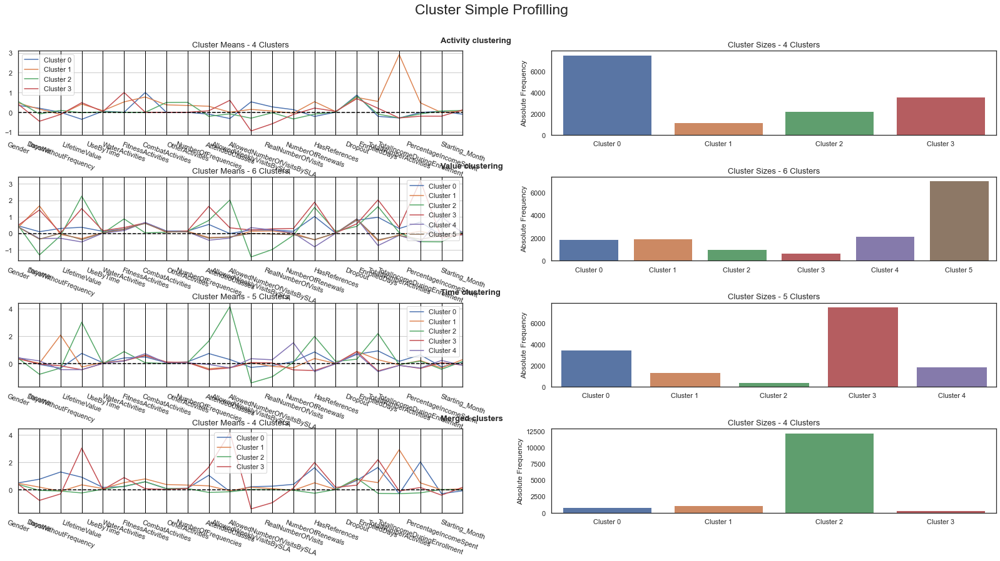

In [439]:
# Profilling each cluster
cluster_profiles(
    df = data, 
    label_columns = ['Activity_labels', 'Value_labels', 'Time_labels', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Activity clustering", "Value clustering", "Time clustering", "Merged clusters"]
)

In [440]:
data[['merged_labels']].groupby(['merged_labels']).value_counts()

merged_labels
0      853
1     1123
2    12241
3      395
Name: count, dtype: int64

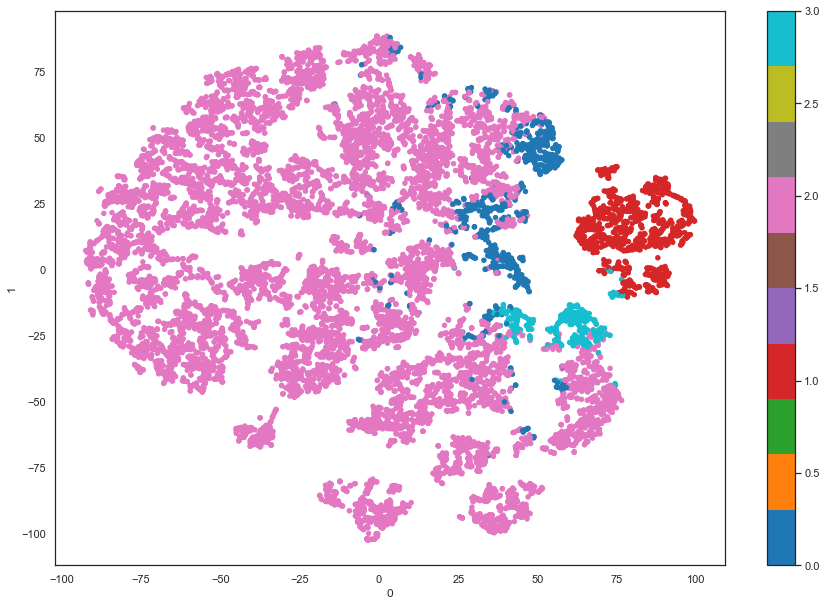

In [441]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(data[metric_features])
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=data['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

### Assessing Feature Importance

In [442]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [443]:
data

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,CombatActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,Activity_labels,Value_labels,Time_labels,merged_labels
0,0,2.116632,-0.568414,-0.602168,0,0,1,0,0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0,0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,0,1,3,2
1,0,0.289571,-0.146806,0.526814,0,0,0,0,1,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0,1,-0.040321,-0.287942,0.121885,0.223479,0.330306,2,0,3,2
2,1,-0.124224,-0.525539,-0.752033,0,0,1,0,0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0,1,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,0,4,3,2
3,1,-1.384705,-0.418350,-0.410891,0,0,0,0,1,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0,1,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,2,5,3,2
4,1,1.365436,0.925078,0.219844,0,0,1,0,0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0,1,0.866532,-0.287942,1.728548,-0.384561,-0.843000,0,3,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1,-1.384705,-0.561268,3.368455,0,1,0,0,0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0,0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,3,2,2,3
14853,1,0.534775,-0.304016,0.134849,0,0,0,1,0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0,1,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2,5,3,2
14854,1,-0.232447,-0.561268,-0.734657,0,0,1,0,0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0,1,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,0,4,4,2
14855,1,1.671007,-0.554122,1.422818,0,1,0,0,0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0,0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,3,0,2,3


In [444]:
r2_variables(data.drop(columns = {'Activity_labels', 'Value_labels', 'Time_labels'}) , 'merged_labels').drop('merged_labels', )

Gender                         0.004292
Income                         0.056754
DaysWithoutFrequency           0.129044
LifetimeValue                  0.394882
UseByTime                      0.025017
WaterActivities                0.071883
FitnessActivities              0.042450
CombatActivities               0.066308
OtherActivities                0.047430
NumberOfFrequencies            0.221095
AttendedClasses                0.590406
AllowedWeeklyVisitsBySLA       0.058726
AllowedNumberOfVisitsBySLA     0.029546
RealNumberOfVisits             0.011613
NumberOfRenewals               0.350742
HasReferences                  0.033525
Dropout                        0.051449
EnrolledDays                   0.390115
TotalNumberActivities          0.942540
TotalIncomeDuringEnrollment    0.355357
PercentageIncomeSpent          0.027811
Starting_Month                 0.001626
dtype: float64

<div class="alert alert-block alert-success">

<a class="anchor" id="59th-bullet">    </a>
# 10. Reclassification of Outliers
    

    
</div>

[Return to Index](#index)

In [445]:
outliers.head()

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,BirthYear,YearOfEnrollment
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10262,19.0,Female,1160.0,2015-09-09,2019-09-10,2019-07-01,2019-12-31,2019-07-31,41.0,1526.82,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,590.0,581.0,3.0,26.58,4.0,4.0,1.0,1.0,1,2000,2015
10440,46.0,Female,3720.0,2015-10-19,2015-10-19,2019-07-01,2019-12-31,2019-10-30,1.0,1672.40,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,655.0,0.0,7.0,52.01,29.0,4.0,0.0,0.0,0,1973,2015
10672,60.0,Female,5170.0,2015-05-05,2015-05-05,2019-07-01,2019-12-31,2019-10-31,0.0,1529.55,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,322.0,318.0,2.0,8.58,11.0,5.0,0.0,0.0,0,1959,2015
10680,47.0,Male,3140.0,2014-10-04,2014-10-04,2019-07-01,2019-12-31,2019-10-31,0.0,3137.35,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,954.0,11.0,7.0,60.97,43.0,5.0,0.0,0.0,0,1972,2014
12328,36.0,Female,2770.0,2015-03-05,2015-09-16,2015-01-01,2016-06-30,2015-06-27,81.0,178.60,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,7.0,240.03,4.0,1.0,0.0,0.0,1,1979,2015


In order to make predictions that will allow us to reclassify our outliers, we need the columns in their dataframe to be the same and have the same treatment as the one we are using to train our data on. As we can see in the output above, this is not the case yet. Therefore, the following cell will simply apply the same engineering steps previously done for our main dataframe.

In [446]:
# Data Types
categorical_features = ['Gender', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'OtherActivities', 'SpecialActivities',
                        'NatureActivities', 'CombatActivities', 'RacketActivities', 'TeamActivities', 'DanceActivities', 'HasReferences', 'Dropout']

outliers['Age'] = round(outliers['Age']).astype('int8')
outliers['Gender'] = outliers['Gender'].apply(lambda x: 1 if x == 'Male' else 0)
outliers[categorical_features] = outliers[categorical_features].astype('int8')
outliers[['DaysWithoutFrequency','AttendedClasses','RealNumberOfVisits','NumberOfRenewals','NumberOfReferences']] = outliers[['DaysWithoutFrequency','AttendedClasses','RealNumberOfVisits','NumberOfRenewals','NumberOfReferences']].round().astype('int32')
outliers[['Income','LifetimeValue','NumberOfFrequencies','AllowedWeeklyVisitsBySLA','AllowedNumberOfVisitsBySLA']] = outliers[['Income','LifetimeValue','NumberOfFrequencies','AllowedWeeklyVisitsBySLA','AllowedNumberOfVisitsBySLA']].astype('float32')

# Dates Coherence Checking
outliers.drop(columns=['LastPeriodFinish','LastPeriodStart'],axis=1, inplace=True)

date_columns = ['EnrollmentStart', 'EnrollmentFinish', 'DateLastVisit']
outliers['StartDate'] = outliers[date_columns].min(axis=1)
outliers['FinishDate'] = outliers[date_columns].max(axis=1)
outliers['EnrolledDays'] = (outliers['FinishDate'] - outliers['StartDate']).dt.days

# Feature Enginerring
outliers['TotalNumberActivities'] = outliers[['OtherActivities','SpecialActivities','CombatActivities','RacketActivities','TeamActivities',
                                              'FitnessActivities','WaterActivities','AthleticsActivities']].sum(axis=1)
outliers["MonthsEnrolled"] = ((outliers['FinishDate'] - outliers['StartDate']) / pd.Timedelta(days=30)).astype(int)
outliers["TotalIncomeDuringEnrollment"] = outliers["Income"] * outliers["MonthsEnrolled"]
outliers["PercentageIncomeSpent"] = np.round((outliers["LifetimeValue"] / outliers["TotalIncomeDuringEnrollment"]) * 100, 2)
outliers["PercentageIncomeSpent"].replace(np.inf, 0, inplace = True)
outliers["PercentageIncomeSpent"].replace(np.nan, 0, inplace = True)
outliers['Starting_Month'] = outliers['StartDate'].dt.month

# Feature Selection
outliers.drop(columns = {'EnrollmentStart', 'EnrollmentFinish', 'DateLastVisit', 'NatureActivities', 'DanceActivities', 'MonthsEnrolled',
                         'YearOfEnrollment', 'BirthYear', 'StartDate', 'FinishDate', 'Age', 'NumberOfReferences'}, inplace = True)

# Scaling
outliers.reset_index(inplace = True)
outliers.drop(columns = "ID", inplace = True)

metric_features = ['Income','DaysWithoutFrequency','LifetimeValue','NumberOfFrequencies','AttendedClasses','AllowedWeeklyVisitsBySLA',
                   'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals','EnrolledDays','TotalIncomeDuringEnrollment',
                   'PercentageIncomeSpent','Starting_Month','TotalNumberActivities']
outliers_metric = outliers[metric_features]
outliers_metric_scaled = pd.DataFrame(scaler.transform(outliers_metric),columns = outliers_metric.columns)
outliers[outliers_metric_scaled.columns] = outliers_metric_scaled

In [447]:
outliers.head()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month
0,0,-0.646241,-0.282578,3.560658,0,0,1,0,0,0,0,0,0,9.320491,20.941547,-1.298241,-0.743305,-0.206650,2.051711,1,1,2.498866,-0.287942,0.589670,0.999454,0.623632
1,0,0.983472,-0.568414,3.982249,0,0,0,1,0,0,0,0,0,10.419669,-0.360532,0.586864,0.537560,3.903385,2.051711,0,0,2.522730,-0.287942,3.345442,-0.054482,0.916958
2,0,1.906552,-0.575560,3.568564,0,0,1,0,0,0,0,0,0,4.788495,11.298781,-1.769518,-1.649934,0.944160,2.782735,0,0,2.923655,-0.287942,5.454718,-0.268744,-0.549673
3,1,0.614240,-0.575560,8.224656,0,0,1,0,0,0,0,1,0,15.475887,0.042777,0.586864,0.988860,6.205005,2.782735,0,0,3.431969,2.787515,3.547010,0.362459,0.916958
4,0,0.378696,0.003258,-0.343705,0,0,1,0,0,0,0,0,0,-0.470649,-0.360532,0.586864,10.007801,-0.206650,-0.141363,0,1,-0.524771,-0.287942,-0.260571,0.032380,-1.136326


In [448]:
outliers.shape

(84, 26)

Now that we properly transformed our initially removed outliers, let's now merge them with the outliers removed through the use of DBSCAN, so that we end up with one single final outliers dataframe.

In [449]:
outliers_final = pd.concat([outliers, outliers_dbscan], ignore_index = True)
outliers_final.reset_index(drop = True, inplace = True)
outliers_final.shape

(329, 26)

Moreover, we also need to transform the activities' features, just like we did in the original dataframe before merging perspectives.

In [450]:
outliers_final['OtherActivities'] = outliers_final[['AthleticsActivities', 'OtherActivities', 'SpecialActivities', 'RacketActivities', 'TeamActivities']].any(axis = 1).astype('int8')
outliers_final.drop(columns = {'AthleticsActivities', 'SpecialActivities', 'RacketActivities', 'TeamActivities'}, inplace = True)
outliers_final.shape

(329, 22)

<hr>
<a class = "anchor" id = "60th-bullet">

## 10.1. Decision Tree

</a>
</div>

[Return to Index](#index)

In [451]:
data

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,CombatActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,Activity_labels,Value_labels,Time_labels,merged_labels
0,0,2.116632,-0.568414,-0.602168,0,0,1,0,0,-0.504470,-0.103881,-1.769518,-1.765781,-0.535453,-0.872388,0,0,-0.851715,-0.287942,-0.502626,0.350878,0.623632,0,1,3,2
1,0,0.289571,-0.146806,0.526814,0,0,0,0,1,-0.267724,-0.323868,-1.769518,-1.204678,-0.699854,0.589661,0,1,-0.040321,-0.287942,0.121885,0.223479,0.330306,2,0,3,2
2,1,-0.124224,-0.525539,-0.752033,0,0,1,0,0,-0.555201,-0.360532,0.586864,-0.569535,0.122153,-0.872388,0,1,-0.918535,-0.287942,-0.579248,0.513022,-0.549673,0,4,3,2
3,1,-1.384705,-0.418350,-0.410891,0,0,0,0,1,-0.318455,-0.287203,-1.769518,-1.189568,-0.371051,-0.872388,0,1,-0.608297,-0.287942,-0.622348,-0.587242,0.623632,2,5,3,2
4,1,1.365436,0.925078,0.219844,0,0,1,0,0,0.036664,-0.360532,0.586864,0.988860,-0.864255,1.320686,0,1,0.866532,-0.287942,1.728548,-0.384561,-0.843000,0,3,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14852,1,-1.384705,-0.561268,3.368455,0,1,0,0,0,1.237305,3.159261,-0.826965,-0.327263,0.450956,1.320686,0,0,1.744747,-0.287942,-0.622348,-0.587242,0.623632,3,2,2,3
14853,1,0.534775,-0.304016,0.134849,0,0,0,1,0,0.307231,-0.360532,0.586864,0.988860,-0.371051,-0.872388,0,1,-0.367265,-0.287942,-0.097284,0.240851,0.623632,2,5,3,2
14854,1,-0.232447,-0.561268,-0.734657,0,0,1,0,0,-0.555201,-0.360532,0.586864,-0.569535,0.450956,-0.872388,0,1,-0.918535,-0.287942,-0.582948,0.808356,-1.136326,0,4,4,2
14855,1,1.671007,-0.554122,1.422818,0,1,0,0,0,2.471766,5.322467,-1.298241,-1.282749,0.286554,0.589661,0,0,0.456062,-0.287942,1.467338,-0.112391,-1.136326,3,0,2,3


In [452]:
X = data.drop(columns=['Activity_labels','Value_labels', 'Time_labels','merged_labels'])
y = data.merged_labels

In [453]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [454]:
# Fitting the decision tree
dtc = DecisionTreeClassifier(random_state = 42, max_depth = 3)
dtc.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dtc.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 93.19% of the customers correctly


In [455]:
# Assessing feature importance (this is just to visualize what features the model is considering more valuable to predict the labels)
pd.Series(dtc.feature_importances_, index = X_train.columns)

Gender                         0.000000
Income                         0.000000
DaysWithoutFrequency           0.000000
LifetimeValue                  0.000000
UseByTime                      0.000000
WaterActivities                0.000000
FitnessActivities              0.000000
CombatActivities               0.000000
OtherActivities                0.000000
NumberOfFrequencies            0.000000
AttendedClasses                0.124221
AllowedWeeklyVisitsBySLA       0.000000
AllowedNumberOfVisitsBySLA     0.000000
RealNumberOfVisits             0.000000
NumberOfRenewals               0.000000
HasReferences                  0.000000
Dropout                        0.000000
EnrolledDays                   0.227053
TotalNumberActivities          0.618528
TotalIncomeDuringEnrollment    0.030199
PercentageIncomeSpent          0.000000
Starting_Month                 0.000000
dtype: float64

In [456]:
# Predicting the cluster labels of the outliers
outliers_final['merged_labels'] = dtc.predict(outliers_final)
outliers_final.head()

,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,CombatActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,Dropout,EnrolledDays,TotalNumberActivities,TotalIncomeDuringEnrollment,PercentageIncomeSpent,Starting_Month,merged_labels
0,0,-0.646241,-0.282578,3.560658,0,1,0,0,0,9.320491,20.941547,-1.298241,-0.743305,-0.206650,2.051711,1,1,2.498866,-0.287942,0.589670,0.999454,0.623632,3
1,0,0.983472,-0.568414,3.982249,0,0,1,0,0,10.419669,-0.360532,0.586864,0.537560,3.903385,2.051711,0,0,2.522730,-0.287942,3.345442,-0.054482,0.916958,2
2,0,1.906552,-0.575560,3.568564,0,1,0,0,0,4.788495,11.298781,-1.769518,-1.649934,0.944160,2.782735,0,0,2.923655,-0.287942,5.454718,-0.268744,-0.549673,3
3,1,0.614240,-0.575560,8.224656,0,1,0,0,1,15.475887,0.042777,0.586864,0.988860,6.205005,2.782735,0,0,3.431969,2.787515,3.547010,0.362459,0.916958,1
4,0,0.378696,0.003258,-0.343705,0,1,0,0,0,-0.470649,-0.360532,0.586864,10.007801,-0.206650,-0.141363,0,1,-0.524771,-0.287942,-0.260571,0.032380,-1.136326,2


In [457]:
outliers_final['merged_labels'].value_counts()

merged_labels
1    143
2    125
3     59
0      2
Name: count, dtype: int64

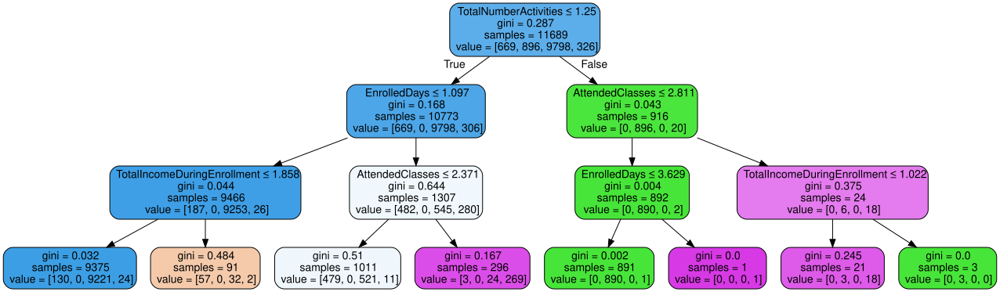

In [462]:
# Visualizing the decision tree
dot_data = export_graphviz(dtc, out_file=None, feature_names=X.columns.to_list(), filled=True, rounded=True, special_characters=True)
graph = graphviz.Source(dot_data)
graph